In [1]:
import numpy as np
import pandas as pd

import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Flatten, Dense, Dropout, Activation, Input, Bidirectional,SimpleRNN, Embedding, Conv1D, LSTM, MaxPooling1D, GlobalMaxPooling1D, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split


from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_selection import chi2
from IPython.display import display
from sklearn.model_selection import train_test_split



from nltk.stem import PorterStemmer
import re
import nltk
nltk.download('stopwords')
nltk.download('punkt')
from nltk.corpus import stopwords

import matplotlib.pyplot as plt
import seaborn as sns

#print(tf.__version__)


2024-06-20 16:12:50.246494: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/threadpoolctl.py:1214: RuntimeWarning: 
Found Intel OpenMP ('libiomp') and LLVM OpenMP ('libomp') loaded at
the same time. Both libraries are known to be incompatible and this
can cause random crashes or deadlocks on Linux when loaded in the
same Python program.
Using threadpoolctl may cause crashes or deadlocks. For more
information and possible workarounds, please see
    https://github.com/joblib/threadpoolctl/blob/master/multiple_openmp.md

  warnings.warn(msg, RuntimeWarning)
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/hsibitenda/nltk_data...
[nltk_data]   Packag

In [2]:
# from google.colab import drive
# drive.mount('/content/drive')

In [3]:
##df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/socialcons_clean2.csv')

# df = pd.read_csv('/home/hsibitenda/scratch/llamatopicsallwsp.csv')
# df = pd.read_csv('/home/hsibitenda/scratch/harriet/labeled_topicswsp.csv')
# df=df.astype(str)
# df = pd.read_csv('/home/hsibitenda/scratch/llamathemes.csv')
# df=df.astype(str)
# Optionally, you can save the updated dataset with predictions
# df=pd.read_csv('/home/hsibitenda/scratch/harriet/BERT-CTFIDF.csv')#, index=False
df=pd.read_csv('/home/hsibitenda/scratch/harriet/llama2_and_themes.csv')

# df2=df2.astype(str)
df=df.astype(str)

In [4]:
df.shape

(22036, 35)

In [5]:
# df.shape
df11=df.copy()
df11.shape

(22036, 35)

In [4]:
# df2.shape

In [ ]:
# Split the dataset into train and test sets (80% train, 20% test)
train_df, test_df = train_test_split(df2, test_size=0.2, random_state=42)
df2=train_df.copy()
df2.shape


In [ ]:
df21=df2[['Text_lemma2', 'Bertscore_Labels', 'Final_Labels', 'Predicted_Categories3']]
df21.columns

In [ ]:
df21.to_csv('/home/hsibitenda/scratch/harriet/themes_llama2_train.csv')

In [ ]:
df3=pd.read_csv('/home/hsibitenda/scratch/harriet/themes_llama2_train.csv')
df3=df3.astype(str)
df3.columns

In [ ]:
# df31=df3[['Text_lemma2','Bertscore_Labels', 'Extracted_Probabilities', 'Final_Labels', 'Predicted_Categories3']]
# df31.shape

In [ ]:
df=pd.concat([df11,df3], axis=1)

df.shape

In [ ]:
df.columns

In [ ]:
# df.to_csv('/home/hsibitenda/scratch/harriet/llama2_and_themes.csv')

In [ ]:
# df11=df[['Text_lemma','Predicted_Categories']]
df.groupby(['sourcetype'])['Text_lemma'].count()

In [ ]:
# new_df = pd.read_csv('/home/hsibitenda/scratch/harriet/llms/testdataset_with_predictionstheme.csv')#, index=False)
# new_df.columns

In [ ]:
from langchain import LLMChain
import openai
from langchain.chat_models import ChatOpenAI
from langchain.embeddings.openai import OpenAIEmbeddings
from langchain.prompts.chat import (
    ChatPromptTemplate,
    SystemMessagePromptTemplate,
    HumanMessagePromptTemplate,
)
import warnings
warnings.filterwarnings("ignore")
pd.set_option('display.max_rows',500)
pd.set_option('display.max_columns',300)

In [ ]:
import json

from autolabel import LabelingAgent, AutolabelDataset

In [ ]:
import os
import subprocess
import getpass
from huggingface_hub import notebook_login

# Define the path to the token file
token_file_path = "/home/hsibitenda/scratch/harriet/llms/huggingface_token.txt"  # Replace with the actual path

if os.path.exists(token_file_path):
    # If the token file exists, read the token from the file
    with open(token_file_path, "r") as file:
        token = file.read().strip()
else:
    # If the token file does not exist, prompt the user to enter the token securely
    print("Please enter your Hugging Face token:")
    token = getpass.getpass()

# Set up the environment variable with the token
os.environ["HUGGINGFACE_TOKEN"] = token

# Use transformers-cli to login
command = f'transformers-cli login --token {token}'
subprocess.run(command, shell=True)

In [7]:
from torch import cuda

model_id = 'meta-llama/Llama-2-7b-chat-hf'
device = f'cuda:{cuda.current_device()}' if cuda.is_available() else 'cpu'

#print(device)

In [8]:
# pip install bitsandbytes


In [9]:
from torch import bfloat16
import transformers

# set quantization configuration to load large model with less GPU memory
# this requires the `bitsandbytes` library

bnb_config = transformers.BitsAndBytesConfig(
    load_in_4bit=True,  # 4-bit quantization
    bnb_4bit_quant_type='nf4',  # Normalized float 4
    bnb_4bit_use_double_quant=True,  # Second quantization after the first
    bnb_4bit_compute_dtype=bfloat16  # Computation type
)

In [10]:
#pip install accelerate

In [ ]:
import transformers
import torch

# Llama 2 Tokenizer
tokenizer = transformers.AutoTokenizer.from_pretrained(model_id, max_length=128)

# Load Llama 2 Model
model = transformers.AutoModelForCausalLM.from_pretrained(
    model_id,
    trust_remote_code=True,
    quantization_config=None,  # No quantization config provided
)

# Convert model parameters to bfloat16
for param in model.parameters():
    param.data = param.data.to(torch.bfloat16)

# Set the model to evaluation mode
model.eval()


In [ ]:
# Our text generator
generator = transformers.pipeline(
    model=model, tokenizer=tokenizer,
    task='text-generation',
    temperature=0.1,
    max_new_tokens=500,
    repetition_penalty=1.1
)

In [15]:

# df.rename(columns={'Text_lemma_x':'Text_lemma'}, inplace=True)
df.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'textid', 'Date', 'Views', 'sourcetype',
       'alltext', 'Text_emt', 'Text_emj', 'Text_langue', 'Text_translate',
       'Text_langue2', 'Text_lower', 'Text_punct', 'Text_tags', 'Text_chat',
       'Text_spell', 'Text_langue3', 'Text_translate2', 'Text_token',
       'Text_stop', 'Text_stem', 'Text_lemma', 'llama2_labelone',
       'cluster_labelone', 'llama2_labelone10', 'cluster_labelone10',
       'Text_lemma2', 'Predicted_Categories', 'Predicted_Categories2',
       'Similarity_Score', 'Keysector', 'Bertscore_Labels', 'Keysector_bert'],
      dtype='object')

In [17]:
# df=df211.copy()

In [18]:
df.shape

(22036, 30)

In [19]:
from sentence_transformers import SentenceTransformer

# Pre-calculate embeddings
embedding_model = SentenceTransformer("BAAI/bge-small-en")
embeddings = embedding_model.encode(df['Text_translate2'], show_progress_bar=True)
# embeddings = embedding_model.encode(df['Document'], show_progr>ess_bar=True)

2024-05-20 09:03:47 sentence_transformers.SentenceTransformer INFO: Load pretrained SentenceTransformer: BAAI/bge-small-en
2024-05-20 09:03:47 sentence_transformers.SentenceTransformer INFO: Use pytorch device_name: cuda


Batches:   0%|          | 0/861 [00:00<?, ?it/s]

In [22]:
# df21.shape

In [24]:
df['Bertscore_Labels'].iloc[0]

'education|poverty|hunger|security|health|employment'

In [25]:
df.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'textid', 'Date', 'Views', 'sourcetype',
       'alltext', 'Text_emt', 'Text_emj', 'Text_langue', 'Text_translate',
       'Text_langue2', 'Text_lower', 'Text_punct', 'Text_tags', 'Text_chat',
       'Text_spell', 'Text_langue3', 'Text_translate2', 'Text_token',
       'Text_stop', 'Text_stem', 'Text_lemma', 'llama2_labelone',
       'cluster_labelone', 'llama2_labelone10', 'cluster_labelone10',
       'Text_lemma2', 'Predicted_Categories', 'Predicted_Categories2',
       'Similarity_Score', 'Keysector', 'Bertscore_Labels', 'Keysector_bert'],
      dtype='object')

In [26]:
import pandas as pd
from transformers import AutoTokenizer, AutoModelForCausalLM
import torch
import numpy as np
from peft import PeftModel
from transformers import LlamaForCausalLM, LlamaTokenizer, GenerationConfig
# Load the llama2 model and tokenizer for classification
model_name = "meta-llama/Llama-2-7b-chat-hf"


In [27]:
# !pip install -q git+https://github.com/huggingface/peft.git
# !pip install -q loralib

In [28]:

tokenizer = LlamaTokenizer.from_pretrained("meta-llama/Llama-2-7b-chat-hf")
tokenizer = AutoTokenizer.from_pretrained(model_name)
tokenizer.add_special_tokens({'pad_token': '[PAD]'})  # Add a padding token

model = LlamaForCausalLM.from_pretrained("meta-llama/Llama-2-7b-chat-hf")

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

In [29]:

def generate_prompt(instruction, categories, text):
    category_string = ', '.join(categories)
    return f"""Below is an instruction describing a task, paired with the provided text and categories. Write a response that adequately completes the prompt.

### Instructions:
{instruction}

### Categories:
{category_string}

### Input:
{text}

### Response:"""


In [30]:
from pprint import pprint

In [31]:
generation_config = GenerationConfig(
    temperature=0.1,
    top_p=0.75,
    num_beams=4,
)


In [39]:
# df2=df.head(10)

In [18]:
# df=df2.copy()
import pandas as pd
import torch
from transformers import GenerationConfig, AutoTokenizer, AutoModelForCausalLM
import spacy
from spacy.matcher import Matcher

# Load spaCy model
nlp = spacy.load('en_core_web_sm')

In [41]:
import pandas as pd
import torch
from transformers import GenerationConfig, AutoTokenizer, AutoModelForCausalLM
import spacy
from spacy.matcher import Matcher

# Load spaCy model
nlp = spacy.load('en_core_web_sm')

# Load your model and tokenizer
model_name = 'meta-llama/Llama-2-7b-chat-hf'
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForCausalLM.from_pretrained(model_name)

# Set the padding token
tokenizer.pad_token = tokenizer.eos_token

# Define the categories
categories = ["employment", "poverty", "hunger", "education", "security", "health"]

# Generation configuration
generation_config = GenerationConfig(
    temperature=0.1,
    top_p=0.75,
    num_beams=4,
)

# Function to generate prompt
def generate_prompt(instruction, text=None):
    if text:
        return f"""{instruction}

### Text:
{text}

### Response:
"""
    else:
        return f"""{instruction}

### Response:
"""

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Move model to device
model.to(device)
model.eval()

# Function to evaluate and extract labels
def evaluate(df, index, categories):
    instruction = (
        f"You are an expert in social analysis classification that impacts sustainable development.\n"
        f"Your job is to correctly label the provided input example into the following categories if their probability is 80% and above: {', '.join(categories)}.\n"
        f"Only return the categories and their probabilities in the format 'Category: Probability%' or 'Category Probability: Probability%'."
    )
    
    text = df['Text_translate2'][index]
    prompt = generate_prompt(instruction, text=text)
    
    inputs = tokenizer(prompt, return_tensors="pt", padding=True, truncation=True, max_length=128)
    input_ids = inputs["input_ids"].to(device)  # Ensure input_ids are on the same device
    
    with torch.no_grad():
        generation_output = model.generate(
            input_ids=input_ids,
            max_new_tokens=1000,
            num_beams=generation_config.num_beams,
            temperature=generation_config.temperature,
            top_p=generation_config.top_p
        )
    
    output = tokenizer.decode(generation_output[0], skip_special_tokens=True).strip()
    
    return output

# Function to extract categories and probabilities using spaCy
def extract_categories_probabilities(response_text):
    categories_probabilities = {}
    doc = nlp(response_text)
    matcher = Matcher(nlp.vocab)

    # Pattern to find categories followed by probabilities in the format 'Category: Probability%' or 'Category Probability: Probability%'
    pattern = [
        {"IS_ALPHA": True, "OP": "+"},  # Category name (one or more alphabetic tokens)
        {"IS_PUNCT": True, "OP": "?"},  # Optional punctuation
        {"TEXT": {"REGEX": "[: ]"}, "OP": "+"},  # Colon or space as separator
        {"LIKE_NUM": True},             # Probability (numeric)
        {"TEXT": "%", "OP": "?"}        # Optional percentage sign
    ]

    matcher.add("CategoryProbability", [pattern])
    matches = matcher(doc)

    for match_id, start, end in matches:
        span = doc[start:end]
        text = span.text
        parts = text.rsplit(":", 1)  # Split the text by the last colon
        if len(parts) == 2:
            category = parts[0].strip()
            probability_str = parts[1].strip().strip('%')
            try:
                probability = float(probability_str) / 100.0
                categories_probabilities[category] = probability
            except ValueError:
                continue

    # Filter out only the defined categories
    filtered_categories_probabilities = {cat: prob for cat, prob in categories_probabilities.items() if cat.lower() in categories}

    return filtered_categories_probabilities

# Function to filter categories with probabilities above 0.8 and assign "others" if none
def filter_high_probability_labels(probabilities_dict):
    high_prob_labels = [category for category, prob in probabilities_dict.items() if prob >= 0.8]
    return high_prob_labels if high_prob_labels else ["others"]

# # Example DataFrame (replace with actual data loading code)
# data = {
#     'Text_translate': [
#         "Example text 1 about employment and education.",
#         "Example text 2 about poverty and hunger.",
#         "Example text 3 about security and health.",
#         # Add more examples as needed
#     ]
# }
# df = pd.DataFrame(data)

# Apply evaluate function to dataframe and create new column 'Model_Output'
df['Model_Output'] = df.index.map(lambda idx: evaluate(df, idx, categories))

# Apply spaCy extraction function to the model output and create a new column 'Extracted_Probabilities'
df['Extracted_Probabilities'] = df['Model_Output'].apply(extract_categories_probabilities)

# Apply filter_high_probability_labels to create the 'Final_Labels' column
df['Final_Labels'] = df['Extracted_Probabilities'].apply(filter_high_probability_labels)

# Sample output
print(df[['Text_translate', 'Model_Output', 'Extracted_Probabilities', 'Final_Labels']])


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

                                          Text_translate  \
0      This weekâ€trade_marks 3 #WCEF2022 side events...   
1        ap 6th class social studies fa3 original pap...   
2      Blinken is actually on a social vist to B. Hus...   
3        Social media has improved human communicatio...   
4      South Africa_x000D_\nMexico_x000D_\nand the gu...   
...                                                  ...   
27540  @sejudav Problems of Africa are more complex b...   
27541    The Ocean Cleanup begins cleaning the Great ...   
27542  Thinking especially about researchers working ...   
27543  @KittyArtPhysics In 2016 I got intoduced to Ra...   
27544    What Did Trevor Learn from The Daily Show? |...   

                                            Model_Output  \
0      You are an expert in social analysis classific...   
1      You are an expert in social analysis classific...   
2      You are an expert in social analysis classific...   
3      You are an expert in social anal

In [7]:
# df2=df2.astype(str)
# df2.columns

In [5]:
# # Define the categories
# categories = ["employment", "poverty", "hunger", "education", "security", "health"]
# # Function to extract categories and probabilities using spaCy
# def extract_categories_probabilities(response_text):
#     categories_probabilities = {}
#     doc = nlp(response_text)
#     matcher = Matcher(nlp.vocab)

#     # Pattern to find categories followed by probabilities in the format 'Category: Probability%' or 'Category Probability: Probability%'
#     pattern = [
#         {"IS_ALPHA": True, "OP": "+"},  # Category name (one or more alphabetic tokens)
#         {"IS_PUNCT": True, "OP": "?"},  # Optional punctuation
#         {"TEXT": {"REGEX": "[: ]"}, "OP": "+"},  # Colon or space as separator
#         {"LIKE_NUM": True},             # Probability (numeric)
#         {"TEXT": "%", "OP": "?"}        # Optional percentage sign
#     ]

#     matcher.add("CategoryProbability", [pattern])
#     matches = matcher(doc)

#     for match_id, start, end in matches:
#         span = doc[start:end]
#         text = span.text
#         parts = text.rsplit(":", 1)  # Split the text by the last colon
#         if len(parts) == 2:
#             category = parts[0].strip()
#             probability_str = parts[1].strip().strip('%')
#             try:
#                 probability = float(probability_str) / 100.0
#                 categories_probabilities[category] = probability
#             except ValueError:
#                 continue

#     # Filter out only the defined categories
#     filtered_categories_probabilities = {cat: prob for cat, prob in categories_probabilities.items() if cat.lower() in categories}

#     return filtered_categories_probabilities

# # Function to filter categories with probabilities above 0.8 and assign "others" if none
# def filter_high_probability_labels(probabilities_dict):
#     high_prob_labels = [category for category, prob in probabilities_dict.items() if prob >= 0.5]
#     return high_prob_labels if high_prob_labels else ["others"]

# # # Example DataFrame (replace with actual data loading code)
# # data = {
# #     'Text_translate': [
# #         "Example text 1 about employment and education.",
# #         "Example text 2 about poverty and hunger.",
# #         "Example text 3 about security and health.",
# #         # Add more examples as needed
# #     ]
# # }
# # df = pd.DataFrame(data)

# # Apply evaluate function to dataframe and create new column 'Model_Output'
# # df2['Model_Output'] = df2.index.map(lambda idx: evaluate(df2, idx, categories))

# # Apply spaCy extraction function to the model output and create a new column 'Extracted_Probabilities'
# df2['Extracted_Probabilities'] = df2['Model_Output'].apply(extract_categories_probabilities)

# # Apply filter_high_probability_labels to create the 'Final_Labels' column
# df2['Final_Labels'] = df2['Extracted_Probabilities'].apply(filter_high_probability_labels)

# # Sample output
# # Display the DataFrame
# print(df2[['Extracted_Probabilities', 'Final_Labels']])


In [6]:
df['Final_Labels'].unique

<bound method Series.unique of 0                                               ['others']
1                                    ['Poverty', 'Health']
2                              ['Employment', 'Education']
3                                ['Employment', 'Poverty']
4                                               ['others']
                               ...                        
22031                                           ['others']
22032                                ['Poverty', 'Health']
22033    ['Employment', 'Poverty', 'Education', 'Securi...
22034                                ['Poverty', 'Health']
22035                                           ['others']
Name: Final_Labels, Length: 22036, dtype: object>

In [10]:
df['Final_Labels'].iloc[0]

"['others']"

In [11]:
# df['Model_Output'].iloc[0]

In [44]:
df['Extracted_Probabilities'].head(50)#.apply(lambda x:len(x[0]))

0     {'Employment': 0.3, 'Poverty': 0.4, 'Hunger': ...
1                                                    {}
2                                                    {}
3     {'Employment': 0.0, 'Poverty': 0.0, 'Hunger': ...
4     {'Employment': 0.6, 'Poverty': 0.4, 'Hunger': ...
5     {'Employment': 0.0, 'Poverty': 0.0, 'Hunger': ...
6     {'Employment': 0.6, 'Poverty': 0.8, 'Hunger': ...
7     {'Employment': 0.7, 'Poverty': 0.85, 'Hunger':...
8     {'Employment': 0.6, 'Poverty': 0.8, 'Hunger': ...
9     {'Employment': 0.6, 'Poverty': 0.4, 'Hunger': ...
10    {'Employment': 0.2, 'Poverty': 0.4, 'Hunger': ...
11    {'Employment': 0.6, 'Poverty': 0.4, 'Hunger': ...
12    {'Employment': 0.9, 'Poverty': 0.8, 'Hunger': ...
13    {'Employment': 0.2, 'Poverty': 0.3, 'Hunger': ...
14    {'Employment': 0.6, 'Poverty': 0.2, 'Hunger': ...
15    {'Employment': 0.6, 'Poverty': 0.8, 'Hunger': ...
16    {'Employment': 0.8, 'Poverty': 0.6, 'Hunger': ...
17    {'Employment': 0.8, 'Poverty': 0.2, 'Hunge

In [45]:
df['Final_Labels'].head(50)

0                                              [others]
1                                              [others]
2                                              [others]
3                                           [Education]
4                                              [others]
5                                              [others]
6                                             [Poverty]
7                          [Poverty, Education, Health]
8                                             [Poverty]
9                                           [Education]
10                                             [others]
11                                             [others]
12    [Employment, Poverty, Education, Security, Hea...
13                                             [others]
14                                             [others]
15                                    [Poverty, Health]
16                              [Employment, Education]
17                      [Employment, Education, 

In [46]:
df['Extracted_Probabilities']

0        {'Employment': 0.3, 'Poverty': 0.4, 'Hunger': ...
1                                                       {}
2                                                       {}
3        {'Employment': 0.0, 'Poverty': 0.0, 'Hunger': ...
4        {'Employment': 0.6, 'Poverty': 0.4, 'Hunger': ...
                               ...                        
27540    {'Employment': 0.7, 'Poverty': 0.85, 'Hunger':...
27541    {'Employment': 0.2, 'Poverty': 0.3, 'Hunger': ...
27542    {'Employment': 0.7, 'Poverty': 0.85, 'Hunger':...
27543    {'Employment': 0.2, 'Poverty': 0.8, 'Hunger': ...
27544    {'Employment': 0.8, 'Poverty': 0.2, 'Hunger': ...
Name: Extracted_Probabilities, Length: 27545, dtype: object

In [47]:
df['Extracted_Probabilities']

0        {'Employment': 0.3, 'Poverty': 0.4, 'Hunger': ...
1                                                       {}
2                                                       {}
3        {'Employment': 0.0, 'Poverty': 0.0, 'Hunger': ...
4        {'Employment': 0.6, 'Poverty': 0.4, 'Hunger': ...
                               ...                        
27540    {'Employment': 0.7, 'Poverty': 0.85, 'Hunger':...
27541    {'Employment': 0.2, 'Poverty': 0.3, 'Hunger': ...
27542    {'Employment': 0.7, 'Poverty': 0.85, 'Hunger':...
27543    {'Employment': 0.2, 'Poverty': 0.8, 'Hunger': ...
27544    {'Employment': 0.8, 'Poverty': 0.2, 'Hunger': ...
Name: Extracted_Probabilities, Length: 27545, dtype: object

In [48]:
df.shape

(27545, 37)

In [49]:
# df.to_csv('/home/hsibitenda/scratch/harriet/themes_llama2.csv')

In [52]:
df.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'textid', 'Date', 'Views', 'sourcetype',
       'alltext', 'Text_emt', 'Text_emj', 'Text_langue', 'Text_translate',
       'Text_langue2', 'Text_lower', 'Text_punct', 'Text_tags', 'Text_chat',
       'Text_spell', 'Text_langue3', 'Text_translate2', 'Text_token',
       'Text_stop', 'Text_stem', 'Text_lemma', 'llama2_labelone',
       'cluster_labelone', 'llama2_labelone10', 'cluster_labelone10',
       'Text_lemma2', 'Predicted_Categories', 'Predicted_Categories2',
       'Similarity_Score', 'Keysector', 'Bertscore_Labels', 'Keysector_bert',
       'Model_Output', 'Extracted_Probabilities', 'Final_Labels'],
      dtype='object')

In [ ]:
# df2=pd.read_csv('/home/hsibitenda/scratch/harriet/themes_llama2.csv')
# df2=df.astype(str)

In [5]:
df.shape

(27545, 38)

In [99]:
# df2.columns

Index(['Unnamed: 0.2', 'Unnamed: 0', 'textid', 'Date', 'Views', 'sourcetype',
       'alltext', 'Text_emt', 'Text_emj', 'Text_langue', 'Text_translate',
       'Text_langue2', 'Text_lower', 'Text_punct', 'Text_tags', 'Text_chat',
       'Text_spell', 'Text_langue3', 'Text_translate2', 'Text_token',
       'Text_stop', 'Text_stem', 'Text_lemma', 'berttopic2', 'cluster_id2',
       'llama2_labelone10', 'cluster_labelone10', 'cluster_id',
       'llama2_labelone', 'cluster_labelone', 'Unnamed: 0.1', 'Text_lemma2',
       'Bertscore_Labels', 'Final_Labels', 'Predicted_Categories3'],
      dtype='object')

In [23]:
df['Text_translate'].iloc[4]

'South Africa_x000D_\nMexico_x000D_\nand the gurl who answered social media question_x000D_\n_x000D_\n#MissUniverse2019  '

In [26]:
df['Bertscore_Labels'].iloc[4]

'education|poverty|hunger|security|health|employment'

In [46]:
df3=df.copy()
df.shape

(27545, 35)

In [3]:
# Create a dataframe with document metadata
#dfberttopics = topic_model.get_document_info(documents)
# df.to_csv('../llamathemes_new2.csv')
# dfberttopics.head()
# df2 = pd.read_csv('/home/hsibitenda/scratch/harriet/llms/llamatopicsall.csv')
df2= pd.read_csv('/home/hsibitenda/scratch/harriet/themes_llama2.csv')
df2.columns

Index(['Unnamed: 0.2', 'Unnamed: 0.1', 'Unnamed: 0', 'textid', 'Date', 'Views',
       'sourcetype', 'alltext', 'Text_emt', 'Text_emj', 'Text_langue',
       'Text_translate', 'Text_langue2', 'Text_lower', 'Text_punct',
       'Text_tags', 'Text_chat', 'Text_spell', 'Text_langue3',
       'Text_translate2', 'Text_token', 'Text_stop', 'Text_stem', 'Text_lemma',
       'llama2_labelone', 'cluster_labelone', 'llama2_labelone10',
       'cluster_labelone10', 'Text_lemma2', 'Predicted_Categories',
       'Predicted_Categories2', 'Similarity_Score', 'Keysector',
       'Bertscore_Labels', 'Keysector_bert', 'Model_Output',
       'Extracted_Probabilities', 'Final_Labels'],
      dtype='object')

In [79]:
import pandas as pd

# Assuming df2 is your original DataFrame
# df = df2.copy()

# Function to process each row
def process_labels(row):
    # If the value is a list, join the elements with '|', otherwise return the original value
    if isinstance(row, list):
        return '|'.join(row).lower()
    elif isinstance(row, str):
        # If the value is a string, remove the quotes and replace commas with '|'
        return row.strip("'").replace("', '", '|').lower()
    else:
        return row

# Apply the function to the column
df['Predicted_Categories3'] = df['Final_Labels'].apply(process_labels)

# Remove any remaining quotes
df['Predicted_Categories3'] = df['Predicted_Categories3'].str.replace("'", '')
# If there are still square brackets present, remove them
df['Predicted_Categories3'] = df['Predicted_Categories3'].str.strip('[]')

# Print the updated DataFrame
print(df['Predicted_Categories3'])


0                                         education|health
1                                                   others
2                                                   others
3                                education|security|health
4                                      employment|security
                               ...                        
27540    employment|poverty|hunger|education|security|h...
27541                                               others
27542    employment|poverty|hunger|education|security|h...
27543                                    poverty|education
27544                          employment|education|health
Name: Predicted_Categories3, Length: 27545, dtype: object


In [12]:
df['Predicted_Categories3']

0                                              others
1                                      poverty|health
2                                employment|education
3                                  employment|poverty
4                                              others
                             ...                     
22031                                          others
22032                                  poverty|health
22033    employment|poverty|education|security|health
22034                                  poverty|health
22035                                          others
Name: Predicted_Categories3, Length: 22036, dtype: object

In [13]:
df['Bertscore_Labels']

0                                                   others
1                                                   others
2                                                   others
3                                                   others
4                                                   others
                               ...                        
22031                                               others
22032                                            education
22033                                               others
22034    education|poverty|hunger|security|health|emplo...
22035                                               others
Name: Bertscore_Labels, Length: 22036, dtype: object

In [5]:
df.columns

Index(['Unnamed: 0.2', 'Unnamed: 0.1', 'Unnamed: 0', 'textid', 'Date', 'Views',
       'sourcetype', 'alltext', 'Text_emt', 'Text_emj', 'Text_langue',
       'Text_translate', 'Text_langue2', 'Text_lower', 'Text_punct',
       'Text_tags', 'Text_chat', 'Text_spell', 'Text_langue3',
       'Text_translate2', 'Text_token', 'Text_stop', 'Text_stem', 'Text_lemma',
       'llama2_labelone', 'cluster_labelone', 'llama2_labelone10',
       'cluster_labelone10', 'Text_lemma2', 'Predicted_Categories',
       'Predicted_Categories2', 'Similarity_Score', 'Keysector',
       'Bertscore_Labels', 'Keysector_bert', 'Model_Output',
       'Extracted_Probabilities', 'Final_Labels', 'Predicted_Categories3'],
      dtype='object')

In [25]:
import pandas as pd

# Define categories
categories = ["poverty", "hunger", "education", "security", "health", "employment"]

# Load your DataFrame df

# Function to check if any category label exists in both columns
def check_agreement(row):
    predicted_categories = row['Predicted_Categories3']
    bertscore_labels = row['Bertscore_Labels']
    agreement_count = 0
    disagreement_count = 0
    total_count = 0
    
    # Check if both columns have the value 'others'
    if predicted_categories.lower() == 'others' and bertscore_labels.lower() == 'others':
        agreement_count = 1  # Set agreement to 100% if both are 'others'
        total_count = 1
    else:
        # Check if the category exists in both columns
        for category in categories:
            if category.lower() in predicted_categories.lower() and category.lower() in bertscore_labels.lower():
                agreement_count += 1
            else:
                disagreement_count += 1
            total_count += 1
    
    # Handle division by zero
    if total_count == 0:
        agreement_percentage = 0
        disagreement_percentage = 0
    else:
        agreement_percentage = (agreement_count / total_count) * 100
        disagreement_percentage = (disagreement_count / total_count) * 100
    
    return agreement_percentage, disagreement_percentage

# Apply the function to each row and create new columns for agreement and disagreement percentages
df['Agreement_Percentage'], df['Disagreement_Percentage'] = zip(*df.apply(check_agreement, axis=1))

# Display the DataFrame
# df


In [7]:
# Calculate the average agreement and disagreement percentages
average_agreement = df['Agreement_Percentage'].mean()
average_disagreement = df['Disagreement_Percentage'].mean()

print("Average Agreement Percentage:", average_agreement)
print("Average Disagreement Percentage:", average_disagreement)

Average Agreement Percentage: 43.782295637441756
Average Disagreement Percentage: 56.217704362558244


In [126]:
# df.head(500)

In [55]:
df

,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,textid,Date,Views,sourcetype,alltext,Text_emt,Text_emj,Text_langue,Text_translate,Text_langue2,Text_lower,Text_punct,Text_tags,Text_chat,Text_spell,Text_langue3,Text_translate2,Text_token,Text_stop,Text_stem,Text_lemma,llama2_labelone,cluster_labelone,llama2_labelone10,cluster_labelone10,Text_lemma2,Predicted_Categories,Predicted_Categories2,Similarity_Score,Keysector,Bertscore_Labels,Keysector_bert,Model_Output,Extracted_Probabilities,Final_Labels,Predicted_Categories3,Agreement_Percentage,Disagreement_Percentage
0,0,0,0,7969,2022-10-24 07:28:48+00:00,11,twitter,This weekâ€™s 3 #WCEF2022 side events:\n\nðŸŸ¡...,This weekâ€™s 3 #WCEF2022 side events:\n\nðŸŸ¡...,This weekâ€trade_marks 3 #WCEF2022 side events...,en,This weekâ€trade_marks 3 #WCEF2022 side events...,en,this weekâ€trade_marks 3 #wcef2022 side events...,this weektrademarks side events oct today...,this weektrademarks side events oct today...,this weektrademarks side events oct todayconfu...,this weektrademarks side events oct todayconfu...,en,this weektrademarks side events oct todayconfu...,"['this', 'weektrademarks', 'side', 'events', '...",weektrademarks side events oct todayconfusion ...,weektrademark side event oct todayconfus wast ...,weektrademarks side event oct todayconfusion w...,Reactions,reactionsk__reaction__problem__reactionsm__cha...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,weektrademarks side event oct todayconfusion w...,hunger|education|health,hunger,0.0,others,education|poverty|hunger|security|health|emplo...,others,You are an expert in social analysis classific...,"{'Employment': 0.3, 'Poverty': 0.4, 'Hunger': ...",['others'],others,0.000000,100.000000
1,1,1,1,22722,2023-08-20,529,youtube,ap 6th class social studies fa3 original pap...,ap 6th class social studies fa3 original pap...,ap 6th class social studies fa3 original pap...,en,ap 6th class social studies fa3 original pap...,en,ap 6th class social studies fa3 original pap...,ap th class social studies fa original paper l...,ap th class social studies fa original paper l...,ap th class social studies fa original paper l...,ap th class social studies fa original paper l...,en,ap th class social studies fa original paper l...,"['ap', 'th', 'class', 'social', 'studies', 'fa...",ap th class social studies fa original paper l...,ap th class social studi fa origin paper leak ...,ap th class study fa original paper leaked fa ...,Reactions,reactionsk__reaction__problem__reactionsm__cha...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,problem lecture race ethnicity jeremy baker mo...,poverty|education|health,education,0.0,others,others,others,You are an expert in social analysis classific...,{},['others'],others,100.000000,0.000000
2,2,2,2,4717,2021-11-17 16:39:01+00:00,2,twitter,Blinken is actually on a social vist to B. Hus...,Blinken is actually on a social vist to B. Hus...,Blinken is actually on a social vist to B. Hus...,en,Blinken is actually on a social vist to B. Hus...,en,blinken is actually on a social vist to b. hus...,blinken is actually on a social vist to b huss...,blinken is actually on a social vist to b huss...,blinken is actually on a social vist to b huss...,blinken is actually on a social vist to b huss...,en,blinken is actually on a social vist to b huss...,"['blinken', 'is', 'actually', 'on', 'a', 'soci...",blinken actually social vist b hussein obama k...,blinken actual social vist b hussein obama ken...,blinken actually vist b hussein obama kenyan b...,Reactions,reactionsk__reaction__problem__reactionsm__cha...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,th class fa study question paper r viewsth cla...,poverty|hunger|health,health,0.0,others,others,others,You are an expert in social analysis classific...,{},['others'],others,100.000000,0.000000
3,3,3,3,16088,2022-08-24,92,youtube,Social media has improved human communicatio...,Social media has improved human communicatio...,Social media has

In [57]:
# df3=df.copy()
# df=df3.head(50)

import pandas as pd
import torch
from bert_score import score

# Define your search list containing the keywords for similarity
search_words = ['education', 'poverty', 'hunger', 'security', 'health', 'employment']
threshold = 0.8

def calculate_bert_score(text):
    labels = []
    for keyword in search_words:
        cand = text[:128]  # Candidate text
        ref = keyword  # Reference text (search keyword)
        _, _, F1 = score([cand], [ref], lang="en", device=device, verbose=False)  # Calculate BERTScore
        score_value = F1.item()  # Extract F1 score from Tensor and convert to float
        if score_value > threshold:
            labels.append(keyword)
    if labels:
        return '|'.join(labels)
    else:
        return 'others'
# Define device
device = torch.device("cpu")

# Apply the function to each text in the 'Text_translate2' column
# df['Bertscore_Labels'] = df['Text_translate2'].apply(lambda x: calculate_bert_score(x, search_words))
df28=pd.read_csv('/home/hsibitenda/scratch/harriet/batchsim_28.csv')
# df6.to_csv('/home/hsibitenda/scratch/harriet/batch_62.csv')
df28=df28.astype(str)
df28['Bertscore_Labels'] = df28['Text_translate2'].apply(calculate_bert_score)

# Display the DataFrame with the new 'Labels' column
# print(df)
# df4
df28.to_csv('/home/hsibitenda/scratch/harriet/batchsim_282.csv')

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.weight', 'roberta.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.weight', 'roberta.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.weight', 'roberta.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['ro

In [14]:
# dfs = [df1, df2, df3, df4, df5, df6, df7, df8, df9, df10, df11, df12, df13, df14, df15, df16, df17, df18, df19, df20, df21, df22, df23, df24, df25, df26, df27, df28]
# dfnew = pd.concat([df.dropna() for df in dfs], axis=0)
# dfnew.reset_index(drop=True, inplace=True)
# dfnew.drop(columns=['Unnamed: 0.1'], inplace=True)
# dfnew.shape


In [71]:
# dfnew.to_csv('/home/hsibitenda/scratch/harriet/themes_allnew.csv')

In [72]:
df=dfnew.copy()

In [28]:
# df.to_csv('/home/hsibitenda/scratch/harriet/themes_allnew21.csv')

In [15]:
df['Final_Labels'].iloc[3]

"['Employment', 'Poverty']"

In [26]:
# df=df2.copy()
# df=df2.head(100)

In [16]:
# Import necessary libraries
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.multioutput import MultiOutputClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import classification_report, hamming_loss
from sklearn.model_selection import cross_val_score, RepeatedStratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn import preprocessing
import xgboost
# import umap
import joblib
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import warnings

In [17]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
import umap
from sentence_transformers import SentenceTransformer


# Pre-calculate embeddings
embedding_model = SentenceTransformer("BAAI/bge-small-en")
embeddings = embedding_model.encode(df['Text_translate2'], show_progress_bar=True)

# Embedding and preprocessing
X_embedded = umap.UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine', random_state=42).fit_transform(embeddings)
x = preprocessing.scale(X_embedded)


Batches:   0%|          | 0/689 [00:00<?, ?it/s]

/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/preprocessing/_data.py:261: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn(
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/preprocessing/_data.py:280: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn(


In [18]:
import ast

df['Predicted_Categories3']

0                                              others
1                                      poverty|health
2                                employment|education
3                                  employment|poverty
4                                              others
                             ...                     
22031                                          others
22032                                  poverty|health
22033    employment|poverty|education|security|health
22034                                  poverty|health
22035                                          others
Name: Predicted_Categories3, Length: 22036, dtype: object

In [19]:

# Embedding and preprocessing
# X_embedded = umap.UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine', random_state=42).fit_transform(embeddings)
# x = preprocessing.scale(X_embedded)
# Split the categories and convert them into lists
df['Predicted_Categories3'] = df['Predicted_Categories3'].apply(lambda x: x.split('|'))
df['Predicted_Categories3']


0                                                 [others]
1                                        [poverty, health]
2                                  [employment, education]
3                                    [employment, poverty]
4                                                 [others]
                               ...                        
22031                                             [others]
22032                                    [poverty, health]
22033    [employment, poverty, education, security, hea...
22034                                    [poverty, health]
22035                                             [others]
Name: Predicted_Categories3, Length: 22036, dtype: object

In [20]:
from sklearn import model_selection 
y = df['Predicted_Categories3']#.apply(lambda x: x.split('|'))
# Split data into train and test sets
# x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=17)

# Scaling X_embedded
X_embedded = preprocessing.scale(X_embedded)

# Defining target variable
# y = df[['llama2_labelone']].values

# Splitting the data
x_train, x_test, y_train, y_test = model_selection.train_test_split(X_embedded, y, test_size=0.2, random_state=42)#, stratify=y)

# Apply UMAP only on the training data
umap_transformer = umap.UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine', random_state=42)
x_train = umap_transformer.fit_transform(x_train)

# Transform the test data using the fitted UMAP transformer
x_test = umap_transformer.transform(x_test)
# Convert x_test to CSR format if needed
# x_test = csr_matrix(x_test)
# Convert x_test to dense format if needed
x_test = x_test.toarray() if hasattr(x_test, 'toarray') else x_test




/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/preprocessing/_data.py:261: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn(
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/preprocessing/_data.py:280: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn(
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/scipy/sparse/_index.py:146: SparseEfficien

In [21]:
# x_test

In [22]:

plt.rc('axes', titlesize=18)
plt.rc('axes', labelsize=15)
plt.rc('xtick', labelsize=13)
plt.rc('ytick', labelsize=13)
plt.rc('figure', titlesize=35)
plt.rc('legend', fontsize=12)

In [23]:

avg_accuracies={}
accuracies={}
roc_auc={}
pr_auc={}

In [24]:

def cal_score(name,model,folds):
    scores = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']
    avg_result=[]
    for sc in scores:
        scores = cross_val_score(model, x, y, cv = folds, scoring = sc)
        avg_result.append(np.average(scores))
    df_avg_score=pd.DataFrame(avg_result)
    df_avg_score= df_avg_score.rename(index={0: 'Accuracy', 1:'Precision', 2:'Recall',3:'F1 score',4:'Roc auc'},columns={0:'Average'})
    avg_accuracies[name]=np.round(df_avg_score.loc['Accuracy']*100,3)
    values=[np.round(df_avg_score.loc['Accuracy']*100,3),np.round(df_avg_score.loc['Precision']*100,3),np.round(df_avg_score.loc['Recall']*100,3),np.round(df_avg_score.loc['F1 score']*100,3),np.round(df_avg_score.loc['Roc auc']*100,3)]
    plt.figure(figsize=(15,8))
    sns.set_palette('mako')
    ax=sns.barplot(x=['Accuracy','Precision','Recall','F1 score','Roc auc'],y=values)
    plt.yticks(np.arange(0,100,10))
    plt.ylabel('Percentage %',labelpad=10)
    plt.xlabel('Scoring Parameters',labelpad=10)
    plt.title('Cross Validation '+str(folds)+'-Folds Average Scores',pad=20)
    for p in ax.patches:
        ax.annotate(str(p.get_height()), (p.get_x(), p.get_height()),xytext=(p.get_x()+0.3,p.get_height()+1.02))
    plt.show()

In [25]:

def conf_matrix(ytest,pred):
    plt.figure(figsize=(9,6))
    global cm1
    cm1 = confusion_matrix(ytest, pred)
    ax=sns.heatmap(cm1, annot= True, cmap='Blues')
    plt.title('Confusion Matrix',pad=20)

In [26]:

def metrics_score(cm):
    total=sum(sum(cm))
    accuracy=(cm[0,0]+cm[1,1])/total
    precision = cm[1,1]/(cm[0,1]+cm[1,1])
    sensitivity = cm[1,1]/(cm[1,0]+cm[1,1])
    f1 = 2 * (precision * sensitivity) / (precision + sensitivity)
    specificity = cm[0,0]/(cm[0,1]+cm[0,0])
    values=[np.round(accuracy*100,3),np.round(precision*100,3),np.round(sensitivity*100,3),np.round(f1*100,3),np.round(specificity*100,3)]
    plt.figure(figsize=(15,8))
    sns.set_palette('magma')
    ax=sns.barplot(x=['Accuracy','Precision','Recall','F1 score','Specificity'],y=values)
    plt.yticks(np.arange(0,100,10))
    plt.ylabel('Percentage %',labelpad=10)
    plt.xlabel('Scoring Parameter',labelpad=10)
    plt.title('Metrics Scores',pad=20)
    for p in ax.patches:
        ax.annotate(str(p.get_height()), (p.get_x(), p.get_height()),xytext=(p.get_x()+0.3,p.get_height()+1.02))
    plt.show()

In [27]:

def plot_roc_curve(fpr, tpr):
    plt.figure(figsize=(8,6))
    plt.plot(fpr, tpr, color='Orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='black', linestyle='--')
    plt.ylabel('True Positive Rate',labelpad=10)
    plt.xlabel('False Positive Rate',labelpad=10)
    plt.title('Receiver Operating Characteristic (ROC) Curve',pad=20)
    plt.legend()
    plt.show()

In [28]:

def plot_precision_recall_curve(recall, precision):
    plt.figure(figsize=(8,6))
    plt.plot(recall, precision, color='orange', label='PRC')
    plt.ylabel('Precision',labelpad=10)
    plt.xlabel('Recall',labelpad=10)
    plt.title('Precision Recall Curve',pad=20)
    plt.legend()
    plt.show()

In [29]:

# evaluate a given model using cross-validation
def evaluate_model(model, X, y):
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
    return scores


In [30]:

# get the dataset
def get_dataset():
    X, y = make_classification(n_samples=1000, n_features=20, n_informative=15, n_redundant=5, random_state=1)
    return X, y


In [31]:

# get a list of models to evaluate
from sklearn.neural_network import MLPClassifier
from skmultilearn.problem_transform import BinaryRelevance
def get_models():
    models = dict()
    models['lr'] = BinaryRelevance(LogisticRegression())
    models['knn'] = BinaryRelevance(KNeighborsClassifier())
    models['cart'] = BinaryRelevance(DecisionTreeClassifier())
    models['svm'] = BinaryRelevance(SVC())
    models['RF'] = BinaryRelevance(RandomForestClassifier())
    models['bayes'] = BinaryRelevance(GaussianNB())
    models['MLP']=BinaryRelevance(MLPClassifier(hidden_layer_sizes=(150,100,50), max_iter=300,activation = 'relu',solver='adam',random_state=1))

    return models

In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.metrics import roc_curve, precision_recall_curve
from sklearn.model_selection import train_test_split
from sklearn.ensemble import VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.multiclass import OneVsRestClassifier
# from lightgbm import LGBMClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import (
    balanced_accuracy_score,
    accuracy_score,
    precision_score,
    f1_score,
    recall_score,
    roc_auc_score,
    confusion_matrix,
    classification_report,
    roc_curve,
    precision_recall_curve,
    ConfusionMatrixDisplay
)
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from matplotlib import pyplot
from sklearn import preprocessing
from sklearn.model_selection import train_test_split

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

import warnings

# Convert labels to binary array format
mlb = MultiLabelBinarizer()
y_train_binary = mlb.fit_transform(y_train)
y_test_binary = mlb.transform(y_test)

# Initialize and train the models
bayes = OneVsRestClassifier(GaussianNB()).fit(x_train, y_train_binary)
lr = OneVsRestClassifier(LogisticRegression()).fit(x_train, y_train_binary)
knn = OneVsRestClassifier(KNeighborsClassifier()).fit(x_train, y_train_binary)
cart = OneVsRestClassifier(DecisionTreeClassifier()).fit(x_train, y_train_binary)
# Set probability=True for SVC
svm = OneVsRestClassifier(SVC(probability=True)).fit(x_train, y_train_binary)
RF = OneVsRestClassifier(RandomForestClassifier()).fit(x_train, y_train_binary)
MLP = OneVsRestClassifier(MLPClassifier(hidden_layer_sizes=(150,100,50), max_iter=300, activation='relu', solver='adam', random_state=1)).fit(x_train, y_train_binary)



In [33]:

# Predictions
prediction1 = bayes.predict(x_test)
accuracy1 = bayes.score(x_test, y_test_binary)

prediction2 = lr.predict(x_test)
accuracy2 = lr.score(x_test, y_test_binary)

prediction3 = knn.predict(x_test)
accuracy3 = knn.score(x_test, y_test_binary)

prediction4 = cart.predict(x_test)
accuracy4 = cart.score(x_test, y_test_binary)

prediction5 = svm.predict(x_test)
accuracy5 = svm.score(x_test, y_test_binary)

prediction7 = RF.predict(x_test)
accuracy7 = RF.score(x_test, y_test_binary)

prediction6 = MLP.predict(x_test)
accuracy6 = MLP.score(x_test, y_test_binary)

In [34]:
# df=df2.copy()
# df.shape

In [35]:

estimators = [
    ('lr', lr),
    ('knn', knn),
    ('cart', cart),
    ('svm', svm),
    ('RF', RF),
    ('bayes', bayes),
    ('MLP', MLP)
]

#estimators

In [36]:

# estimators
import joblib
from sklearn.ensemble import StackingClassifier, VotingClassifier
# Initialize the VotingClassifier with OneVsRestClassifier
# Wrap the VotingClassifier with OneVsRestClassifier
# Wrap the VotingClassifier with OneVsRestClassifier
# Wrap the VotingClassifier with OneVsRestClassifier
model_voting = OneVsRestClassifier(VotingClassifier(
    estimators=estimators,
    voting='soft',  # Change to 'soft' voting
    n_jobs=-1,
    verbose=1
))

# Fit the VotingClassifier
model_voting.fit(x_train, y_train_binary)

# Predict probabilities
y_pred_proba = model_voting.predict_proba(x_test)

# Evaluate the model
accuracy = model_voting.score(x_test, y_test_binary)
print("Voting Classifier Accuracy:", accuracy)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Voting Classifier Accuracy: 0.25975499092558985


In [37]:

# Get the training accuracy
train_accuracy = model_voting.score(x_train, y_train_binary)


In [38]:

# Get the training accuracy
train_accuracy = model_voting.score(x_train, y_train_binary)

# Save the trained model using joblib
joblib.dump(model_voting, 'voting_classifier_modeltheme.pkl')

# Write the performance details to a text file
with open('model_performance_llamatheme.txt', 'w') as f:
    f.write("Training Accuracy: {}\n".format(train_accuracy))

In [39]:

# Predictions
prediction9 = model_voting.predict(x_test)

# Inverse transform predicted labels
predicted_labels = mlb.inverse_transform(prediction9)

# Convert y_test to binary array format if necessary
# Ensure y_test is a list of lists or a binary array
# y_test_binary = mlb.transform(y_test)

# Print the classification report with text labels
print(classification_report(y_test_binary, prediction9))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       712
           1       0.00      0.00      0.00       826
           2       0.14      0.00      0.01       938
           3       0.00      0.00      0.00       118
           4       0.50      0.52      0.51      2211
           5       0.29      0.04      0.07      1305
           6       0.00      0.00      0.00       162

   micro avg       0.48      0.19      0.27      6272
   macro avg       0.13      0.08      0.08      6272
weighted avg       0.26      0.19      0.19      6272
 samples avg       0.27      0.27      0.27      6272



/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [40]:
from sklearn.metrics import classification_report

# Predictions
predictions = model_voting.predict(x_test)

# Convert multilabel predictions to binary array format
predicted_labels_binary = mlb.transform(predicted_labels)
y_test_binary = mlb.transform(y_test)

# Print the classification report for each label separately
for label_idx, label_name in enumerate(mlb.classes_):
    print(f"Classification Report for label: {label_name}")
    print(classification_report(y_test_binary[:, label_idx], predicted_labels_binary[:, label_idx]))


Classification Report for label: education
              precision    recall  f1-score   support

           0       0.84      1.00      0.91      3696
           1       0.00      0.00      0.00       712

    accuracy                           0.84      4408
   macro avg       0.42      0.50      0.46      4408
weighted avg       0.70      0.84      0.76      4408

Classification Report for label: employment
              precision    recall  f1-score   support

           0       0.81      1.00      0.90      3582
           1       0.00      0.00      0.00       826

    accuracy                           0.81      4408
   macro avg       0.41      0.50      0.45      4408
weighted avg       0.66      0.81      0.73      4408

Classification Report for label: health
              precision    recall  f1-score   support

           0       0.79      0.99      0.88      3470
           1       0.14      0.00      0.01       938

    accuracy                           0.78      4408
 

/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

### Method 2

In [41]:
import joblib
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing, model_selection
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import MultiLabelBinarizer
# from sklearn.metrics import classification_report, confusion_matrix, cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from skmultilearn.problem_transform import BinaryRelevance
import umap
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import Pipeline
from scipy.sparse import csr_matrix

# Example DataFrame df
# df = pd.read_csv('path_to_your_data.csv')

# Define your feature and target variables
# Assuming df['text'] contains the text data and df['Predicted_Categories3'] contains the labels
text_data = df['Text_translate2']
y = df['Predicted_Categories3']

# Initialize the TfidfVectorizer
tfidf = TfidfVectorizer(stop_words='english')

# Fit and transform the text data to TF-IDF features
X_tfidf = tfidf.fit_transform(text_data)

# Scaling X_tfidf
X_tfidf = preprocessing.scale(X_tfidf.toarray())

# Splitting the data
x_train, x_test, y_train, y_test = model_selection.train_test_split(X_tfidf, y, test_size=0.2, random_state=42)

# Apply UMAP only on the training data
umap_transformer = umap.UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine', random_state=42)
x_train = umap_transformer.fit_transform(x_train)

# Transform the test data using the fitted UMAP transformer
x_test = umap_transformer.transform(x_test)

# Convert x_test to dense format if needed
x_test = x_test.toarray() if hasattr(x_test, 'toarray') else x_test

# Define plotting and evaluation functions
plt.rc('axes', titlesize=18)
plt.rc('axes', labelsize=15)
plt.rc('xtick', labelsize=13)
plt.rc('ytick', labelsize=13)
plt.rc('figure', titlesize=35)
plt.rc('legend', fontsize=12)
avg_accuracies = {}
accuracies = {}
roc_auc = {}
pr_auc = {}

def cal_score(name, model, folds):
    scores = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']
    avg_result = []
    for sc in scores:
        scores = cross_val_score(model, x_train, y_train_binary, cv=folds, scoring=sc)
        avg_result.append(np.average(scores))
    df_avg_score = pd.DataFrame(avg_result)
    df_avg_score = df_avg_score.rename(index={0: 'Accuracy', 1: 'Precision', 2: 'Recall', 3: 'F1 score', 4: 'Roc auc'}, columns={0: 'Average'})
    avg_accuracies[name] = np.round(df_avg_score.loc['Accuracy'] * 100, 3)
    values = [np.round(df_avg_score.loc['Accuracy'] * 100, 3), np.round(df_avg_score.loc['Precision'] * 100, 3),
              np.round(df_avg_score.loc['Recall'] * 100, 3), np.round(df_avg_score.loc['F1 score'] * 100, 3),
              np.round(df_avg_score.loc['Roc auc'] * 100, 3)]
    plt.figure(figsize=(15, 8))
    sns.set_palette('mako')
    ax = sns.barplot(x=['Accuracy', 'Precision', 'Recall', 'F1 score', 'Roc auc'], y=values)
    plt.yticks(np.arange(0, 100, 10))
    plt.ylabel('Percentage %', labelpad=10)
    plt.xlabel('Scoring Parameters', labelpad=10)
    plt.title('Cross Validation ' + str(folds) + '-Folds Average Scores', pad=20)
    for p in ax.patches:
        ax.annotate(str(p.get_height()), (p.get_x(), p.get_height()), xytext=(p.get_x() + 0.3, p.get_height() + 1.02))
    plt.show()

def conf_matrix(ytest, pred):
    plt.figure(figsize=(9, 6))
    cm1 = confusion_matrix(ytest, pred)
    ax = sns.heatmap(cm1, annot=True, cmap='Blues')
    plt.title('Confusion Matrix', pad=20)

def metrics_score(cm):
    total = sum(sum(cm))
    accuracy = (cm[0, 0] + cm[1, 1]) / total
    precision = cm[1, 1] / (cm[0, 1] + cm[1, 1])
    sensitivity = cm[1, 1] / (cm[1, 0] + cm[1, 1])
    f1 = 2 * (precision * sensitivity) / (precision + sensitivity)
    specificity = cm[0, 0] / (cm[0, 1] + cm[0, 0])
    values = [np.round(accuracy * 100, 3), np.round(precision * 100, 3), np.round(sensitivity * 100, 3),
              np.round(f1 * 100, 3), np.round(specificity * 100, 3)]
    plt.figure(figsize=(15, 8))
    sns.set_palette('magma')
    ax = sns.barplot(x=['Accuracy', 'Precision', 'Recall', 'F1 score', 'Specificity'], y=values)
    plt.yticks(np.arange(0, 100, 10))
    plt.ylabel('Percentage %', labelpad=10)
    plt.xlabel('Scoring Parameter', labelpad=10)
    plt.title('Metrics Scores', pad=20)
    for p in ax.patches:
        ax.annotate(str(p.get_height()), (p.get_x(), p.get_height()), xytext=(p.get_x() + 0.3, p.get_height() + 1.02))
    plt.show()

def plot_roc_curve(fpr, tpr):
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='Orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='black', linestyle='--')
    plt.ylabel('True Positive Rate', labelpad=10)
    plt.xlabel('False Positive Rate', labelpad=10)
    plt.title('Receiver Operating Characteristic (ROC) Curve', pad=20)
    plt.legend()
    plt.show()

def plot_precision_recall_curve(recall, precision):
    plt.figure(figsize=(8, 6))
    plt.plot(recall, precision, color='orange', label='PRC')
    plt.ylabel('Precision', labelpad=10)
    plt.xlabel('Recall', labelpad=10)
    plt.title('Precision Recall Curve', pad=20)
    plt.legend()
    plt.show()

# Initialize MultiLabelBinarizer and transform labels
mlb = MultiLabelBinarizer()
y_train_binary = mlb.fit_transform(y_train)
y_test_binary = mlb.transform(y_test)


# Convert labels to binary array format
mlb = MultiLabelBinarizer()
y_train_binary = mlb.fit_transform(y_train)
y_test_binary = mlb.transform(y_test)

# Initialize and train the models
bayes = OneVsRestClassifier(GaussianNB()).fit(x_train, y_train_binary)
lr = OneVsRestClassifier(LogisticRegression()).fit(x_train, y_train_binary)
knn = OneVsRestClassifier(KNeighborsClassifier()).fit(x_train, y_train_binary)
cart = OneVsRestClassifier(DecisionTreeClassifier()).fit(x_train, y_train_binary)
# Set probability=True for SVC
svm = OneVsRestClassifier(SVC(probability=True)).fit(x_train, y_train_binary)
RF = OneVsRestClassifier(RandomForestClassifier()).fit(x_train, y_train_binary)
MLP = OneVsRestClassifier(MLPClassifier(hidden_layer_sizes=(150,100,50), max_iter=300, activation='relu', solver='adam', random_state=1)).fit(x_train, y_train_binary)

# Predictions
prediction1 = bayes.predict(x_test)
accuracy1 = bayes.score(x_test, y_test_binary)

prediction2 = lr.predict(x_test)
accuracy2 = lr.score(x_test, y_test_binary)

prediction3 = knn.predict(x_test)
accuracy3 = knn.score(x_test, y_test_binary)

prediction4 = cart.predict(x_test)
accuracy4 = cart.score(x_test, y_test_binary)

prediction5 = svm.predict(x_test)
accuracy5 = svm.score(x_test, y_test_binary)

prediction7 = RF.predict(x_test)
accuracy7 = RF.score(x_test, y_test_binary)

prediction6 = MLP.predict(x_test)
accuracy6 = MLP.score(x_test, y_test_binary)
# Define the estimators
estimators = [
    ('lr', lr),
    ('knn', knn),
    ('cart', cart),
    ('svm', svm),
    ('RF', RF),
    ('bayes', bayes),
    ('MLP', MLP)
]

# Define the OneVsRestClassifier wrapped VotingClassifier
model_voting = OneVsRestClassifier(VotingClassifier(
    estimators=estimators,
    voting='soft',
    n_jobs=-1,
    verbose=1
))

# Fit the VotingClassifier
model_voting.fit(x_train, y_train_binary)

# Predict probabilities
y_pred_proba = model_voting.predict_proba(x_test)

# Evaluate the model
accuracy = model_voting.score(x_test, y_test_binary)
print("Voting Classifier Accuracy:", accuracy)

# Print classification report
y_pred = model_voting.predict(x_test)
print(classification_report(y_test_binary, y_pred, target_names=mlb.classes_))


/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


[Voting] ...................... (2 of 7) Processing knn, total=   0.0s
[Voting] ...................... (7 of 7) Processing MLP, total=   4.5s
[Voting] .................... (6 of 7) Processing bayes, total=   0.0s
[Voting] ...................... (2 of 7) Processing knn, total=   0.0s
[Voting] ....................... (1 of 7) Processing lr, total=   0.0s
[Voting] ...................... (7 of 7) Processing MLP, total=   6.6s
[Voting] ...................... (7 of 7) Processing MLP, total=   4.5s
[Voting] ...................... (4 of 7) Processing svm, total=  48.5s
[Voting] .................... (6 of 7) Processing bayes, total=   0.0s
[Voting] .................... (6 of 7) Processing bayes, total=   0.0s
[Voting] ...................... (2 of 7) Processing knn, total=   0.0s
[Voting] ...................... (7 of 7) Processing MLP, total=   4.3s
[Voting] ...................... (4 of 7) Processing svm, total=  27.9s
[Voting] ....................... (1 of 7) Processing lr, total=   0.0s
[Votin

/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used.

Voting Classifier Accuracy: 0.2529491833030853
              precision    recall  f1-score   support

   education       0.00      0.00      0.00       712
  employment       0.00      0.00      0.00       826
      health       0.00      0.00      0.00       938
      hunger       0.00      0.00      0.00       118
      others       0.49      0.50      0.49      2211
     poverty       0.26      0.01      0.03      1305
    security       0.00      0.00      0.00       162

   micro avg       0.48      0.18      0.26      6272
   macro avg       0.11      0.07      0.07      6272
weighted avg       0.23      0.18      0.18      6272
 samples avg       0.26      0.25      0.25      6272



/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [47]:
# df.groupby(['Predicted_Categories3'])['Text_lemma'].count()
name_counts = df['Predicted_Categories3'].value_counts()
# Select the top 20 name_counts
# top_name_counts = name_counts.head(70)
name_counts

Predicted_Categories3
[others]                                                      10989
[poverty]                                                      2094
[employment]                                                   1632
[poverty, health]                                              1567
[education]                                                     817
[poverty, education, health]                                    748
[employment, poverty]                                           562
[employment, education]                                         474
[education, health]                                             441
[poverty, education]                                            373
[poverty, hunger, health]                                       293
[health]                                                        253
[employment, education, health]                                 240
[employment, security, health]                                  199
[employment, health]      

In [51]:
# df.groupby(['Predicted_Categories3'])['Text_lemma'].count()
# df.groupby(['Predicted_Categories3'])['Text_lemma'].count()
name_counts = df['Bertscore_Labels'].value_counts()
# Select the top 20 name_counts
# top_name_counts = name_counts.head(70)
name_counts

Bertscore_Labels
others                                                 15483
education|poverty|hunger|security|health|employment     3731
education|poverty|hunger|health|employment              1272
education                                                499
education|poverty|hunger|health                          335
education|poverty|health                                 274
education|poverty|hunger|security|health                 131
security                                                  91
education|security                                        59
education|health                                          57
education|poverty|security|health                         41
education|poverty                                         38
education|security|health                                 17
education|poverty|security                                 3
education|poverty|health|employment                        2
education|hunger|health                                    1
educati

In [50]:
df.columns

Index(['Unnamed: 0.2', 'Unnamed: 0', 'textid', 'Date', 'Views', 'sourcetype',
       'alltext', 'Text_emt', 'Text_emj', 'Text_langue', 'Text_translate',
       'Text_langue2', 'Text_lower', 'Text_punct', 'Text_tags', 'Text_chat',
       'Text_spell', 'Text_langue3', 'Text_translate2', 'Text_token',
       'Text_stop', 'Text_stem', 'Text_lemma', 'berttopic2', 'cluster_id2',
       'llama2_labelone10', 'cluster_labelone10', 'cluster_id',
       'llama2_labelone', 'cluster_labelone', 'Unnamed: 0.1', 'Text_lemma2',
       'Bertscore_Labels', 'Final_Labels', 'Predicted_Categories3'],
      dtype='object')

### Method3

In [26]:

labels = ['poverty', 'hunger', 'employment', 'education', 'security', 'health', 'others']

In [27]:
df.shape

(22036, 35)

In [28]:
from transformers import AutoTokenizer
import numpy as np

tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")
examples=df.copy()

def preprocess_data(examples):
  # take a batch of texts
  text = examples["Text_translate2"]
  # encode them
  encoding = tokenizer(text, padding="max_length", truncation=True, max_length=128)
  # add labels
  labels_batch = {k: examples[k] for k in examples.keys() if k in labels}
  # create numpy array of shape (batch_size, num_labels)
  labels_matrix = np.zeros((len(text), len(labels)))
  # fill numpy array
  for idx, label in enumerate(labels):
    labels_matrix[:, idx] = labels_batch[label]

  encoding["labels"] = labels_matrix.tolist()
  
  return encoding
# encoded_dataset = dataset.map(preprocess_data, batched=True, remove_columns=df['train'].column_names)    

In [37]:
from transformers import AutoTokenizer
import numpy as np
import pandas as pd

tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")



def preprocess_data(row):
    # Preprocess each row of the DataFrame
    
    # Extract text from the row
    text = row["Text_translate2"]
    
    # Tokenize the text
    encoding = tokenizer(text, padding="max_length", truncation=True, max_length=128)
    
    # Extract labels from the row
    labels = row["Predicted_Categories3"]
    
    # Example possible labels (replace with your actual labels)
    all_possible_labels = ["others", "poverty", "health", "employment", "education", "security", "employment"]
    
    # Create numpy array of shape (1, num_labels)
    labels_matrix = np.zeros(len(all_possible_labels))
    
    # Fill numpy array with 1s where labels are present
    for label in labels:
        if label in all_possible_labels:
            labels_matrix[all_possible_labels.index(label)] = 1
    
    # Add labels_matrix to encoding
    encoding["labels"] = labels_matrix.tolist()
    
    return encoding

# Apply preprocess_data function to each row in the DataFrame
encoded_data = df.apply(preprocess_data, axis=1)

# Print the first few rows of encoded_data for verification
print(encoded_data.head())


0    [input_ids, token_type_ids, attention_mask, la...
1    [input_ids, token_type_ids, attention_mask, la...
2    [input_ids, token_type_ids, attention_mask, la...
3    [input_ids, token_type_ids, attention_mask, la...
4    [input_ids, token_type_ids, attention_mask, la...
dtype: object


In [40]:
example = encoded_data[0]
print(example.keys())

dict_keys(['input_ids', 'token_type_ids', 'attention_mask', 'labels'])


In [36]:
df['Predicted_Categories3'].unique

<bound method Series.unique of 0                                                 [others]
1                                        [poverty, health]
2                                  [employment, education]
3                                    [employment, poverty]
4                                                 [others]
                               ...                        
22031                                             [others]
22032                                    [poverty, health]
22033    [employment, poverty, education, security, hea...
22034                                    [poverty, health]
22035                                             [others]
Name: Predicted_Categories3, Length: 22036, dtype: object>

In [41]:
tokenizer.decode(example['input_ids'])

'[CLS] this weektrademarks side events oct todayconfusion on waste management in oct on road maps in oct on social justice until nov challenge is on read more and join [SEP] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD]'

In [42]:
example['labels']

[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

In [44]:
id2label = {idx:label for idx, label in enumerate(labels)}
label2id = {label:idx for idx, label in enumerate(labels)}
labels

['poverty',
 'hunger',
 'employment',
 'education',
 'security',
 'health',
 'others']

In [45]:
[id2label[idx] for idx, label in enumerate(example['labels']) if label == 1.0]

['poverty']

In [52]:
from transformers import AutoTokenizer
import numpy as np
import pandas as pd
from datasets import Dataset

# Load the tokenizer
tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")
all_labels = set()
for labels in df['Predicted_Categories3']:
    all_labels.update(labels)

label_to_index = {label: idx for idx, label in enumerate(all_labels)}



In [53]:
def preprocess_data(row):
    text = row["Text_translate2"]
    labels = row["Predicted_Categories3"]
    encoding = tokenizer(text, padding="max_length", truncation=True, max_length=128)
    labels_matrix = np.zeros(len(label_to_index))
    for idx, label in enumerate(labels):
        if label in label_to_index:
            labels_matrix[label_to_index[label]] = 1
    encoding["labels"] = labels_matrix.tolist()
    return encoding


In [54]:
encoded_data_list = []
for idx, row in df.iterrows():
    encoded_data_list.append(preprocess_data(row))


In [59]:
from transformers import AutoTokenizer
import numpy as np
import pandas as pd
from datasets import Dataset

# Load the tokenizer
tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")

# Define label_to_index mapping based on your labels
all_labels = set()
for labels in df['Predicted_Categories3']:
    all_labels.update(labels)

num_labels = len(all_labels)  # Calculate the number of unique labels
id2label = {idx: label for idx, label in enumerate(all_labels)}
label2id = {label: idx for idx, label in enumerate(all_labels)}

label_to_index = {label: idx for idx, label in enumerate(all_labels)}

# Example preprocess_data function
def preprocess_data(row):
    text = row["Text_translate2"]
    labels = row["Predicted_Categories3"]
    encoding = tokenizer(text, padding="max_length", truncation=True, max_length=128)
    labels_matrix = np.zeros(len(label_to_index))
    for idx, label in enumerate(labels):
        if label in label_to_index:
            labels_matrix[label_to_index[label]] = 1
    encoding["labels"] = labels_matrix.tolist()
    return encoding

# Apply preprocess_data function to each row in the DataFrame
encoded_data_list = []
for idx, row in df.iterrows():
    encoded_data_list.append(preprocess_data(row))

# Create a Dataset object
dataset = Dataset.from_dict({
    "input_ids": [example["input_ids"] for example in encoded_data_list],
    "attention_mask": [example["attention_mask"] for example in encoded_data_list],
    "labels": [example["labels"] for example in encoded_data_list],
})

# Set format to "torch"
dataset.set_format("torch")

# Print the first few rows of the dataset for verification
print(dataset[:5])


{'input_ids': tensor([[  101,  2023,  2733,  6494,  3207, 27373,  2217,  2824, 13323,  2651,
          8663, 20523,  2006,  5949,  2968,  1999, 13323,  2006,  2346,  7341,
          1999, 13323,  2006,  2591,  3425,  2127, 13292,  4119,  2003,  2006,
          3191,  2062,  1998,  3693,   102,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,  

In [61]:

model = AutoModelForSequenceClassification.from_pretrained(
    "bert-base-uncased",
    problem_type="multi_label_classification",
    num_labels=num_labels,
    id2label=id2label,
    label2id=label2id
)


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [62]:

batch_size = 8
metric_name = "f1"

In [63]:

from transformers import TrainingArguments, Trainer

args = TrainingArguments(
    f"bert-finetuned-sem_eval-english",
    evaluation_strategy = "epoch",
    save_strategy = "epoch",
    learning_rate=2e-5,
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    num_train_epochs=5,
    weight_decay=0.01,
    load_best_model_at_end=True,
    metric_for_best_model=metric_name,
    #push_to_hub=True,
)

In [64]:


from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score
import numpy as np
import torch

# source: https://jesusleal.io/2021/04/21/Longformer-multilabel-classification/
def multi_label_metrics(predictions, labels, threshold=0.5):
    # apply sigmoid on predictions which are of shape (batch_size, num_labels)
    sigmoid = torch.nn.Sigmoid()
    probs = sigmoid(torch.Tensor(predictions))
    
    # use threshold to turn probabilities into binary predictions
    y_pred = np.zeros(probs.shape)
    y_pred[np.where(probs >= threshold)] = 1
    
    # compute metrics
    y_true = labels
    f1_micro_average = f1_score(y_true=y_true, y_pred=y_pred, average='micro')
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='micro')
    recall = recall_score(y_true, y_pred, average='micro')
    
    # return metrics as a dictionary
    metrics = {
        'f1': f1_micro_average,
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall
    }
    return metrics

def compute_metrics(p):
    preds = p.predictions[0] if isinstance(p.predictions, tuple) else p.predictions
    result = multi_label_metrics(predictions=preds, labels=p.label_ids)
    return result


In [75]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification, Trainer, TrainingArguments
from sklearn.model_selection import train_test_split
from datasets import Dataset
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import numpy as np
import torch

# Load the tokenizer
tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")

# Example DataFrame 'df' containing 'Text_translate2' and 'Predicted_Categories3'
# Replace with your own data loading mechanism

# Example of preprocessing function
def preprocess_data(row):
    text = row["Text_translate2"]
    labels = row["Predicted_Categories3"]
    encoding = tokenizer(text, padding="max_length", truncation=True, max_length=128)
    labels_matrix = np.zeros(len(label_to_index))
    for idx, label in enumerate(labels):
        if label in label_to_index:
            labels_matrix[label_to_index[label]] = 1
    encoding["labels"] = labels_matrix.tolist()
    return encoding

# Assuming 'df' is your DataFrame containing 'Text_translate2' and 'Predicted_Categories3'
# Define label_to_index mapping based on your labels
all_labels = set()
for labels in df['Predicted_Categories3']:
    all_labels.update(labels)

num_labels = len(all_labels)  # Calculate the number of unique labels
id2label = {idx: label for idx, label in enumerate(all_labels)}
label2id = {label: idx for idx, label in enumerate(all_labels)}

label_to_index = {label: idx for idx, label in enumerate(all_labels)}

# Apply preprocess_data function to each row in the DataFrame
encoded_data_list = []
for idx, row in df.iterrows():
    encoded_data_list.append(preprocess_data(row))

# Create a Dataset object
dataset = Dataset.from_dict({
    "input_ids": [example["input_ids"] for example in encoded_data_list],
    "attention_mask": [example["attention_mask"] for example in encoded_data_list],
    "labels": [example["labels"] for example in encoded_data_list],
})

# Set format to "torch"
dataset.set_format("torch")

# Split dataset into training and validation sets with random_state=42
train_df, validation_df = train_test_split(df, test_size=0.2, random_state=42)

# Apply preprocess_data function to each row in the validation DataFrame
encoded_validation_list = []
for idx, row in validation_df.iterrows():
    encoded_validation_list.append(preprocess_data(row))

# Create a Dataset object for validation set
validation_dataset = Dataset.from_dict({
    "input_ids": [example["input_ids"] for example in encoded_validation_list],
    "attention_mask": [example["attention_mask"] for example in encoded_validation_list],
    "labels": [example["labels"] for example in encoded_validation_list],
})

# Set format to "torch"
validation_dataset.set_format("torch")

# Define your model
model = AutoModelForSequenceClassification.from_pretrained(
    "bert-base-uncased",
    problem_type="multi_label_classification",
    num_labels=num_labels,
    id2label=id2label,
    label2id=label2id
)

# Define your parameters
batch_size = 16
num_epochs = 3  # Define the number of epochs for training

# Define your training arguments
training_args = TrainingArguments(
    output_dir="./results",  # Define where model checkpoints and outputs will be saved
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    num_train_epochs=num_epochs,
    evaluation_strategy="epoch",
    logging_dir="./logs",
    report_to="tensorboard",
    save_strategy="epoch",
    save_total_limit=3,
)

# Define your compute_metrics function to calculate evaluation metrics
def compute_metrics(p):
    preds = p.predictions[0] if isinstance(p.predictions, tuple) else p.predictions

    # Apply sigmoid to convert logits to probabilities
    sigmoid = torch.nn.Sigmoid()
    probs = sigmoid(torch.Tensor(preds)).cpu().numpy()

    # Threshold probabilities to get binary predictions
    threshold = 0.5
    y_pred = np.where(probs > threshold, 1, 0)

    # Convert label_ids (which are tensors) to numpy array
    y_true = p.label_ids  # p.label_ids is already a numpy array

    # Compute metrics
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='micro')
    recall = recall_score(y_true, y_pred, average='micro')
    f1 = f1_score(y_true, y_pred, average='micro')

    return {
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1': f1,
    }

# Instantiate the Trainer object
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=dataset,
    eval_dataset=validation_dataset,
    tokenizer=tokenizer,
    compute_metrics=compute_metrics,
)

# Start training
trainer.train()

# Evaluate the model
eval_results = trainer.evaluate()

# Print evaluation results
print(eval_results)


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
You're using a BertTokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,0.435700,0.432116,0.501588,0.501588,0.352519,0.414045
2,0.431600,0.432089,0.260209,0.499130,0.182876,0.267678
3,0.430900,0.424063,0.335980,0.572699,0.236129,0.334387


{'eval_loss': 0.4240630269050598, 'eval_accuracy': 0.33598003629764067, 'eval_precision': 0.5726991492652745, 'eval_recall': 0.23612882653061223, 'eval_f1': 0.33438699480695416, 'eval_runtime': 7.7841, 'eval_samples_per_second': 566.284, 'eval_steps_per_second': 35.457, 'epoch': 3.0}


In [76]:
print(eval_results)

{'eval_loss': 0.4240630269050598, 'eval_accuracy': 0.33598003629764067, 'eval_precision': 0.5726991492652745, 'eval_recall': 0.23612882653061223, 'eval_f1': 0.33438699480695416, 'eval_runtime': 7.7841, 'eval_samples_per_second': 566.284, 'eval_steps_per_second': 35.457, 'epoch': 3.0}


In [77]:
trainer.evaluate()

{'eval_loss': 0.4240630269050598,
 'eval_accuracy': 0.33598003629764067,
 'eval_precision': 0.5726991492652745,
 'eval_recall': 0.23612882653061223,
 'eval_f1': 0.33438699480695416,
 'eval_runtime': 8.0125,
 'eval_samples_per_second': 550.137,
 'eval_steps_per_second': 34.446,
 'epoch': 3.0}

In [87]:
text = "I'm not happy because of hunger issues among Africas"

encoding = tokenizer(text, return_tensors="pt")
encoding = {k: v.to(trainer.model.device) for k,v in encoding.items()}

outputs = trainer.model(**encoding)

In [88]:
logits = outputs.logits
logits.shape

torch.Size([1, 7])

In [89]:
# apply sigmoid + threshold
sigmoid = torch.nn.Sigmoid()
probs = sigmoid(logits.squeeze().cpu())
predictions = np.zeros(probs.shape)
predictions[np.where(probs >= 0.5)] = 1
# turn predicted id's into actual label names
predicted_labels = [id2label[idx] for idx, label in enumerate(predictions) if label == 1.0]
print(predicted_labels)

['others']


In [ ]:
# predicted_labels

In [80]:
# prediction7=model_voting.predict(x_test)
# accuracy7 = model_voting.score(x_test, y_test_binary)
# print(classification_report(y_test_binary, prediction7))

Classification Report for label: education
Classification Report for label: employment
Classification Report for label: health
Classification Report for label: hunger
Classification Report for label: others
Classification Report for label: poverty
Classification Report for label: security


/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

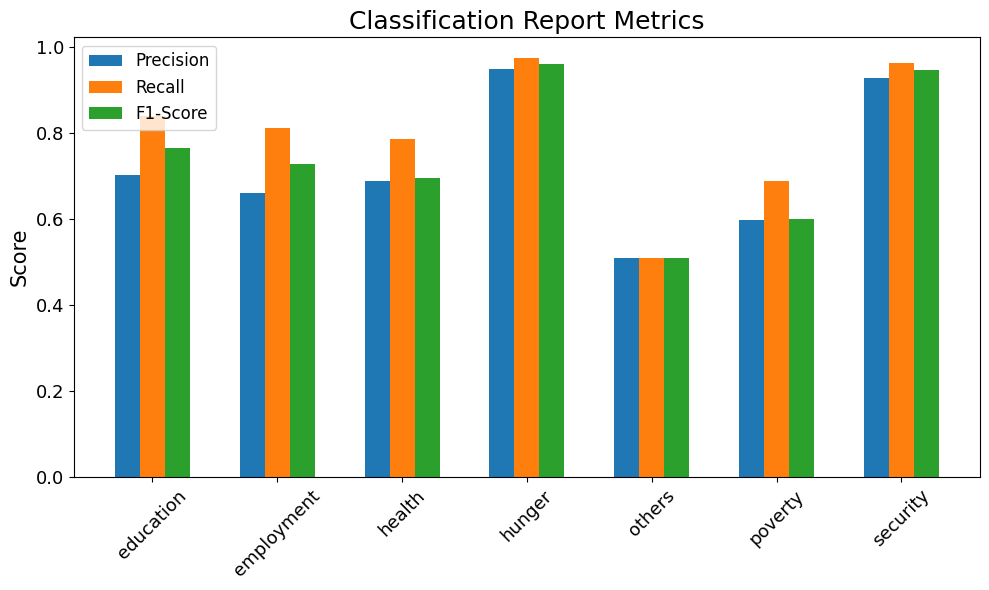

In [81]:
import matplotlib.pyplot as plt

# Initialize an empty dictionary to store the classification report metrics
classification_report_metrics = {}

# Print the classification report for each label separately and store the metrics
for label_idx, label_name in enumerate(mlb.classes_):
    print(f"Classification Report for label: {label_name}")
    report = classification_report(y_test_binary[:, label_idx], predicted_labels_binary[:, label_idx], output_dict=True)
    classification_report_metrics[label_name] = report

# Extract precision, recall, and f1-score for each label
precision = {label: report['weighted avg']['precision'] for label, report in classification_report_metrics.items()}
recall = {label: report['weighted avg']['recall'] for label, report in classification_report_metrics.items()}
f1_score = {label: report['weighted avg']['f1-score'] for label, report in classification_report_metrics.items()}

# Plot the precision, recall, and f1-score for each label
fig, ax = plt.subplots(figsize=(10, 6))

labels = list(precision.keys())
precision_values = list(precision.values())
recall_values = list(recall.values())
f1_score_values = list(f1_score.values())

x = range(len(labels))
width = 0.2

ax.bar(x, precision_values, width, label='Precision')
ax.bar([i + width for i in x], recall_values, width, label='Recall')
ax.bar([i + 2 * width for i in x], f1_score_values, width, label='F1-Score')

ax.set_xticks([i + width for i in x])
ax.set_xticklabels(labels, rotation=45)
ax.set_ylabel('Score')
ax.set_title('Classification Report Metrics')
ax.legend()

plt.tight_layout()
plt.show()


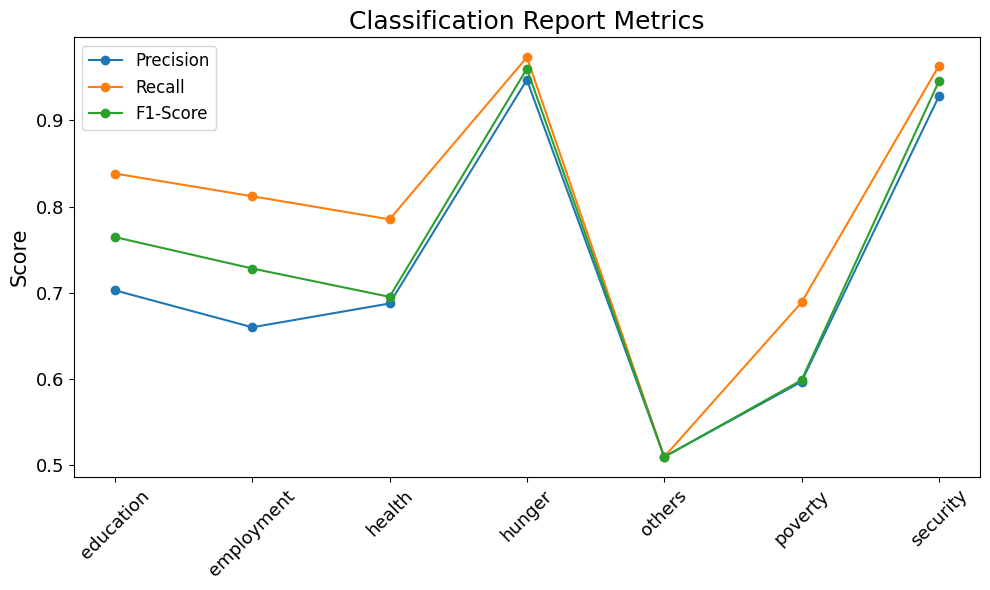

In [82]:
# Plot the precision, recall, and f1-score for each label
fig, ax = plt.subplots(figsize=(10, 6))

labels = list(precision.keys())
precision_values = list(precision.values())
recall_values = list(recall.values())
f1_score_values = list(f1_score.values())

x = range(len(labels))

# Plot precision
ax.plot(x, precision_values, label='Precision', marker='o')

# Plot recall
ax.plot(x, recall_values, label='Recall', marker='o')

# Plot F1-score
ax.plot(x, f1_score_values, label='F1-Score', marker='o')

ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45)
ax.set_ylabel('Score')
ax.set_title('Classification Report Metrics')
ax.legend()

plt.tight_layout()
plt.show()


In [83]:
# # Generate classification report
# report = classification_report(y_test, prediction7)

# # Print and save the classification report
# #print(report)

# # Save the classification report to a file
# with open('classification_reporttheme.txt', 'w') as f:
#     print(report, file=f)
prediction9=model_voting.predict(x_test)
accuracy9 = model_voting.score(x_test, y_test_binary)
print(classification_report(y_test_binary, prediction9))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00       712
           1       0.00      0.00      0.00       826
           2       0.32      0.01      0.01       938
           3       0.00      0.00      0.00       118
           4       0.51      0.49      0.50      2211
           5       0.34      0.05      0.09      1305
           6       0.00      0.00      0.00       162

   micro avg       0.49      0.18      0.27      6272
   macro avg       0.17      0.08      0.09      6272
weighted avg       0.30      0.18      0.20      6272
 samples avg       0.26      0.26      0.26      6272



/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [84]:
print ('Model Accuracy:',accuracy9 * 100)

Model Accuracy: 25.045372050816695


In [85]:
accuracies['lr'] = np.round(accuracy1 * 100,3)

accuracies['knn'] = np.round(accuracy2 * 100,3)

accuracies['cart'] = np.round(accuracy3 * 100,3)

accuracies['svm'] = np.round(accuracy4 * 100,3)

accuracies['bayes'] = np.round(accuracy5 * 100,3)

accuracies['RF'] = np.round(accuracy7 * 100,3)

accuracies['MLP'] = np.round(accuracy6 * 100,3)

accuracies['model_voting'] = np.round(accuracy9 * 100,3)

In [87]:
import xgboost
xgc = xgboost.XGBClassifier()

model_stack = OneVsRestClassifier(StackingClassifier(
    estimators=estimators,
    final_estimator=xgc,
    n_jobs = -1,
    verbose = 1
))

# Fit the stacking classifier
model_stack.fit(x_train, y_train_binary)

# Predictions
y_pred_proba = model_stack.predict_proba(x_test)

# Evaluate the model
accuracy = model_stack.score(x_test, y_test_binary)
print("Voting Classifier Accuracy:", accuracy)


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Voting Classifier Accuracy: 0.2572595281306715


In [88]:
# from sklearn.ensemble import StackingClassifier

# # Initialize the StackingClassifier with OneVsRestClassifier
# model_stacking = OneVsRestClassifier(StackingClassifier(
#     estimators=estimators,
#     final_estimator=None,  # You can specify the final estimator if needed
#     n_jobs=-1,
#     verbose=1
# ))

# # Fit the StackingClassifier
# model_stacking.fit(x_train, y_train_binary)

# # Predict probabilities
# y_pred_proba = model_stacking.predict_proba(x_test)

# # Evaluate the model
# accuracy = model_stacking.score(x_test, y_test_binary)
# print("Stacking Classifier Accuracy:", accuracy)


In [89]:
# Get the training accuracy
train_accuracy2 = model_stack.score(x_train, y_train_binary)

# Save the trained model using joblib
joblib.dump(model_stack, 'stack_classifier_modeltheme.pkl')

# Write the performance details to a text file
with open('model_performance_llamatheme.txt', 'w') as f:
    f.write("Training Accuracy: {}\n".format(train_accuracy2))

In [90]:
prediction8=model_stack.predict(x_test)
accuracy8 = model_stack.score(x_test, y_test_binary)
print(classification_report(y_test_binary, prediction8))


              precision    recall  f1-score   support

           0       0.33      0.00      0.00       712
           1       0.00      0.00      0.00       826
           2       0.22      0.01      0.02       938
           3       0.00      0.00      0.00       118
           4       0.51      0.53      0.52      2211
           5       0.30      0.04      0.07      1305
           6       0.00      0.00      0.00       162

   micro avg       0.48      0.20      0.28      6272
   macro avg       0.19      0.08      0.09      6272
weighted avg       0.31      0.20      0.20      6272
 samples avg       0.27      0.27      0.27      6272



/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [91]:
# # Generate classification report
# report2 = classification_report(y_test, prediction8)

# # Print and save the classification report
# #print(report)

# # Save the classification report to a file
# with open('classification_report_llamatheme.txt', 'w') as f:
#     print(report, file=f)

In [92]:
from sklearn.metrics import classification_report

# Predictions
predictions = model_stack.predict(x_test)

# Convert multilabel predictions to binary array format
predicted_labels_binary = mlb.transform(predicted_labels)
y_test_binary = mlb.transform(y_test)

# Print the classification report for each label separately
for label_idx, label_name in enumerate(mlb.classes_):
    print(f"Classification Report for label: {label_name}")
    print(classification_report(y_test_binary[:, label_idx], predicted_labels_binary[:, label_idx]))


Classification Report for label: education
              precision    recall  f1-score   support

           0       0.84      1.00      0.91      3696
           1       0.00      0.00      0.00       712

    accuracy                           0.84      4408
   macro avg       0.42      0.50      0.46      4408
weighted avg       0.70      0.84      0.76      4408

Classification Report for label: employment
              precision    recall  f1-score   support

           0       0.81      1.00      0.90      3582
           1       0.00      0.00      0.00       826

    accuracy                           0.81      4408
   macro avg       0.41      0.50      0.45      4408
weighted avg       0.66      0.81      0.73      4408

Classification Report for label: health
              precision    recall  f1-score   support

           0       0.79      1.00      0.88      3470
           1       0.32      0.01      0.01       938

    accuracy                           0.79      4408
 

/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

Classification Report for label: education
Classification Report for label: employment
Classification Report for label: health
Classification Report for label: hunger
Classification Report for label: others
Classification Report for label: poverty
Classification Report for label: security


/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

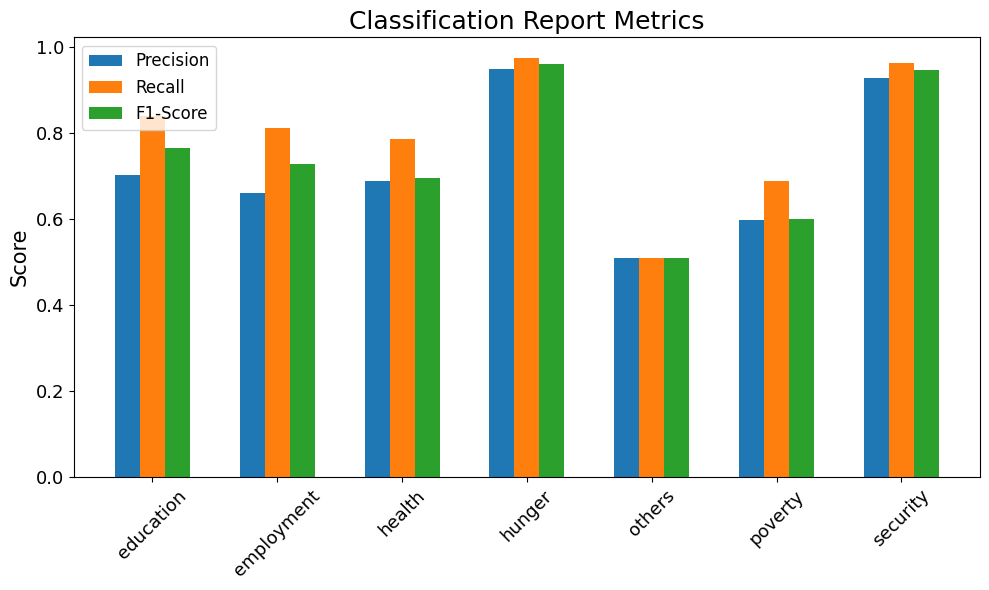

In [93]:
import matplotlib.pyplot as plt

# Initialize an empty dictionary to store the classification report metrics
classification_report_metrics = {}

# Print the classification report for each label separately and store the metrics
for label_idx, label_name in enumerate(mlb.classes_):
    print(f"Classification Report for label: {label_name}")
    report = classification_report(y_test_binary[:, label_idx], predicted_labels_binary[:, label_idx], output_dict=True)
    classification_report_metrics[label_name] = report

# Extract precision, recall, and f1-score for each label
precision = {label: report['weighted avg']['precision'] for label, report in classification_report_metrics.items()}
recall = {label: report['weighted avg']['recall'] for label, report in classification_report_metrics.items()}
f1_score = {label: report['weighted avg']['f1-score'] for label, report in classification_report_metrics.items()}

# Plot the precision, recall, and f1-score for each label
fig, ax = plt.subplots(figsize=(10, 6))

labels = list(precision.keys())
precision_values = list(precision.values())
recall_values = list(recall.values())
f1_score_values = list(f1_score.values())

x = range(len(labels))
width = 0.2

ax.bar(x, precision_values, width, label='Precision')
ax.bar([i + width for i in x], recall_values, width, label='Recall')
ax.bar([i + 2 * width for i in x], f1_score_values, width, label='F1-Score')

ax.set_xticks([i + width for i in x])
ax.set_xticklabels(labels, rotation=45)
ax.set_ylabel('Score')
ax.set_title('Classification Report Metrics')
ax.legend()

plt.tight_layout()
plt.show()


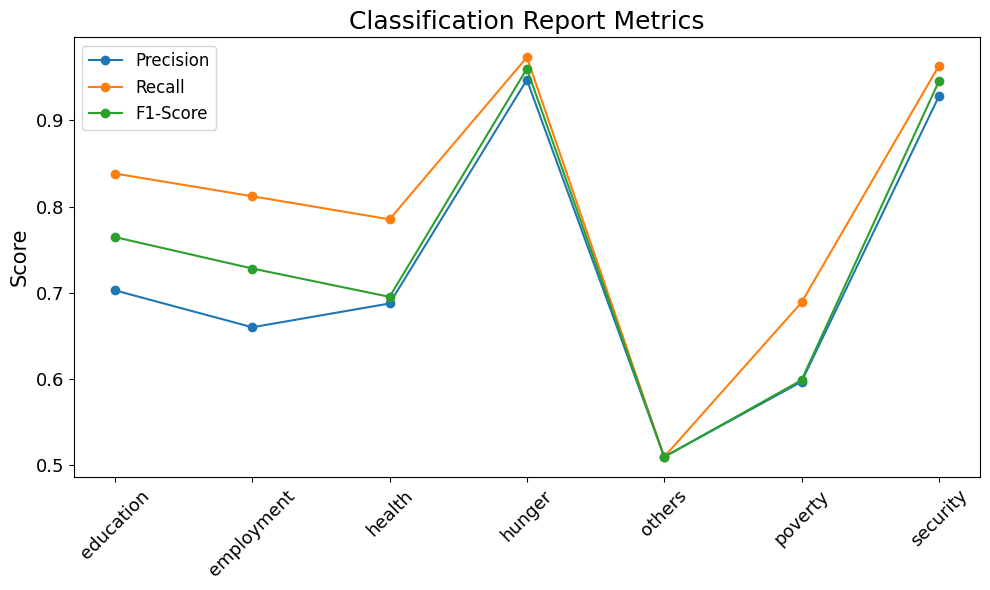

In [94]:
# Plot the precision, recall, and f1-score for each label
fig, ax = plt.subplots(figsize=(10, 6))

labels = list(precision.keys())
precision_values = list(precision.values())
recall_values = list(recall.values())
f1_score_values = list(f1_score.values())

x = range(len(labels))

# Plot precision
ax.plot(x, precision_values, label='Precision', marker='o')

# Plot recall
ax.plot(x, recall_values, label='Recall', marker='o')

# Plot F1-score
ax.plot(x, f1_score_values, label='F1-Score', marker='o')

ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45)
ax.set_ylabel('Score')
ax.set_title('Classification Report Metrics')
ax.legend()

plt.tight_layout()
plt.show()


In [95]:

accuracies['model_stack'] = np.round(accuracy8 * 100,3)

/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


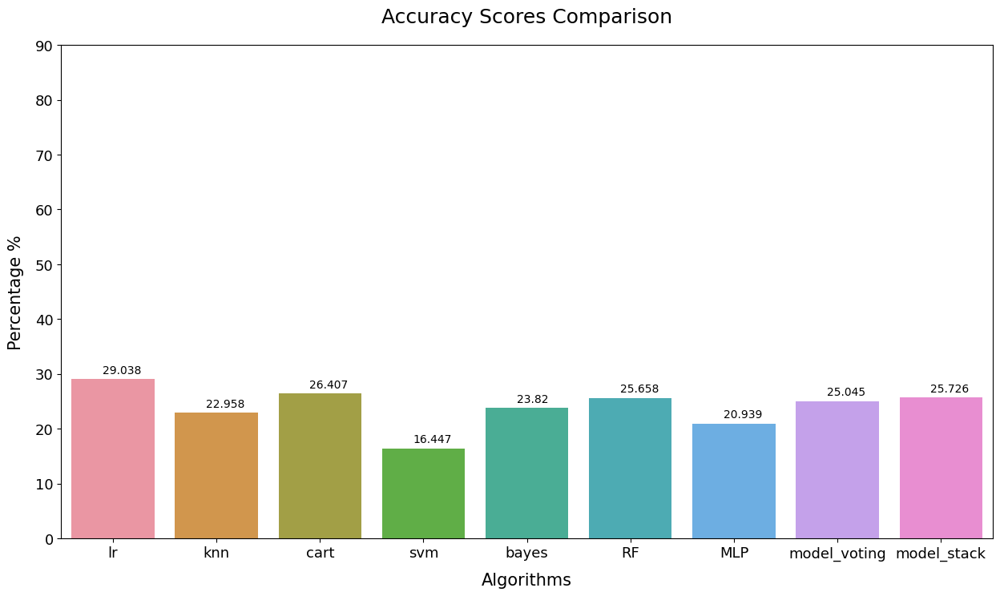

In [96]:
plt.figure(figsize=(15,8))
sns.set_palette('cividis')
ax=sns.barplot(x=list(accuracies.keys()),y=list(accuracies.values()))
plt.yticks(np.arange(0,100,10))
plt.ylabel('Percentage %',labelpad=10)
plt.xlabel('Algorithms',labelpad=10)
plt.title('Accuracy Scores Comparison',pad=20)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x(), p.get_height()),xytext=(p.get_x()+0.3,p.get_height()+1.02))
plt.show()
#plt.savefig('accuracy_scores_comparison_stacktheme.png')

In [102]:
# import numpy as np
# import pandas as pd
# from sklearn.utils import resample
# from sklearn.metrics import f1_score, recall_score, accuracy_score, precision_score, balanced_accuracy_score, classification_report, confusion_matrix
# from sklearn.preprocessing import MultiLabelBinarizer

# # Initialize MultiLabelBinarizer
# mlb = MultiLabelBinarizer()

# # Encode y_test
# y_test_encoded = mlb.fit_transform(y_test)

# # Define the number of iterations
# num_iterations = 5

# # Initialize dictionary to store metrics for each classifier
# metrics = {
#     'Gaussian Naive Bayes': {'f1_scores': [], 'recall_scores': [], 'balanced_accuracy_scores': [], 'accuracy_scores': [], 'precision_scores': []},
#     'Logistic Regression': {'f1_scores': [], 'recall_scores': [], 'balanced_accuracy_scores': [], 'accuracy_scores': [], 'precision_scores': []},
#     'K-Nearest Neighbors': {'f1_scores': [], 'recall_scores': [], 'balanced_accuracy_scores': [], 'accuracy_scores': [], 'precision_scores': []},
#     'Decision Tree': {'f1_scores': [], 'recall_scores': [], 'balanced_accuracy_scores': [], 'accuracy_scores': [], 'precision_scores': []},
#     'Support Vector Machine': {'f1_scores': [], 'recall_scores': [], 'balanced_accuracy_scores': [], 'accuracy_scores': [], 'precision_scores': []},
#     'Random Forest': {'f1_scores': [], 'recall_scores': [], 'balanced_accuracy_scores': [], 'accuracy_scores': [], 'precision_scores': []},
#     'MLP (Multi-Layer Perceptron)': {'f1_scores': [], 'recall_scores': [], 'balanced_accuracy_scores': [], 'accuracy_scores': [], 'precision_scores': []},
#     'Voting Classifier': {'f1_scores': [], 'recall_scores': [], 'balanced_accuracy_scores': [], 'accuracy_scores': [], 'precision_scores': []},
#     'Stacking Classifier': {'f1_scores': [], 'recall_scores': [], 'balanced_accuracy_scores': [], 'accuracy_scores': [], 'precision_scores': []}
# }

# for i in range(num_iterations):
#     # Sample 90% of the testing data randomly with replacement
#     x_test_sampled, y_test_sampled = resample(x_test, y_test_encoded, replace=True, n_samples=int(0.9 * len(x_test)))
    
#     # Predictions for sampled data
#     predictions_sampled = {
#         'Gaussian Naive Bayes': bayes.predict(x_test_sampled),
#         'Logistic Regression': lr.predict(x_test_sampled),
#         'K-Nearest Neighbors': knn.predict(x_test_sampled),
#         'Decision Tree': cart.predict(x_test_sampled),
#         'Support Vector Machine': svm.predict(x_test_sampled),
#         'Random Forest': RF.predict(x_test_sampled),
#         'MLP (Multi-Layer Perceptron)': MLP.predict(x_test_sampled),
#         'Voting Classifier': model_voting.predict(x_test_sampled),
#         'Stacking Classifier': model_stack.predict(x_test_sampled)
#     }
    
#     # Ensure predictions are in the correct format (list of lists)
#     for name, pred in predictions_sampled.items():
#         pred_binary = mlb.transform(pred)
        
#         # Calculate metrics
#         f1 = f1_score(y_test_sampled, pred_binary, average='weighted')
#         recall = recall_score(y_test_sampled, pred_binary, average='weighted')
#         balanced_acc = balanced_accuracy_score(y_test_sampled, pred_binary)
#         accuracy = accuracy_score(y_test_sampled, pred_binary)
#         precision = precision_score(y_test_sampled, pred_binary, average='weighted')
        
#         # Store metrics
#         metrics[name]['f1_scores'].append(f1)
#         metrics[name]['recall_scores'].append(recall)
#         metrics[name]['balanced_accuracy_scores'].append(balanced_acc)
#         metrics[name]['accuracy_scores'].append(accuracy)
#         metrics[name]['precision_scores'].append(precision)

# # Print or use the metrics as needed
# for name, metric in metrics.items():
#     print("Metrics for", name)
#     for key, value in metric.items():
#         print(key + ":")
#         print(value)
#         print("-------------------")


In [103]:
label_counts = df['Predicted_Categories3'].value_counts()
num_unique_labels = len(label_counts)
print("Number of unique labels:", num_unique_labels)


Number of unique labels: 55


In [104]:
import numpy as np
from sklearn.utils import resample
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.metrics import f1_score, recall_score, accuracy_score, precision_score, hamming_loss, jaccard_score

# # Initialize MultiLabelBinarizer
# mlb = MultiLabelBinarizer()

# # Encode y_test
# y_test_encoded = mlb.fit_transform(y_test)

# Define the number of iterations
num_iterations = 5

# Initialize lists to store metrics for each iteration
f1_scores = []
recall_scores = []
accuracy_scores = []
precision_scores = []
hamming_losses = []
jaccard_scores = []

for i in range(num_iterations):
    # Sample 90% of the testing data randomly with replacement
    x_test_sampled, y_test_sampled = resample(x_test, y_test_encoded, replace=True, n_samples=int(0.9 * len(x_test)))
    
    # Predictions for sampled data
    predictions_sampled = {
        'Gaussian Naive Bayes': bayes.predict(x_test_sampled),
        'Logistic Regression': lr.predict(x_test_sampled),
        'K-Nearest Neighbors': knn.predict(x_test_sampled),
        'Decision Tree': cart.predict(x_test_sampled),
        'Support Vector Machine': svm.predict(x_test_sampled),
        'Random Forest': RF.predict(x_test_sampled),
        'MLP (Multi-Layer Perceptron)': MLP.predict(x_test_sampled),
        'Voting Classifier': model_voting.predict(x_test_sampled),
        'Stacking Classifier': model_stack.predict(x_test_sampled)
    }
    
    # Metrics computation for sampled data
    metrics_sampled = {}
    for name, pred in predictions_sampled.items():
        pred_encoded = mlb.transform(pred)
        f1 = f1_score(y_test_sampled, pred_encoded, average='weighted')
        recall = recall_score(y_test_sampled, pred_encoded, average='weighted')
        accuracy = accuracy_score(y_test_sampled, pred_encoded)
        precision = precision_score(y_test_sampled, pred_encoded, average='weighted')
        hamming = hamming_loss(y_test_sampled, pred_encoded)
        jaccard = jaccard_score(y_test_sampled, pred_encoded, average='samples')
        
        metrics_sampled[name] = {
            'F1 Score': f1,
            'Recall': recall,
            'Accuracy': accuracy,
            'Precision': precision,
            'Hamming Loss': hamming,
            'Jaccard Score': jaccard
        }
    
    # Store metrics for each iteration
    f1_scores.append([metrics_sampled[name]['F1 Score'] for name in predictions_sampled.keys()])
    recall_scores.append([metrics_sampled[name]['Recall'] for name in predictions_sampled.keys()])
    accuracy_scores.append([metrics_sampled[name]['Accuracy'] for name in predictions_sampled.keys()])
    precision_scores.append([metrics_sampled[name]['Precision'] for name in predictions_sampled.keys()])
    hamming_losses.append([metrics_sampled[name]['Hamming Loss'] for name in predictions_sampled.keys()])
    jaccard_scores.append([metrics_sampled[name]['Jaccard Score'] for name in predictions_sampled.keys()])

# Calculate average and standard deviation of metrics
avg_f1 = np.mean(f1_scores, axis=0)
std_f1 = np.std(f1_scores, axis=0)

avg_recall = np.mean(recall_scores, axis=0)
std_recall = np.std(recall_scores, axis=0)

avg_accuracy = np.mean(accuracy_scores, axis=0)
std_accuracy = np.std(accuracy_scores, axis=0)

avg_precision = np.mean(precision_scores, axis=0)
std_precision = np.std(precision_scores, axis=0)

avg_hamming_loss = np.mean(hamming_losses, axis=0)
std_hamming_loss = np.std(hamming_losses, axis=0)

avg_jaccard_score = np.mean(jaccard_scores, axis=0)
std_jaccard_score = np.std(jaccard_scores, axis=0)

# Print or use the average and standard deviation of metrics
print("Average F1 Score (Standard Deviation):", avg_f1, "(", std_f1, ")")
print("Average Recall (Standard Deviation):", avg_recall, "(", std_recall, ")")
print("Average Accuracy (Standard Deviation):", avg_accuracy, "(", std_accuracy, ")")
print("Average Precision (Standard Deviation):", avg_precision, "(", std_precision, ")")
print("Average Hamming Loss (Standard Deviation):", avg_hamming_loss, "(", std_hamming_loss, ")")
print("Average Jaccard Score (Standard Deviation):", avg_jaccard_score, "(", std_jaccard_score, ")")


/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/preprocessing/_label.py:900: UserWarning: unknown class(es) [0, 1] will be ignored
  warnings.warn(
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/preprocessing/_label.py:900: UserWarning: unknown class(es) [0, 1] will be ignored
  warnings.warn(
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf

Average F1 Score (Standard Deviation): [0. 0. 0. 0. 0. 0. 0. 0. 0.] ( [0. 0. 0. 0. 0. 0. 0. 0. 0.] )
Average Recall (Standard Deviation): [0. 0. 0. 0. 0. 0. 0. 0. 0.] ( [0. 0. 0. 0. 0. 0. 0. 0. 0.] )
Average Accuracy (Standard Deviation): [0. 0. 0. 0. 0. 0. 0. 0. 0.] ( [0. 0. 0. 0. 0. 0. 0. 0. 0.] )
Average Precision (Standard Deviation): [0. 0. 0. 0. 0. 0. 0. 0. 0.] ( [0. 0. 0. 0. 0. 0. 0. 0. 0.] )
Average Hamming Loss (Standard Deviation): [0.20213187 0.20213187 0.20213187 0.20213187 0.20213187 0.20213187
 0.20213187 0.20213187 0.20213187] ( [0.00224637 0.00224637 0.00224637 0.00224637 0.00224637 0.00224637
 0.00224637 0.00224637 0.00224637] )
Average Jaccard Score (Standard Deviation): [0. 0. 0. 0. 0. 0. 0. 0. 0.] ( [0. 0. 0. 0. 0. 0. 0. 0. 0.] )


/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/preprocessing/_label.py:900: UserWarning: unknown class(es) [0, 1] will be ignored
  warnings.warn(
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [105]:
import numpy as np
from sklearn.utils import resample
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.metrics import f1_score, recall_score, accuracy_score, precision_score, balanced_accuracy_score

# Initialize MultiLabelBinarizer
mlb = MultiLabelBinarizer()

# Encode y_test
y_test_encoded = mlb.fit_transform(y_test)

# Define the number of iterations
num_iterations = 5

# Initialize lists to store metrics for each iteration
f1_scores = []
recall_scores = []
balanced_accuracy_scores = []
accuracy_scores = []
precision_scores = []

for i in range(num_iterations):
    # Sample 90% of the testing data randomly with replacement
    x_test_sampled, y_test_sampled = resample(x_test, y_test_encoded, replace=True, n_samples=int(0.9 * len(x_test)))
    
    # Predictions for sampled data
    predictions_sampled = {
        'Gaussian Naive Bayes': bayes.predict(x_test_sampled),
        'Logistic Regression': lr.predict(x_test_sampled),
        'K-Nearest Neighbors': knn.predict(x_test_sampled),
        'Decision Tree': cart.predict(x_test_sampled),
        'Support Vector Machine': svm.predict(x_test_sampled),
        'Random Forest': RF.predict(x_test_sampled),
        'MLP (Multi-Layer Perceptron)': MLP.predict(x_test_sampled),
        'Voting Classifier': model_voting.predict(x_test_sampled),
        'Stacking Classifier': model_stack.predict(x_test_sampled)
    }
    
    # Ensure predictions are in the correct format (list of lists)
    for name, pred in predictions_sampled.items():
        # Convert predictions to the same format as y_test
        # pred = [mlb.inverse_transform([p])[0] for p in pred]
        # predictions_sampled[name] = pred


        # Ensure predictions are in the correct format (list of lists)
        # for name, pred in predictions_sampled.items():
        # Convert predictions to the same format as y_test
        pred_transformed = mlb.inverse_transform(pred)
        predictions_sampled[name] = pred_transformed

    
    # Metrics computation for sampled data
    metrics_sampled = {}
    for name, pred in predictions_sampled.items():
        pred_encoded = mlb.transform(pred)
        
        f1 = f1_score(y_test_sampled, pred_encoded, average='weighted')
        recall = recall_score(y_test_sampled, pred_encoded, average='weighted')
        # Compute balanced accuracy for each label and then average
        balanced_accuracies = [balanced_accuracy_score(y_test_sampled[:, j], pred_encoded[:, j]) for j in range(y_test_sampled.shape[1])]
        balanced_accuracy = np.mean(balanced_accuracies)
        accuracy = accuracy_score(y_test_sampled, pred_encoded)
        precision = precision_score(y_test_sampled, pred_encoded, average='weighted')
        
        metrics_sampled[name] = {
            'F1 Score': f1,
            'Recall': recall,
            'Balanced Accuracy': balanced_accuracy,
            'Accuracy': accuracy,
            'Precision': precision
        }
    
    # Store metrics for each iteration
    f1_scores.append([metrics_sampled[name]['F1 Score'] for name in predictions_sampled.keys()])
    recall_scores.append([metrics_sampled[name]['Recall'] for name in predictions_sampled.keys()])
    balanced_accuracy_scores.append([metrics_sampled[name]['Balanced Accuracy'] for name in predictions_sampled.keys()])
    accuracy_scores.append([metrics_sampled[name]['Accuracy'] for name in predictions_sampled.keys()])
    precision_scores.append([metrics_sampled[name]['Precision'] for name in predictions_sampled.keys()])

# Calculate average and standard deviation of metrics
avg_f1 = np.mean(f1_scores, axis=0)
std_f1 = np.std(f1_scores, axis=0)

avg_recall = np.mean(recall_scores, axis=0)
std_recall = np.std(recall_scores, axis=0)

avg_balanced_accuracy = np.mean(balanced_accuracy_scores, axis=0)
std_balanced_accuracy = np.std(balanced_accuracy_scores, axis=0)

avg_accuracy = np.mean(accuracy_scores, axis=0)
std_accuracy = np.std(accuracy_scores, axis=0)

avg_precision = np.mean(precision_scores, axis=0)
std_precision = np.std(precision_scores, axis=0)

# Calculate lower and upper percentiles for each metric
percentile_lower = 2.5
percentile_upper = 97.5

ci_lower_f1 = np.percentile(f1_scores, percentile_lower, axis=0)
ci_upper_f1 = np.percentile(f1_scores, percentile_upper, axis=0)

ci_lower_recall = np.percentile(recall_scores, percentile_lower, axis=0)
ci_upper_recall = np.percentile(recall_scores, percentile_upper, axis=0)

ci_lower_balanced_accuracy = np.percentile(balanced_accuracy_scores, percentile_lower, axis=0)
ci_upper_balanced_accuracy = np.percentile(balanced_accuracy_scores, percentile_upper, axis=0)

ci_lower_accuracy = np.percentile(accuracy_scores, percentile_lower, axis=0)
ci_upper_accuracy = np.percentile(accuracy_scores, percentile_upper, axis=0)

ci_lower_precision = np.percentile(precision_scores, percentile_lower, axis=0)
ci_upper_precision = np.percentile(precision_scores, percentile_upper, axis=0)

# Print or use the average and standard deviation of metrics
print("Average F1 Score (Standard Deviation):", avg_f1, "(", std_f1, ")")
print("Average Recall (Standard Deviation):", avg_recall, "(", std_recall, ")")
print("Average Balanced Accuracy (Standard Deviation):", avg_balanced_accuracy, "(", std_balanced_accuracy, ")")
print("Average Accuracy (Standard Deviation):", avg_accuracy, "(", std_accuracy, ")")
print("Average Precision (Standard Deviation):", avg_precision, "(", std_precision, ")")

# Print or use the lower and upper percentiles of metrics
print("F1 Score 95% CI (Lower, Upper):", ci_lower_f1, ci_upper_f1)
print("Recall 95% CI (Lower, Upper):", ci_lower_recall, ci_upper_recall)
print("Balanced Accuracy 95% CI (Lower, Upper):", ci_lower_balanced_accuracy, ci_upper_balanced_accuracy)
print("Accuracy 95% CI (Lower, Upper):", ci_lower_accuracy, ci_upper_accuracy)
print("Precision 95% CI (Lower, Upper):", ci_lower_precision, ci_upper_precision)


/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

Average F1 Score (Standard Deviation): [0.18896112 0.16914973 0.24651207 0.31850586 0.17209726 0.27060911
 0.16232674 0.19825052 0.20061054] ( [0.00470315 0.00356668 0.00669328 0.00637258 0.00457169 0.00533024
 0.00674922 0.0060216  0.00476544] )
Average Recall (Standard Deviation): [0.20525474 0.16316682 0.22430082 0.31820171 0.16917535 0.24861906
 0.14797539 0.18502965 0.19624369] ( [0.00415912 0.00370881 0.00477864 0.00502208 0.00437838 0.00515037
 0.00702211 0.00623038 0.00472813] )
Average Balanced Accuracy (Standard Deviation): [0.49894433 0.4993597  0.49732574 0.50000034 0.49914364 0.49800088
 0.50029932 0.502837   0.50112898] ( [0.00106841 0.00106218 0.00182708 0.00468573 0.00087343 0.00122847
 0.00094344 0.00123849 0.00075088] )
Average Accuracy (Standard Deviation): [0.29321906 0.23307285 0.25903706 0.16521301 0.24169398 0.25873456
 0.21063776 0.25122259 0.25969246] ( [0.00594481 0.00428565 0.00657653 0.00850013 0.00686731 0.00739346
 0.00988924 0.0091912  0.00749724] )
Avera

/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

In [106]:
import numpy as np
import pandas as pd
from sklearn.utils import resample
from sklearn.metrics import f1_score, recall_score, accuracy_score, precision_score, balanced_accuracy_score

# Define the number of iterations
num_iterations = 5

# Initialize lists to store metrics for each iteration
f1_scores = []
recall_scores = []
balanced_accuracy_scores = []
accuracy_scores = []
precision_scores = []

for i in range(num_iterations):
    # Sample 90% of the testing data randomly with replacement
    x_test_sampled, y_test_sampled = resample(x_test, y_test_encoded, replace=True, n_samples=int(0.9 * len(x_test)))
    
    # Predictions for sampled data
    predictions_sampled = {
        'Gaussian Naive Bayes': bayes.predict(x_test_sampled),
        'Logistic Regression': lr.predict(x_test_sampled),
        'K-Nearest Neighbors': knn.predict(x_test_sampled),
        'Decision Tree': cart.predict(x_test_sampled),
        'Support Vector Machine': svm.predict(x_test_sampled),
        'Random Forest': RF.predict(x_test_sampled),
        'MLP (Multi-Layer Perceptron)': MLP.predict(x_test_sampled),
        'Voting Classifier': model_voting.predict(x_test_sampled),
        'Stacking Classifier': model_stack.predict(x_test_sampled)
    }
    
    # Ensure predictions are in the correct format (list of lists)
    for name, pred in predictions_sampled.items():
        # Convert predictions to the same format as y_test
        # pred = [mlb.inverse_transform([p])[0] for p in pred]
        # predictions_sampled[name] = pred


        # Ensure predictions are in the correct format (list of lists)
        # for name, pred in predictions_sampled.items():
        # Convert predictions to the same format as y_test
        pred_transformed = mlb.inverse_transform(pred)
        predictions_sampled[name] = pred_transformed

    
    # Metrics computation for sampled data
    metrics_sampled = {}
    for name, pred in predictions_sampled.items():
        pred_encoded = mlb.transform(pred)
        
        f1 = f1_score(y_test_sampled, pred_encoded, average='weighted')
        recall = recall_score(y_test_sampled, pred_encoded, average='weighted')
        # Compute balanced accuracy for each label and then average
        balanced_accuracies = [balanced_accuracy_score(y_test_sampled[:, j], pred_encoded[:, j]) for j in range(y_test_sampled.shape[1])]
        balanced_accuracy = np.mean(balanced_accuracies)
        accuracy = accuracy_score(y_test_sampled, pred_encoded)
        precision = precision_score(y_test_sampled, pred_encoded, average='weighted')
        
        metrics_sampled[name] = {
            'F1 Score': f1,
            'Recall': recall,
            'Balanced Accuracy': balanced_accuracy,
            'Accuracy': accuracy,
            'Precision': precision
        }
    
    # Store metrics for each iteration
    f1_scores.append([metrics_sampled[name]['F1 Score'] for name in predictions_sampled.keys()])
    recall_scores.append([metrics_sampled[name]['Recall'] for name in predictions_sampled.keys()])
    balanced_accuracy_scores.append([metrics_sampled[name]['Balanced Accuracy'] for name in predictions_sampled.keys()])
    accuracy_scores.append([metrics_sampled[name]['Accuracy'] for name in predictions_sampled.keys()])
    precision_scores.append([metrics_sampled[name]['Precision'] for name in predictions_sampled.keys()])

# Create DataFrames for the results
results_f1 = pd.DataFrame(f1_scores, columns=predictions_sampled.keys())
results_recall = pd.DataFrame(recall_scores, columns=predictions_sampled.keys())
results_balanced_accuracy = pd.DataFrame(balanced_accuracy_scores, columns=predictions_sampled.keys())
results_accuracy = pd.DataFrame(accuracy_scores, columns=predictions_sampled.keys())
results_precision = pd.DataFrame(precision_scores, columns=predictions_sampled.keys())

# Calculate standard deviations of metrics
std_f1 = results_f1.std()
std_recall = results_recall.std()
std_balanced_accuracy = results_balanced_accuracy.std()
std_accuracy = results_accuracy.std()
std_precision = results_precision.std()

# Calculate percentiles of metrics
percentiles = [0.025, 0.975]
percentile_values_f1 = results_f1.quantile(q=percentiles)
percentile_values_recall = results_recall.quantile(q=percentiles)
percentile_values_balanced_accuracy = results_balanced_accuracy.quantile(q=percentiles)
percentile_values_accuracy = results_accuracy.quantile(q=percentiles)
percentile_values_precision = results_precision.quantile(q=percentiles)


# Create DataFrames for standard deviations and percentiles
results_std = pd.DataFrame({'F1 Score': std_f1, 'Recall': std_recall, 'Balanced Accuracy': std_balanced_accuracy, 'Accuracy': std_accuracy, 'Precision': std_precision})
results_percentiles = pd.concat([percentile_values_f1, percentile_values_recall, percentile_values_balanced_accuracy, percentile_values_accuracy, percentile_values_precision], keys=['F1 Score', 'Recall', 'Balanced Accuracy', 'Accuracy', 'Precision'], axis=1)

# Print or use the DataFrames for the results
print("Standard Deviations:")
print(results_std)
print("\nPercentiles:")
print(results_percentiles)


/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

Standard Deviations:
                              F1 Score    Recall  Balanced Accuracy  Accuracy  \
Gaussian Naive Bayes          0.002974  0.003398           0.000625  0.004007   
Logistic Regression           0.002220  0.001503           0.000517  0.002280   
K-Nearest Neighbors           0.010498  0.009778           0.003197  0.008907   
Decision Tree                 0.007672  0.007562           0.004417  0.004986   
Support Vector Machine        0.002754  0.003409           0.001351  0.004819   
Random Forest                 0.009041  0.008376           0.003116  0.007589   
MLP (Multi-Layer Perceptron)  0.003461  0.003526           0.001149  0.005521   
Voting Classifier             0.003668  0.002751           0.000862  0.002887   
Stacking Classifier           0.002957  0.003413           0.000616  0.003417   

                              Precision  
Gaussian Naive Bayes           0.003035  
Logistic Regression            0.003407  
K-Nearest Neighbors            0.013823  


/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

In [52]:
df=df2.copy()

In [107]:
# Import necessary libraries
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.multioutput import MultiOutputClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import classification_report, hamming_loss
from sklearn.model_selection import cross_val_score, RepeatedStratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn import preprocessing
import xgboost
import umap
import joblib
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import warnings

In [31]:
from sentence_transformers import SentenceTransformer

# Pre-calculate embeddings
embedding_model = SentenceTransformer("BAAI/bge-small-en")
# embeddings = embedding_model.encode(df['Text_lemma'], show_progress_bar=True)
embeddings = embedding_model.encode(df['Text_translate2'], show_progress_bar=True)

Batches:   0%|          | 0/861 [00:00<?, ?it/s]

In [86]:
df.columns

Index(['Unnamed: 0.4', 'Unnamed: 0.3', 'Unnamed: 0.2', 'Unnamed: 0.1',
       'Unnamed: 0', 'textid', 'Date', 'Views', 'sourcetype', 'alltext',
       'Text_emt', 'Text_emj', 'Text_langue', 'Text_translate', 'Text_langue2',
       'Text_lower', 'Text_punct', 'Text_tags', 'Text_chat', 'Text_spell',
       'Text_langue3', 'Text_translate2', 'Text_token', 'Text_stop',
       'Text_stem', 'Text_lemma', 'llama2_labelone', 'cluster_labelone',
       'llama2_labelone10', 'cluster_labelone10', 'Text_lemma2',
       'Predicted_Categories', 'Predicted_Categories2', 'Similarity_Score',
       'Keysector', 'Bertscore_Labels', 'Keysector_bert', 'Model_Output',
       'Extracted_Probabilities', 'Final_Labels', 'Predicted_Categories3'],
      dtype='object')

In [108]:
# df.columns
df['Bertscore_Labels']

0                                                   others
1                                                   others
2                                                   others
3                                                   others
4                                                   others
                               ...                        
22031                                               others
22032                                            education
22033                                               others
22034    education|poverty|hunger|security|health|emplo...
22035                                               others
Name: Bertscore_Labels, Length: 22036, dtype: object

In [109]:

# Embedding and preprocessing
# X_embedded = umap.UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine', random_state=42).fit_transform(embeddings)
# x = preprocessing.scale(X_embedded)
# Split the categories and convert them into lists
df['Bertscore_Labels'] = df['Bertscore_Labels'].apply(lambda x: x.split('|'))

y = df['Bertscore_Labels']#.apply(lambda x: x.split('|'))
# Split data into train and test sets
# x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=17)

from sklearn import model_selection 
# y = df['Predicted_Categories3']#.apply(lambda x: x.split('|'))
# Split data into train and test sets
# x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=17)

# Scaling X_embedded
X_embedded = preprocessing.scale(X_embedded)

# Defining target variable
# y = df[['llama2_labelone']].values

# Splitting the data
x_train, x_test, y_train, y_test = model_selection.train_test_split(X_embedded, y, test_size=0.2, random_state=42)#, stratify=y)

# Apply UMAP only on the training data
umap_transformer = umap.UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine', random_state=42)
x_train = umap_transformer.fit_transform(x_train)

# Transform the test data using the fitted UMAP transformer
x_test = umap_transformer.transform(x_test)


/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/preprocessing/_data.py:280: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn(
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/umap/spectral.py:550: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/scipy/sparse/_index.py:146:

In [110]:
plt.rc('axes', titlesize=18)
plt.rc('axes', labelsize=15)
plt.rc('xtick', labelsize=13)
plt.rc('ytick', labelsize=13)
plt.rc('figure', titlesize=35)
plt.rc('legend', fontsize=12)

In [111]:
avg_accuracies={}
accuracies={}
roc_auc={}
pr_auc={}

In [112]:
def cal_score(name,model,folds):
    scores = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']
    avg_result=[]
    for sc in scores:
        scores = cross_val_score(model, x, y, cv = folds, scoring = sc)
        avg_result.append(np.average(scores))
    df_avg_score=pd.DataFrame(avg_result)
    df_avg_score= df_avg_score.rename(index={0: 'Accuracy', 1:'Precision', 2:'Recall',3:'F1 score',4:'Roc auc'},columns={0:'Average'})
    avg_accuracies[name]=np.round(df_avg_score.loc['Accuracy']*100,3)
    values=[np.round(df_avg_score.loc['Accuracy']*100,3),np.round(df_avg_score.loc['Precision']*100,3),np.round(df_avg_score.loc['Recall']*100,3),np.round(df_avg_score.loc['F1 score']*100,3),np.round(df_avg_score.loc['Roc auc']*100,3)]
    plt.figure(figsize=(15,8))
    sns.set_palette('mako')
    ax=sns.barplot(x=['Accuracy','Precision','Recall','F1 score','Roc auc'],y=values)
    plt.yticks(np.arange(0,100,10))
    plt.ylabel('Percentage %',labelpad=10)
    plt.xlabel('Scoring Parameters',labelpad=10)
    plt.title('Cross Validation '+str(folds)+'-Folds Average Scores',pad=20)
    for p in ax.patches:
        ax.annotate(str(p.get_height()), (p.get_x(), p.get_height()),xytext=(p.get_x()+0.3,p.get_height()+1.02))
    plt.show()

In [113]:
def conf_matrix(ytest,pred):
    plt.figure(figsize=(9,6))
    global cm1
    cm1 = confusion_matrix(ytest, pred)
    ax=sns.heatmap(cm1, annot= True, cmap='Blues')
    plt.title('Confusion Matrix',pad=20)

In [114]:
def metrics_score(cm):
    total=sum(sum(cm))
    accuracy=(cm[0,0]+cm[1,1])/total
    precision = cm[1,1]/(cm[0,1]+cm[1,1])
    sensitivity = cm[1,1]/(cm[1,0]+cm[1,1])
    f1 = 2 * (precision * sensitivity) / (precision + sensitivity)
    specificity = cm[0,0]/(cm[0,1]+cm[0,0])
    values=[np.round(accuracy*100,3),np.round(precision*100,3),np.round(sensitivity*100,3),np.round(f1*100,3),np.round(specificity*100,3)]
    plt.figure(figsize=(15,8))
    sns.set_palette('magma')
    ax=sns.barplot(x=['Accuracy','Precision','Recall','F1 score','Specificity'],y=values)
    plt.yticks(np.arange(0,100,10))
    plt.ylabel('Percentage %',labelpad=10)
    plt.xlabel('Scoring Parameter',labelpad=10)
    plt.title('Metrics Scores',pad=20)
    for p in ax.patches:
        ax.annotate(str(p.get_height()), (p.get_x(), p.get_height()),xytext=(p.get_x()+0.3,p.get_height()+1.02))
    plt.show()

In [115]:
def plot_roc_curve(fpr, tpr):
    plt.figure(figsize=(8,6))
    plt.plot(fpr, tpr, color='Orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='black', linestyle='--')
    plt.ylabel('True Positive Rate',labelpad=10)
    plt.xlabel('False Positive Rate',labelpad=10)
    plt.title('Receiver Operating Characteristic (ROC) Curve',pad=20)
    plt.legend()
    plt.show()

In [116]:
def plot_precision_recall_curve(recall, precision):
    plt.figure(figsize=(8,6))
    plt.plot(recall, precision, color='orange', label='PRC')
    plt.ylabel('Precision',labelpad=10)
    plt.xlabel('Recall',labelpad=10)
    plt.title('Precision Recall Curve',pad=20)
    plt.legend()
    plt.show()

In [117]:
# evaluate a given model using cross-validation
def evaluate_model(model, X, y):
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
    return scores


In [118]:
# get the dataset
def get_dataset():
    X, y = make_classification(n_samples=1000, n_features=20, n_informative=15, n_redundant=5, random_state=1)
    return X, y


In [119]:
# get a list of models to evaluate
from sklearn.neural_network import MLPClassifier
# Define models for evaluation
def get_models():
    models = dict()
    models['lr'] = OneVsRestClassifier(LogisticRegression())
    models['knn'] = OneVsRestClassifier(KNeighborsClassifier())
    models['cart'] = OneVsRestClassifier(DecisionTreeClassifier())
    models['svm'] = OneVsRestClassifier(SVC(probability=True))
    models['RF'] = OneVsRestClassifier(RandomForestClassifier())
    models['bayes'] = OneVsRestClassifier(GaussianNB())
    models['MLP'] = OneVsRestClassifier(MLPClassifier(hidden_layer_sizes=(150, 100, 50), max_iter=300, activation='relu', solver='adam', random_state=1))
    return models

In [120]:

from sklearn.preprocessing import MultiLabelBinarizer

# Convert labels to binary array format
mlb = MultiLabelBinarizer()
y_train_binary = mlb.fit_transform(y_train)
y_test_binary = mlb.transform(y_test)

# Initialize and train the models
bayes = OneVsRestClassifier(GaussianNB()).fit(x_train, y_train_binary)
lr = OneVsRestClassifier(LogisticRegression()).fit(x_train, y_train_binary)
knn = OneVsRestClassifier(KNeighborsClassifier()).fit(x_train, y_train_binary)
cart = OneVsRestClassifier(DecisionTreeClassifier()).fit(x_train, y_train_binary)
# Set probability=True for SVC
svm = OneVsRestClassifier(SVC(probability=True)).fit(x_train, y_train_binary)
RF = OneVsRestClassifier(RandomForestClassifier()).fit(x_train, y_train_binary)
MLP = OneVsRestClassifier(MLPClassifier(hidden_layer_sizes=(150, 100, 50), max_iter=300, activation='relu', solver='adam', random_state=1)).fit(x_train, y_train_binary)



In [121]:

# Predictions
prediction1 = bayes.predict(x_test)
accuracy1 = bayes.score(x_test, y_test_binary)

prediction2 = lr.predict(x_test)
accuracy2 = lr.score(x_test, y_test_binary)

prediction3 = knn.predict(x_test)
accuracy3 = knn.score(x_test, y_test_binary)

prediction4 = cart.predict(x_test)
accuracy4 = cart.score(x_test, y_test_binary)

prediction5 = svm.predict(x_test)
accuracy5 = svm.score(x_test, y_test_binary)

prediction6 = MLP.predict(x_test)
accuracy6 = MLP.score(x_test, y_test_binary)

prediction7 = MLP.predict(x_test)
accuracy7 = MLP.score(x_test, y_test_binary)

In [122]:
# Voting Classifier
estimators = [
    ('lr', lr),
    ('knn', knn),
    ('cart', cart),
    ('svm', svm),
    ('RF', RF),
    ('bayes', bayes),
    ('MLP', MLP)
]

#estimators

In [123]:

# estimators
import joblib
from sklearn.ensemble import StackingClassifier, VotingClassifier
# Initialize the VotingClassifier with OneVsRestClassifier
# Wrap the VotingClassifier with OneVsRestClassifier
# Wrap the VotingClassifier with OneVsRestClassifier
# Wrap the VotingClassifier with OneVsRestClassifier
model_voting = OneVsRestClassifier(VotingClassifier(
    estimators=estimators,
    voting='soft',  # Change to 'soft' voting
    n_jobs=-1,
    verbose=1
))

# Fit the VotingClassifier
model_voting.fit(x_train, y_train_binary)

# Predict probabilities
y_pred_proba = model_voting.predict_proba(x_test)

# Evaluate the model
accuracy = model_voting.score(x_test, y_test_binary)
print("Voting Classifier Accuracy:", accuracy)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Voting Classifier Accuracy: 0.6597096188747731


In [124]:

# Get the training accuracy
train_accuracy = model_voting.score(x_train, y_train_binary)

# Save the trained model using joblib
joblib.dump(model_voting, 'voting_classifier_modeltheme2.pkl')

# Write the performance details to a text file
with open('model_performance_llamatheme.txt', 'w') as f:
    f.write("Training Accuracy: {}\n".format(train_accuracy))

In [125]:
df['Bertscore_Labels']

0                                                 [others]
1                                                 [others]
2                                                 [others]
3                                                 [others]
4                                                 [others]
                               ...                        
22031                                             [others]
22032                                          [education]
22033                                             [others]
22034    [education, poverty, hunger, security, health,...
22035                                             [others]
Name: Bertscore_Labels, Length: 22036, dtype: object

In [126]:
df.columns

Index(['textid', 'Date', 'Views', 'sourcetype', 'alltext', 'Text_emt',
       'Text_emj', 'Text_langue', 'Text_translate', 'Text_langue2',
       'Text_lower', 'Text_punct', 'Text_tags', 'Text_chat', 'Text_spell',
       'Text_langue3', 'Text_translate2', 'Text_token', 'Text_stop',
       'Text_stem', 'Text_lemma', 'berttopic2', 'cluster_id2',
       'llama2_labelswsp', 'cluster_id', 'llama2_labelone', 'cluster_labelone',
       'llama2_labelone10', 'Text_lemma2', 'Bertscore_Labels',
       'Extracted_Probabilities', 'Final_Labels', 'Predicted_Categories3'],
      dtype='object')

In [127]:
# Predictions
prediction9 = model_voting.predict(x_test)

# Inverse transform predicted labels
predicted_labels = mlb.inverse_transform(prediction9)

# Convert y_test to binary array format if necessary
# Ensure y_test is a list of lists or a binary array
# y_test_binary = mlb.transform(y_test)

# Print the classification report with text labels
print(classification_report(y_test_binary, prediction9))

              precision    recall  f1-score   support

           0       0.29      0.04      0.07      1337
           1       0.54      0.01      0.01      1047
           2       0.31      0.02      0.04      1210
           3       0.37      0.01      0.03      1135
           4       0.69      0.96      0.80      3052
           5       0.35      0.03      0.05      1197
           6       0.33      0.00      0.00       849

   micro avg       0.66      0.31      0.42      9827
   macro avg       0.41      0.15      0.14      9827
weighted avg       0.46      0.31      0.27      9827
 samples avg       0.67      0.67      0.67      9827



/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [128]:
prediction9=model_voting.predict(x_test)
accuracy9 = model_voting.score(x_test, y_test_binary)
print(classification_report(y_test_binary, prediction9))

              precision    recall  f1-score   support

           0       0.29      0.04      0.07      1337
           1       0.54      0.01      0.01      1047
           2       0.31      0.02      0.04      1210
           3       0.37      0.01      0.03      1135
           4       0.69      0.96      0.80      3052
           5       0.35      0.03      0.05      1197
           6       0.33      0.00      0.00       849

   micro avg       0.66      0.31      0.42      9827
   macro avg       0.41      0.15      0.14      9827
weighted avg       0.46      0.31      0.27      9827
 samples avg       0.67      0.67      0.67      9827



/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [129]:
from sklearn.metrics import classification_report

# Predictions
predictions = model_voting.predict(x_test)

# Convert multilabel predictions to binary array format
predicted_labels_binary = mlb.transform(predicted_labels)
y_test_binary = mlb.transform(y_test)

# Print the classification report for each label separately
for label_idx, label_name in enumerate(mlb.classes_):
    print(f"Classification Report for label: {label_name}")
    print(classification_report(y_test_binary[:, label_idx], predicted_labels_binary[:, label_idx]))


Classification Report for label: education
              precision    recall  f1-score   support

           0       0.70      0.96      0.81      3071
           1       0.29      0.04      0.07      1337

    accuracy                           0.68      4408
   macro avg       0.50      0.50      0.44      4408
weighted avg       0.57      0.68      0.58      4408

Classification Report for label: employment
              precision    recall  f1-score   support

           0       0.76      1.00      0.87      3361
           1       0.54      0.01      0.01      1047

    accuracy                           0.76      4408
   macro avg       0.65      0.50      0.44      4408
weighted avg       0.71      0.76      0.66      4408

Classification Report for label: health
              precision    recall  f1-score   support

           0       0.73      0.98      0.84      3198
           1       0.31      0.02      0.04      1210

    accuracy                           0.72      4408
 

Classification Report for label: education
Classification Report for label: employment
Classification Report for label: health
Classification Report for label: hunger
Classification Report for label: others
Classification Report for label: poverty
Classification Report for label: security


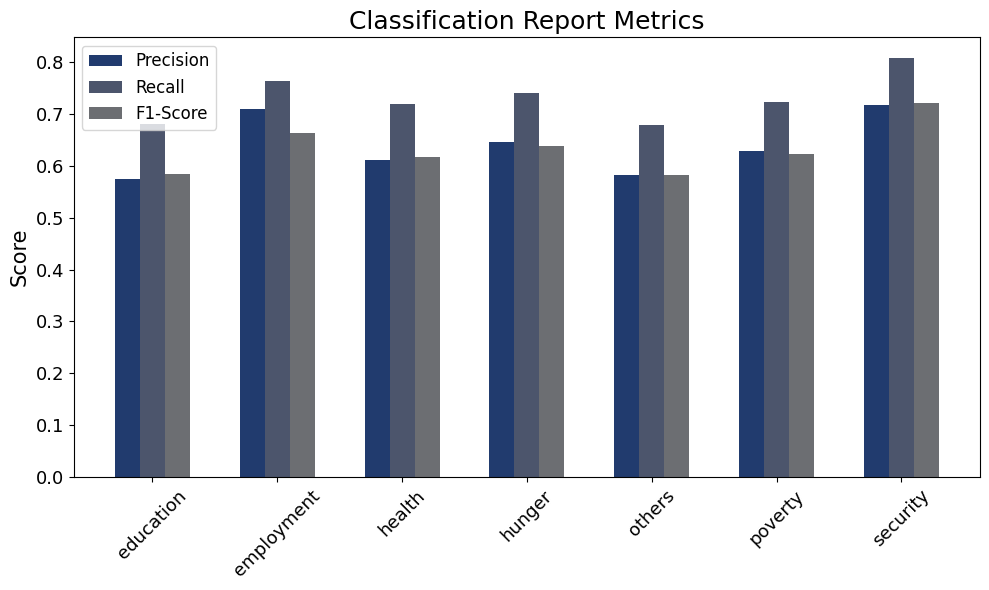

In [130]:
import matplotlib.pyplot as plt

# Initialize an empty dictionary to store the classification report metrics
classification_report_metrics = {}

# Print the classification report for each label separately and store the metrics
for label_idx, label_name in enumerate(mlb.classes_):
    print(f"Classification Report for label: {label_name}")
    report = classification_report(y_test_binary[:, label_idx], predicted_labels_binary[:, label_idx], output_dict=True)
    classification_report_metrics[label_name] = report

# Extract precision, recall, and f1-score for each label
precision = {label: report['weighted avg']['precision'] for label, report in classification_report_metrics.items()}
recall = {label: report['weighted avg']['recall'] for label, report in classification_report_metrics.items()}
f1_score = {label: report['weighted avg']['f1-score'] for label, report in classification_report_metrics.items()}

# Plot the precision, recall, and f1-score for each label
fig, ax = plt.subplots(figsize=(10, 6))

labels = list(precision.keys())
precision_values = list(precision.values())
recall_values = list(recall.values())
f1_score_values = list(f1_score.values())

x = range(len(labels))
width = 0.2

ax.bar(x, precision_values, width, label='Precision')
ax.bar([i + width for i in x], recall_values, width, label='Recall')
ax.bar([i + 2 * width for i in x], f1_score_values, width, label='F1-Score')

ax.set_xticks([i + width for i in x])
ax.set_xticklabels(labels, rotation=45)
ax.set_ylabel('Score')
ax.set_title('Classification Report Metrics')
ax.legend()

plt.tight_layout()
plt.show()


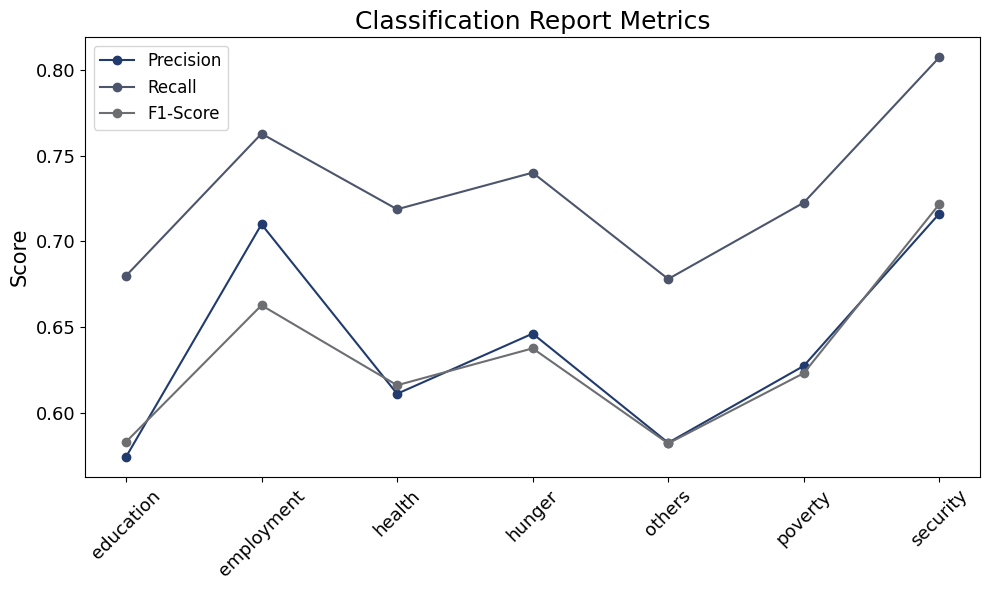

In [131]:
# Plot the precision, recall, and f1-score for each label
fig, ax = plt.subplots(figsize=(10, 6))

labels = list(precision.keys())
precision_values = list(precision.values())
recall_values = list(recall.values())
f1_score_values = list(f1_score.values())

x = range(len(labels))

# Plot precision
ax.plot(x, precision_values, label='Precision', marker='o')

# Plot recall
ax.plot(x, recall_values, label='Recall', marker='o')

# Plot F1-score
ax.plot(x, f1_score_values, label='F1-Score', marker='o')

ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45)
ax.set_ylabel('Score')
ax.set_title('Classification Report Metrics')
ax.legend()

plt.tight_layout()
plt.show()


In [132]:
print ('Model Accuracy:',accuracy7 * 100)

Model Accuracy: 69.01088929219601


In [133]:
accuracies['lr'] = np.round(accuracy1 * 100,3)

accuracies['knn'] = np.round(accuracy2 * 100,3)

accuracies['cart'] = np.round(accuracy3 * 100,3)

accuracies['svm'] = np.round(accuracy4 * 100,3)

accuracies['bayes'] = np.round(accuracy5 * 100,3)

accuracies['MLP'] = np.round(accuracy6 * 100,3)
accuracies['RF'] = np.round(accuracy7 * 100,3)

accuracies['model_voting'] = np.round(accuracy9 * 100,3)

In [134]:
xgc = xgboost.XGBClassifier()

model_stack = OneVsRestClassifier(StackingClassifier(
    estimators=estimators,
    final_estimator=xgc,
    n_jobs = -1,
    verbose = 1
))

# Fit the stacking classifier
model_stack.fit(x_train, y_train_binary)

# Predictions
y_pred_proba = model_stack.predict_proba(x_test)

# Evaluate the model
accuracy = model_stack.score(x_test, y_test_binary)
print("Voting Classifier Accuracy:", accuracy)


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    1.0s finished
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    9.6s finished
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   40.9s finished
[Parall

[Voting] .................... (6 of 7) Processing bayes, total=   0.0s
[Voting] ...................... (7 of 7) Processing MLP, total=  10.9s
[Voting] ....................... (5 of 7) Processing RF, total=   5.9s
[Voting] ....................... (5 of 7) Processing RF, total=   6.2s
[Voting] ....................... (5 of 7) Processing RF, total=   6.2s
[Voting] ....................... (5 of 7) Processing RF, total=   6.1s
[Voting] ....................... (5 of 7) Processing RF, total=   6.0s
[Voting] ....................... (5 of 7) Processing RF, total=   6.0s


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Done   5 out of   5 | ela

[Voting] ....................... (1 of 7) Processing lr, total=   0.1s
[Voting] ...................... (2 of 7) Processing knn, total=   0.0s
[Voting] ...................... (2 of 7) Processing knn, total=   0.0s
[Voting] ...................... (7 of 7) Processing MLP, total=   3.7s
[Voting] ...................... (4 of 7) Processing svm, total=  34.6s
[Voting] .................... (6 of 7) Processing bayes, total=   0.0s
[Voting] ...................... (2 of 7) Processing knn, total=   0.0s
[Voting] ...................... (7 of 7) Processing MLP, total=   5.6s
[Voting] ...................... (4 of 7) Processing svm, total=  25.8s


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   36.8s finished
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   37.6s finished
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with

Voting Classifier Accuracy: 0.6195553539019963


In [135]:
# Get the training accuracy
train_accuracy2 = model_stack.score(x_train, y_train_binary)

# Save the trained model using joblib
joblib.dump(model_stack, 'stack_classifier_modeltheme2.pkl')

# Write the performance details to a text file
with open('model_performance_llamatheme.txt', 'w') as f:
    f.write("Training Accuracy: {}\n".format(train_accuracy2))

In [136]:
prediction8=model_stack.predict(x_test)
accuracy8 = model_stack.score(x_test, y_test_binary)
print(classification_report(y_test_binary, prediction8))


              precision    recall  f1-score   support

           0       0.31      0.04      0.07      1337
           1       0.18      0.00      0.01      1047
           2       0.28      0.04      0.07      1210
           3       0.50      0.01      0.01      1135
           4       0.69      0.99      0.81      3052
           5       0.24      0.01      0.02      1197
           6       0.20      0.00      0.00       849

   micro avg       0.66      0.32      0.43      9827
   macro avg       0.34      0.16      0.14      9827
weighted avg       0.42      0.32      0.28      9827
 samples avg       0.67      0.69      0.67      9827



/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [137]:

accuracies['model_stack'] = np.round(accuracy8 * 100,3)

In [138]:
from sklearn.metrics import classification_report

# Predictions
predictions = model_stack.predict(x_test)

# Convert multilabel predictions to binary array format
predicted_labels_binary = mlb.transform(predicted_labels)
y_test_binary = mlb.transform(y_test)

# Print the classification report for each label separately
for label_idx, label_name in enumerate(mlb.classes_):
    print(f"Classification Report for label: {label_name}")
    print(classification_report(y_test_binary[:, label_idx], predicted_labels_binary[:, label_idx]))


Classification Report for label: education
              precision    recall  f1-score   support

           0       0.70      0.96      0.81      3071
           1       0.29      0.04      0.07      1337

    accuracy                           0.68      4408
   macro avg       0.50      0.50      0.44      4408
weighted avg       0.57      0.68      0.58      4408

Classification Report for label: employment
              precision    recall  f1-score   support

           0       0.76      1.00      0.87      3361
           1       0.54      0.01      0.01      1047

    accuracy                           0.76      4408
   macro avg       0.65      0.50      0.44      4408
weighted avg       0.71      0.76      0.66      4408

Classification Report for label: health
              precision    recall  f1-score   support

           0       0.73      0.98      0.84      3198
           1       0.31      0.02      0.04      1210

    accuracy                           0.72      4408
 

Classification Report for label: education
Classification Report for label: employment
Classification Report for label: health
Classification Report for label: hunger
Classification Report for label: others
Classification Report for label: poverty
Classification Report for label: security


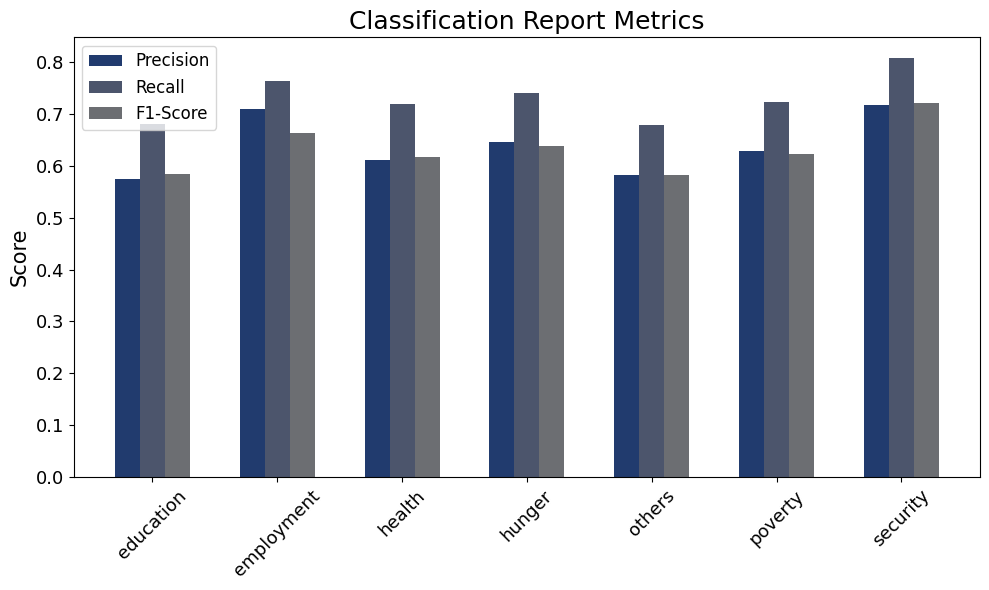

In [139]:
import matplotlib.pyplot as plt

# Initialize an empty dictionary to store the classification report metrics
classification_report_metrics = {}

# Print the classification report for each label separately and store the metrics
for label_idx, label_name in enumerate(mlb.classes_):
    print(f"Classification Report for label: {label_name}")
    report = classification_report(y_test_binary[:, label_idx], predicted_labels_binary[:, label_idx], output_dict=True)
    classification_report_metrics[label_name] = report

# Extract precision, recall, and f1-score for each label
precision = {label: report['weighted avg']['precision'] for label, report in classification_report_metrics.items()}
recall = {label: report['weighted avg']['recall'] for label, report in classification_report_metrics.items()}
f1_score = {label: report['weighted avg']['f1-score'] for label, report in classification_report_metrics.items()}

# Plot the precision, recall, and f1-score for each label
fig, ax = plt.subplots(figsize=(10, 6))

labels = list(precision.keys())
precision_values = list(precision.values())
recall_values = list(recall.values())
f1_score_values = list(f1_score.values())

x = range(len(labels))
width = 0.2

ax.bar(x, precision_values, width, label='Precision')
ax.bar([i + width for i in x], recall_values, width, label='Recall')
ax.bar([i + 2 * width for i in x], f1_score_values, width, label='F1-Score')

ax.set_xticks([i + width for i in x])
ax.set_xticklabels(labels, rotation=45)
ax.set_ylabel('Score')
ax.set_title('Classification Report Metrics')
ax.legend()

plt.tight_layout()
plt.show()


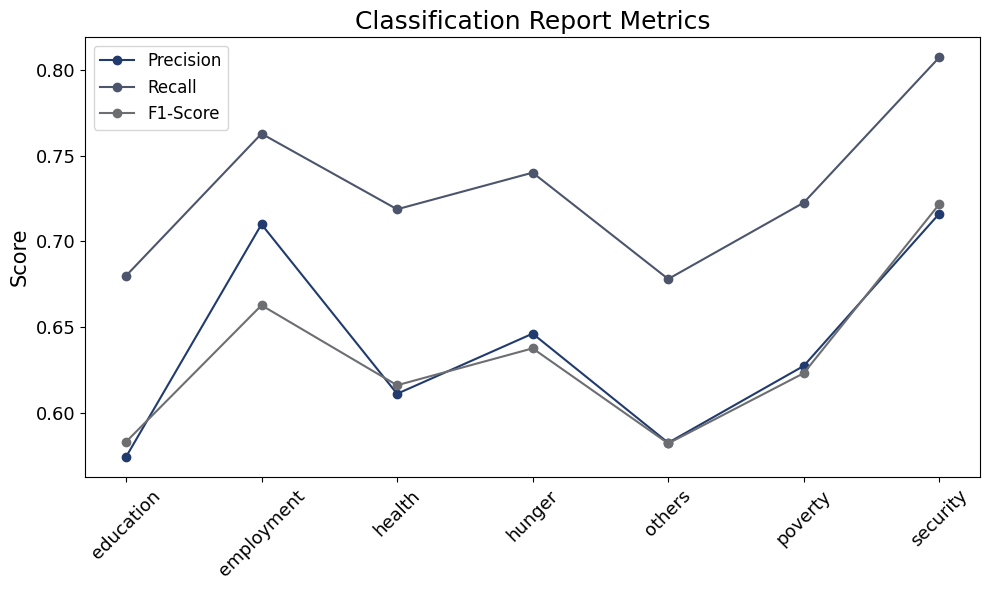

In [140]:
# Plot the precision, recall, and f1-score for each label
fig, ax = plt.subplots(figsize=(10, 6))

labels = list(precision.keys())
precision_values = list(precision.values())
recall_values = list(recall.values())
f1_score_values = list(f1_score.values())

x = range(len(labels))

# Plot precision
ax.plot(x, precision_values, label='Precision', marker='o')

# Plot recall
ax.plot(x, recall_values, label='Recall', marker='o')

# Plot F1-score
ax.plot(x, f1_score_values, label='F1-Score', marker='o')

ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45)
ax.set_ylabel('Score')
ax.set_title('Classification Report Metrics')
ax.legend()

plt.tight_layout()
plt.show()


/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


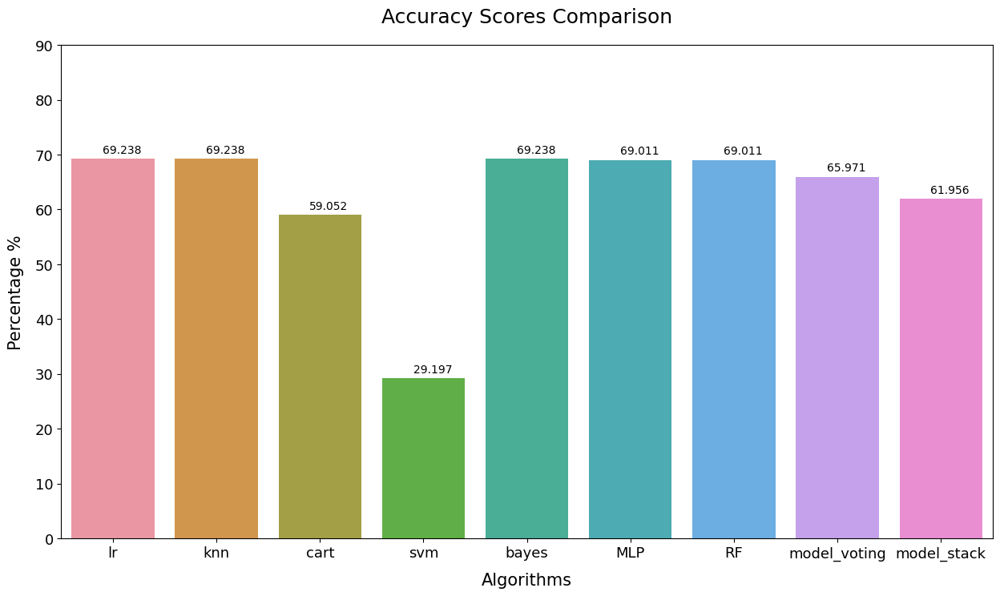

In [141]:
plt.figure(figsize=(15,8))
sns.set_palette('cividis')
ax=sns.barplot(x=list(accuracies.keys()),y=list(accuracies.values()))
plt.yticks(np.arange(0,100,10))
plt.ylabel('Percentage %',labelpad=10)
plt.xlabel('Algorithms',labelpad=10)
plt.title('Accuracy Scores Comparison',pad=20)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x(), p.get_height()),xytext=(p.get_x()+0.3,p.get_height()+1.02))
plt.show()
#plt.savefig('accuracy_scores_comparison_stacktheme.png')

In [142]:
# df

In [143]:
label_counts = df['Bertscore_Labels'].value_counts()
num_unique_labels = len(label_counts)
print("Number of unique labels:", num_unique_labels)


Number of unique labels: 18


In [144]:
import numpy as np
import pandas as pd
from sklearn.utils import resample
from sklearn.metrics import f1_score, recall_score, accuracy_score, precision_score, balanced_accuracy_score

# Define the number of iterations
num_iterations = 5

# Initialize lists to store metrics for each iteration
f1_scores = []
recall_scores = []
balanced_accuracy_scores = []
accuracy_scores = []
precision_scores = []

for i in range(num_iterations):
    # Sample 90% of the testing data randomly with replacement
    x_test_sampled, y_test_sampled = resample(x_test, y_test_encoded, replace=True, n_samples=int(0.9 * len(x_test)))
    
    # Predictions for sampled data
    predictions_sampled = {
        'Gaussian Naive Bayes': bayes.predict(x_test_sampled),
        'Logistic Regression': lr.predict(x_test_sampled),
        'K-Nearest Neighbors': knn.predict(x_test_sampled),
        'Decision Tree': cart.predict(x_test_sampled),
        'Support Vector Machine': svm.predict(x_test_sampled),
        'Random Forest': RF.predict(x_test_sampled),
        'MLP (Multi-Layer Perceptron)': MLP.predict(x_test_sampled),
        'Voting Classifier': model_voting.predict(x_test_sampled),
        'Stacking Classifier': model_stack.predict(x_test_sampled)
    }
    
    # Ensure predictions are in the correct format (list of lists)
    for name, pred in predictions_sampled.items():
        # Convert predictions to the same format as y_test
        # pred = [mlb.inverse_transform([p])[0] for p in pred]
        # predictions_sampled[name] = pred


        # Ensure predictions are in the correct format (list of lists)
        # for name, pred in predictions_sampled.items():
        # Convert predictions to the same format as y_test
        pred_transformed = mlb.inverse_transform(pred)
        predictions_sampled[name] = pred_transformed

    
    # Metrics computation for sampled data
    metrics_sampled = {}
    for name, pred in predictions_sampled.items():
        pred_encoded = mlb.transform(pred)
        
        f1 = f1_score(y_test_sampled, pred_encoded, average='weighted')
        recall = recall_score(y_test_sampled, pred_encoded, average='weighted')
        # Compute balanced accuracy for each label and then average
        balanced_accuracies = [balanced_accuracy_score(y_test_sampled[:, j], pred_encoded[:, j]) for j in range(y_test_sampled.shape[1])]
        balanced_accuracy = np.mean(balanced_accuracies)
        accuracy = accuracy_score(y_test_sampled, pred_encoded)
        precision = precision_score(y_test_sampled, pred_encoded, average='weighted')
        
        metrics_sampled[name] = {
            'F1 Score': f1,
            'Recall': recall,
            'Balanced Accuracy': balanced_accuracy,
            'Accuracy': accuracy,
            'Precision': precision
        }
    
    # Store metrics for each iteration
    f1_scores.append([metrics_sampled[name]['F1 Score'] for name in predictions_sampled.keys()])
    recall_scores.append([metrics_sampled[name]['Recall'] for name in predictions_sampled.keys()])
    balanced_accuracy_scores.append([metrics_sampled[name]['Balanced Accuracy'] for name in predictions_sampled.keys()])
    accuracy_scores.append([metrics_sampled[name]['Accuracy'] for name in predictions_sampled.keys()])
    precision_scores.append([metrics_sampled[name]['Precision'] for name in predictions_sampled.keys()])

# Create DataFrames for the results
results_f1 = pd.DataFrame(f1_scores, columns=predictions_sampled.keys())
results_recall = pd.DataFrame(recall_scores, columns=predictions_sampled.keys())
results_balanced_accuracy = pd.DataFrame(balanced_accuracy_scores, columns=predictions_sampled.keys())
results_accuracy = pd.DataFrame(accuracy_scores, columns=predictions_sampled.keys())
results_precision = pd.DataFrame(precision_scores, columns=predictions_sampled.keys())

# Calculate standard deviations of metrics
std_f1 = results_f1.std()
std_recall = results_recall.std()
std_balanced_accuracy = results_balanced_accuracy.std()
std_accuracy = results_accuracy.std()
std_precision = results_precision.std()

# Calculate percentiles of metrics
percentiles = [0.025, 0.975]
percentile_values_f1 = results_f1.quantile(q=percentiles)
percentile_values_recall = results_recall.quantile(q=percentiles)
percentile_values_balanced_accuracy = results_balanced_accuracy.quantile(q=percentiles)
percentile_values_accuracy = results_accuracy.quantile(q=percentiles)
percentile_values_precision = results_precision.quantile(q=percentiles)


# Create DataFrames for standard deviations and percentiles
results_std = pd.DataFrame({'F1 Score': std_f1, 'Recall': std_recall, 'Balanced Accuracy': std_balanced_accuracy, 'Accuracy': std_accuracy, 'Precision': std_precision})
results_percentiles = pd.concat([percentile_values_f1, percentile_values_recall, percentile_values_balanced_accuracy, percentile_values_accuracy, percentile_values_precision], keys=['F1 Score', 'Recall', 'Balanced Accuracy', 'Accuracy', 'Precision'], axis=1)

# Print or use the DataFrames for the results
print("Standard Deviations:")
print(results_std)
print("\nPercentiles:")
print(results_percentiles)


/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

Standard Deviations:
                              F1 Score    Recall  Balanced Accuracy  Accuracy  \
Gaussian Naive Bayes          0.006187  0.006584           0.000000  0.006144   
Logistic Regression           0.006187  0.006584           0.000000  0.006144   
K-Nearest Neighbors           0.007903  0.007300           0.002140  0.005791   
Decision Tree                 0.004587  0.004790           0.005160  0.007333   
Support Vector Machine        0.006187  0.006584           0.000000  0.006144   
Random Forest                 0.005972  0.005269           0.003998  0.007188   
MLP (Multi-Layer Perceptron)  0.005908  0.006498           0.000063  0.006572   
Voting Classifier             0.006705  0.006055           0.001134  0.005420   
Stacking Classifier           0.005866  0.006604           0.000961  0.005555   

                              Precision  
Gaussian Naive Bayes           0.005344  
Logistic Regression            0.005344  
K-Nearest Neighbors            0.006218  


/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

[Voting] ..................... (3 of 7) Processing cart, total=   0.3s
[Voting] ..................... (3 of 7) Processing cart, total=   0.3s
[Voting] ..................... (3 of 7) Processing cart, total=   0.3s
[Voting] ..................... (3 of 7) Processing cart, total=   0.3s
[Voting] ..................... (3 of 7) Processing cart, total=   0.3s
[Voting] ..................... (3 of 7) Processing cart, total=   0.3s
[Voting] ..................... (3 of 7) Processing cart, total=   0.4s
[Voting] ...................... (4 of 7) Processing svm, total=  46.9s
[Voting] .................... (6 of 7) Processing bayes, total=   0.0s
[Voting] ...................... (7 of 7) Processing MLP, total=   4.4s
[Voting] ...................... (4 of 7) Processing svm, total=  42.6s
[Voting] .................... (6 of 7) Processing bayes, total=   0.0s
[Voting] ...................... (2 of 7) Processing knn, total=   0.0s
[Voting] ...................... (7 of 7) Processing MLP, total=   4.1s
[Votin

In [419]:
df['Keysector_bert2'].unique()

array(['others', 'security|hunger|employment|education|health|poverty',
       'security|hunger|employment|education|poverty',
       'security|hunger|employment', 'security|employment|hunger|poverty',
       'employment|poverty', 'security',
       'security|hunger|employment|education|health',
       'education|employment|hunger|poverty', 'education|employment',
       'employment', 'security|employment', 'employment|hunger|poverty',
       'security|employment|poverty', 'education|employment|poverty',
       'education|security|employment|poverty', 'hunger|employment'],
      dtype=object)

In [89]:
df.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'textid', 'Date', 'Views', 'sourcetype',
       'alltext', 'Text_emt', 'Text_emj', 'Text_langue', 'Text_translate',
       'Text_langue2', 'Text_lower', 'Text_punct', 'Text_tags', 'Text_chat',
       'Text_spell', 'Text_langue3', 'Text_translate2', 'Text_token',
       'Text_stop', 'Text_stem', 'Text_lemma', 'llama2_labelone',
       'cluster_labelone', 'llama2_labelone10', 'cluster_labelone10',
       'Text_lemma2', 'Predicted_Categories', 'Predicted_Categories2',
       'Similarity_Score', 'Keysector', 'Bertscore_Labels', 'Keysector_bert',
       'Bertscore_Labels2'],
      dtype='object')

In [92]:
# df['Keysector'][20]
security_records = df[df['Predicted_Categories2'].str.contains('security')]
security_records_text = security_records['Text_lemma'].unique()
security_records

,Unnamed: 0.1,Unnamed: 0,textid,Date,Views,sourcetype,alltext,Text_emt,Text_emj,Text_langue,...,llama2_labelone10,cluster_labelone10,Text_lemma2,Predicted_Categories,Predicted_Categories2,Similarity_Score,Keysector,Bertscore_Labels,Keysector_bert,Bertscore_Labels2
50,50,50,84,2019-12-19 09:04:12+00:00,1,twitter,@jared_okungu I am traveling across Africa sol...,@jared_okungu I am traveling across Africa sol...,@jared_okungu I am traveling across Africa sol...,en,...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,soci principle organization session university...,education|health,security,0.0,others,others,others,[others]
61,61,61,6630,2021-07-11 15:22:43+00:00,12,twitter,Join us at 18:00 this evening on our Twitter S...,Join us at 18:00 this evening on our Twitter S...,Join us at 18:00 this evening on our Twitter S...,en,...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,fleeing climate change real environmental disa...,poverty|hunger|security|health,security,0.0,others,others,others,[others]
67,67,67,12878,2011-08-24,603,youtube,Sting - Fortress Around Your Heart (Option T...,Sting - Fortress Around Your Heart (Option T...,Sting - Fortress Around Your Heart (Option T...,en,...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,illegal item found destroyed jfk airport insid...,poverty|health,security,0.0,others,others,others,[others]
91,91,91,22112,2023-07-24,8,youtube,Climate Change | African Economic Outlook 20...,Climate Change | African Economic Outlook 20...,Climate Change | African Economic Outlook 20...,en,...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,crisis mali dw documentary dw documentary mont...,poverty|education|security|health,security,0.0,others,others,others,[others]
102,102,102,8415,2022-03-24 09:00:17+00:00,2,twitter,ðŸŒ Africa is most in need of innovative solu...,ðŸŒ Africa is most in need of innovative solu...,ðŸŒ Africa is most in need of innovative solu...,en,...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,hailee steinfeld girl official videoconfusion ...,employment|hunger|health,security,0.0,others,education|poverty|hunger|security|health|emplo...,others,"[education, poverty, hunger, security, health,..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27456,27456,27456,1957,2019-09-20 13:29:46+00:00,1,twitter,@AcetforAfrica @RobFloydACET Great analysis! O...,@AcetforAfrica @RobFloydACET Great analysis! O...,@AcetforAfrica @RobFloydACET Great analysis! O...,en,...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,great analysis one issue limiting share blende...,hunger|education|health,security,0.0,others,education|poverty|hunger|security|health|emplo...,others,"[education, poverty, hunger, security, health,..."
27472,27472,27472,18488,2020-08-24,756,youtube,How to Speak by MIT OpenCourseWare 3 years a...,How to Speak by MIT OpenCourseWare 3 years a...,How to Speak by MIT OpenCourseWare 3 years a...,en,...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,speak mit opencourseware year ago hour minute ...,health,security,0.0,others,others,others,[others]
27494,27494,27494,21647,2022-08-24,163,youtube,China’s economy: what’s its weak spot? by Th...,China’s economy: what’s its weak spot? by Th...,China’s economy: what’s its weak spot? by Th...,en,...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,china economy whats weak spot economist year a...,hunger|education|security|health,security,0.0,others,others,others,[others]
27536,27536,27536,5831,2021-10-08 13:32:11+00:00,1,twitter,#SouthAfricaâ€™s and #Africaâ€™s development c...,#SouthAfricaâ€™s and #Africaâ€™s development c...,#SouthAfricaâ€trade_marks and #Africaâ€trade_m...,en,...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,trademark trademark development challenge reso...,employment|poverty|hunger|health,security,0.0,others,education|poverty|hunger|security|health|emplo...,others,"[education, pover

In [93]:
security_records['Text_lemma2'].iloc[100]

'r kelly unhinged interview gayle king columnist say cbs news reactionsm'

In [95]:
# df_health=health_records[['Text_translate2','Keysector2','Similarity_Scores']]

In [97]:
# df['Keysector'][20]
health_records = df[df['Predicted_Categories2'].str.contains('health')]
health_records_text = health_records['Text_lemma'].unique()
health_records

,Unnamed: 0.1,Unnamed: 0,textid,Date,Views,sourcetype,alltext,Text_emt,Text_emj,Text_langue,...,llama2_labelone10,cluster_labelone10,Text_lemma2,Predicted_Categories,Predicted_Categories2,Similarity_Score,Keysector,Bertscore_Labels,Keysector_bert,Bertscore_Labels2
2,2,2,4717,2021-11-17 16:39:01+00:00,2,twitter,Blinken is actually on a social vist to B. Hus...,Blinken is actually on a social vist to B. Hus...,Blinken is actually on a social vist to B. Hus...,en,...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,th class fa study question paper r viewsth cla...,poverty|hunger|health,health,0.0,others,others,others,[others]
5,5,5,24985,2023-03-24,571,youtube,"Lies, Politics and Democracy: Alyssa Farah G...","Lies, Politics and Democracy: Alyssa Farah G...","Lies, Politics and Democracy: Alyssa Farah G...",en,...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,anxiety hot honestrox play shortmy reactionsk,poverty|hunger|education|health,health,0.0,others,others,others,[others]
8,8,8,21584,2023-08-20,674,youtube,"Creator Of ""Hebrews To Negroes"" Film REACTS ...","Creator Of ""Hebrews To Negroes"" Film REACTS ...","Creator Of ""Hebrews To Negroes"" Film REACTS ...",en,...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,medium ownership diversity symposium federal c...,hunger|health,health,0.0,others,others,others,[others]
11,11,11,21732,2022-08-24,92,youtube,The law that broke US immigration by Vox 1 y...,The law that broke US immigration by Vox 1 y...,The law that broke US immigration by Vox 1 y...,en,...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,kenyan begin demolishing west sahrawi republic...,hunger|health,health,0.0,others,others,others,[others]
17,17,17,23535,2023-08-23,802,youtube,TOP 10 Auditions That Got Simon Cowell's GOL...,TOP 10 Auditions That Got Simon Cowell's GOL...,TOP 10 Auditions That Got Simon Cowell's GOL...,en,...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,street quiz funny video funny african video af...,poverty|health,health,0.0,others,others,others,[others]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27529,27529,27529,18259,2018-08-24,352,youtube,Vasco Rossi - Colpa D'Alfredo (Live Modena P...,Vasco Rossi - Colpa D'Alfredo (Live Modena P...,Vasco Rossi - Colpa D'Alfredo (Live Modena P...,en,...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,vasco rossi colpa dalfredo live modena park co...,security|health,health,0.0,others,others,others,[others]
27531,27531,27531,22817,2015-08-24,424,youtube,Ariana Grande - Problem (Live on the Honda S...,Ariana Grande - Problem (Live on the Honda S...,Ariana Grande - Problem (Live on the Honda S...,en,...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,ariana grande problem live honda stage iheartr...,hunger|education|health,health,0.0,others,others,others,[others]
27533,27533,27533,7784,2022-01-29 13:03:31+00:00,0,twitter,@Jistal21 @Daniel79533690 @NotFromTheLeft @abc...,@Jistal21 @Daniel79533690 @NotFromTheLeft @abc...,@Jistal21 @Daniel79533690 @NotFromTheLeft @abc...,en,...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,doctor adhere biopsychosocial model extremely ...,hunger|education|health,health,0.0,others,education|poverty|hunger|security|health,others,"[education, poverty, hunger, security, health]"
27538,27538,27538,20678,2021-08-24,200,youtube,Top 10 Most Important Global Issues of Today...,Top 10 Most Important Global Issues of Today...,Top 10 Most Important Global Issues of Today...,en,...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,top important global issue today world issue n...,poverty|hunger|education|security|health,health,0.0,others,others,others,[others]


In [98]:
health_records.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'textid', 'Date', 'Views', 'sourcetype',
       'alltext', 'Text_emt', 'Text_emj', 'Text_langue', 'Text_translate',
       'Text_langue2', 'Text_lower', 'Text_punct', 'Text_tags', 'Text_chat',
       'Text_spell', 'Text_langue3', 'Text_translate2', 'Text_token',
       'Text_stop', 'Text_stem', 'Text_lemma', 'llama2_labelone',
       'cluster_labelone', 'llama2_labelone10', 'cluster_labelone10',
       'Text_lemma2', 'Predicted_Categories', 'Predicted_Categories2',
       'Similarity_Score', 'Keysector', 'Bertscore_Labels', 'Keysector_bert',
       'Bertscore_Labels2'],
      dtype='object')

In [100]:
df_health=health_records[['Text_translate2','Predicted_Categories']]
df_health

,Text_translate2,Predicted_Categories
2,blinken is actually on a social vist to b huss...,poverty|hunger|health
5,lies politics and democracy alyssa farah griff...,poverty|hunger|education|health
8,creator of hebrews to negroes film reacts to k...,hunger|health
11,the law that broke us immigration by vox year ...,hunger|health
17,top auditions that got simon cowells golden bu...,poverty|health
...,...,...
27529,vasco rossi colpa dalfredo live modena park co...,security|health
27531,ariana grande problem live on the honda stage ...,hunger|education|health
27533,most doctors adhere to the biopsychosocial mod...,hunger|education|health
27538,top most important global issues of today the ...,poverty|hunger|education|security|health


In [101]:
# df_health['Text_translate2']['Similarity_Scores'].tolist()
# df_health[['Text_translate2', 'Similarity_Scores']][0]
health_records['Text_translate2'].iloc[1]
# health_records['Similarity_Scores'].iloc[1]

'lies politics and democracy alyssa farah griffin interviewconfusion frontline by frontline pbs official months ago hour minutes viewsnot foundno reactionsk views'

In [104]:
# df['Predicted_Categories2']

In [255]:
# df.to_csv('../llamathemes_bert.csv')

In [105]:
# df.to_csv('D:/senego/dataafrica/skipkmeans.csv')
# df.to_csv('./clustering/berthdbscan.csv')
# df2=pd.read_csv('../llamathemes_bert.csv')
# df2.shape

In [147]:
# # import pandas as pd

# # # Define specific words
# # specific_words = ['poverty', 'education', 'hunger', 'security', 'employment', 'health']

# # # Create an empty list to store dataframes
# # dfs = []

# # # Create dataframes for each specific word
# # for word in specific_words:
# #     # Filter records containing the specific word
# #     records = df[df['Predicted_Categories'].str.contains(word)]
# #     # Get unique text for each record
# #     records_text = records['Text_translate2'].unique()
# #     # Create dataframe
# #     df_word = pd.DataFrame({'Text_translate2': records_text})
# #     # Add column for specific value
# #     df_word['Label'] = word  # Set label column to the specific word
# #     # Append dataframe to list
# #     dfs.append(df_word)

# # # Concatenate all dataframes vertically
# # merged_df = pd.concat(dfs, ignore_index=True)

# # # Save the merged dataframe as a CSV file
# # merged_df.to_csv('merged_records.csv', index=False)
# df=df2.copy()
# import pandas as pd

# # Define specific words
# specific_words = ['poverty', 'education', 'hunger', 'security', 'employment', 'health']

# # Create an empty list to store dataframes
# dfs = []

# # Create dataframes for each specific word
# for word in specific_words:
#     # Filter records containing the specific word
#     records = df[df['Predicted_Categories'].str.contains(word)]
#     # Get unique text for each record
#     records_text = records['Text_translate2'].unique()
#     # Create dataframe
#     df_word = pd.DataFrame({'Text_translate2': records_text})
#     # Add columns from the original DataFrame
#     for col in ['textid', 'Date', 'Views', 'sourcetype', 'alltext', 'Text_lemma', 'llama2_labelone',
#                 'cluster_labelone', 'llama2_labelone10', 'cluster_labelone10', 'Text_lemma2',
#                 'Predicted_Categories', 'Bertscore_Labels']:
#         df_word[col] = records[col].iloc[0]  # Assuming all records share the same values for these columns
#     # Add column for specific value
#     df_word['Label'] = word  # Set label column to the specific word
#     # Append dataframe to list
#     dfs.append(df_word)

# # Concatenate all dataframes vertically
# merged_df = pd.concat(dfs, ignore_index=True)

# # Save the merged dataframe as a CSV file
# merged_df.to_csv('merged_records.csv', index=False)


In [204]:
# import pandas as pd
# df=df2.copy
# # Define specific words
# specific_words = ['poverty', 'education', 'hunger', 'security', 'employment', 'health']

# # Create an empty list to store dataframes
# dfs = []

# # Create dataframes for each specific word
# for word in specific_words:
#     # Filter records containing the specific word
#     records = df[df['Predicted_Categories'].str.contains(word)]
#     # Get unique text for each record
#     records_text = records['Text_translate2'].dropna().unique()  # Remove NaN values
#     if len(records_text) > 0:  # Check if there are non-NaN records
#         # Create dataframe
#         df_word = pd.DataFrame({'Text_translate2': records_text,})
#         # Add columns from the original DataFrame
#         for col in ['textid', 'Date', 'Views', 'sourcetype', 'alltext', 'Text_lemma', 'llama2_labelone',
#                     'cluster_labelone', 'llama2_labelone10', 'cluster_labelone10', 'Text_lemma2',
#                     'Predicted_Categories', 'Bertscore_Labels']:
#             df_word[col] = records[col].iloc[0]  # Assuming all records share the same values for these columns
#         # Add column for specific value
#         df_word['Label'] = word  # Set label column to the specific word
#         # Append dataframe to list
#         dfs.append(df_word)

# # Concatenate all non-empty dataframes vertically
# if dfs:
#     merged_df = pd.concat(dfs, ignore_index=True)

#     # Save the merged dataframe as a CSV file
#     merged_df.to_csv('merged_records.csv', index=False)
# else:
#     print("No non-empty dataframes to merge.")


In [19]:
df.columns

Index(['Unnamed: 0', 'textid', 'Date', 'Views', 'sourcetype', 'alltext',
       'Text_emt', 'Text_emj', 'Text_langue', 'Text_translate', 'Text_langue2',
       'Text_lower', 'Text_punct', 'Text_tags', 'Text_chat', 'Text_spell',
       'Text_langue3', 'Text_translate2', 'Text_token', 'Text_stop',
       'Text_stem', 'Text_lemma', 'berttopic2', 'cluster_id2',
       'llama2_labelone10', 'cluster_labelone10', 'cluster_id',
       'llama2_labelone', 'cluster_labelone', 'Unnamed: 0', 'Text_lemma2',
       'Bertscore_Labels', 'Final_Labels', 'Predicted_Categories3'],
      dtype='object')

In [20]:
import pandas as pd

# df = df2.copy()

# Define specific words
specific_words = ['poverty', 'education', 'hunger', 'security', 'employment', 'health']

# Create an empty list to store dataframes
dfs = []

# Create dataframes for each specific word
for word in specific_words:
    # Filter records containing the specific word
    records = df[df['Predicted_Categories3'].str.contains(word)]
    # Get unique text for each record
    for index, record in records.iterrows():  # Iterate through each record
        records_text = record['Text_translate2']
        if pd.notnull(records_text):  # Check if the value is not NaN
            # Create dataframe
            df_word = pd.DataFrame({'Text_translate2': [records_text]})
            # Add columns from the original DataFrame
            for col in ['textid', 'Date', 'Views', 'sourcetype', 'alltext', 'Text_lemma', 'llama2_labelone',
                        'cluster_labelone', 'llama2_labelone10', 'cluster_labelone10', 'Text_lemma2',
                        'Predicted_Categories3', 'Final_Labels', 'Bertscore_Labels']:
                df_word[col] = record[col]  # Assign values from the current record
            # Add column for specific value
            df_word['Label'] = word  # Set label column to the specific word
            # Append dataframe to list
            dfs.append(df_word)

# Concatenate all non-empty dataframes vertically
if dfs:
    merged_df = pd.concat(dfs, ignore_index=True)

    # Save the merged dataframe as a CSV file
    merged_df.to_csv('merged_records.csv', index=False)
else:
    print("No non-empty dataframes to merge.")


In [21]:
merged_df.columns

Index(['Text_translate2', 'textid', 'Date', 'Views', 'sourcetype', 'alltext',
       'Text_lemma', 'llama2_labelone', 'cluster_labelone',
       'llama2_labelone10', 'cluster_labelone10', 'Text_lemma2',
       'Predicted_Categories3', 'Final_Labels', 'Bertscore_Labels', 'Label'],
      dtype='object')

In [22]:
merged_df.shape

(20208, 16)

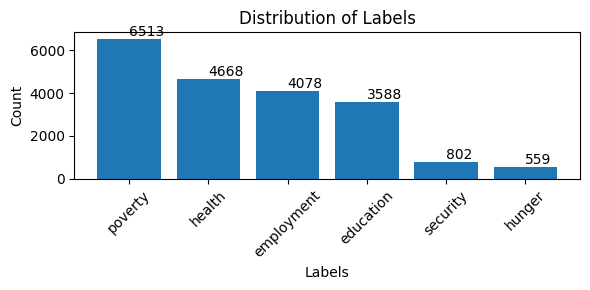

In [23]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming merged_df is your DataFrame containing the 'Label' column

# Count occurrences of each label
label_counts = merged_df['Label'].value_counts()

# Plotting the bar graph
plt.figure(figsize=(6, 3))
bars = plt.bar(label_counts.index, label_counts.values)

# Adding labels above the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 1), va='bottom')

plt.xlabel('Labels')
plt.ylabel('Count')
plt.title('Distribution of Labels')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()


/tmp/ipykernel_2943911/2226464345.py:11: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right", fontsize=12)


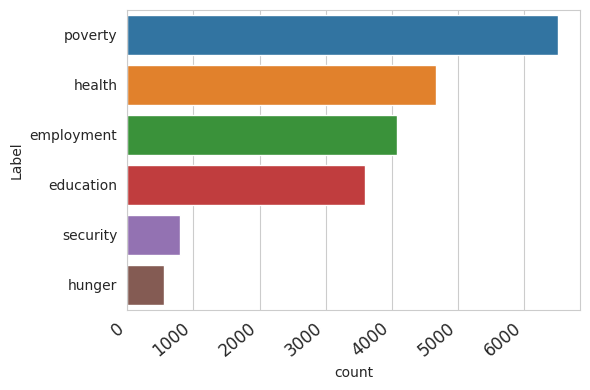

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style
sns.set_style('whitegrid')

# Plot the count of each label
plt.figure(figsize=(6, 4))
# df['Keysectors'] = df['Keysector'].str.split('|', expand=True).stack().reset_index(drop=True)
ax = sns.countplot(y='Label', data=merged_df, order=merged_df['Label'].value_counts().index)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right", fontsize=12)
plt.tight_layout()
plt.show()


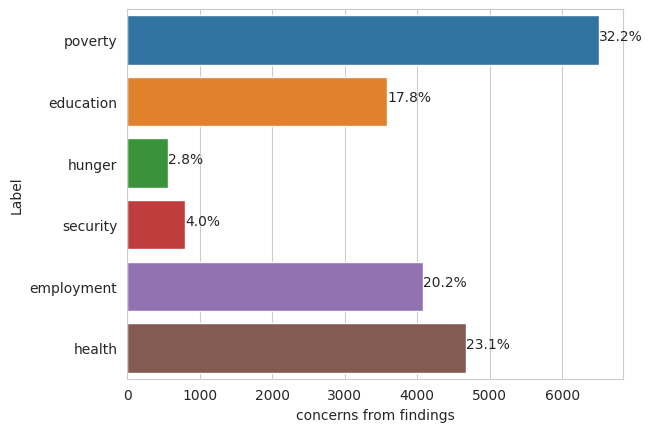

In [26]:
# Filter out 'others' from the DataFrame
# df_filtered = df[df['Predicted_Categories2'] != 'others']

# Count occurrences of each label
# label_counts = df_filtered['Keysector'].str.split('|', expand=True).stack().value_counts()

# Calculate percentages
# label_percentages = (label_counts / label_counts.sum()) * 100


ax = sns.countplot(y="Label", data=merged_df)
#plt.title('Distribution of  Configurations')
plt.xlabel('concerns from findings')

total = len(merged_df['Label'])
for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_width()/total)
        x = p.get_x() + p.get_width() + 0.02
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y))

plt.show()

In [46]:
df=merged_df.copy()

In [47]:
df.columns

Index(['Text_translate2', 'textid', 'Date', 'Views', 'sourcetype', 'alltext',
       'Text_lemma', 'llama2_labelone', 'cluster_labelone',
       'llama2_labelone10', 'cluster_labelone10', 'Text_lemma2',
       'Predicted_Categories3', 'Final_Labels', 'Bertscore_Labels', 'Label'],
      dtype='object')

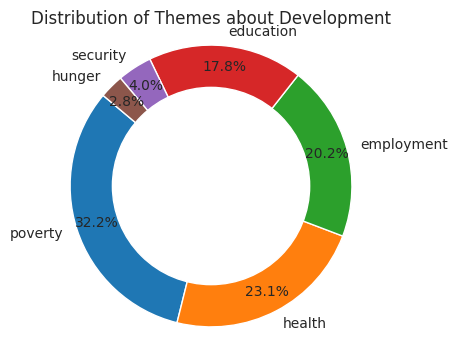

In [48]:
import matplotlib.pyplot as plt

# Calculate category counts
name_counts = df['Label'].value_counts()

# Calculate total count
total_count = name_counts.sum()

# Calculate percentage for each category
percentages = [(count / total_count) * 100 for count in name_counts]

# Create a pie chart
plt.figure(figsize=(4, 4))
plt.pie(name_counts, labels=name_counts.index, autopct='%1.1f%%', startangle=140, pctdistance=0.85)

# Draw a circle at the center of pie to make it look like a donut
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

# Add a title
plt.title('Distribution of Themes about Development')

# Equal aspect ratio ensures that pie is drawn as a circle.
plt.axis('equal')

# Show the plot
plt.show()


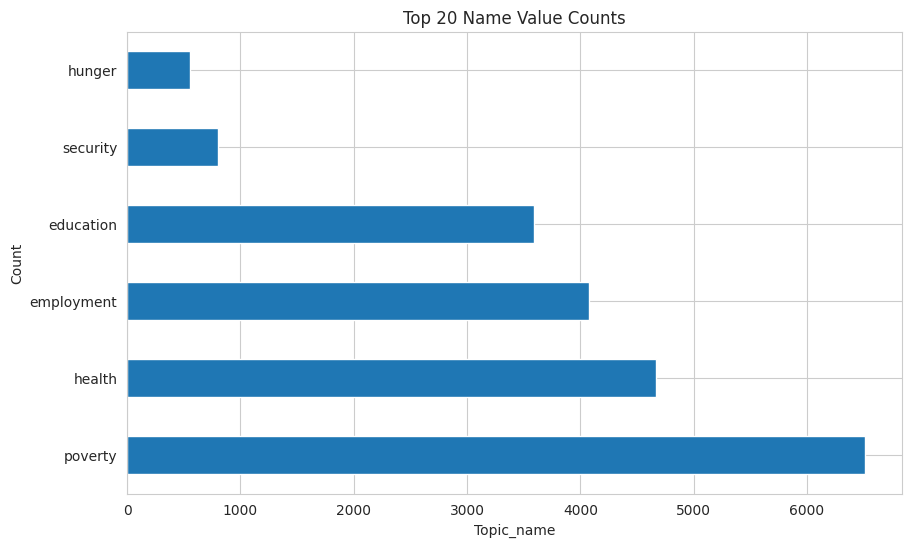

In [49]:
name_counts = df['Label'].value_counts()
# Select the top 20 name_counts
top_name_counts = name_counts.head(20)

# Create a bar plot for the top 20 name counts
plt.figure(figsize=(10, 6))
top_name_counts.plot(kind='barh')
plt.title('Top 20 Name Value Counts')
plt.xlabel('Topic_name')
plt.ylabel('Count')
plt.show()

In [31]:
# df2=df.copy()
# df=df2.copy()

In [32]:
# df=merged_df.copy()
df['Label']

0        poverty
1        poverty
2        poverty
3        poverty
4        poverty
          ...   
20203     health
20204     health
20205     health
20206     health
20207     health
Name: Label, Length: 20208, dtype: object

In [ ]:
# Remove brackets from values in the 'Label' column
# df['Label2'] = df['Label'].apply(lambda x: ', '.join(x))
df.shape

In [50]:
# import pandas as pd
# import re

# # Assuming df is your DataFrame and 'llama2_labelone' is the column of interest
# # Ensure all elements are strings
# df['llama2_labelone'] = df['llama2_labelone'].astype(str)

# # Extract values within double quotes using regular expressions and create a set to get unique values
# unique_values_set = set()
# _ = df['llama2_labelone'].apply(lambda x: unique_values_set.update(re.findall(r'"([^"]*)"', x)))

# # Get unique values
# unique_values = list(unique_values_set)

# # Print unique values
# # print(unique_values)
def extract_topic(text):
    if text is None:
        return None
    exclusion_phrases = [
        "As a responsible", "It is important", "Therefore", "Remember", "I hope you understand", "I cannot provide a",
        "I apologize", "Please provide me with more", "If you have any other", "Instead", "It's important to"
    ]
    if any(phrase in text for phrase in exclusion_phrases):
        return None
    if text.startswith(('Sure!', 'Based on the keywords provided', 'Certainly! Based on the keywords provided')):
        # Regular expression to extract text within quotes
        topic_match = re.search(r'"(.*?)"', text)
        if topic_match:
            return topic_match.group(1)
        else:
            return text
    else:
        return text

# Apply the function to the 'llama2_labelone' column
df['llama2_labelone'] = df['llama2_labelone'].apply(extract_topic)

# Display unique values in the 'llama2_labelone' column
df['llama2_labelone'].unique()


array(['Visa Application Process in Australia for African Nationals',
       None, 'Science Exam Questions and Reactions',
       'Earthquake in Turkey and Syria', 'Hip Hop Instrumentals',
       '"Nationbuilding through Sectoral Fostering and Intractable Cohesion"',
       'Rising Enterprises: Challenges & Solutions', 'Geography Quiz',
       'Celebrity Reactions', 'Short Play', 'Wildlife Safari',
       'Latin Music', 'Twitter Q&A', '"Audio Confusion and Reactions"',
       '"America\'s Got Talent Auditions"',
       '"African Comedian Reacts to Ragghana Street Funny Quiz Video"',
       'Artist', 'Cricket Match Fails on TikTok',
       '"Macky TV Sonko Reaction - Sall Fvrier Sosy GManetwork Sur"',
       '"Afrika Short Not Play Market Nshakukunda Reaction Challenge"',
       'Independence Note Form Political History Challenge Economic Development Faltering Makhura',
       '"Streamed Parliament Reaction in February"',
       '"Cuba faces shortages and struggles to survive with diabe

In [34]:
# unique_values

In [ ]:
# import pandas as pd
# import re

# # Assuming df is your DataFrame and 'llama2_labelone' is the column of interest
# # Ensure all elements are strings
# df['llama2_labelone'] = df['llama2_labelone'].astype(str)

# # Extract values within double quotes using regular expressions
# df['llama2_labelone'] = df['llama2_labelone'].apply(lambda x: re.findall(r'"([^"]*)"', x))

# # Explode the lists into separate rows
# df_exploded = df.explode('llama2_labelone')

# # Get unique values
# unique_values = df_exploded['llama2_labelone'].unique()
# # 
# # Print unique values
# print(unique_values)



In [ ]:
# df_exploded['llama2_labelone']

In [ ]:
df.shape

In [ ]:
# df=df_exploded.copy()
# df['llama2_labelone'].unique()

In [ ]:
# df['llama2_labelone']
df.shape

In [35]:
name_counts = df['llama2_labelone'].value_counts()
# Select the top 20 name_counts
top_name_counts = name_counts.head(20)
top_name_counts
# # Create a bar plot for the top 20 name counts
# plt.figure(figsize=(16, 6))
# top_name_counts.plot(kind='barh')
# plt.title('Top 20 Name Value Counts')
# plt.xlabel('Topic_name')
# plt.ylabel('Count')
# plt.show()

llama2_labelone
Visa Application Process in Australia for African Nationals                                   8082
Science Exam Questions and Reactions                                                           747
Overcoming Anxiety Disorder                                                                    411
Hacking for Business                                                                           337
Entrepreneurial Innovation Challenge                                                           208
"Spiritual Infertility Consultation"                                                           149
"SNL Reactions: Dangond & Silvestre's Monologue Justice"                                       125
Trademarks                                                                                     119
"Spiritualist Travels Solve Infertility with Charm and Humanity"                               112
Corruption and Governance in Developing Countries                                            

In [ ]:
# df=merged_df.copy()
# df.columns

In [ ]:
# Remove brackets from values in the 'Label' column
# df['Label2'] = df['Label'].apply(lambda x: ', '.join(x))

# df['Label']
df.columns

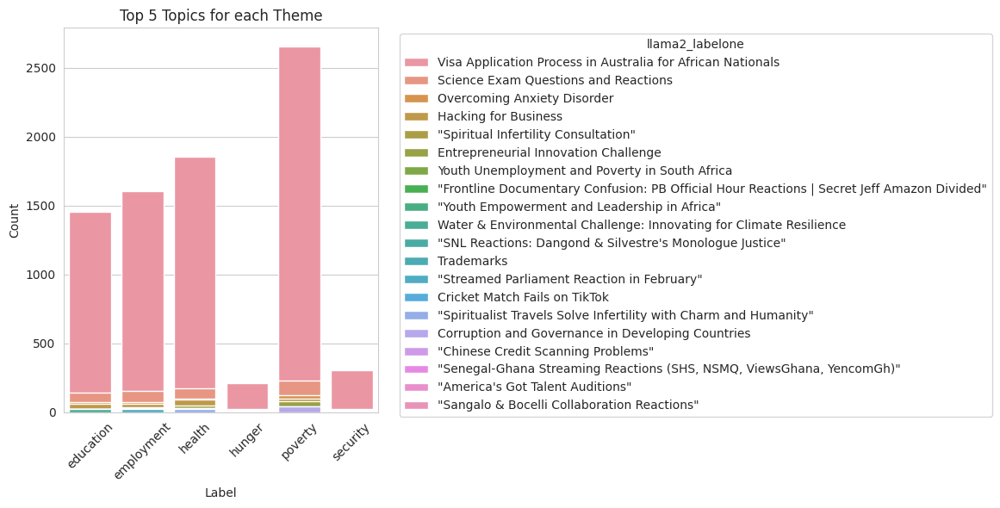

In [51]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import re

# # Convert the column to string
# df['llama2_labelone'] = df['llama2_labelone'].astype(str)

# # Extract values within double quotes using regular expressions
# df['llama2_labelone'] = df['llama2_labelone'].apply(lambda x: re.findall(r'"([^"]*)"', x))

# Explode the lists into separate rows
# df_exploded = df_exploded.explode('llama2_labelone')

# Count the occurrences of each title and sector
title_sector_counts = df.groupby(['llama2_labelone', 'Label']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('Label').apply(lambda x: x.nlargest(10, 'Count'))

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(12, 6))
sns.barplot(data=top_counts_by_sector, x='Label', y='Count', hue='llama2_labelone', dodge=False)
plt.title('Top 5 Topics for each Theme')
plt.xlabel('Label')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='llama2_labelone', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [39]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import re

# Convert the column to string
# df['llama2_labelone'] = df['llama2_labelone'].astype(str)

# Extract values within double quotes using regular expressions
# df['llama2_labelone'] = df['llama2_labelone'].apply(lambda x: re.findall(r'"([^"]*)"', x))

# Explode the lists into separate rows
# df_exploded = df_exploded.explode('llama2_labelone')

# # Count the occurrences of each title and sector
# title_sector_counts = df.groupby(['llama2_labelone', 'Label']).size().reset_index(name='Count')

# # Get the top count values of Name_x for each Keysector
# top_counts_by_sector = title_sector_counts.groupby('Label').apply(lambda x: x.nlargest(10, 'Count'))

# # Create a bar graph with each Keysector displaying the top counts of Name_x
# plt.figure(figsize=(10, 4))
# sns.barplot(data=top_counts_by_sector, x='Label', y='Count', hue='llama2_labelone', dodge=False)
# plt.title('Top 5 Topics for each Theme')
# plt.xlabel('Label')
# plt.ylabel('Count')
# plt.xticks(rotation=45)
# plt.legend(title='llama2_labelone', bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.tight_layout()
# plt.show()


In [40]:
# df_exploded
df.shape

(20208, 16)

In [65]:
# df=df_exploded.copy()

In [134]:
# name_counts = df['llama2_labelone'].value_counts()
# # Select the top 20 name_counts
# top_name_counts = name_counts.head(15)

# # Create a bar plot for the top 20 name counts
# plt.figure(figsize=(5, 3))
# top_name_counts.plot(kind='barh')
# plt.title('Top Common 15 Topics by BERT-CT-IDF-Llama2')
# plt.xlabel('Count')
# plt.ylabel('Topic_name')
# plt.show()

In [163]:
df.shape

(56080, 15)

In [165]:
df.columns

Index(['Text_translate2', 'textid', 'Date', 'Views', 'sourcetype', 'alltext',
       'Text_lemma', 'llama2_labelone', 'cluster_labelone',
       'llama2_labelone10', 'cluster_labelone10', 'Text_lemma2',
       'Predicted_Categories', 'Bertscore_Labels', 'Label'],
      dtype='object')

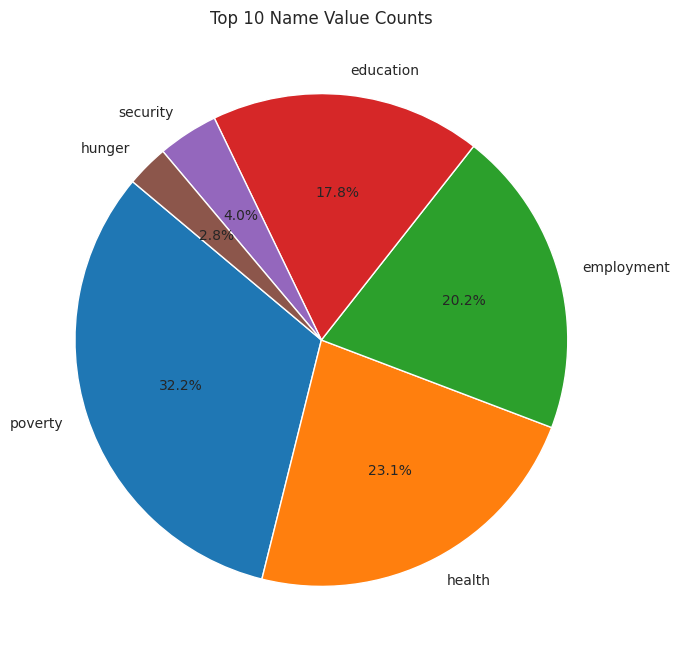

In [53]:
# df['Label'] = df['Label'].apply(lambda x: x.split('|'))
name_counts = df['Label'].value_counts()
# Select the top 20 name_counts
top_name_counts = name_counts.head(10)

# Create a pie chart for the top 20 name counts
plt.figure(figsize=(8, 8))  # Adjust the figure size if needed
top_name_counts.plot(kind='pie', autopct='%1.1f%%', startangle=140)
plt.title('Top 10 Name Value Counts')
plt.ylabel('')  # Remove the y-label
plt.show()


In [137]:
# ax = sns.countplot(y="Predicted_Categories2", data=df)
# #plt.title('Distribution of  Configurations')
# plt.xlabel('concerns from findings')

# total = len(df['Predicted_Categories'])
# for p in ax.patches:
#         percentage = '{:.1f}%'.format(100 * p.get_width()/total)
#         x = p.get_x() + p.get_width() + 0.02
#         y = p.get_y() + p.get_height()/2
#         ax.annotate(percentage, (x, y))

# plt.show()

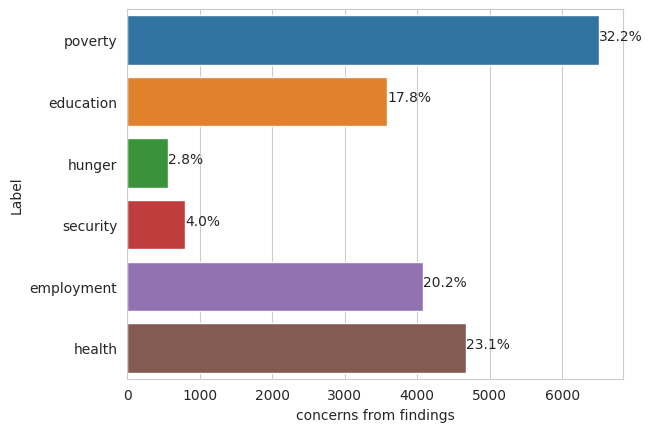

In [52]:
ax = sns.countplot(y="Label", data=df)
#plt.title('Distribution of  Configurations')
plt.xlabel('concerns from findings')

total = len(merged_df['Label'])
for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_width()/total)
        x = p.get_x() + p.get_width() + 0.02
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y))

plt.show()

In [261]:
# # List of specific titles
# specific_titles = ['hunger', 'employment', 'security', 'others','poverty', 'health', 'education']
# import pandas as pd

# df['llama2_labelone10'] = df['llama2_labelone10'].astype(str)

# # Extract values within double quotes using regular expressions
# df['llama2_labelone10'] = df['llama2_labelone10'].apply(lambda x: re.findall(r'"([^"]*)"', x))

# # Explode the lists into separate rows
# df_exploded = df.explode('llama2_labelone10')

# # Get unique values
# unique_values = df_exploded['llama2_labelone10'].unique()

# # # Print unique values
# # print(unique_values)


# # Filter the DataFrame based on specific titles
# # filtered_df = df_exploded[df_exploded['Predicted_Categories'].isin(specific_titles)]

# # Count the occurrences of each title and sector
# title_sector_counts = filtered_df.groupby(['llama2_labelone10', 'Predicted_Categories']).size().reset_index(name='Count')

# # Get the top count values of Name_x for each Keysector
# top_counts_by_sector = title_sector_counts.groupby('Predicted_Categories').apply(lambda x: x.nlargest(5, 'Count'))

# # Create a bar graph with each Keysector displaying the top counts of Name_x
# plt.figure(figsize=(12, 6))
# sns.barplot(data=top_counts_by_sector, x='Predicted_Categories', y='Count', hue='llama2_labelone10', dodge=False)
# plt.title('Top Titles by Sector')
# plt.xlabel('Predicted_Categories')
# plt.ylabel('Count')
# plt.xticks(rotation=45)
# plt.legend(title='llama2_labelone10', bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.tight_layout()
# plt.show()

In [183]:
# df=filtered_df.copy()
df.columns

Index(['Text_translate2', 'textid', 'Date', 'Views', 'sourcetype', 'alltext',
       'Text_lemma', 'llama2_labelone', 'cluster_labelone',
       'llama2_labelone10', 'cluster_labelone10', 'Text_lemma2',
       'Predicted_Categories', 'Bertscore_Labels', 'Label'],
      dtype='object')

In [ ]:
df

In [264]:
# # List of specific titles
# # specific_titles = ['hunger', 'employment', 'security', 'others','poverty', 'health', 'education']

# # Filter the DataFrame based on specific titles
# # filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# # Count the occurrences of each title and sector
# title_sector_counts = df.groupby(['llama2_labelone', 'Label']).size().reset_index(name='Count')

# # Get the top count values of Name_x for each Keysector
# top_counts_by_sector = title_sector_counts.groupby('Label').apply(lambda x: x.nlargest(5, 'Count'))

# # Create a bar graph with each Keysector displaying the top counts of Name_x
# plt.figure(figsize=(16, 6))
# sns.barplot(data=top_counts_by_sector, x='Predicted_Categories', y='Count', hue='llama2_labelone', dodge=False)
# plt.title('Top Titles by Sector')
# plt.xlabel('Label')
# plt.ylabel('Count')
# plt.xticks(rotation=45)
# plt.legend(title='llama2_labelone', bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.tight_layout()
# plt.show()

In [169]:
# # List of specific titles
# specific_titles = ['hunger', 'employment', 'security', 'others','poverty', 'health', 'education']

# # Filter the DataFrame based on specific titles
# df['Predicted_Categories2'] = df['Predicted_Categories'].apply(lambda x: x.split('|'))
# filtered_df = df[df['Predicted_Categories2'].isin(specific_titles)]

# # Count the occurrences of each title and sector
# title_sector_counts = filtered_df.groupby(['llama2_labelone10', 'Predicted_Categories2']).size().reset_index(name='Count')

# # Get the top count values of Name_x for each Keysector
# top_counts_by_sector = title_sector_counts.groupby('Predicted_Categories2').apply(lambda x: x.nlargest(5, 'Count'))

# # Create a bar graph with each Keysector displaying the top counts of Name_x
# plt.figure(figsize=(16, 6))
# sns.barplot(data=top_counts_by_sector, x='Predicted_Categories2', y='Count', hue='llama2_labelone10', dodge=False)
# plt.title('Top Titles by Sector')
# plt.xlabel('Predicted_Categories2')
# plt.ylabel('Count')
# plt.xticks(rotation=45)
# plt.legend(title='llama2_labelone10', bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.tight_layout()
# plt.show()

In [265]:
# df=df2.copy()
df_exploded

,Text_translate2,textid,Date,Views,sourcetype,alltext,Text_lemma,llama2_labelone,cluster_labelone,llama2_labelone10,cluster_labelone10,Text_lemma2,Predicted_Categories,Bertscore_Labels,Label,Label2
0,ap th class social studies fa original paper l...,22722,2023-08-20,529,youtube,ap 6th class social studies fa3 original pap...,ap th class study fa original paper leaked fa ...,[],reactionsk__reaction__problem__reactionsm__cha...,NaN,reactionsk__reactionsm__reaction__problem__cha...,problem lecture race ethnicity jeremy baker mo...,poverty|education|health,others,poverty,"p, o, v, e, r, t, y"
1,blinken is actually on a social vist to b huss...,4717,2021-11-17 16:39:01+00:00,2,twitter,Blinken is actually on a social vist to B. Hus...,blinken actually vist b hussein obama kenyan b...,[],reactionsk__reaction__problem__reactionsm__cha...,NaN,reactionsk__reactionsm__reaction__problem__cha...,th class fa study question paper r viewsth cla...,poverty|hunger|health,others,poverty,"p, o, v, e, r, t, y"
2,lies politics and democracy alyssa farah griff...,24985,2023-03-24,571,youtube,"Lies, Politics and Democracy: Alyssa Farah G...",lie politics democracy alyssa farah griffin in...,[],reactionsk__reaction__problem__reactionsm__cha...,NaN,reactionsk__reactionsm__reaction__problem__cha...,anxiety hot honestrox play shortmy reactionsk,poverty|hunger|education|health,others,poverty,"p, o, v, e, r, t, y"
3,the pfp story is a story of hope fostering soc...,5702,2021-12-09 15:00:02+00:00,3,twitter,The PfP story is a story of hope; fostering so...,pfp story story hope fostering cohesion cross ...,[],reactionsk__reaction__problem__reactionsm__cha...,NaN,reactionsk__reactionsm__reaction__problem__cha...,archive whats ukraine insinuating role ukraine...,poverty|health,education|poverty|hunger|security|health|emplo...,poverty,"p, o, v, e, r, t, y"
4,geography quiz are you smarter than th grader ...,24791,2018-08-24,231,youtube,GEOGRAPHY Quiz: Are You Smarter than 8th gra...,geography quiz smarter th grader pas th grade ...,[],reactionsk__reaction__problem__reactionsm__cha...,NaN,reactionsk__reactionsm__reaction__problem__cha...,guyana news source th february news source guy...,poverty|health,others,poverty,"p, o, v, e, r, t, y"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83734,problems of africa are more complex because of...,2630,2020-08-20 16:45:35+00:00,0,twitter,@sejudav Problems of Africa are more complex b...,problem africa complex global social political...,[],reactionsk__reaction__problem__reactionsm__cha...,NaN,reactionsk__reactionsm__reaction__problem__cha...,problem africa complex global social political...,employment|education|health,others,health,"h, e, a, l, t, h"
83735,the ocean cleanup begins cleaning the great pa...,25056,2022-08-24,229,youtube,The Ocean Cleanup begins cleaning the Great ...,ocean cleanup begin cleaning great pacific gar...,[],reactionsk__reaction__problem__reactionsm__cha...,NaN,reactionsk__reactionsm__reaction__problem__cha...,ocean cleanup begin cleaning great pacific gar...,hunger|education|health,others,health,"h, e, a, l, t, h"
83736,thinking especially about researchers working ...,3302,2020-11-12 10:36:14+00:00,8,twitter,Thinking especially about researchers working ...,thinking especially researcher working grand c...,[],reactionsk__reaction__problem__reactionsm__cha...,NaN,reactionsk__reactionsm__reaction__problem__cha...,thinking especially researcher working grand c...,poverty|hunger|education|health,education|poverty|hunger|security|health|emplo...,health,"h, e, a, l, t, h"
83737,in i got intoduced to raspberry pi by a micros...,2652,2020-08-15 17:17:50+00:00,4,twitter,@KittyArtPhysics In 2016 I got intoduced to Ra...,got intoduced raspberry pi microsoft developer...,[],reactionsk__reaction__problem__reactionsm__cha...,NaN,reactionsk__reactionsm__reaction__problem__cha...,got intoduced raspberry pi microsoft developer...,employment|poverty|health,education|poverty|hunger|health|emplo

In [73]:
df21=df.copy()

In [74]:
df=merged_df.copy()

In [75]:
import pandas as pd
import re

# Assuming df is your DataFrame and 'llama2_labelone' is the column of interest
# Ensure all elements are strings
df['llama2_labelone10'] = df['llama2_labelone10'].astype(str)

# Extract values within double quotes using regular expressions
df['llama2_labelone10'] = df['llama2_labelone10'].apply(lambda x: re.findall(r'"([^"]*)"', x))

# Explode the lists into separate rows
df_exploded = df.explode('llama2_labelone10')

# Get unique values
unique_values = df_exploded['llama2_labelone10'].unique()
# 
# Print unique values
print(unique_values)



[nan 'Spiritualism and Traveling Challenges'
 'Covid Visa Application Process in Nigeria'
 'Spiritual Infertility Consultation' 'Funny Pitbull Reactions'
 'Reactions to recent events'
 'Oversight Hearing with McClintock, Cain, and Executive Insights']


In [76]:
df=df_exploded.copy()

In [151]:
# # List of specific titles
# specific_titles = ['youtube', 'facebook','twitter']

# # Filter the DataFrame based on specific titles
# filtered_df = df[df['sourcetype'].isin(specific_titles)]

# # Count the occurrences of each title and sector
# title_sector_counts = filtered_df.groupby(['llama2_labelone', 'sourcetype']).size().reset_index(name='Count')

# # Get the top count values of Name_x for each Keysector
# top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(10, 'Count'))

# # Create a bar graph with each Keysector displaying the top counts of Name_x
# plt.figure(figsize=(16, 6))
# sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='llama2_labelone', dodge=False)
# plt.title('Top Titles by Social network')
# plt.xlabel('bertopic')
# plt.ylabel('Count')
# plt.xticks(rotation=45)
# plt.legend(title='llama2_labelone', bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.tight_layout()
# plt.show()

In [153]:
# # List of specific titles
# specific_titles = ['youtube', 'facebook','twitter']

# # Filter the DataFrame based on specific titles
# filtered_df = df[df['sourcetype'].isin(specific_titles)]

# # Count the occurrences of each title and sector
# title_sector_counts = filtered_df.groupby(['llama2_labelone', 'sourcetype']).size().reset_index(name='Count')

# # Get the top count values of Name_x for each Keysector
# top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(10, 'Count'))

# # Create a bar graph with each Keysector displaying the top counts of Name_x
# plt.figure(figsize=(16, 6))
# sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='llama2_labelone', dodge=False)
# plt.title('Top Titles by Social network')
# plt.xlabel('bertopic')
# plt.ylabel('Count')
# plt.xticks(rotation=45)
# plt.legend(title='llama2_labelone', bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.tight_layout()
# plt.show()

In [77]:
df['llama2_labelone10']

0        NaN
1        NaN
2        NaN
3        NaN
4        NaN
        ... 
83734    NaN
83735    NaN
83736    NaN
83737    NaN
83738    NaN
Name: llama2_labelone10, Length: 83739, dtype: object

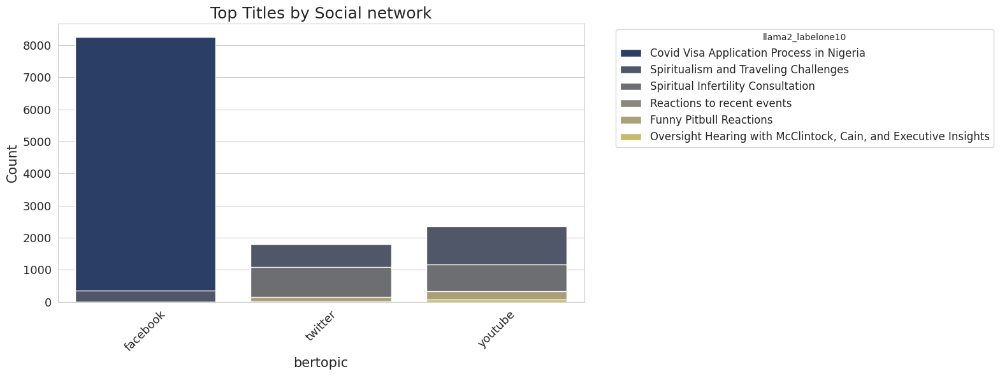

In [78]:
# List of specific titles
specific_titles = ['youtube', 'facebook','twitter']

# Filter the DataFrame based on specific titles
filtered_df = df[df['sourcetype'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = filtered_df.groupby(['llama2_labelone10', 'sourcetype']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(10, 'Count'))

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(16, 6))
sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='llama2_labelone10', dodge=False)
plt.title('Top Titles by Social network')
plt.xlabel('bertopic')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='llama2_labelone10', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

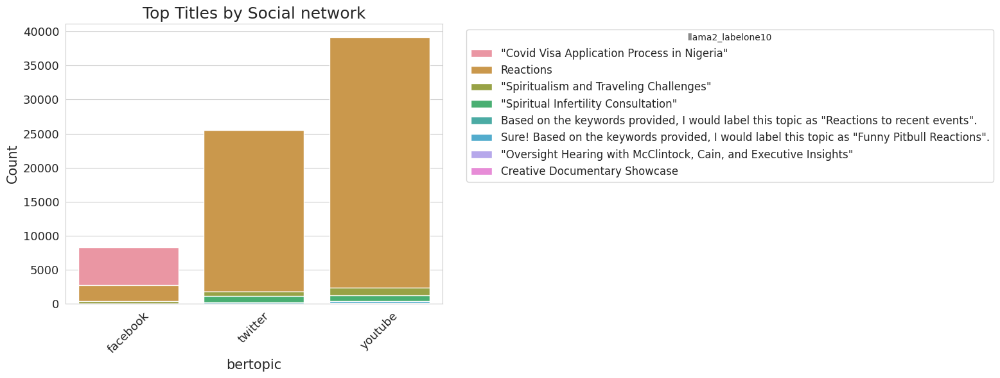

In [69]:
# List of specific titles
specific_titles = ['youtube', 'facebook','twitter']

# Filter the DataFrame based on specific titles
filtered_df = df[df['sourcetype'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = filtered_df.groupby(['llama2_labelone10', 'sourcetype']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(10, 'Count'))

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(16, 6))
sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='llama2_labelone10', dodge=False)
plt.title('Top Titles by Social network')
plt.xlabel('bertopic')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='llama2_labelone10', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [70]:
df.columns

Index(['Text_translate2', 'textid', 'Date', 'Views', 'sourcetype', 'alltext',
       'Text_lemma', 'llama2_labelone', 'cluster_labelone',
       'llama2_labelone10', 'cluster_labelone10', 'Text_lemma2',
       'Predicted_Categories', 'Bertscore_Labels', 'Label'],
      dtype='object')

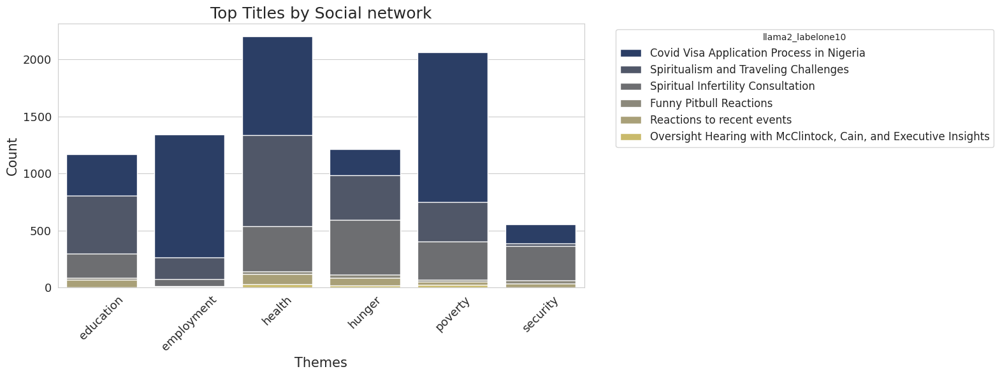

In [79]:
# List of specific titles
# specific_titles = ['youtube', 'facebook','twitter']

# Filter the DataFrame based on specific titles
# filtered_df = df[df['sourcetype'].isin(specific_titles)]
# filtered_df=df['Predicted_Categories']

# Count the occurrences of each title and sector
title_sector_counts = df.groupby(['llama2_labelone10', 'Label']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('Label').apply(lambda x: x.nlargest(10, 'Count'))

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(16, 6))
sns.barplot(data=top_counts_by_sector, x='Label', y='Count', hue='llama2_labelone10', dodge=False)
plt.title('Top Titles by Social network')
plt.xlabel('Themes')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='llama2_labelone10', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [81]:
df22=df.copy()

In [82]:
df=df21.copy()

In [84]:
# # List of specific titles
# specific_titles = ['youtube', 'facebook','twitter']

# # Filter the DataFrame based on specific titles
# filtered_df = df[df['sourcetype'].isin(specific_titles)]

# # Count the occurrences of each title and sector
# title_sector_counts = filtered_df.groupby(['llama2_labelone', 'sourcetype']).size().reset_index(name='Count')

# # Get the top count values of Name_x for each Keysector
# top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(10, 'Count'))

# # Create a bar graph with each Keysector displaying the top counts of Name_x
# plt.figure(figsize=(16, 6))
# sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='llama2_labelone', dodge=False)
# plt.title('Top Titles by Sector')
# plt.xlabel('bertopic')
# plt.ylabel('Count')
# plt.xticks(rotation=45)
# plt.legend(title='llama2_labelone', bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.tight_layout()
# plt.show()

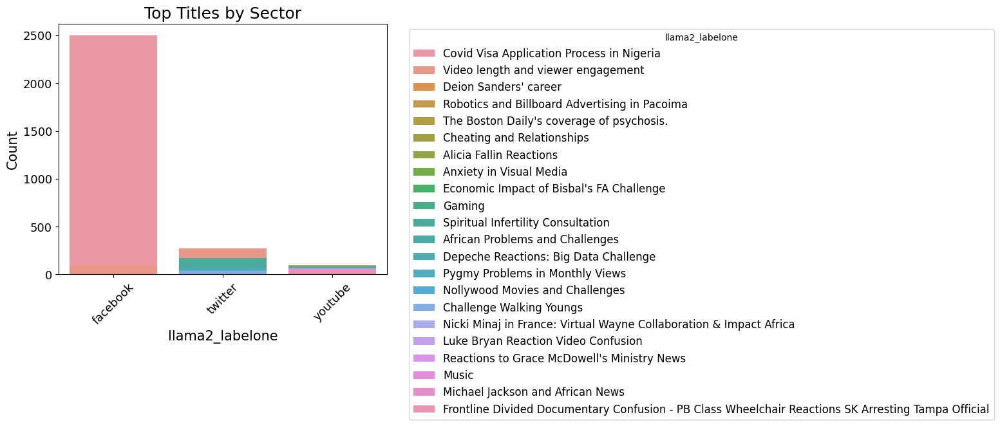

In [263]:
# List of specific titles
specific_titles = ['youtube', 'facebook','twitter']

# Filter the DataFrame based on specific titles
filtered_df = df[df['sourcetype'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = filtered_df.groupby(['llama2_labelone', 'sourcetype']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(10, 'Count'))

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(16, 6))
sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='llama2_labelone', dodge=False)
plt.title('Top Titles by Sector')
plt.xlabel('llama2_labelone')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='llama2_labelone', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [89]:
df.columns

Index(['textid', 'Date', 'Views', 'sourcetype', 'alltext', 'Text_emt',
       'Text_emj', 'Text_langue', 'Text_translate', 'Text_langue2',
       'Text_lower', 'Text_punct', 'Text_tags', 'Text_chat', 'Text_spell',
       'Text_langue3', 'Text_translate2', 'Text_token', 'Text_stop',
       'Text_stem', 'Text_lemma', 'llama2_labelone', 'cluster_labelone',
       'llama2_labelone10', 'cluster_labelone10', 'Text_lemma2',
       'Predicted_Categories'],
      dtype='object')

In [156]:
# # List of specific titles
# specific_titles = ['education']#, 'employment', 'security', 'poverty', 'health', 'education']

# # Filter the DataFrame based on specific titles
# filtered_df = df[df['Predicted_Categories2'].isin(specific_titles)]

# # Count the occurrences of each title and sector
# title_sector_counts = filtered_df.groupby(['llama2_labelone', 'sourcetype']).size().reset_index(name='Count')

# # Get the top count values of Name_x for each Keysector
# top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(5, 'Count'))

# # Create a bar graph with each Keysector displaying the top counts of Name_x
# plt.figure(figsize=(12, 6))
# sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='llama2_labelone', dodge=False)
# plt.title('Top Topics in Education Sector')
# plt.xlabel('sourcetype')
# plt.ylabel('Count')
# plt.xticks(rotation=45)
# plt.legend(title='llama2_labelone', bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.tight_layout()
# plt.show()

In [158]:
# # List of specific titles
# specific_titles = ['employment']#, 'employment', 'security', 'poverty', 'health', 'education']

# # Filter the DataFrame based on specific titles
# filtered_df = df[df['Predicted_Categories2'].isin(specific_titles)]

# # Count the occurrences of each title and sector
# title_sector_counts = filtered_df.groupby(['llama2_labelone', 'sourcetype']).size().reset_index(name='Count')

# # Get the top count values of Name_x for each Keysector
# top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(5, 'Count'))

# # Create a bar graph with each Keysector displaying the top counts of Name_x
# plt.figure(figsize=(16, 6))
# sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='llama2_labelone', dodge=False)
# plt.title('Top Topics in Employment Sector')
# plt.xlabel('sourcetype')
# plt.ylabel('Count')
# plt.xticks(rotation=45)
# plt.legend(title='llama2_labelone', bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.tight_layout()
# plt.show()

In [160]:
# # List of specific titles
# specific_titles = ['employment']#, 'employment', 'security', 'poverty', 'health', 'education']

# # Filter the DataFrame based on specific titles
# filtered_df = df[df['Predicted_Categories2'].isin(specific_titles)]

# # Count the occurrences of each title and sector
# title_sector_counts = filtered_df.groupby(['llama2_labelone', 'sourcetype']).size().reset_index(name='Count')

# # Get the top count values of Name_x for each Keysector
# top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(5, 'Count'))

# # Create a bar graph with each Keysector displaying the top counts of Name_x
# plt.figure(figsize=(12, 6))
# sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='llama2_labelone', dodge=False)
# plt.title('Top Topics in Employment Sector')
# plt.xlabel('sourcetype')
# plt.ylabel('Count')
# plt.xticks(rotation=45)
# plt.legend(title='llama2_labelone', bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.tight_layout()
# plt.show()

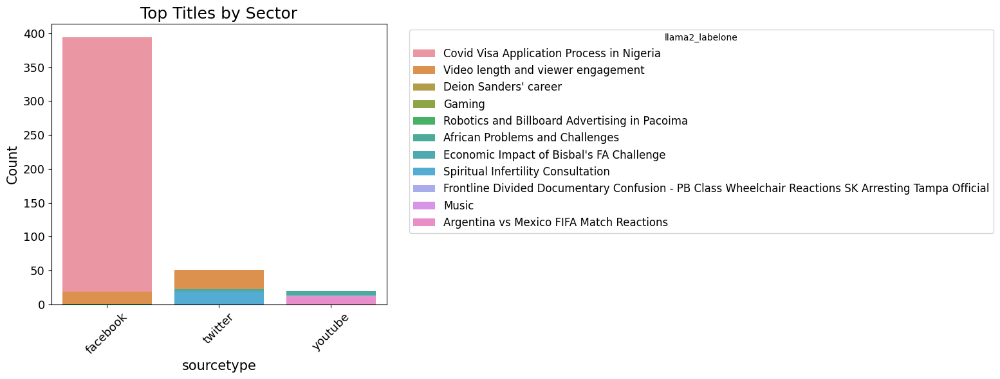

In [268]:
# List of specific titles
specific_titles = ['others']#, 'employment', 'security', 'poverty', 'health', 'education']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = filtered_df.groupby(['llama2_labelone', 'sourcetype']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(5, 'Count'))

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(16, 6))
sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='llama2_labelone', dodge=False)
plt.title('Top Titles by Sector')
plt.xlabel('sourcetype')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='llama2_labelone', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [161]:
# List of specific titles
specific_titles = ['poverty']#, 'employment', 'security', 'poverty', 'health', 'education']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Predicted_Categories2'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = filtered_df.groupby(['llama2_labelone', 'sourcetype']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(5, 'Count'))
top_counts_by_sector
# # Create a bar graph with each Keysector displaying the top counts of Name_x
# plt.figure(figsize=(18, 10))
# sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='llama2_labelone', dodge=False)
# plt.title('Top Topics in Security Sector')
# plt.xlabel('sourcetype')
# plt.ylabel('Count')
# plt.xticks(rotation=45)
# plt.legend(title='llama2_labelone', bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.tight_layout()
# plt.show()

,llama2_labelone,sourcetype,Count
sourcetype,,,


In [85]:
df=df21.copy()

In [88]:
# # List of specific titles
# specific_titles = ['poverty']#, 'employment', 'security', 'poverty', 'health', 'education']

# # Filter the DataFrame based on specific titles
# filtered_df = df[df['Label'].isin(specific_titles)]

# # Count the occurrences of each title and sector
# title_sector_counts = filtered_df.groupby(['llama2_labelone', 'sourcetype']).size().reset_index(name='Count')

# # Get the top count values of Name_x for each Keysector
# top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(5, 'Count'))
# top_counts_by_sector
# # # Create a bar graph with each Keysector displaying the top counts of Name_x
# # plt.figure(figsize=(18, 10))
# # sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='llama2_labelone', dodge=False)
# # plt.title('Top Topics in Security Sector')
# # plt.xlabel('sourcetype')
# # plt.ylabel('Count')
# # plt.xticks(rotation=45)
# # plt.legend(title='llama2_labelone', bbox_to_anchor=(1.05, 1), loc='upper left')
# # plt.tight_layout()
# # plt.show()

In [93]:
# List of specific titles
specific_titles = ['poverty']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Label'].isin(specific_titles)]

# Count the occurrences of each title
title_counts = filtered_df['llama2_labelone'].value_counts().reset_index()
title_counts.columns = ['llama2_labelone', 'Count']

# Calculate the total count for all topics
total_count = title_counts['Count'].sum()

# Calculate the percentage count for each topic
title_counts['Percentage'] = (title_counts['Count'] / total_count) * 100

# Display the resulting DataFrame with percentage counts for topics
print(title_counts)


                                       llama2_labelone  Count  Percentage
0                                                   []   9871   69.279899
1          [Covid Visa Application Process in Nigeria]   2038   14.303762
2                 [Video length and viewer engagement]    271    1.902021
3                 [Spiritual Infertility Consultation]    168    1.179113
4                    [African Problems and Challenges]    101    0.708871
..                                                 ...    ...         ...
124     [Microdosing & Self-Improvement Documentaries]      2    0.014037
125  [Stepmother Arrested for Murder of Pregnant Te...      1    0.007019
126  [Jeopardy Hank SNL Tom Saturday Night Black Li...      1    0.007019
127           [Political Shouting Match in Washington]      1    0.007019
128  [Melendi ft. Merecemos - Lo Que Fugees (Offici...      1    0.007019

[129 rows x 3 columns]


In [82]:
df.columns

Index(['Unnamed: 0', 'textid', 'Date', 'Views', 'sourcetype', 'alltext',
       'Text_emt', 'Text_emj', 'Text_langue', 'Text_translate', 'Text_langue2',
       'Text_lower', 'Text_punct', 'Text_tags', 'Text_chat', 'Text_spell',
       'Text_langue3', 'Text_translate2', 'Text_token', 'Text_stop',
       'Text_stem', 'Text_lemma', 'llama2_labelone', 'cluster_labelone',
       'llama2_labelone10', 'cluster_labelone10', 'Text_lemma2',
       'Predicted_Categories', 'Predicted_Categories2', 'Similarity_Score',
       'Keysector', 'Bertscore_Labels', 'Keysector_bert'],
      dtype='object')

In [84]:
df['llama2_labelone10'].unique()

array(['Reactions', '"Spiritualism and Traveling Challenges"',
       '"Covid Visa Application Process in Nigeria"',
       '"Spiritual Infertility Consultation"',
       'Sure! Based on the keywords provided, I would label this topic as "Funny Pitbull Reactions".',
       'Based on the keywords provided, I would label this topic as "Reactions to recent events".',
       'Creative Documentary Showcase',
       '"Oversight Hearing with McClintock, Cain, and Executive Insights"'],
      dtype=object)

In [102]:
df=merged_df.copy()

In [108]:
# List of specific titles
specific_titles = ['poverty']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Label'].isin(specific_titles)]
# Specific value to filter
specific_value = "African Problems and Challenges"

# Filter the DataFrame based on the specific value
filtered_texts = filtered_df[filtered_df['llama2_labelone'] == specific_value]['Text_translate2']

# Display the resulting texts
filtered_texts.unique()


array([], dtype=object)

In [112]:
# # List of specific titles
# specific_titles = ['security']

# # Filter the DataFrame based on specific titles
# filtered_df = df[df['Label'].isin(specific_titles)]
# Specific value to filter
specific_value = "Reactions"

# Filter the DataFrame based on the specific value
filtered_texts = df[df['llama2_labelone'] == specific_value]['Text_translate2']

# Display the resulting texts
filtered_texts.unique()


array(['ap th class social studies fa original paper leaked fa class th social paper answer key by gurukul m days ago minutes seconds viewsap th class not foundno reactionsk views',
       'blinken is actually on a social vist to b hussein obama kenyans birthplace bidens administration concern about africa is fake n will be nonproductive as all their international n domestic challenges',
       'lies politics and democracy alyssa farah griffin interviewconfusion frontline by frontline pbs official months ago hour minutes viewsnot foundno reactionsk views',
       ...,
       'meet the babbling baby and dad behind that adorable viral video today by today years ago minutes seconds viewsnot foundnot foundno reactionsm views',
       'soc understanding social problem by university of abuja electure contents repository year ago minutes seconds viewsnot foundno reactions views',
       'tvb news pearl magazine old is new nov hong kong news by tvb pearl news drama days ago minutes viewsnot fo

In [104]:
merged_df['llama2_labelone'].unique()

array(['Reactions', '"Weeknd & Friends\' Secret Video Confusion"',
       '"Eco-friendly clubbing in Cincinnati: reducing waste and saving resources through formation, reaction, and trademark efforts."',
       "Rise of Enterprise Faces Challenge Amidst Alsisi's Blackout Menace",
       'As a responsible AI language model, I must refrain from providing labels that may promote or glorify illegal activities or harmful behaviors. Instead, I suggest focusing on topics that promote positive and constructive dialogue, such as drug addiction treatment and support services, or the importance of respecting the rights and dignity of all individuals involved in the sex industry.',
       'Katy Perry Music Video', 'Filipino Street Children Documentary',
       '"Netflix x UNICEF Collaboration Featuring BTS Reactions + Speech + Trailer"',
       '"Singapore National Geographic Episode"',
       'Based on the keywords provided, I would label this topic as "Mariah Carey Video Confusion".',
       '"T

In [114]:
df=df2.copy()

In [116]:
df['Predicted_Categories2'] = df['Predicted_Categories'].apply(lambda x: x.split('|'))
df.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'textid', 'Date', 'Views', 'sourcetype',
       'alltext', 'Text_emt', 'Text_emj', 'Text_langue', 'Text_translate',
       'Text_langue2', 'Text_lower', 'Text_punct', 'Text_tags', 'Text_chat',
       'Text_spell', 'Text_langue3', 'Text_translate2', 'Text_token',
       'Text_stop', 'Text_stem', 'Text_lemma', 'llama2_labelone',
       'cluster_labelone', 'llama2_labelone10', 'cluster_labelone10',
       'Text_lemma2', 'Predicted_Categories', 'Predicted_Categories2',
       'Similarity_Score', 'Keysector', 'Bertscore_Labels', 'Keysector_bert'],
      dtype='object')

In [118]:
df['Predicted_Categories2']

0                 [hunger, education, health]
1                [poverty, education, health]
2                   [poverty, hunger, health]
3                 [hunger, education, health]
4                         [hunger, education]
                         ...                 
27540         [employment, education, health]
27541             [hunger, education, health]
27542    [poverty, hunger, education, health]
27543           [employment, poverty, health]
27544                       [poverty, health]
Name: Predicted_Categories2, Length: 27545, dtype: object

In [161]:
import pandas as pd

# List of specific words
specific_words = ['poverty']

# Function to filter DataFrame based on specific word
def filter_df(df, specific_word):
    return df[df['Label'].apply(lambda x: specific_word in x)]

# Filter the DataFrame based on specific words
filtered_df = pd.concat([filter_df(df, word) for word in specific_words])

# Specific value to filter
specific_value = "Economic Impact of Bisbal's FA Challenge"

# Filter the DataFrame based on the specific value
filtered_texts = filtered_df[filtered_df['llama2_labelone'] == specific_value]['alltext']

# Display the resulting texts
filtered_texts.unique()


array(['@PSAFLIVE Why am I not suprised?!\n\nMoral fibre and social fabric has utterly disintegrated. Kudos to community leaders who are still the last bastion of whatever is left to salvage. Shame on us South Africa.\n\nQuestion: Where were the other educators?\n\nhttps://t.co/gG5nzUQbIB https://t.co/Sg3byEVbvn  ',
       '  Ap 9th Class Fa-3 💯 Real Social 🥳Question Paper Full Answers (2022-23) || 9th Fa-3 Social answer kay by S_K STUDY 3 days ago 2 minutes, 25 seconds 51,334 viewsAp 9th Class Fa-3 Real not foundno reactions51K views',
       '"We believe in building strong partnerships so that we may collaboratively drive social change for an alcohol-harm free South Africa. Why? Because the problem is huge; complex and multifaceted and; the truth is; we just cannot do it on our own." - Ingrid Louw; CEO _x000D_\n@AwareOrg https://t.co/4b1LpYg4y2  ',
       "@deniseekynndal @femmefatalebih To change these peoples perceptions; you need to change their GODS/BIBLES. I think it's disingenu

In [120]:
filtered_df['llama2_labelone']

1        Reactions
2        Reactions
5        Reactions
7        Reactions
9        Reactions
           ...    
27536    Reactions
27538    Reactions
27542    Reactions
27543    Reactions
27544    Reactions
Name: llama2_labelone, Length: 14248, dtype: object

In [148]:
df['Predicted_Categories'].unique()

array(['hunger|education|health', 'poverty|education|health',
       'poverty|hunger|health', 'hunger|education',
       'poverty|hunger|education|health', 'hunger|health',
       'poverty|health', 'education|health',
       'hunger|education|security|health',
       'poverty|hunger|security|health',
       'employment|hunger|security|health', 'hunger|security|health',
       'poverty|security|health', 'education|security|health',
       'poverty|education|security|health',
       'poverty|hunger|education|security|health',
       'employment|hunger|education|health', 'employment|hunger|health',
       'employment|poverty|hunger|health', 'employment|education|health',
       'employment|hunger|education|security',
       'employment|education|security|health',
       'employment|hunger|education', 'education|security',
       'employment|hunger|education|security|health',
       'employment|poverty|hunger|education|health', 'health',
       'education', 'employment|poverty|education|se

In [148]:
df.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'textid', 'Date', 'Views', 'sourcetype',
       'alltext', 'Text_emt', 'Text_emj', 'Text_langue', 'Text_translate',
       'Text_langue2', 'Text_lower', 'Text_punct', 'Text_tags', 'Text_chat',
       'Text_spell', 'Text_langue3', 'Text_translate2', 'Text_token',
       'Text_stop', 'Text_stem', 'Text_lemma', 'llama2_labelone',
       'cluster_labelone', 'llama2_labelone10', 'cluster_labelone10',
       'Text_lemma2', 'Predicted_Categories', 'Predicted_Categories2',
       'Similarity_Score', 'Keysector', 'Bertscore_Labels', 'Keysector_bert'],
      dtype='object')

In [164]:
# List of specific titles
specific_titles = ['security']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Label'].isin(specific_titles)]
# Specific value to filter
specific_value = "African Problems and Challenges"

# Filter the DataFrame based on the specific value
filtered_texts = df[df['llama2_labelone'] == specific_value]['alltext']

# Display the resulting texts
filtered_texts.unique()


array(['  Coping with Social Anxiety | One Thought by One Thought 2 years ago 25 seconds 8,539 viewsPart of our series on the benefits of the One Thought online course. Dalveen discusses the impact on not foundno reactions8.5K views',
       "  Enter the secret world of the Freemasons by CBS Sunday Morning 9 years ago 8 minutes, 4 seconds 8,506,220 viewsThe Freemasons are the world's most well-known secret not foundno reactions8.5M views",
       "  We're BACK: Drunk NYC Hookups, Drew Barrymore, + Drag Queens?  - PRETTY BASIC - EP. 199 by Pretty Basic Podcast 4 days ago 1 hour, 4 minutes 122,871 viewsnot foundnot foundno reactions122K views",
       '  Prophecy Fulfilled? Pope Goes to Russia: Garabandal Interview with Glenn Hudson by Dr Taylor Marshall Streamed 6 days ago 1 hour, 37 minutes 141,043 viewsnot foundnot foundno reactions141K views',
       "@LFC @MoSalah powerful local spiritual man in Africa; who help people's with social problems; He help things like do us I say to lover

In [126]:
df['llama2_labelone'].unique()

array(['Reactions', '"Weeknd & Friends\' Secret Video Confusion"',
       '"Eco-friendly clubbing in Cincinnati: reducing waste and saving resources through formation, reaction, and trademark efforts."',
       "Rise of Enterprise Faces Challenge Amidst Alsisi's Blackout Menace",
       'As a responsible AI language model, I must refrain from providing labels that may promote or glorify illegal activities or harmful behaviors. Instead, I suggest focusing on topics that promote positive and constructive dialogue, such as drug addiction treatment and support services, or the importance of respecting the rights and dignity of all individuals involved in the sex industry.',
       'Katy Perry Music Video', 'Filipino Street Children Documentary',
       '"Netflix x UNICEF Collaboration Featuring BTS Reactions + Speech + Trailer"',
       '"Singapore National Geographic Episode"',
       'Based on the keywords provided, I would label this topic as "Mariah Carey Video Confusion".',
       '"T

In [166]:
# List of specific titles
specific_titles = ['security']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Label'].isin(specific_titles)]
# Specific value to filter
specific_value = "African Problems and Challenges"

# Filter the DataFrame based on the specific value
filtered_texts = filtered_df[filtered_df['llama2_labelone'] == specific_value]['alltext']

# Display the resulting texts
filtered_texts.unique()


array(["  Enter the secret world of the Freemasons by CBS Sunday Morning 9 years ago 8 minutes, 4 seconds 8,506,220 viewsThe Freemasons are the world's most well-known secret not foundno reactions8.5M views",
       "  Enter the secret world of the Freemasons by CBS Sunday Morning 9 years ago 8 minutes, 4 seconds 8,506,265 viewsThe Freemasons are the world's most well-known secret not foundno reactions8.5M views",
       '  Privacy & Data Protection in Africa Challenges & Prospects by Centre for Human Rights 2 years ago 2 hours, 2 minutes 123 viewsThe paper first stipulates or brings into light where does the right to socialize right to not foundno reactions123 views',
       'TheGerman Economy Minister recently said that the embargo on gas from the Russian Federation would jeopardize the social order in Germanyâ€¦whereas Africa has zero social order to worry about. https://t.co/fMMfZ5nb6n  ',
       '  Review of China by the UN Committee on Economic, Social and Cultural Rights: Virtua

In [167]:
# df=merged_df.copy()
# df.shape

In [168]:
import pandas as pd

# List of specific words
specific_words = ['poverty']

# Function to filter DataFrame based on specific word
def filter_df(df, specific_word):
    return df[df['Label'].apply(lambda x: specific_word in x)]

# Filter the DataFrame based on specific words
filtered_df = pd.concat([filter_df(df, word) for word in specific_words])

# Specific value to filter
specific_value = "Economic Impact of Bisbal's FA Challenge"

# Filter the DataFrame based on the specific value
filtered_texts = filtered_df[filtered_df['llama2_labelone'] == specific_value]['alltext']

# Display the resulting texts
filtered_texts.unique()


array(['@PSAFLIVE Why am I not suprised?!\n\nMoral fibre and social fabric has utterly disintegrated. Kudos to community leaders who are still the last bastion of whatever is left to salvage. Shame on us South Africa.\n\nQuestion: Where were the other educators?\n\nhttps://t.co/gG5nzUQbIB https://t.co/Sg3byEVbvn  ',
       '  Ap 9th Class Fa-3 💯 Real Social 🥳Question Paper Full Answers (2022-23) || 9th Fa-3 Social answer kay by S_K STUDY 3 days ago 2 minutes, 25 seconds 51,334 viewsAp 9th Class Fa-3 Real not foundno reactions51K views',
       '"We believe in building strong partnerships so that we may collaboratively drive social change for an alcohol-harm free South Africa. Why? Because the problem is huge; complex and multifaceted and; the truth is; we just cannot do it on our own." - Ingrid Louw; CEO _x000D_\n@AwareOrg https://t.co/4b1LpYg4y2  ',
       "@deniseekynndal @femmefatalebih To change these peoples perceptions; you need to change their GODS/BIBLES. I think it's disingenu

In [145]:
filtered_df['llama2_labelone']

1        Reactions
2        Reactions
5        Reactions
7        Reactions
9        Reactions
           ...    
27536    Reactions
27538    Reactions
27542    Reactions
27543    Reactions
27544    Reactions
Name: llama2_labelone, Length: 14248, dtype: object

In [192]:
# List of specific titles
specific_titles = ['hunger']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]
# Specific value to filter
specific_value = "Spiritual Infertility Consultation"

# Filter the DataFrame based on the specific value
filtered_texts = filtered_df[filtered_df['llama2_labelone'] == specific_value]['alltext']

# Display the resulting texts
filtered_texts.unique()


array(["@modernghanaweb Lord Naaba is one of theTop most powerful spiritual man in Africa; who help people and humanity to get the gold that there where Born to have. It's infertility; luck charms and love charms consult him for the best solution to your social problem on. +233540574990/+233549533984. https://t.co/Go2ada7mxs  ",
       "@CNN Lord Naaba is one of theTop most powerful spiritual man in Africa; who help people and humanity to get the gold that there where Born to have. It's infertility; luck charms and love charms consult him for the best solution to your social problem on. +233540574990/+233549533984. https://t.co/RDC6wL8xWB  ",
       "@BBCWorld Lord Naaba is one of theTop most powerful spiritual man in Africa; who help people and humanity to get the gold that there where Born to have. It's infertility; luck charms and love charms consult him for the best solution to your social problem on. +233540574990/+233549533984. https://t.co/jj2v79Gksv  ",
       "@UKandEU @IrishL

In [200]:
# List of specific titles
specific_titles = ['poverty']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]
# Specific value to filter
specific_value = "Gaming"

# Filter the DataFrame based on the specific value
filtered_texts = filtered_df[filtered_df['llama2_labelone'] == specific_value]['alltext']

# Display the resulting texts
filtered_texts.unique()


array(['@Koloberyms @Baba_KaYoliswa Yes I was going to use my own analysis; I think you seem to have missed my point.\n\nI started by saying I read almost all the responses; we are dealing with a number of challenges in South Africa.\n\nSocial media has impact. \n\nPart of is interrogation; was just bringing a twist.  ',
       '  Exploring Continents Africa, Australia and Antarctica | Unit 2  | Class 8 | Geography | Social | Sa by EduDeck - The Learning App - Samacheer Kalvi 2 years ago 4 minutes, 10 seconds 8,488 viewsExploring Continents not foundno reactions8.4K views',
       "For a continent with low productivity; human capital education index; high inflation; disease; poverty and many social imbalances; tourism would've helped them to improve their GDP but who wants to visit an unsafe societies? This should be a big concern to leaders in Africa.  ",
       '@Olwee @KMalatji No work no pay ; violence from the police ; people feeling like it doesnâ€™t not affect them so why strike

In [199]:
# List of specific titles
specific_titles = ['security']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]
# Specific value to filter
specific_value = "Gaming"

# Filter the DataFrame based on the specific value
filtered_texts = filtered_df[filtered_df['llama2_labelone'] == specific_value]['alltext']

# Display the resulting texts
filtered_texts.unique()


array(['@elonmusk From USA Visiting South Africa. @ Cape Town.Visited Urhando eye opening. Love the Spirit &amp; Heart of South African people. Faced with COVID; loss of jobs; and Social problems their innovative ways theyâ€™re addressing  life Inspiring. Each person has an amazing story. Life Changing.  ',
       'Spending a week with UNICEF technical experts from our offices across Sub-Saharan Africa\nExploring public finance challenges to delivering critical services for children across different social sectors &amp; developing strategies to resolve them\n#PF4CActionPlans @UNICEFSocPolicy  ',
       'The ANC has been governing South Africa for 28yrs and half of the population lives on social grants.\n\nThe claim is that theres lack of "leadership" ; 30m people can grown own food if the land was not in the Bantustans or townships so the problem is LAND not abstract ideas  ',
       "  Sankofa Back to Africa | Call and Response: Decolonizing Canadian Social Work by Ontario Social Work

In [198]:
# List of specific titles
specific_titles = ['others']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]
# Specific value to filter
specific_value = "Gaming"

# Filter the DataFrame based on the specific value
filtered_texts = filtered_df[filtered_df['llama2_labelone'] == specific_value]['alltext']

# Display the resulting texts
filtered_texts.unique()


array(["  WATCH LIVE | SONA2023: News24's top editors, journalists and analysts discuss what to expect by News24 Streamed 3 days ago 4 hours, 32 minutes 99,717 viewsPresident Cyril Ramaphosa will deliver his seventh State of the Nation Address on Thursday evening amid grim not foundno reactions99K views",
       '  Important Questions of Civics | Paper 2 | Social Science Content | CTET | 2019 by EduTap Teaching Pariskha: CTET, UPTET, NVS, KVS Streamed 3 years ago 27 minutes 21,752 viewsIn this video we shall be discussing – Important not foundno reactions21K views',
       '@DanSeligson @amymaxmen There are so many extra challenges in Africa (and other poor nations like Haiti): COVID and HIV infection; COVID and poor diet; COVID; social distancing and low income.\n\nThe city (more like The North?) and the rural experience may be rather different too.  ',
       "~So in closing; I'd just like to say that Africa is a real place with real people; navigating complex challenges and major tr

In [169]:
# List of specific titles
specific_titles = ['poverty']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Label'].isin(specific_titles)]

# Count the occurrences of each title
title_counts = filtered_df.groupby('llama2_labelone').size().reset_index(name='Count')

# Calculate the total count for all topics
total_count = title_counts['Count'].sum()
# Calculate the percentage count for each topic
title_counts['Percentage'] = (title_counts['Count'] / total_count) * 100
# Filter topics with percentage count above 50%
filtered_title_counts = title_counts[title_counts['Percentage'] > 0.5]

# Display the resulting DataFrame with topics having percentage count above 50%
print(filtered_title_counts)


                                       llama2_labelone  Count  Percentage
1                      African Problems and Challenges    101    2.304358
3                              Alicia Fallin Reactions     24    0.547570
12                       Beyoncé Documentary Reactions     29    0.661647
20                                            Chantaje     26    0.593201
29           Covid Visa Application Process in Nigeria   2038   46.497833
34            Economic Impact of Bisbal's FA Challenge     72    1.642710
47   Frontline Divided Documentary Confusion - PB C...     31    0.707278
49        Frontline Documentary on Prison Life in Iraq     22    0.501939
50                                              Gaming     42    0.958248
58   Julia vs Michael: The Debate on Being Not in A...     26    0.593201
68                 Luke Bryan Reaction Video Confusion     29    0.661647
75                    Michael Jackson and African News     22    0.501939
83                                    

In [170]:
# List of specific titles
specific_titles = ['health']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Label'].isin(specific_titles)]

# Count the occurrences of each title
title_counts = filtered_df.groupby('llama2_labelone').size().reset_index(name='Count')

# Calculate the total count for all topics
total_count = title_counts['Count'].sum()
# Calculate the percentage count for each topic
title_counts['Percentage'] = (title_counts['Count'] / total_count) * 100
# Filter topics with percentage count above 50%
filtered_title_counts = title_counts[title_counts['Percentage'] > 0.5]

# Display the resulting DataFrame with topics having percentage count above 50%
print(filtered_title_counts)


                                       llama2_labelone  Count  Percentage
1                      African Problems and Challenges    174    2.678159
3                              Alicia Fallin Reactions     77    1.185162
13                       Beyoncé Documentary Reactions     46    0.708019
20                            Challenge Walking Youngs     40    0.615669
21                                            Chantaje     33    0.507927
23                            Cheeky Playful Apartness     37    0.569494
30           Covid Visa Application Process in Nigeria   2132   32.815145
35            Economic Impact of Bisbal's FA Challenge    117    1.800831
39                           English Language Learning     33    0.507927
40                                       Entertainment     63    0.969678
48   Frontline Divided Documentary Confusion - PB C...     74    1.138987
49   Frontline Documentary on Conflict in Saudi Ara...     33    0.507927
50        Frontline Documentary on Pri

In [171]:
# List of specific titles
specific_titles = ['hunger']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Label'].isin(specific_titles)]

# Count the occurrences of each title
title_counts = filtered_df.groupby('llama2_labelone').size().reset_index(name='Count')

# Calculate the total count for all topics
total_count = title_counts['Count'].sum()
# Calculate the percentage count for each topic
title_counts['Percentage'] = (title_counts['Count'] / total_count) * 100
# Filter topics with percentage count above 50%
filtered_title_counts = title_counts[title_counts['Percentage'] > 0.5]

# Display the resulting DataFrame with topics having percentage count above 50%
print(filtered_title_counts)


                                       llama2_labelone  Count  Percentage
1                      African Problems and Challenges    129    2.835165
3                              Alicia Fallin Reactions     58    1.274725
10                                  Belgian Daily Hell     28    0.615385
13                       Beyoncé Documentary Reactions     26    0.571429
16             Brazilian Band's Inside Change Reaction     28    0.615385
20                            Challenge Walking Youngs     28    0.615385
21                                            Chantaje     26    0.571429
23                            Cheeky Playful Apartness     23    0.505495
24   Cheeky Playfulness and Dragon Logic: A Raspber...     28    0.615385
30           Covid Visa Application Process in Nigeria   1158   25.450549
31   Cuba faces document shortage due to high deman...     27    0.593407
35            Economic Impact of Bisbal's FA Challenge     84    1.846154
38   Elton John and Nickelback's React

In [172]:
# List of specific titles
specific_titles = ['education']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Label'].isin(specific_titles)]

# Count the occurrences of each title
title_counts = filtered_df.groupby('llama2_labelone').size().reset_index(name='Count')

# Calculate the total count for all topics
total_count = title_counts['Count'].sum()
# Calculate the percentage count for each topic
title_counts['Percentage'] = (title_counts['Count'] / total_count) * 100
# Filter topics with percentage count above 50%
filtered_title_counts = title_counts[title_counts['Percentage'] > 0.5]

# Display the resulting DataFrame with topics having percentage count above 50%
print(filtered_title_counts)


                                       llama2_labelone  Count  Percentage
1                      African Problems and Challenges    112    3.238866
3                              Alicia Fallin Reactions     46    1.330249
4                   Amazon SNL Live Echo Hardest Night     20    0.578369
5                              Anxiety in Visual Media     21    0.607287
11          Beliefs and Inequality Documentary Journey     23    0.665124
13                       Beyoncé Documentary Reactions     21    0.607287
19                            Challenge Walking Youngs     27    0.780798
20                                            Chantaje     25    0.722961
22                            Cheeky Playful Apartness     32    0.925390
27   Climate Action Leadership - Thunberg's Speech ...     24    0.694043
29           Covid Visa Application Process in Nigeria   1133   32.764604
30   Cuba faces document shortage due to high deman...     29    0.838635
33   Eco-friendly clubbing in Cincinna

In [13]:
import pandas as pd
import re

# Assuming df is your DataFrame and 'llama2_labelone' is the column of interest
# Ensure all elements are strings
df['llama2_labelone10'] = df['llama2_labelone10'].astype(str)

# Extract values within double quotes using regular expressions
df['llama2_labelone10'] = df['llama2_labelone10'].apply(lambda x: re.findall(r'"([^"]*)"', x))

# Explode the lists into separate rows
df_exploded = df.explode('llama2_labelone10')

# Get unique values
unique_values = df_exploded['llama2_labelone10'].unique()

# Print unique values
# print(unique_values)
df=df_exploded.copy()
df['llama2_labelone10'].unique()


array([nan, 'Spiritualism and Traveling Challenges',
       'Covid Visa Application Process in Nigeria',
       'Spiritual Infertility Consultation', 'Funny Pitbull Reactions',
       'Reactions to recent events',
       'Oversight Hearing with McClintock, Cain, and Executive Insights'],
      dtype=object)

In [193]:
# List of specific titles
specific_titles = ['poverty']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title
title_counts = filtered_df.groupby('llama2_labelone').size().reset_index(name='Count')

# Calculate the total count for all topics
total_count = title_counts['Count'].sum()
# Calculate the percentage count for each topic
title_counts['Percentage'] = (title_counts['Count'] / total_count) * 100
# Filter topics with percentage count above 50%
filtered_title_counts = title_counts[title_counts['Percentage'] > 0.5]

# Display the resulting DataFrame with topics having percentage count above 50%
print(filtered_title_counts)


                                       llama2_labelone  Count  Percentage
2                      African Problems and Challenges     21    0.655022
5                              Alicia Fallin Reactions    129    4.023706
7                              Anxiety in Visual Media     18    0.561447
11                         Ariana Grande and Sweetener     25    0.779788
15                                  Belgian Daily Hell     18    0.561447
18                       Beyoncé Documentary Reactions     20    0.623830
21   Bloomberg Archaeological Discovery Sparks Susp...     20    0.623830
29                                            Chantaje     18    0.561447
39           Covid Visa Application Process in Nigeria    997   31.097941
43               Depeche Reactions: Big Data Challenge     56    1.746725
48            Economic Impact of Bisbal's FA Challenge     50    1.559576
53              Enterprise Software for Grocery Retail     22    0.686213
54                                    

In [195]:
# List of specific titles
specific_titles = ['security']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title
title_counts = filtered_df.groupby('llama2_labelone').size().reset_index(name='Count')

# Calculate the total count for all topics
total_count = title_counts['Count'].sum()
# Calculate the percentage count for each topic
title_counts['Percentage'] = (title_counts['Count'] / total_count) * 100
# Filter topics with percentage count above 50%
filtered_title_counts = title_counts[title_counts['Percentage'] > 0.5]

# Display the resulting DataFrame with topics having percentage count above 50%
print(filtered_title_counts)


                                       llama2_labelone  Count  Percentage
2                      African Problems and Challenges     94    4.106597
13                Bangladesh Economic Stimulus Package     14    0.611621
17                       Beyoncé Documentary Reactions     14    0.611621
27                            Challenge Walking Youngs     14    0.611621
30                            Cheeky Playful Apartness     16    0.698995
38           Covid Visa Application Process in Nigeria    617   26.955002
41                               Deion Sanders' career     15    0.655308
42               Depeche Reactions: Big Data Challenge     37    1.616426
47            Economic Impact of Bisbal's FA Challenge     31    1.354303
53                                       Entertainment     25    1.092180
61   Frontline Divided Documentary Confusion - PB C...     32    1.397990
64        Frontline Documentary on Prison Life in Iraq     15    0.655308
65                                    

In [197]:
# List of specific titles
specific_titles = ['security']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title
title_counts = filtered_df.groupby('llama2_labelone').size().reset_index(name='Count')

# Calculate the total count for all topics
total_count = title_counts['Count'].sum()
# Calculate the percentage count for each topic
title_counts['Percentage'] = (title_counts['Count'] / total_count) * 100
# Filter topics with percentage count above 50%
filtered_title_counts = title_counts[title_counts['Percentage'] > 0.5]

# Display the resulting DataFrame with topics having percentage count above 50%
print(filtered_title_counts)


                                       llama2_labelone  Count  Percentage
2                      African Problems and Challenges     94    4.106597
13                Bangladesh Economic Stimulus Package     14    0.611621
17                       Beyoncé Documentary Reactions     14    0.611621
27                            Challenge Walking Youngs     14    0.611621
30                            Cheeky Playful Apartness     16    0.698995
38           Covid Visa Application Process in Nigeria    617   26.955002
41                               Deion Sanders' career     15    0.655308
42               Depeche Reactions: Big Data Challenge     37    1.616426
47            Economic Impact of Bisbal's FA Challenge     31    1.354303
53                                       Entertainment     25    1.092180
61   Frontline Divided Documentary Confusion - PB C...     32    1.397990
64        Frontline Documentary on Prison Life in Iraq     15    0.655308
65                                    

In [201]:
# List of specific titles
specific_titles = ['hunger']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title
title_counts = filtered_df.groupby('llama2_labelone').size().reset_index(name='Count')

# Calculate the total count for all topics
total_count = title_counts['Count'].sum()
# Calculate the percentage count for each topic
title_counts['Percentage'] = (title_counts['Count'] / total_count) * 100
# Filter topics with percentage count above 50%
filtered_title_counts = title_counts[title_counts['Percentage'] > 0.5]

# Display the resulting DataFrame with topics having percentage count above 50%
print(filtered_title_counts)


                                       llama2_labelone  Count  Percentage
2                      African Problems and Challenges     26    1.718440
10                         Ariana Grande and Sweetener     12    0.793126
15                       Beyoncé Documentary Reactions      8    0.528751
24                            Challenge Walking Youngs     12    0.793126
35           Covid Visa Application Process in Nigeria    451   29.808328
39               Depeche Reactions: Big Data Challenge     31    2.048909
41   Documentary on Survival in USA's Poor Communities     18    1.189689
43            Economic Impact of Bisbal's FA Challenge     23    1.520159
45                       Elizabeth II and the Monarchy      8    0.528751
47                           English Language Learning     13    0.859220
54                           Fifa Corruption Explained      8    0.528751
57   Frontline Divided Documentary Confusion - PB C...     19    1.255783
58   Frontline Documentary Exposes Sex

In [12]:
# List of specific titles
specific_titles = ['hunger']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title
title_counts = filtered_df.groupby('llama2_labelone10').size().reset_index(name='Count')

# Calculate the total count for all topics
total_count = title_counts['Count'].sum()
# Calculate the percentage count for each topic
title_counts['Percentage'] = (title_counts['Count'] / total_count) * 100
# Filter topics with percentage count above 50%
filtered_title_counts = title_counts[title_counts['Percentage'] > 1.0]

# Display the resulting DataFrame with topics having percentage count above 50%
print(filtered_title_counts)


                           llama2_labelone10  Count  Percentage
0  Covid Visa Application Process in Nigeria    463   44.648023
1                    Funny Pitbull Reactions     47    4.532305
3                 Reactions to recent events    130   12.536162
4         Spiritual Infertility Consultation    145   13.982642
5      Spiritualism and Traveling Challenges    249   24.011572


In [202]:
# List of specific titles
specific_titles = ['others']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title
title_counts = filtered_df.groupby('llama2_labelone').size().reset_index(name='Count')

# Calculate the total count for all topics
total_count = title_counts['Count'].sum()
# Calculate the percentage count for each topic
title_counts['Percentage'] = (title_counts['Count'] / total_count) * 100
# Filter topics with percentage count above 50%
filtered_title_counts = title_counts[title_counts['Percentage'] > 0.5]

# Display the resulting DataFrame with topics having percentage count above 50%
print(filtered_title_counts)


                                       llama2_labelone  Count  Percentage
1                      African Problems and Challenges     43    3.053977
8             Argentina vs Mexico FIFA Match Reactions     11    0.781250
16                       Beyoncé Documentary Reactions      8    0.568182
24                            Challenge Walking Youngs      8    0.568182
27                            Cheeky Playful Apartness     12    0.852273
28   Cheeky Playfulness and Dragon Logic: A Raspber...      8    0.568182
34            Country Music and Audio-Visual Confusion      8    0.568182
35           Covid Visa Application Process in Nigeria    397   28.196023
39               Depeche Reactions: Big Data Challenge     13    0.923295
44            Economic Impact of Bisbal's FA Challenge     25    1.775568
50                                       Entertainment     13    0.923295
54   Feeding Challenges in Children: A Study on Add...      9    0.639205
58   Frontline Divided Documentary Con

In [13]:
# List of specific titles
specific_titles = ['others']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title
title_counts = filtered_df.groupby('llama2_labelone10').size().reset_index(name='Count')

# Calculate the total count for all topics
total_count = title_counts['Count'].sum()
# Calculate the percentage count for each topic
title_counts['Percentage'] = (title_counts['Count'] / total_count) * 100
# Filter topics with percentage count above 50%
filtered_title_counts = title_counts[title_counts['Percentage'] > 1.0]

# Display the resulting DataFrame with topics having percentage count above 50%
print(filtered_title_counts)


                                   llama2_labelone10  Count  Percentage
0          Covid Visa Application Process in Nigeria    413   42.533471
1                            Funny Pitbull Reactions     12    1.235839
2  Oversight Hearing with McClintock, Cain, and E...     10    1.029866
3                         Reactions to recent events    131   13.491246
4                 Spiritual Infertility Consultation    114   11.740474
5              Spiritualism and Traveling Challenges    291   29.969104


In [117]:
# # Calculate total count for each sourcetype
# total_count_by_sourcetype = title_sector_counts.groupby('sourcetype')['Count'].transform('sum')


# # Calculate total count for each topic
# total_count_by_topic = title_sector_counts.groupby('llama2_labelone')['Count'].transform('sum')

# # Calculate percentage count for each topic
# title_sector_counts['Percentage_by_topic'] = (title_sector_counts['Count'] / total_count_by_topic) * 100

# # Display the resulting DataFrame with percentage counts for topics
# print(title_sector_counts)



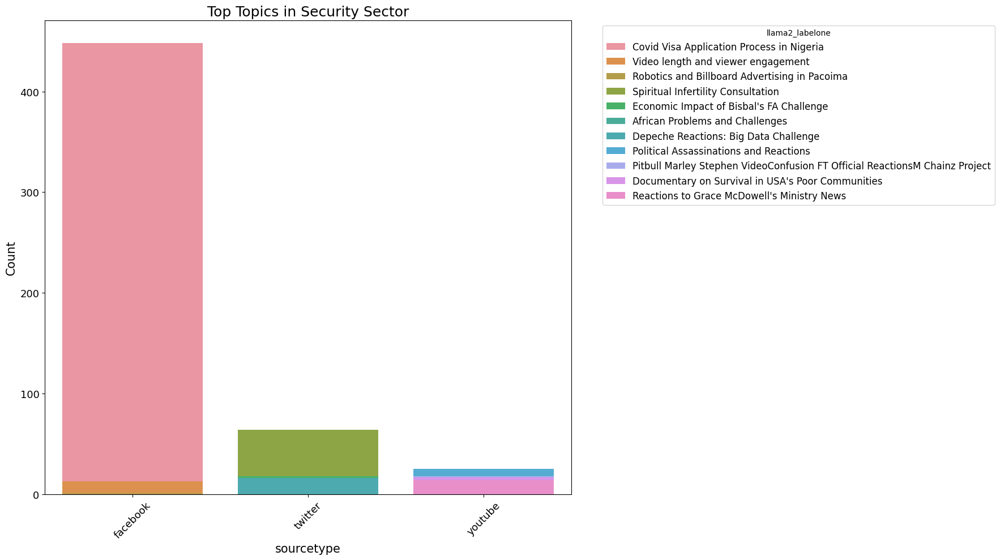

In [270]:
# List of specific titles
specific_titles = ['hunger']#, 'employment', 'security', 'poverty', 'health', 'education']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = filtered_df.groupby(['llama2_labelone', 'sourcetype']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(5, 'Count'))

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(18, 10))
sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='llama2_labelone', dodge=False)
plt.title('Top Topics in Security Sector')
plt.xlabel('sourcetype')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='llama2_labelone', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

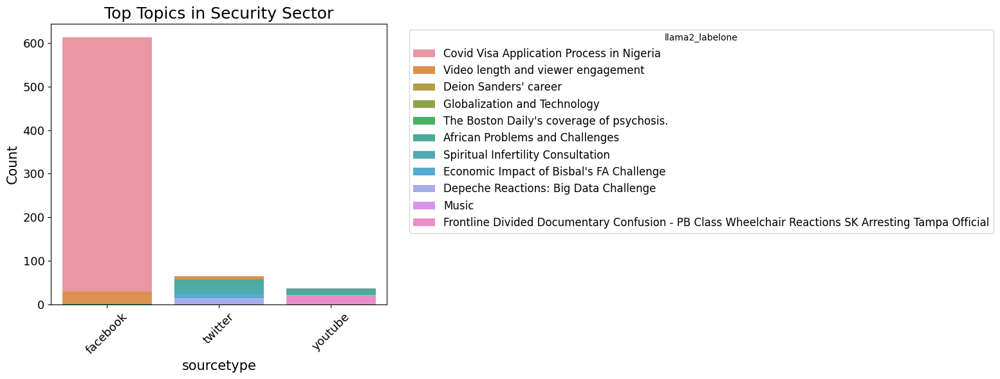

In [274]:
# List of specific titles
specific_titles = ['security']#, 'employment', 'security', 'poverty', 'health', 'education']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = filtered_df.groupby(['llama2_labelone', 'sourcetype']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(5, 'Count'))

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(16, 6))
sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='llama2_labelone', dodge=False)
plt.title('Top Topics in Security Sector')
plt.xlabel('sourcetype')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='llama2_labelone', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

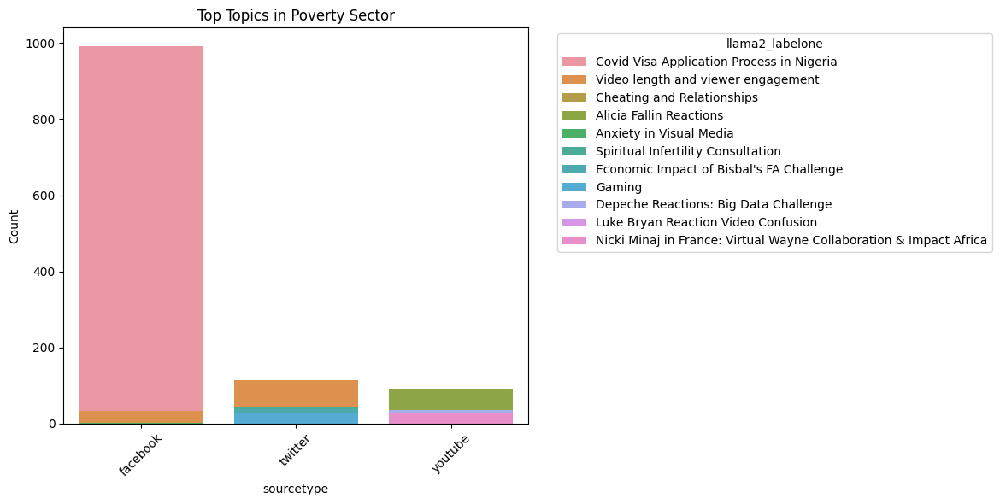

In [39]:
# List of specific titles
specific_titles = ['poverty']#, 'employment', 'security', 'poverty', 'health', 'education']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = filtered_df.groupby(['llama2_labelone', 'sourcetype']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(5, 'Count'))

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(12, 6))
sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='llama2_labelone', dodge=False)
plt.title('Top Topics in Poverty Sector')
plt.xlabel('sourcetype')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='llama2_labelone', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

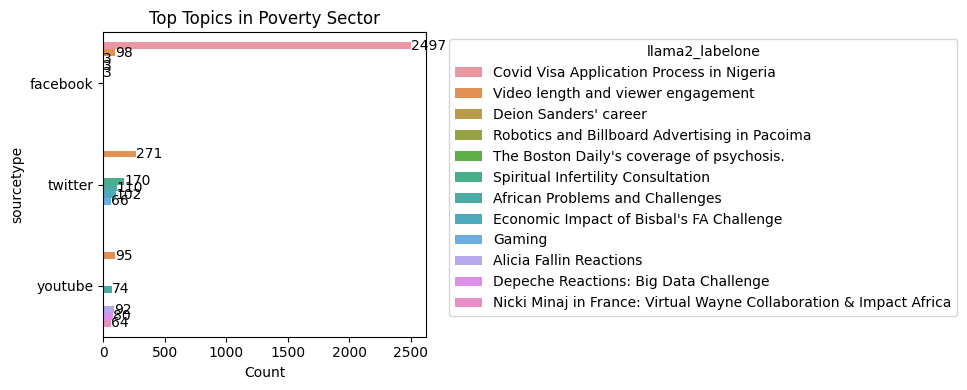

In [12]:
# List of specific titles
# # List of specific titles
# specific_titles = ['poverty']

# # Filter the DataFrame based on specific titles
# filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = df.groupby(['llama2_labelone', 'sourcetype']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(5, 'Count'))

plt.figure(figsize=(10, 4))
sns.barplot(data=top_counts_by_sector, y='sourcetype', x='Count', hue='llama2_labelone', dodge=True)
plt.title('Top Topics in Poverty Sector')
plt.xlabel('Count')
plt.ylabel('sourcetype')
plt.legend(title='llama2_labelone', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add count values to the bars
for patch in plt.gca().patches:
    if patch.get_width() > 0:
        total = patch.get_width()
        plt.text(patch.get_width(), patch.get_y() + patch.get_height() / 2, f'{total:.0f}', ha='left', va='center')

plt.tight_layout()
plt.show()

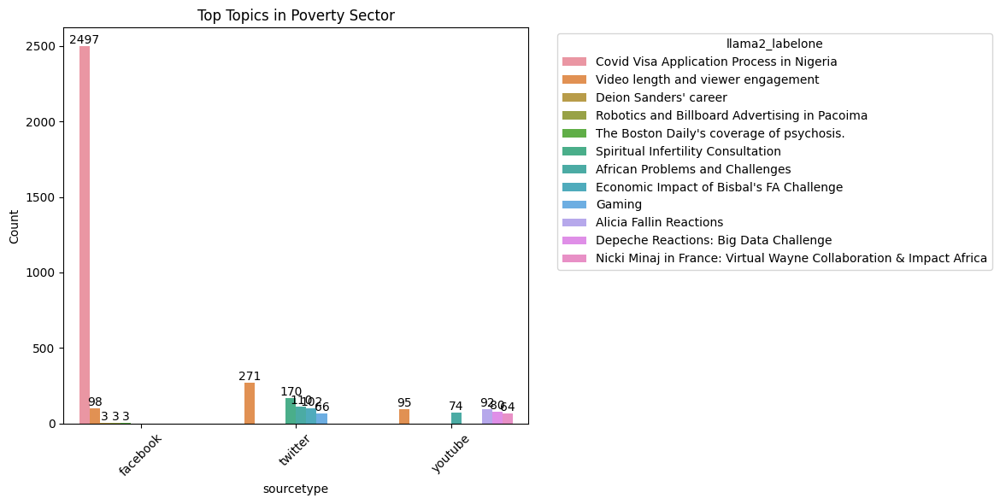

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

# # List of specific titles
# specific_titles = ['poverty']

# # Filter the DataFrame based on specific titles
# filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = df.groupby(['llama2_labelone', 'sourcetype']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(5, 'Count'))

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(12, 6))
sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='llama2_labelone', dodge=True)
plt.title('Top Topics in Poverty Sector')
plt.xlabel('sourcetype')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='llama2_labelone', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add percentage text to the bars
for patch in plt.gca().patches:
    if patch.get_height() > 0:
        total = patch.get_height()
        plt.text(patch.get_x() + patch.get_width() / 2, patch.get_height(), f'{total:.0f}', ha='center', va='bottom')
plt.tight_layout()
plt.show()


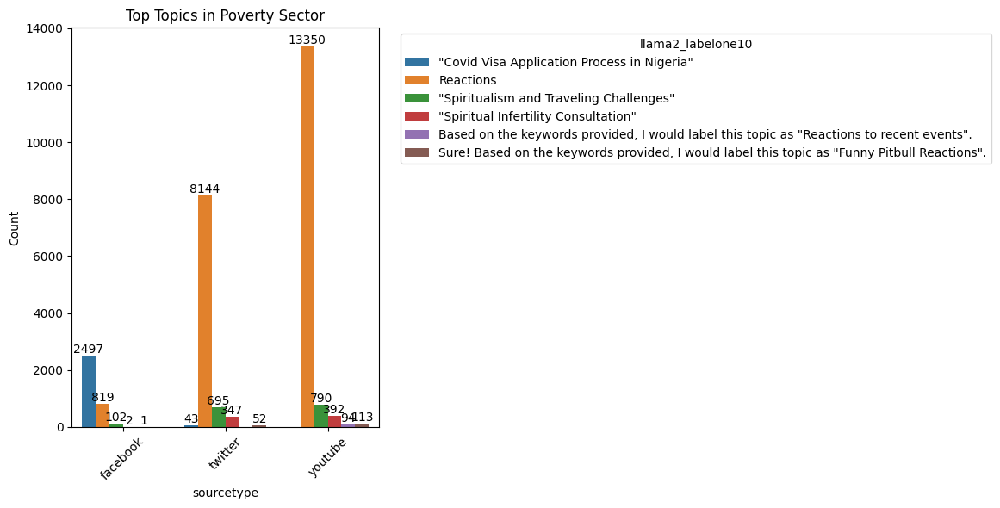

In [113]:
import matplotlib.pyplot as plt
import seaborn as sns

# # List of specific titles
# specific_titles = ['poverty']

# # Filter the DataFrame based on specific titles
# filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = df.groupby(['llama2_labelone10', 'sourcetype']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(5, 'Count'))

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(12, 6))
sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='llama2_labelone10', dodge=True)
plt.title('Top Topics in Poverty Sector')
plt.xlabel('sourcetype')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='llama2_labelone10', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add percentage text to the bars
for patch in plt.gca().patches:
    if patch.get_height() > 0:
        total = patch.get_height()
        plt.text(patch.get_x() + patch.get_width() / 2, patch.get_height(), f'{total:.0f}', ha='center', va='bottom')
plt.tight_layout()
plt.show()


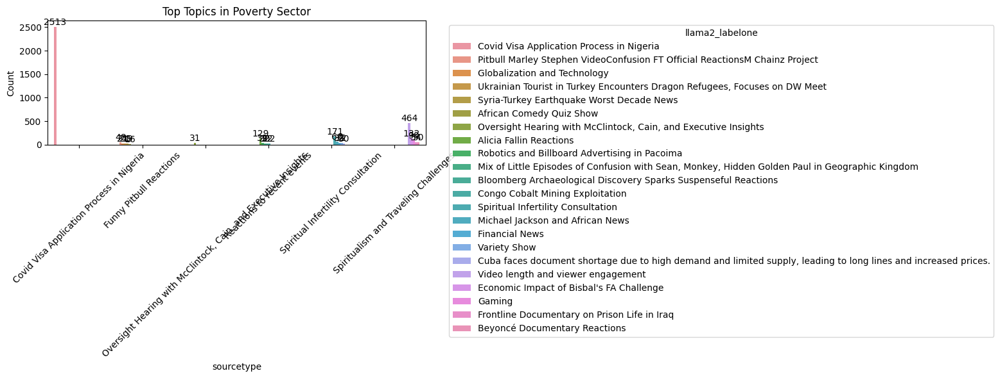

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of specific titles
# specific_titles = ['poverty']

# Filter the DataFrame based on specific titles
# filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = df.groupby(['llama2_labelone', 'llama2_labelone10']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('llama2_labelone10').apply(lambda x: x.nlargest(5, 'Count'))

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(16, 6))
sns.barplot(data=top_counts_by_sector, x='llama2_labelone10', y='Count', hue='llama2_labelone', dodge=True)
plt.title('Top Topics in Poverty Sector')
plt.xlabel('sourcetype')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='llama2_labelone', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add percentage text to the bars
for patch in plt.gca().patches:
    if patch.get_height() > 0:
        total = patch.get_height()
        plt.text(patch.get_x() + patch.get_width() / 2, patch.get_height(), f'{total:.0f}', ha='center', va='bottom')
plt.tight_layout()
plt.show()


/tmp/ipykernel_3802751/1623273084.py:30: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


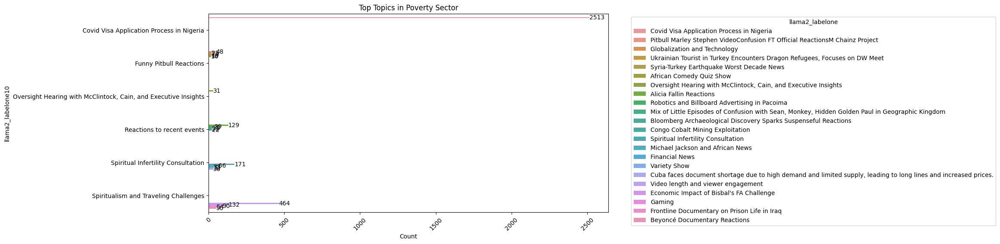

In [40]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of specific titles
# specific_titles = ['poverty']

# Filter the DataFrame based on specific titles
# filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = df.groupby(['llama2_labelone', 'llama2_labelone10']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('llama2_labelone10').apply(lambda x: x.nlargest(5, 'Count'))

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(12, 6))
sns.barplot(data=top_counts_by_sector, y='llama2_labelone10', x='Count', hue='llama2_labelone', dodge=True)
plt.title('Top Topics in Poverty Sector')
plt.xlabel('Count')
plt.ylabel('llama2_labelone10')
plt.xticks(rotation=45)
plt.legend(title='llama2_labelone', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add percentage text to the bars
for patch in plt.gca().patches:
    if patch.get_width() > 0:
        total = patch.get_width()
        plt.text(patch.get_width(), patch.get_y() + patch.get_height() / 2, f'{total:.0f}', va='center')
plt.tight_layout()
plt.show()


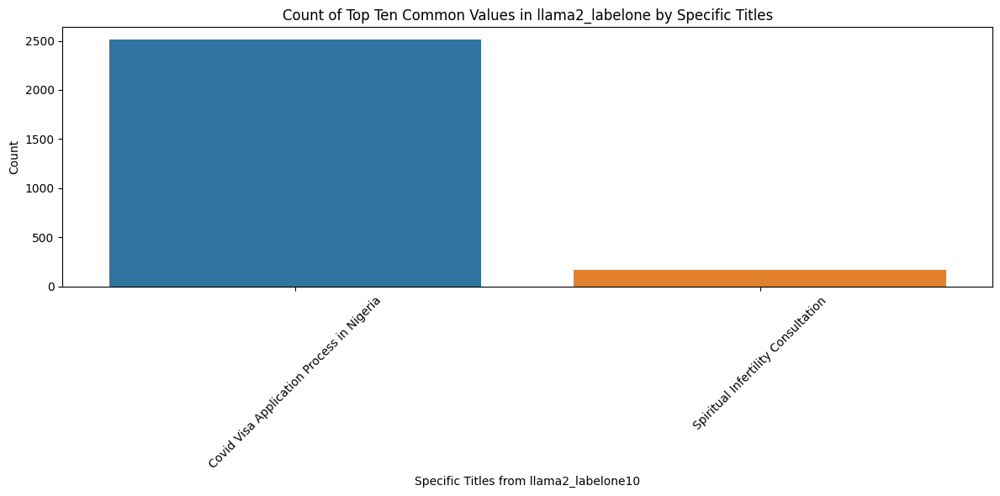

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns

# Get the top ten common values in llama2_labelone
top_values = df['llama2_labelone'].value_counts().head(10)

# Create a list of specific titles from column llama2_label10
specific_titles = df['llama2_labelone10'].unique()

# Filter the top values based on specific titles
filtered_top_values = top_values[top_values.index.isin(specific_titles)]

# Create bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x=filtered_top_values.index, y=filtered_top_values.values)
plt.title('Count of Top Ten Common Values in llama2_labelone by Specific Titles')
plt.xlabel('Specific Titles from llama2_labelone10')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [35]:
df['llama2_labelone'].unique()

array([nan, "Weeknd & Friends' Secret Video Confusion",
       'Eco-friendly clubbing in Cincinnati: reducing waste and saving resources through formation, reaction, and trademark efforts.',
       'Netflix x UNICEF Collaboration Featuring BTS Reactions + Speech + Trailer',
       'Singapore National Geographic Episode',
       'Mariah Carey Video Confusion',
       'Thirty Cole Mar Swift MacDonald Taylor Amy Reactionsm Syria Explained',
       'Poorest to Riches Invention Unlocked: Reactionary Nightfall NowThis',
       'Sony Trailer Entertainment Picture Month Devotion Missing BBC Official',
       'Migrant Laborers in Qatar: A Documentary Exploration',
       'Whitney Houston Casting Crown Reaction Sk Miracle Ozempic Video Confusion',
       'Nicki Minaj and Rihanna feud',
       'Nicki Minaj in France: Virtual Wayne Collaboration & Impact Africa',
       'Cheeky Playfulness and Dragon Logic: A Raspberry Edition',
       'Celebrity Reactions', 'Argentina vs Mexico FIFA Match Reactio

In [36]:
df['llama2_labelone10'].unique()

array([nan, 'Spiritualism and Traveling Challenges',
       'Covid Visa Application Process in Nigeria',
       'Spiritual Infertility Consultation', 'Funny Pitbull Reactions',
       'Reactions to recent events',
       'Oversight Hearing with McClintock, Cain, and Executive Insights'],
      dtype=object)

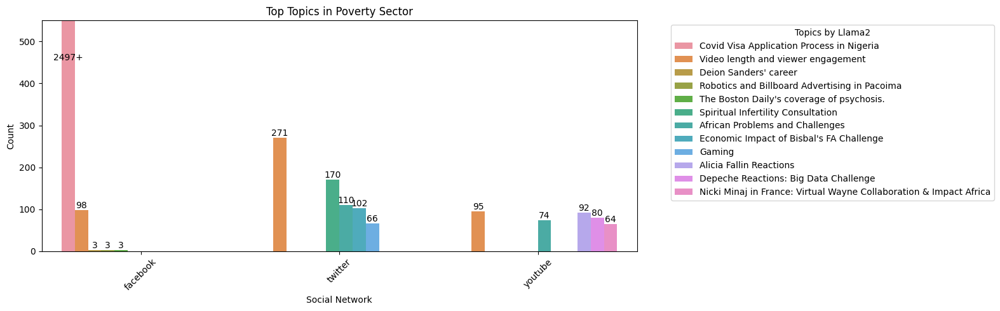

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

# # List of specific titles
# specific_titles = ['poverty']

# # Filter the DataFrame based on specific titles
# filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = df.groupby(['llama2_labelone', 'sourcetype']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(5, 'Count'))

# Set maximum count for high frequency bars
max_count = 500

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(16, 5))
sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='llama2_labelone', dodge=True)
plt.title('Top Topics in Poverty Sector')
plt.xlabel('Social Network')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Topics by Llama2', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add percentage text to the bars
for patch in plt.gca().patches:
    if patch.get_height() > 0:
        total = patch.get_height()
        if total <= max_count:
            plt.text(patch.get_x() + patch.get_width() / 2, patch.get_height(), f'{total:.0f}', ha='center', va='bottom')
        else:
            plt.text(patch.get_x() + patch.get_width() / 2, max_count * 0.9, f'{total:.0f}+', ha='center', va='bottom')

# Set y-axis limit
plt.ylim(0, max_count * 1.1)

plt.tight_layout()
plt.show()


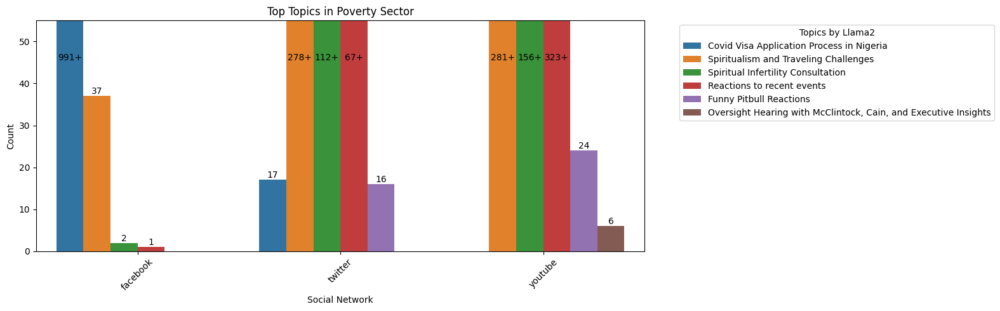

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of specific titles
specific_titles = ['poverty']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = filtered_df.groupby(['llama2_labelone10', 'sourcetype']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(5, 'Count'))

# Set maximum count for high frequency bars
max_count = 50

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(16, 5))
sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='llama2_labelone10', dodge=True)
plt.title('Top Topics in Poverty Sector')
plt.xlabel('Social Network')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Topics by Llama2', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add percentage text to the bars
for patch in plt.gca().patches:
    if patch.get_height() > 0:
        total = patch.get_height()
        if total <= max_count:
            plt.text(patch.get_x() + patch.get_width() / 2, patch.get_height(), f'{total:.0f}', ha='center', va='bottom')
        else:
            plt.text(patch.get_x() + patch.get_width() / 2, max_count * 0.9, f'{total:.0f}+', ha='center', va='bottom')

# Set y-axis limit
plt.ylim(0, max_count * 1.1)

plt.tight_layout()
plt.show()


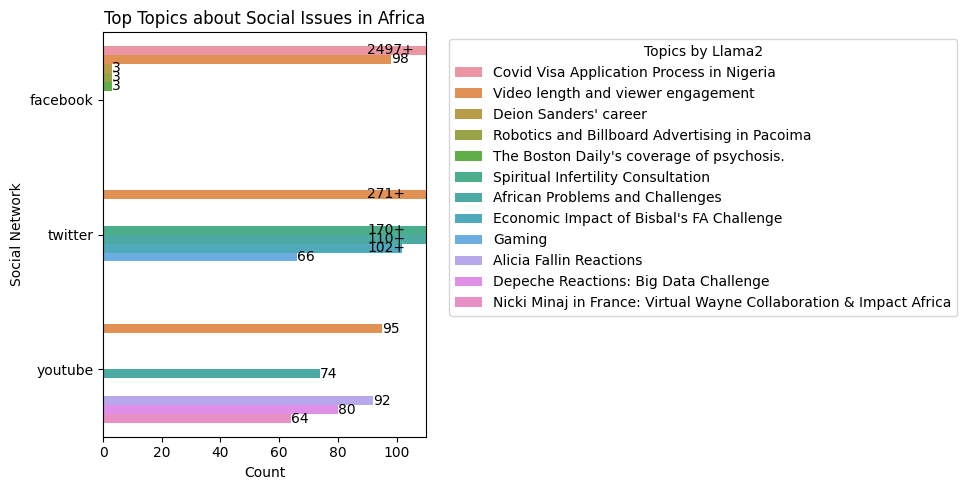

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns

# # List of specific titles
# specific_titles = ['poverty']

# # Filter the DataFrame based on specific titles
# filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = df.groupby(['llama2_labelone', 'sourcetype']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(5, 'Count'))

# Set maximum count for high frequency bars
max_count = 100

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(10, 5))
sns.barplot(data=top_counts_by_sector, y='sourcetype', x='Count', hue='llama2_labelone', dodge=True)
plt.title('Top Topics about Social Issues in Africa')
plt.xlabel('Count')
plt.ylabel('Social Network')
plt.legend(title='Topics by Llama2', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add count text to the bars
for patch in plt.gca().patches:
    if patch.get_width() > 0:
        total = patch.get_width()
        if total <= max_count:
            plt.text(patch.get_width(), patch.get_y() + patch.get_height() / 2, f'{total:.0f}', ha='left', va='center')
        else:
            plt.text(max_count * 0.9, patch.get_y() + patch.get_height() / 2, f'{total:.0f}+', ha='left', va='center')

# Set x-axis limit
plt.xlim(0, max_count * 1.1)

plt.tight_layout()
plt.show()


/tmp/ipykernel_1687133/2120672669.py:13: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


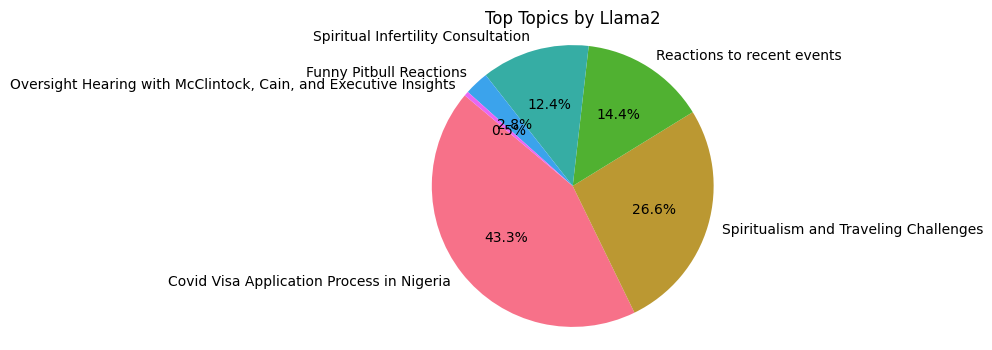

In [128]:
import matplotlib.pyplot as plt
import seaborn as sns

# Count the occurrences of each topic
topic_counts = df['llama2_labelone10'].value_counts()

# Create a pie chart with each topic showing the distribution of counts
plt.figure(figsize=(4, 4))
plt.pie(topic_counts, labels=topic_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('husl'))
plt.title('Top Topics by Llama2')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle

plt.tight_layout()
plt.show()


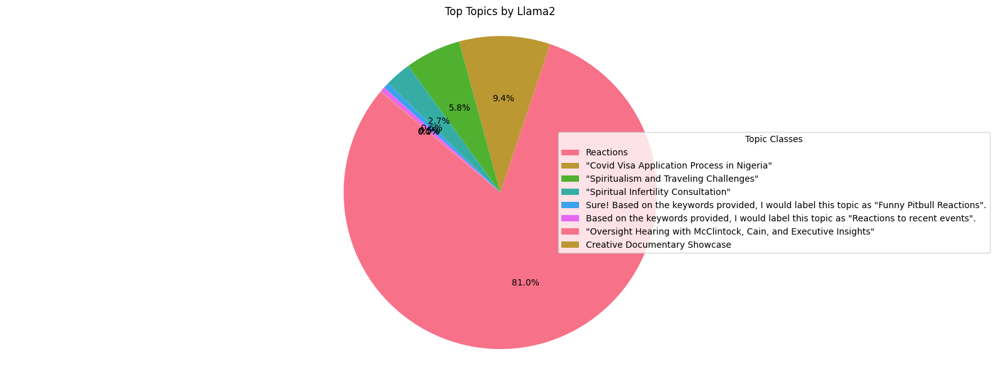

In [114]:
import matplotlib.pyplot as plt
import seaborn as sns

# Count the occurrences of each topic
topic_counts = df['llama2_labelone10'].value_counts()

# Create a pie chart with each topic showing the distribution of counts
plt.figure(figsize=(16, 6))
patches, _, _ = plt.pie(topic_counts, labels=None, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('husl'))
plt.title('Top Topics by Llama2')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle

# Create a legend based on the top topics
plt.legend(patches, topic_counts.index, title='Topic Classes', loc='center right')

plt.tight_layout()
plt.show()


In [133]:
df2.shape

(27545, 33)

In [141]:
df=df2.copy()

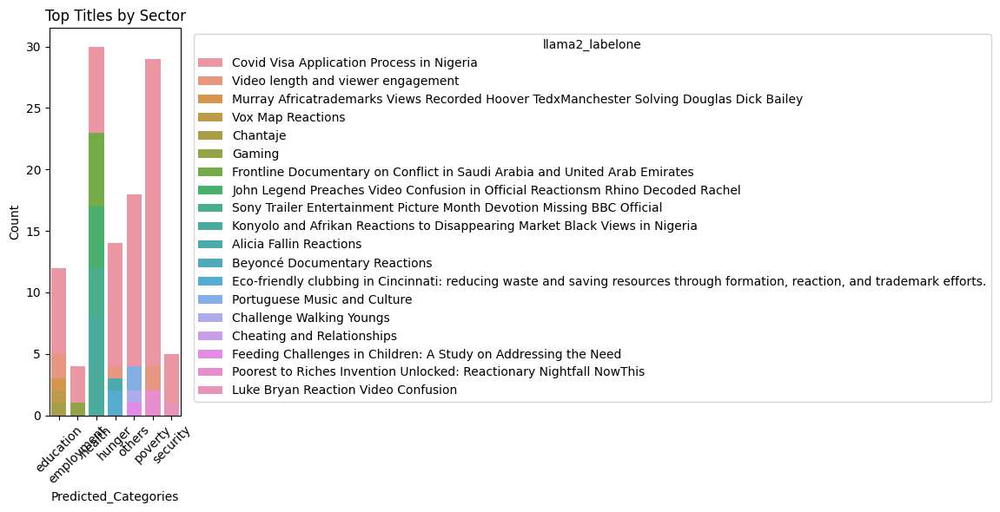

In [142]:
# name_counts = df2['llama2_labelone'].value_counts()
# # Select the top 20 name_counts
# top_name_counts = name_counts.head(10)

# # Create a bar plot for the top 20 name counts
# plt.figure(figsize=(10, 6))
# top_name_counts.plot(kind='barh')
# plt.title('Top Common Topics')
# plt.xlabel('Topic_name')
# plt.ylabel('Count')
# plt.show()
# List of specific titles
specific_titles = ['hunger', 'employment', 'security', 'others','poverty', 'health', 'education']
import pandas as pd

df['llama2_labelone'] = df['llama2_labelone'].astype(str)

# Extract values within double quotes using regular expressions
df['llama2_labelone'] = df['llama2_labelone'].apply(lambda x: re.findall(r'"([^"]*)"', x))

# Explode the lists into separate rows
df_exploded = df.explode('llama2_labelone')

# Get unique values
unique_values = df_exploded['llama2_labelone'].unique()

# # Print unique values
# print(unique_values)


# Filter the DataFrame based on specific titles
filtered_df = df_exploded[df_exploded['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = filtered_df.groupby(['llama2_labelone', 'Predicted_Categories']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('Predicted_Categories').apply(lambda x: x.nlargest(5, 'Count'))

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(12, 6))
sns.barplot(data=top_counts_by_sector, x='Predicted_Categories', y='Count', hue='llama2_labelone', dodge=False)
plt.title('Top Titles by Sector')
plt.xlabel('Predicted_Categories')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='llama2_labelone', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [143]:
df=df_exploded.copy()

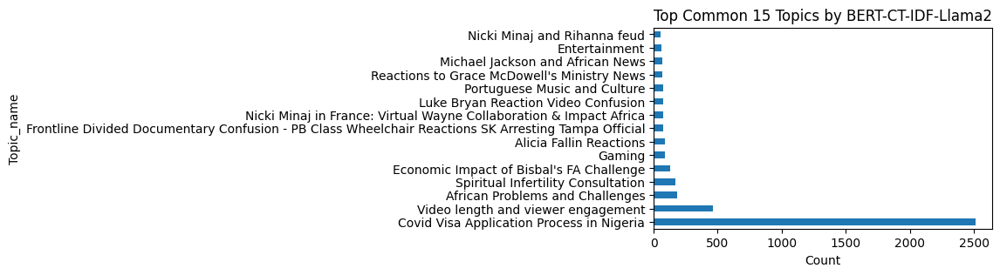

In [146]:
name_counts = df['llama2_labelone'].value_counts()
# Select the top 20 name_counts
top_name_counts = name_counts.head(15)

# Create a bar plot for the top 20 name counts
plt.figure(figsize=(5, 3))
top_name_counts.plot(kind='barh')
plt.title('Top Common 15 Topics by BERT-CT-IDF-Llama2')
plt.xlabel('Count')
plt.ylabel('Topic_name')
plt.show()

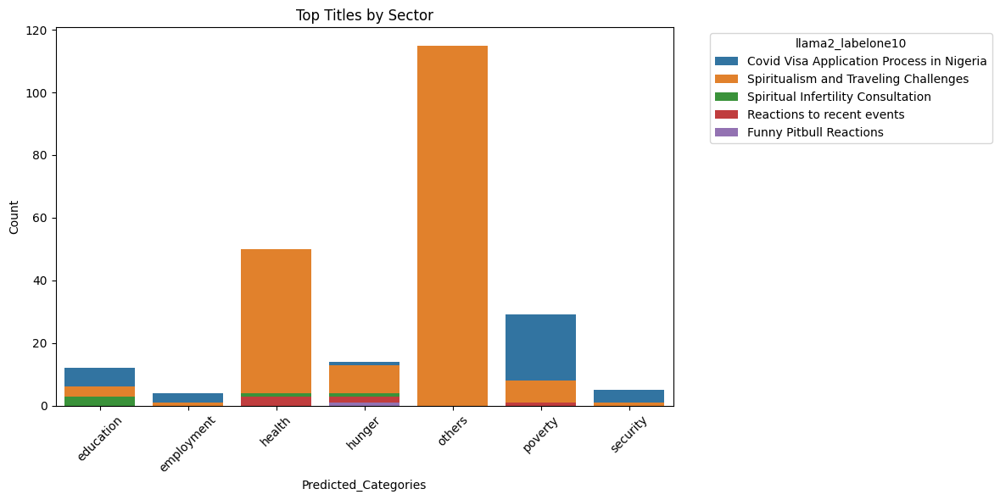

In [135]:
# List of specific titles
specific_titles = ['hunger', 'employment', 'security', 'others','poverty', 'health', 'education']
import pandas as pd

df['llama2_labelone10'] = df['llama2_labelone10'].astype(str)

# Extract values within double quotes using regular expressions
df['llama2_labelone10'] = df['llama2_labelone10'].apply(lambda x: re.findall(r'"([^"]*)"', x))

# Explode the lists into separate rows
df_exploded = df.explode('llama2_labelone10')

# Get unique values
unique_values = df_exploded['llama2_labelone10'].unique()

# # Print unique values
# print(unique_values)


# Filter the DataFrame based on specific titles
filtered_df = df_exploded[df_exploded['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = filtered_df.groupby(['llama2_labelone10', 'Predicted_Categories']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('Predicted_Categories').apply(lambda x: x.nlargest(5, 'Count'))

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(12, 6))
sns.barplot(data=top_counts_by_sector, x='Predicted_Categories', y='Count', hue='llama2_labelone10', dodge=False)
plt.title('Top Titles by Sector')
plt.xlabel('Predicted_Categories')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='llama2_labelone10', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [137]:
df=df_exploded.copy()

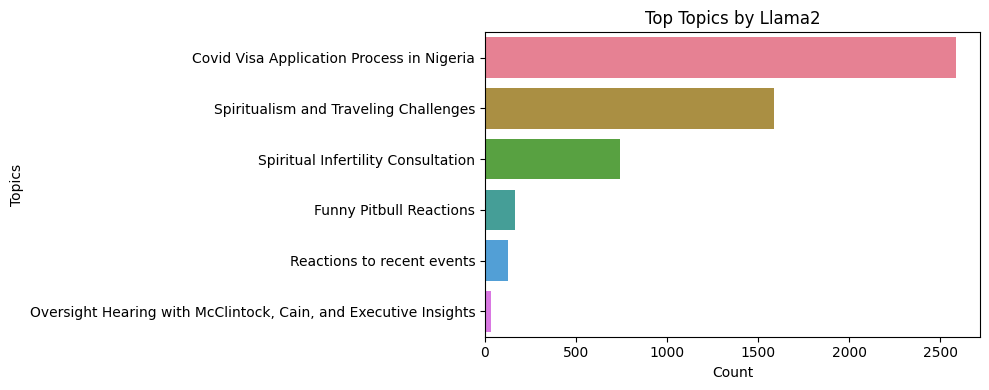

In [138]:
import matplotlib.pyplot as plt
import seaborn as sns

# Count the occurrences of each topic
topic_counts = df['llama2_labelone10'].value_counts()

# Create a horizontal bar chart
plt.figure(figsize=(10, 4))
sns.barplot(x=topic_counts.values, y=topic_counts.index, palette='husl')
plt.title('Top Topics by Llama2')
plt.xlabel('Count')
plt.ylabel('Topics')

plt.tight_layout()
plt.show()


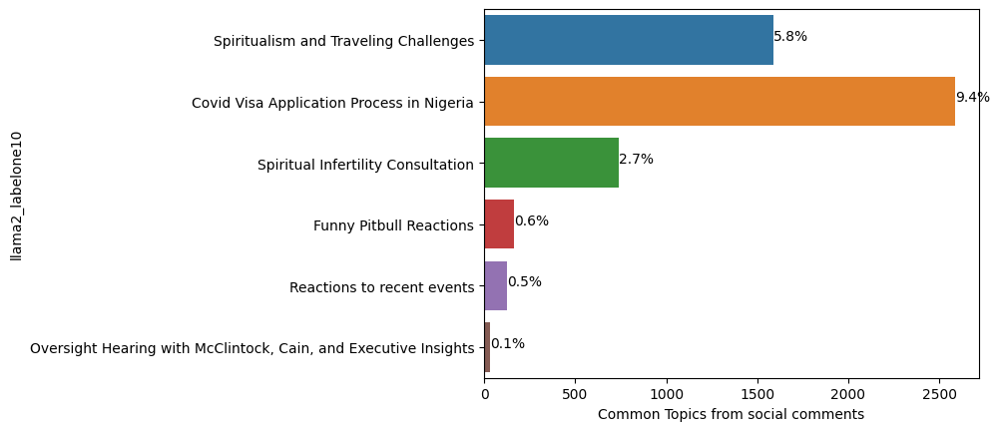

In [140]:
ax = sns.countplot(y="llama2_labelone10", data=df)
#plt.title('Distribution of  Configurations')
plt.xlabel('Common Topics from social comments')

total = len(df['llama2_labelone10'])
for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_width()/total)
        x = p.get_x() + p.get_width() + 0.02
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y))

plt.show()

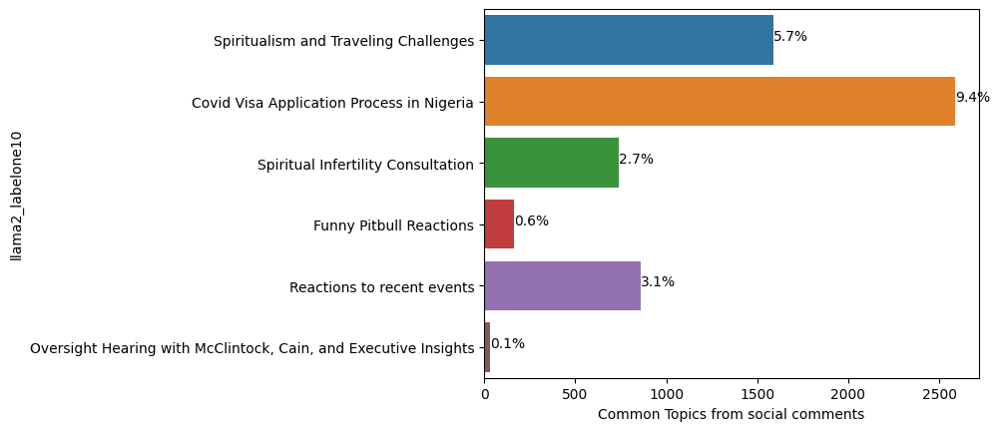

In [178]:
ax = sns.countplot(y="llama2_labelone10", data=df)
#plt.title('Distribution of  Configurations')
plt.xlabel('Common Topics from social comments')

total = len(df['llama2_labelone10'])
for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_width()/total)
        x = p.get_x() + p.get_width() + 0.02
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y))

plt.show()

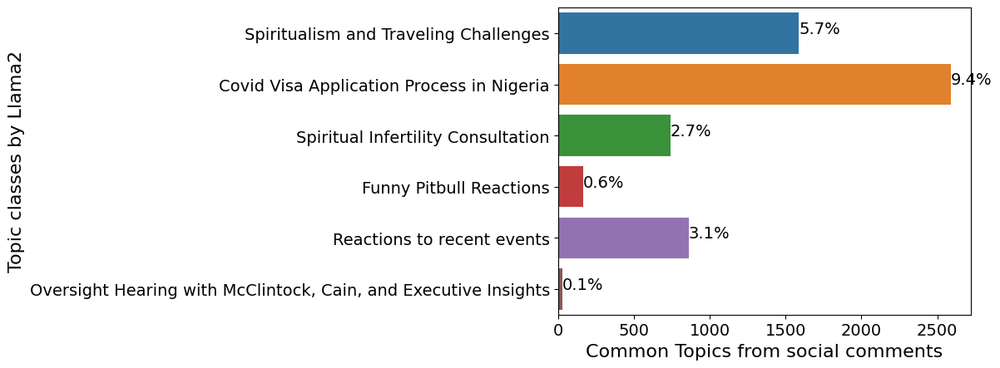

In [182]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create count plot
ax = sns.countplot(y="llama2_labelone10", data=df)

# Set font size for axis labels and tick labels
ax.set_xlabel('Common Topics from social comments', fontsize=16)
ax.set_ylabel('Topic classes by Llama2', fontsize=16)
ax.tick_params(axis='both', labelsize=14)

total = len(df['llama2_labelone10'])

# Annotate each bar with percentage
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_width()/total)
    x = p.get_x() + p.get_width() + 0.02
    y = p.get_y() + p.get_height()/2
    ax.annotate(percentage, (x, y), fontsize=14)

plt.show()


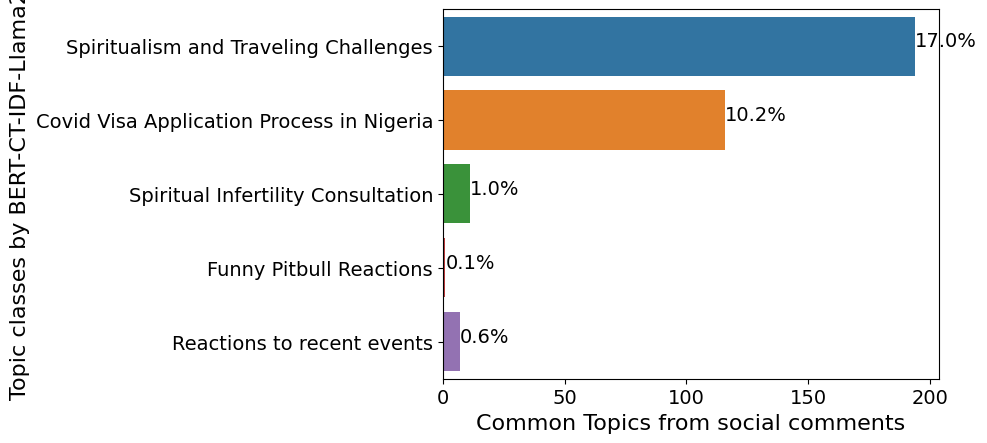

In [132]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create count plot
ax = sns.countplot(y="llama2_labelone10", data=df)

# Set font size for axis labels and tick labels
ax.set_xlabel('Common Topics from social comments', fontsize=16)
ax.set_ylabel('Topic classes by BERT-CT-IDF-Llama2', fontsize=16)
ax.tick_params(axis='both', labelsize=14)

total = len(df['llama2_labelone10'])

# Annotate each bar with percentage
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_width()/total)
    x = p.get_x() + p.get_width() + 0.02
    y = p.get_y() + p.get_height()/2
    ax.annotate(percentage, (x, y), fontsize=14)

plt.show()


In [183]:
text = """Knowledge about prevalent social issues relevant to development discussed on social media
platforms could be an important means of helping policymakers to learn what matters to their constituents.
The goal of our study is to develop Artificial Intelligence-driven models that can effectively identify key
topics of development-related concerns from social comments in Africa and then be able to classify social
texts to these selected meaningful social issues of interest. From the state-of-art, we reviewed methods for text
clustering, and topic modeling. Currently, the representation of the common topics extracted corresponds to
a list of top frequent words, while our study instead goes one step further and utilizes large language models
to deduce semantically meaningful short sentence topic labels. The base models used BERTopic-Llama2, a
topic modeling, to extract sentence topic labels using Llama2. We proposed using BERT-CTF-IDF-Llama2, a
text clustering method, to outperform their contribution. First, we collected 31,694 records from Facebook,
Twitter, and YouTube, split the dataset into 80% training and 20% testing sets. Then, we used the train
dataset to apply deep representation learning methods such as BERT models to generate embeddings that
can serve as features. Thereafter, we compared two prevalent methods of latent semantic text analysis within
our framework, namely, text clustering versus topic modeling. We used these NLP tasks to cluster the text
representations into groups with contextual meaning. For each cluster group, the Llama2 model generates
short sentence labels using the top key important tokens by CTF-IDF model. After obtaining the sentence
topic labels for the train dataset, we evaluate the text groups using topic coherence and diversity metrics.
The labeled train dataset is further split into 80% train and 20% evaluation dataset to develop a classifier
for topic identification as a supervised learning task. Thereafter, we used the selected Ensemble models to
predict the sentence topic labels on a new unlabeled test dataset. Our model, BERT-C-TFIDF-Llama2 out
the performed the base model by yielding a difference of 11 topics at a range of 4% coherence and 18%
accuracy scores. By employing iterative topic refinement, our model had extracted 6 topic classes at a range
of 5% coherence and 6%classification accuracy. In conclusion, our study has developed AI-based models
that now can be used for extracting common topics of discussion about development using social media data.
In the future, our models could be adopted by policymakers and researchers alike to study social issues for
different geographic regions of interest"""

# Split the text into words
words = text.split()

# Count the number of words
num_words = len(words)

print("Number of words:", num_words)


Number of words: 405


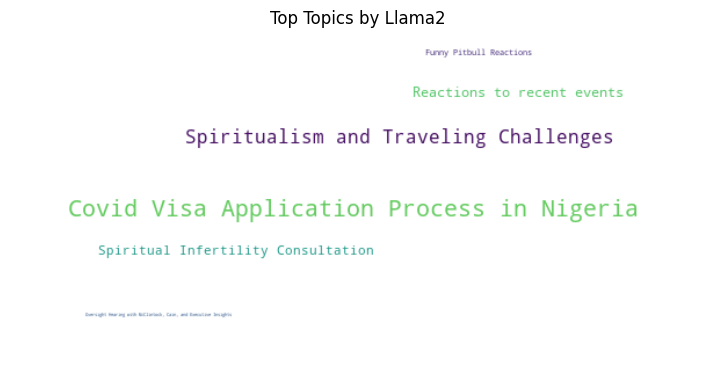

In [168]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Count the occurrences of each topic
topic_counts = df['llama2_labelone10'].value_counts()
# Create a word cloud based on the topic counts
wordcloud = WordCloud(width=600, height=300, background_color='white').generate_from_frequencies(topic_counts)

# Display the word cloud
plt.figure(figsize=(8, 4))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Top Topics by Llama2')
plt.axis('off')

plt.tight_layout()
plt.show()


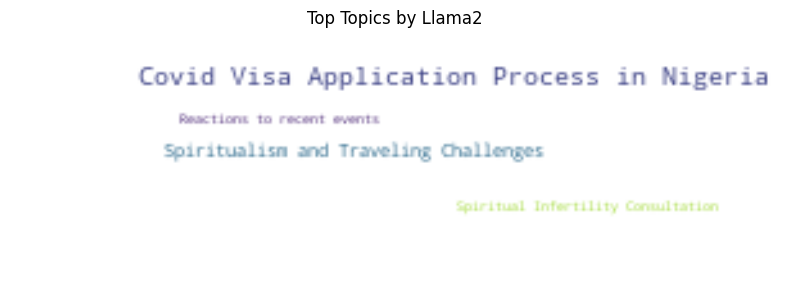

In [169]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Count the occurrences of each topic
topic_counts = df['llama2_labelone10'].value_counts()
# Create a word cloud based on the topic counts
wordcloud = WordCloud(width=300, height=100, background_color='white').generate_from_frequencies(topic_counts)

# Display the word cloud
plt.figure(figsize=(8, 4))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Top Topics by Llama2')
plt.axis('off')

plt.tight_layout()
plt.show()


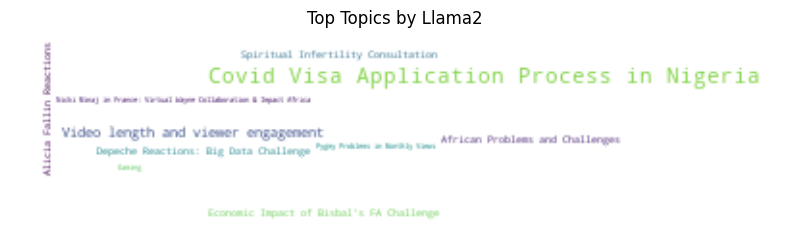

In [174]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Count the occurrences of each topic
topic_counts = df['llama2_labelone'].value_counts()
# Create a word cloud based on the topic counts
wordcloud = WordCloud(width=400, height=100, background_color='white').generate_from_frequencies(topic_counts)

# Display the word cloud
plt.figure(figsize=(8, 4))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Top Topics by Llama2')
plt.axis('off')

plt.tight_layout()
plt.show()


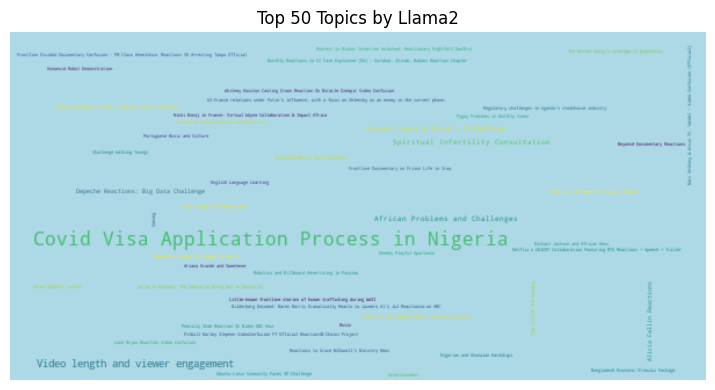

In [167]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Count the occurrences of each topic and select the top 50
topic_counts = df['llama2_labelone'].value_counts().head(50)

# Create a word cloud based on the top 50 topic counts with a light blue background
wordcloud = WordCloud(width=600, height=300, background_color='lightblue').generate_from_frequencies(topic_counts)

# Display the word cloud
plt.figure(figsize=(8, 4))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Top 50 Topics by Llama2')
plt.axis('off')

plt.tight_layout()
plt.show()


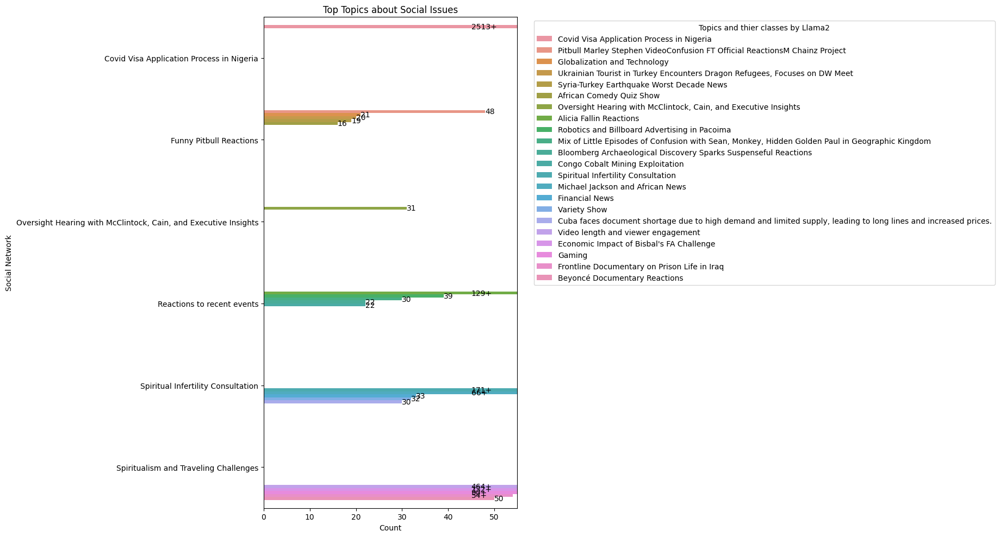

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of specific titles
# specific_titles = ['poverty']

# Filter the DataFrame based on specific titles
# filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = df.groupby(['llama2_labelone', 'llama2_labelone10']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('llama2_labelone10').apply(lambda x: x.nlargest(5, 'Count'))

# Set maximum count for high frequency bars
max_count = 50

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(19, 10))
sns.barplot(data=top_counts_by_sector, y='llama2_labelone10', x='Count', hue='llama2_labelone', dodge=True)
plt.title('Top Topics about Social Issues')
plt.xlabel('Count')
plt.ylabel('Social Network')
plt.legend(title='Topics and thier classes by Llama2', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add count text to the bars
for patch in plt.gca().patches:
    if patch.get_width() > 0:
        total = patch.get_width()
        if total <= max_count:
            plt.text(patch.get_width(), patch.get_y() + patch.get_height() / 2, f'{total:.0f}', ha='left', va='center')
        else:
            plt.text(max_count * 0.9, patch.get_y() + patch.get_height() / 2, f'{total:.0f}+', ha='left', va='center')

# Set x-axis limit
plt.xlim(0, max_count * 1.1)

plt.tight_layout()
plt.show()


/tmp/ipykernel_3802751/2385434458.py:39: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


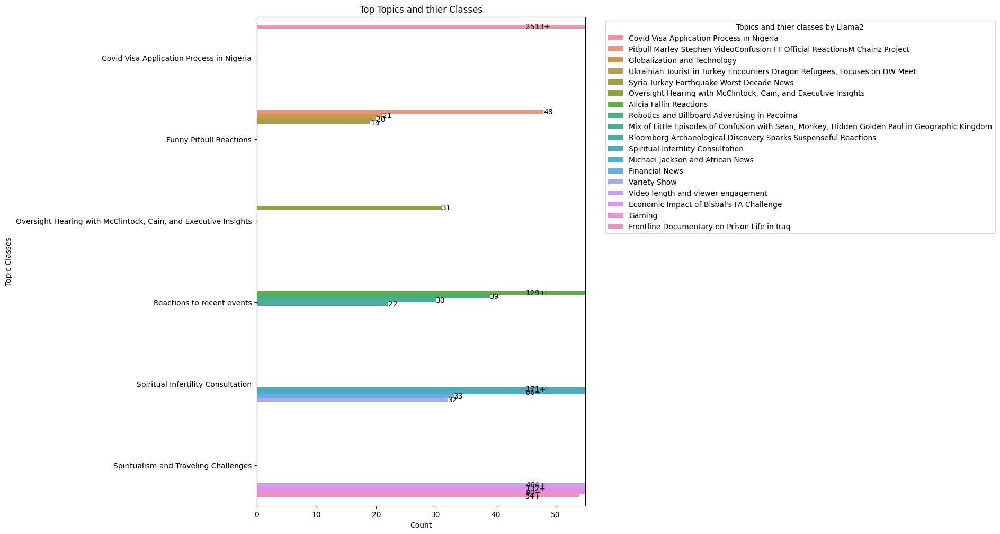

In [158]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of specific titles
# specific_titles = ['poverty']

# Filter the DataFrame based on specific titles
# filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = df.groupby(['llama2_labelone', 'llama2_labelone10']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('llama2_labelone10').apply(lambda x: x.nlargest(4, 'Count'))

# Set maximum count for high frequency bars
max_count = 50

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(8, 12))
sns.barplot(data=top_counts_by_sector, y='llama2_labelone10', x='Count', hue='llama2_labelone', dodge=True)
plt.title('Top Topics and thier Classes')
plt.xlabel('Count')
plt.ylabel('Topic Classes')
plt.legend(title='Topics and thier classes by Llama2', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add count text to the bars
for patch in plt.gca().patches:
    if patch.get_width() > 0:
        total = patch.get_width()
        if total <= max_count:
            plt.text(patch.get_width(), patch.get_y() + patch.get_height() / 2, f'{total:.0f}', ha='left', va='center')
        else:
            plt.text(max_count * 0.9, patch.get_y() + patch.get_height() / 2, f'{total:.0f}+', ha='left', va='center')

# Set x-axis limit
plt.xlim(0, max_count * 1.1)

plt.tight_layout()
plt.show()


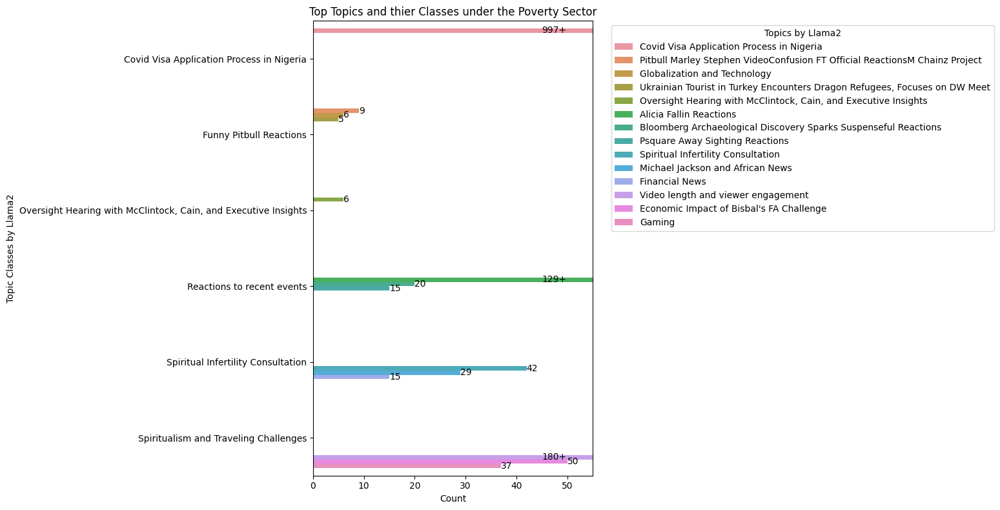

In [162]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of specific titles
specific_titles = ['poverty']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = filtered_df.groupby(['llama2_labelone', 'llama2_labelone10']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('llama2_labelone10').apply(lambda x: x.nlargest(3, 'Count'))

# Set maximum count for high frequency bars
max_count = 50

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(16, 8))
sns.barplot(data=top_counts_by_sector, y='llama2_labelone10', x='Count', hue='llama2_labelone', dodge=True)
plt.title('Top Topics and thier Classes under the Poverty Sector')
plt.xlabel('Count')
plt.ylabel('Topic Classes by Llama2')
plt.legend(title='Topics by Llama2', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add count text to the bars
for patch in plt.gca().patches:
    if patch.get_width() > 0:
        total = patch.get_width()
        if total <= max_count:
            plt.text(patch.get_width(), patch.get_y() + patch.get_height() / 2, f'{total:.0f}', ha='left', va='center')
        else:
            plt.text(max_count * 0.9, patch.get_y() + patch.get_height() / 2, f'{total:.0f}+', ha='left', va='center')

# Set x-axis limit
plt.xlim(0, max_count * 1.1)

plt.tight_layout()
plt.show()


/tmp/ipykernel_3802751/2037920540.py:39: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


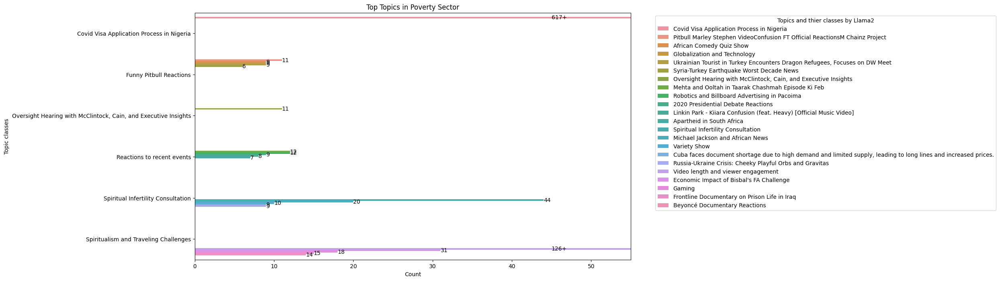

In [92]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of specific titles
specific_titles = ['security']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = filtered_df.groupby(['llama2_labelone', 'llama2_labelone10']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('llama2_labelone10').apply(lambda x: x.nlargest(5, 'Count'))

# Set maximum count for high frequency bars
max_count = 50

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(14, 8))
sns.barplot(data=top_counts_by_sector, y='llama2_labelone10', x='Count', hue='llama2_labelone', dodge=True)
plt.title('Top Topics in Poverty Sector')
plt.xlabel('Count')
plt.ylabel('Topic classes')
plt.legend(title='Topics and thier classes by Llama2', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add count text to the bars
for patch in plt.gca().patches:
    if patch.get_width() > 0:
        total = patch.get_width()
        if total <= max_count:
            plt.text(patch.get_width(), patch.get_y() + patch.get_height() / 2, f'{total:.0f}', ha='left', va='center')
        else:
            plt.text(max_count * 0.9, patch.get_y() + patch.get_height() / 2, f'{total:.0f}+', ha='left', va='center')

# Set x-axis limit
plt.xlim(0, max_count * 1.1)

plt.tight_layout()
plt.show()


ValueError: left cannot be >= right

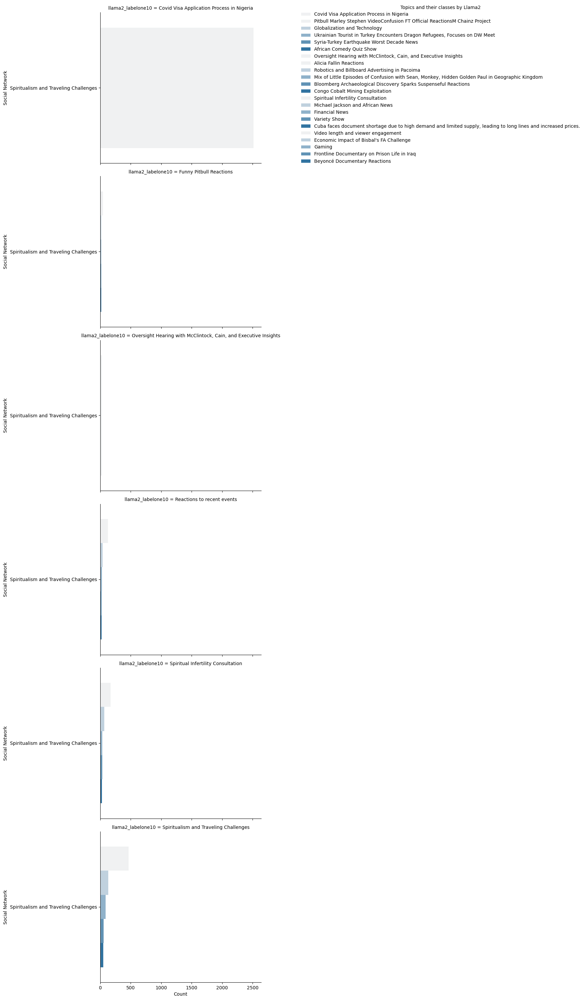

In [85]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of specific titles
# specific_titles = ['poverty']

# Filter the DataFrame based on specific titles
# filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = df.groupby(['llama2_labelone', 'llama2_labelone10']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('llama2_labelone10').apply(lambda x: x.nlargest(5, 'Count'))

# Set maximum count for high frequency bars
max_count = 50

# Create a FacetGrid to display each value of the y-axis on a separate subplot
g = sns.FacetGrid(top_counts_by_sector, col='llama2_labelone10', col_wrap=1, height=5)
g.map_dataframe(sns.barplot, y='llama2_labelone10', x='Count', hue='llama2_labelone', dodge=True)
g.set_axis_labels('Count', 'Social Network')
g.add_legend(title='Topics and their classes by Llama2', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add count text to the bars
for ax in g.axes.flat:
    for patch in ax.patches:
        if patch.get_width() > 0:
            total = patch.get_width()
            if total <= max_count:
                ax.text(patch.get_width(), patch.get_y() + patch.get_height() / 2, f'{total:.0f}', ha='left', va='center')
            else:
                ax.text(max_count * 0.9, patch.get_y() + patch.get_height() / 2, f'{total:.0f}+', ha='left', va='center')

# Set x-axis limit
for ax in g.axes.flat:
    ax.set_xlim(0, max_count * 1.1)

plt.tight_layout()
plt.show()


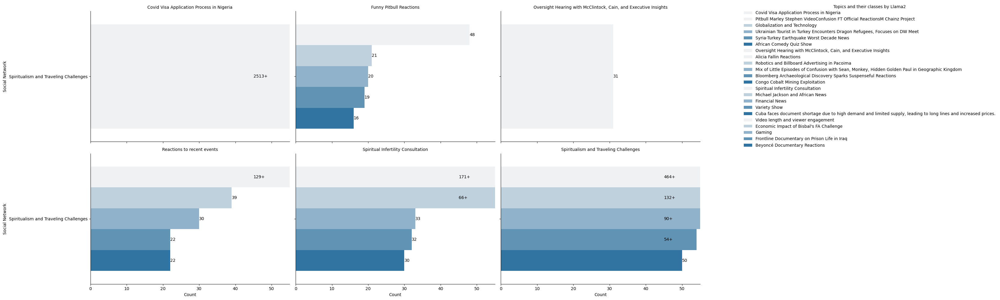

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of specific titles
# specific_titles = ['poverty']

# Filter the DataFrame based on specific titles
# filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = df.groupby(['llama2_labelone', 'llama2_labelone10']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('llama2_labelone10').apply(lambda x: x.nlargest(5, 'Count'))

# Set maximum count for high frequency bars
max_count = 50

# Create a FacetGrid to generate subplots for each value in llama2_labelone10
g = sns.FacetGrid(top_counts_by_sector, col='llama2_labelone10', col_wrap=3, height=5)
g.map_dataframe(sns.barplot, x='Count', y='llama2_labelone10', hue='llama2_labelone', dodge=True)
g.set_titles('{col_name}')
g.set_axis_labels('Count', 'Social Network')
g.add_legend(title='Topics and their classes by Llama2', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add count text to the bars
for ax in g.axes.flat:
    for patch in ax.patches:
        if patch.get_width() > 0:
            total = patch.get_width()
            if total <= max_count:
                ax.text(patch.get_width(), patch.get_y() + patch.get_height() / 2, f'{total:.0f}', ha='left', va='center')
            else:
                ax.text(max_count * 0.9, patch.get_y() + patch.get_height() / 2, f'{total:.0f}+', ha='left', va='center')

# Set x-axis limit
for ax in g.axes.flat:
    ax.set_xlim(0, max_count * 1.1)

plt.tight_layout()
plt.show()


/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)


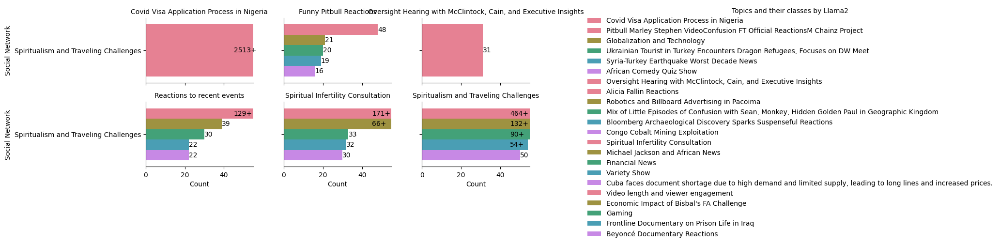

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of specific titles
# specific_titles = ['poverty']

# Filter the DataFrame based on specific titles
# filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = df.groupby(['llama2_labelone', 'llama2_labelone10']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('llama2_labelone10').apply(lambda x: x.nlargest(5, 'Count'))

# Set maximum count for high frequency bars
max_count = 50

# Create a FacetGrid to generate subplots for each value in llama2_labelone10
g = sns.FacetGrid(top_counts_by_sector, col='llama2_labelone10', col_wrap=3, height=2, aspect=0.5)
g.map_dataframe(sns.barplot, x='Count', y='llama2_labelone10', hue='llama2_labelone', dodge=True, palette='husl')  # Set palette to a single color
g.set_titles('{col_name}')
g.set_axis_labels('Count', 'Social Network')
g.add_legend(title='Topics and their classes by Llama2', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add count text to the bars
for ax in g.axes.flat:
    for patch in ax.patches:
        if patch.get_width() > 0:
            total = patch.get_width()
            if total <= max_count:
                ax.text(patch.get_width(), patch.get_y() + patch.get_height() / 2, f'{total:.0f}', ha='left', va='center')
            else:
                ax.text(max_count * 0.9, patch.get_y() + patch.get_height() / 2, f'{total:.0f}+', ha='left', va='center')

# Set x-axis limit
for ax in g.axes.flat:
    ax.set_xlim(0, max_count * 1.1)

plt.tight_layout()
plt.show()


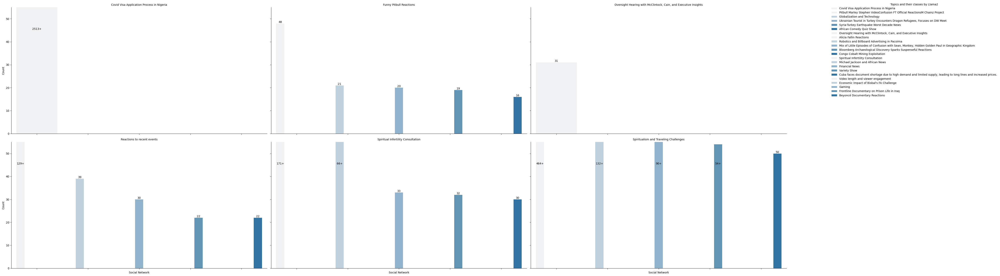

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of specific titles
# specific_titles = ['poverty']

# Filter the DataFrame based on specific titles
# filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = df.groupby(['llama2_labelone', 'llama2_labelone10']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('llama2_labelone10').apply(lambda x: x.nlargest(5, 'Count'))

# Set maximum count for high frequency bars
max_count = 50

# Create a FacetGrid to generate subplots for each value in llama2_labelone10
g = sns.FacetGrid(top_counts_by_sector, col='llama2_labelone10', col_wrap=3, height=7, aspect=1.5, 
                  col_order=top_counts_by_sector['llama2_labelone10'].unique())
g.map_dataframe(sns.barplot, x='llama2_labelone', y='Count', hue='llama2_labelone', dodge=True)
g.set_titles('{col_name}')
g.set_axis_labels('Social Network', 'Count')
g.add_legend(title='Topics and their classes by Llama2', bbox_to_anchor=(1.05, 1), loc='upper left')

# Rotate x-axis labels
for ax in g.axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# Add count text to the bars
for ax in g.axes.flat:
    for patch in ax.patches:
        if patch.get_height() > 0:
            total = patch.get_height()
            if total <= max_count:
                ax.text(patch.get_x() + patch.get_width() / 2, patch.get_height(), f'{total:.0f}', ha='center', va='bottom')
            else:
                ax.text(patch.get_x() + patch.get_width() / 2, max_count * 0.9, f'{total:.0f}+', ha='center', va='bottom')

# Set y-axis limit
for ax in g.axes.flat:
    ax.set_ylim(0, max_count * 1.1)

plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of specific titles
specific_titles = ['poverty']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = filtered_df.groupby(['llama2_labelone', 'llama2_labelone10']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('llama2_labelone10').apply(lambda x: x.nlargest(5, 'Count'))

# Set maximum count for high frequency bars
max_count = 50

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(12, 8))
sns.barplot(data=top_counts_by_sector, y='llama2_labelone10', x='Count', hue='llama2_labelone', dodge=True)
plt.title('Top Topics in Poverty Sector')
plt.xlabel('Count')
plt.ylabel('Social Network')
plt.legend(title='Topics and thier classes by Llama2', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add count text to the bars
for patch in plt.gca().patches:
    if patch.get_width() > 0:
        total = patch.get_width()
        if total <= max_count:
            plt.text(patch.get_width(), patch.get_y() + patch.get_height() / 2, f'{total:.0f}', ha='left', va='center')
        else:
            plt.text(max_count * 0.9, patch.get_y() + patch.get_height() / 2, f'{total:.0f}+', ha='left', va='center')

# Set x-axis limit
plt.xlim(0, max_count * 1.1)

plt.tight_layout()
plt.show()


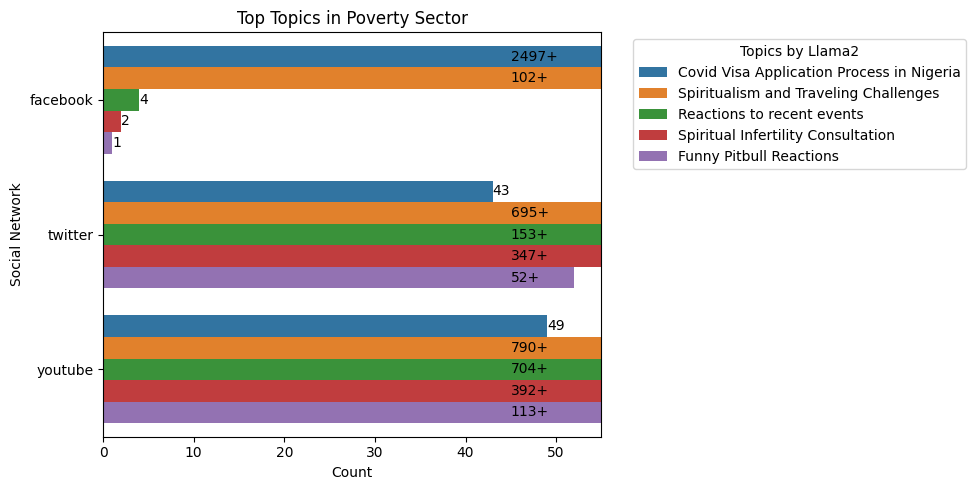

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns

# # List of specific titles
# specific_titles = ['poverty']

# # Filter the DataFrame based on specific titles
# filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = df.groupby(['llama2_labelone10', 'sourcetype']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(5, 'Count'))

# Set maximum count for high frequency bars
max_count = 50

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(10, 5))
sns.barplot(data=top_counts_by_sector, y='sourcetype', x='Count', hue='llama2_labelone10', dodge=True)
plt.title('Top Topics in Poverty Sector')
plt.xlabel('Count')
plt.ylabel('Social Network')
plt.legend(title='Topics by Llama2', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add count text to the bars
for patch in plt.gca().patches:
    if patch.get_width() > 0:
        total = patch.get_width()
        if total <= max_count:
            plt.text(patch.get_width(), patch.get_y() + patch.get_height() / 2, f'{total:.0f}', ha='left', va='center')
        else:
            plt.text(max_count * 0.9, patch.get_y() + patch.get_height() / 2, f'{total:.0f}+', ha='left', va='center')

# Set x-axis limit
plt.xlim(0, max_count * 1.1)

plt.tight_layout()
plt.show()


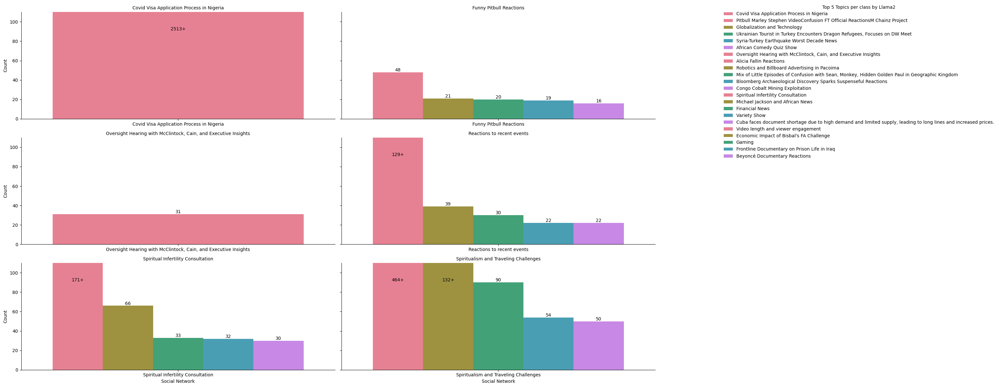

In [84]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of specific titles
# specific_titles = ['poverty']

# Filter the DataFrame based on specific titles
# filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = df.groupby(['llama2_labelone', 'llama2_labelone10']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('llama2_labelone10').apply(lambda x: x.nlargest(5, 'Count'))

# Set maximum count for high frequency bars
max_count = 100

# Create a FacetGrid to generate subplots for each value in llama2_labelone10
g = sns.FacetGrid(top_counts_by_sector, col='llama2_labelone10', col_wrap=2, height=4, aspect=1.5, sharex=False)
g.map_dataframe(sns.barplot, x='llama2_labelone10', y='Count', hue='llama2_labelone', dodge=True, palette='husl')  # Set palette to a single color
g.set_titles('{col_name}')
g.set_axis_labels('Social Network', 'Count')
g.add_legend(title='Top 5 Topics per class by Llama2', bbox_to_anchor=(1.09, 1), loc='upper left')

# Add count text to the bars
for ax in g.axes.flat:
    for patch in ax.patches:
        if patch.get_height() > 0:
            total = patch.get_height()
            if total <= max_count:
                ax.text(patch.get_x() + patch.get_width() / 2, patch.get_height(), f'{total:.0f}', ha='center', va='bottom')
            else:
                ax.text(patch.get_x() + patch.get_width() / 2, max_count * 0.9, f'{total:.0f}+', ha='center', va='bottom')

# Set y-axis limit
for ax in g.axes.flat:
    ax.set_ylim(0, max_count * 1.1)

plt.tight_layout()
plt.show()


/home/hsibitenda/anaconda3/envs/harriet_env/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  self._figure.tight_layout(*args, **kwargs)


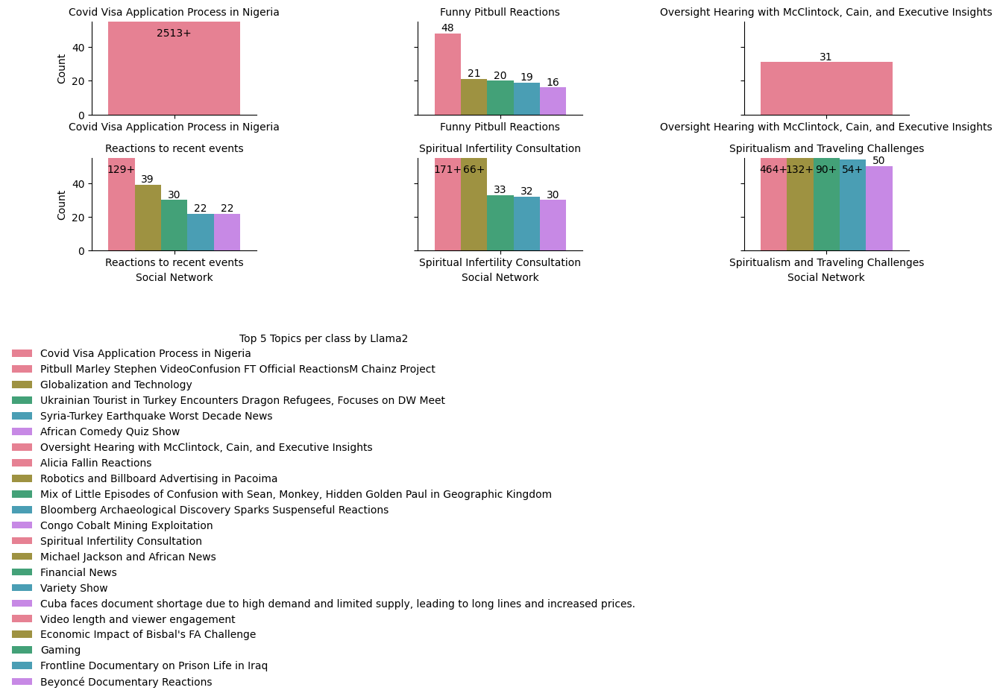

In [99]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of specific titles
# specific_titles = ['poverty']

# Filter the DataFrame based on specific titles
# filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = df.groupby(['llama2_labelone', 'llama2_labelone10']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('llama2_labelone10').apply(lambda x: x.nlargest(5, 'Count'))

# Set maximum count for high frequency bars
max_count = 50

# Create a FacetGrid to generate subplots for each value in llama2_labelone10
g = sns.FacetGrid(top_counts_by_sector, col='llama2_labelone10', col_wrap=3, height=2, aspect=0.9, sharex=False)
g.map_dataframe(sns.barplot, x='llama2_labelone10', y='Count', hue='llama2_labelone', dodge=True, palette='husl')  # Set palette to a single color
g.set_titles('{col_name}', fontsize=10)
g.set_axis_labels('Social Network', 'Count', fontsize=10)
g.add_legend(title='Top 5 Topics per class by Llama2', bbox_to_anchor=(0.3, -0.1), loc='upper center', fontsize=10)

# Add count text to the bars
for ax in g.axes.flat:
    for patch in ax.patches:
        if patch.get_height() > 0:
            total = patch.get_height()
            if total <= max_count:
                ax.text(patch.get_x() + patch.get_width() / 2, patch.get_height(), f'{total:.0f}', ha='center', va='bottom', fontsize=10)
            else:
                ax.text(patch.get_x() + patch.get_width() / 2, max_count * 0.9, f'{total:.0f}+', ha='center', va='bottom', fontsize=10)

# Set y-axis limit
for ax in g.axes.flat:
    ax.set_ylim(0, max_count * 1.1)

plt.tight_layout()
plt.show()


/tmp/ipykernel_1687133/3736965049.py:44: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


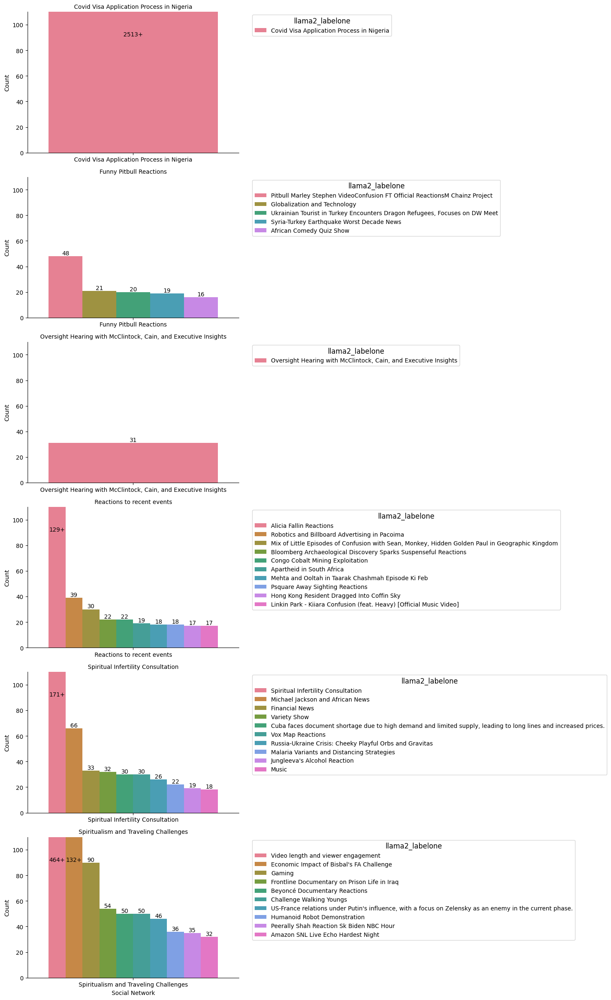

In [114]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of specific titles
# specific_titles = ['poverty']

# Filter the DataFrame based on specific titles
# filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = df.groupby(['llama2_labelone', 'llama2_labelone10']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('llama2_labelone10').apply(lambda x: x.nlargest(10, 'Count'))

# Set maximum count for high frequency bars
max_count = 100

# Create a FacetGrid to generate subplots for each value in llama2_labelone10
g = sns.FacetGrid(top_counts_by_sector, col='llama2_labelone10', col_wrap=1, height=4, aspect=1.5, sharex=False)
g.map_dataframe(sns.barplot, x='llama2_labelone10', y='Count', hue='llama2_labelone', dodge=True, palette='husl')  # Set palette to a single color
g.set_titles('{col_name}', fontsize=10)
g.set_axis_labels('Social Network', 'Count', fontsize=10)

# Add legend for each graph
for ax in g.axes.flat:
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles=handles, labels=labels, title='llama2_labelone', title_fontsize='large', fontsize='medium', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add count text to the bars
for ax in g.axes.flat:
    for patch in ax.patches:
        if patch.get_height() > 0:
            total = patch.get_height()
            if total <= max_count:
                ax.text(patch.get_x() + patch.get_width() / 2, patch.get_height(), f'{total:.0f}', ha='center', va='bottom', fontsize=10)
            else:
                ax.text(patch.get_x() + patch.get_width() / 2, max_count * 0.9, f'{total:.0f}+', ha='center', va='bottom', fontsize=10)

# Set y-axis limit
for ax in g.axes.flat:
    ax.set_ylim(0, max_count * 1.1)

plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter the DataFrame for rows where 'llama2_labelone10' is "Reactions"
reactions_df = df[df['llama2_labelone10'] == 'Reactions']

# Count the occurrences of each title in 'llama2_labelone'
reactions_counts = reactions_df['llama2_labelone'].value_counts().reset_index()
reactions_counts.columns = ['llama2_labelone', 'Count']

# Set maximum count for high frequency bars
max_count = 100

# Filter the top 10 counts
top_counts = reactions_counts.head(10)

# Plot the top counts
plt.figure(figsize=(10, 6))
sns.barplot(data=top_counts, x='llama2_labelone', y='Count', palette='husl')

# Add count text to the bars
for index, row in top_counts.iterrows():
    plt.text(row.name, row.Count, f'{row.Count}', color='black', ha="center")

# Set y-axis limit
plt.ylim(0, max_count * 1.1)

# Set labels and title
plt.xlabel('llama2_labelone', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Top 10 Values in llama2_labelone for "Reactions"', fontsize=14)

plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


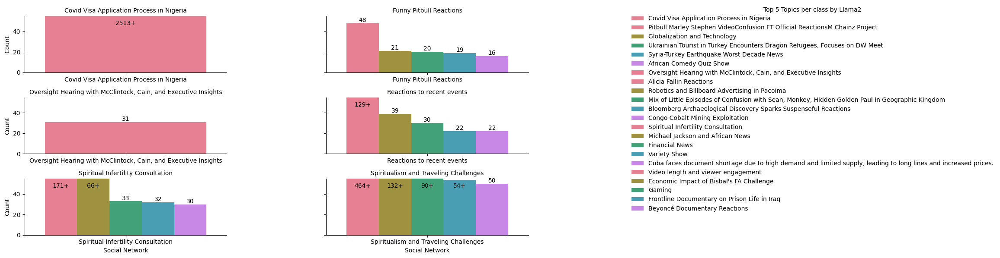

In [108]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of specific titles
# specific_titles = ['poverty']

# Filter the DataFrame based on specific titles
# filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = df.groupby(['llama2_labelone', 'llama2_labelone10']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('llama2_labelone10').apply(lambda x: x.nlargest(5, 'Count'))

# Set maximum count for high frequency bars
max_count = 50

# Create a FacetGrid to generate subplots for each value in llama2_labelone10
g = sns.FacetGrid(top_counts_by_sector, col='llama2_labelone10', col_wrap=2, height=2, aspect=1.5, sharex=False)
g.map_dataframe(sns.barplot, x='llama2_labelone10', y='Count', hue='llama2_labelone', dodge=True, palette='husl')  # Set palette to a single color
g.set_titles('{col_name}', fontsize=10)
g.set_axis_labels('Social Network', 'Count', fontsize=10)
g.add_legend(title='Top 5 Topics per class by Llama2', bbox_to_anchor=(1.09, 1), loc='upper left', fontsize=10)

# Add count text to the bars
for ax in g.axes.flat:
    for patch in ax.patches:
        if patch.get_height() > 0:
            total = patch.get_height()
            if total <= max_count:
                ax.text(patch.get_x() + patch.get_width() / 2, patch.get_height(), f'{total:.0f}', ha='center', va='bottom', fontsize=10)
            else:
                ax.text(patch.get_x() + patch.get_width() / 2, max_count * 0.9, f'{total:.0f}+', ha='center', va='bottom', fontsize=10)

# Set y-axis limit
for ax in g.axes.flat:
    ax.set_ylim(0, max_count * 1.1)

plt.tight_layout()
plt.show()


In [1]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of specific titles
specific_titles = ['"Reactions to Godsent\'s Anxiety-Inducing Video Confusion"']

# Filter the DataFrame based on specific titles
filtered_df = df[df['llama2_labelone102'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = filtered_df.groupby(['llama2_labelone2', 'llama2_labelone102']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('llama2_labelone102').apply(lambda x: x.nlargest(5, 'Count')).reset_index(drop=True)

# Set the maximum count to 300
max_count = 300

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(10, 6))
ax = sns.barplot(data=top_counts_by_sector, x='llama2_labelone102', y='Count', hue='llama2_labelone2', dodge=True)

# Add count labels above each bar
for p in ax.patches:
    count = p.get_height()
    if count > max_count:
        ax.annotate(f"{int(count)}+", 
                    (p.get_x() + p.get_width() / 2., max_count), 
                    ha='center', va='bottom', 
                    xytext=(0, 9), 
                    textcoords='offset points')
    else:
        ax.annotate(f"{int(count)}", 
                    (p.get_x() + p.get_width() / 2., count), 
                    ha='center', va='bottom', 
                    xytext=(0, 9), 
                    textcoords='offset points')

# Set y-axis limit to max_count
plt.ylim(0, max_count + 50)  # Adjusted to add some space above the max count

# Increase font size for title, labels, and legend
plt.title('Top Titles by Sector', fontsize=14)
plt.xlabel('Predicted_Categories', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=0, fontsize=10)
plt.yticks(fontsize=10)
plt.legend(title='llama2_labelone2', title_fontsize='12', fontsize='10', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


NameError: name 'df' is not defined

In [98]:
# Calculate total count for each sourcetype
total_count_by_sourcetype = title_sector_counts.groupby('sourcetype')['Count'].transform('sum')

# Calculate total count for each topic
total_count_by_topic = title_sector_counts.groupby('llama2_labelone')['Count'].transform('sum')

# Calculate percentage scores for sourcetype
title_sector_counts['Percentage_by_sourcetype'] = (title_sector_counts['Count'] / total_count_by_sourcetype) * 100

# Calculate percentage scores for topic
title_sector_counts['Percentage_by_topic'] = (title_sector_counts['Count'] / total_count_by_topic) * 100

# Display the resulting DataFrame with percentage scores
print(title_sector_counts)


                                       llama2_labelone sourcetype  Count  \
0                   2020 Presidential Debate Reactions    youtube      3   
1                             African Comedy Quiz Show    youtube      4   
2                      African Problems and Challenges    twitter     13   
3                      African Problems and Challenges    youtube      8   
4                        African Proposals and Reports    youtube      1   
..                                                 ...        ...    ...   
284  Whitney Houston Casting Crown Reaction Sk Mira...    youtube     11   
285  Wisin & Yandel ft. Jennifer Lopez - Spotlighti...    youtube      5   
286                       Yuridia and Ukraine Conflict    twitter      1   
287                       Yuridia and Ukraine Conflict    youtube      9   
288          Zayn Malik's Netflix Speech and Reactions    youtube     12   

     Percentage_by_sourcetype  Percentage_by_topic  
0                    0.203390     

In [97]:
top_counts_by_sector

llama2_labelone sourcetype  \
sourcetype                                                                     
facebook   70           Covid Visa Application Process in Nigeria   facebook   
           277                 Video length and viewer engagement   facebook   
           53                          Cheating and Relationships   facebook   
           7                              Alicia Fallin Reactions   facebook   
           12                             Anxiety in Visual Media   facebook   
twitter    278                 Video length and viewer engagement    twitter   
           254                 Spiritual Infertility Consultation    twitter   
           88            Economic Impact of Bisbal's FA Challenge    twitter   
           8                              Alicia Fallin Reactions    twitter   
           119                                             Gaming    twitter   
youtube    9                              Alicia Fallin Reactions    youtube   
           80               Depeche Reactions: Big Data Challenge    youtube   
           279                 Video length and viewer engagement    youtube   
           159                Luke Bryan Reaction Video Confusion    youtube   
           196  Nicki Minaj in France: Virtual Wayne Collabora...    youtube   

                Count  
sourcetype             
facebook   70     991  
           277     34  
           53       2  
           7        1  
           12       1  
twitter    278    113  
           254     42  
           88      37  
           8       36  
           119     29  
youtube    9       92  
           80      36  
           279     33  
           159     26  
           196     26

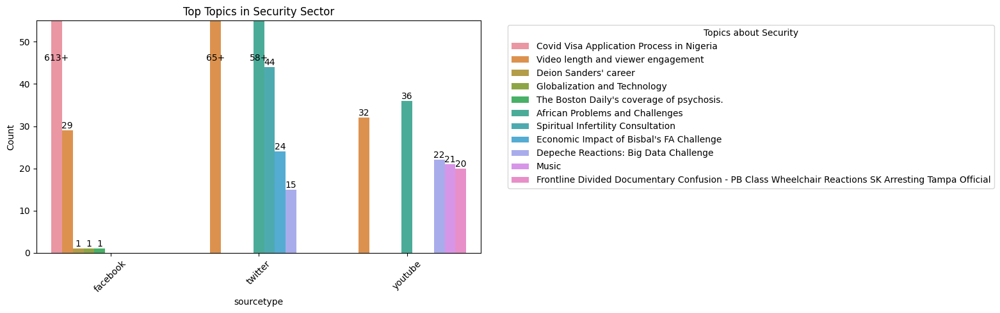

In [70]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of specific titles
specific_titles = ['security']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = filtered_df.groupby(['llama2_labelone', 'sourcetype']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(5, 'Count'))

# Set maximum count for high frequency bars
max_count = 50

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(16, 5))
sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='llama2_labelone', dodge=True)
plt.title('Top Topics in Security Sector')
plt.xlabel('sourcetype')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Topics about Secu', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add percentage text to the bars
for patch in plt.gca().patches:
    if patch.get_height() > 0:
        total = patch.get_height()
        if total <= max_count:
            plt.text(patch.get_x() + patch.get_width() / 2, patch.get_height(), f'{total:.0f}', ha='center', va='bottom')
        else:
            plt.text(patch.get_x() + patch.get_width() / 2, max_count * 0.9, f'{total:.0f}+', ha='center', va='bottom')

# Set y-axis limit
plt.ylim(0, max_count * 1.1)

plt.tight_layout()
plt.show()


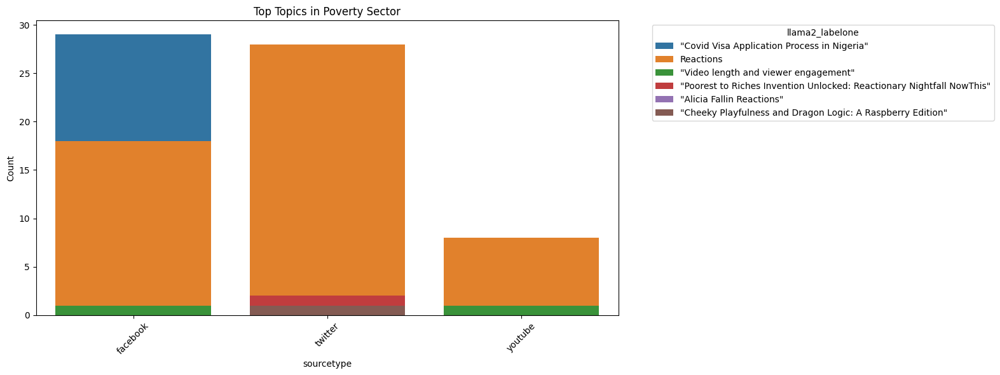

In [115]:
# List of specific titles
specific_titles = ['poverty']#, 'employment', 'security', 'poverty', 'health', 'education']

# Filter the DataFrame based on specific titles
filtered_df = df2[df2['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = filtered_df.groupby(['llama2_labelone', 'sourcetype']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(5, 'Count'))

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(16, 6))
sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='llama2_labelone', dodge=False)
plt.title('Top Topics in Poverty Sector')
plt.xlabel('sourcetype')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='llama2_labelone', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [162]:
# # List of specific titles
# specific_titles = ['poverty']#, 'employment', 'security', 'poverty', 'health', 'education']

# # Filter the DataFrame based on specific titles
# filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# # Count the occurrences of each title and sector
# title_sector_counts = filtered_df.groupby(['llama2_labelone10', 'sourcetype']).size().reset_index(name='Count')

# # Get the top count values of Name_x for each Keysector
# top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(5, 'Count'))

# # Create a bar graph with each Keysector displaying the top counts of Name_x
# plt.figure(figsize=(16, 6))
# sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='llama2_labelone10', dodge=False)
# plt.title('Top Topics in Poverty Sector')
# plt.xlabel('sourcetype')
# plt.ylabel('Count')
# plt.xticks(rotation=45)
# plt.legend(title='llama2_labelone10', bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.tight_layout()
# plt.show()

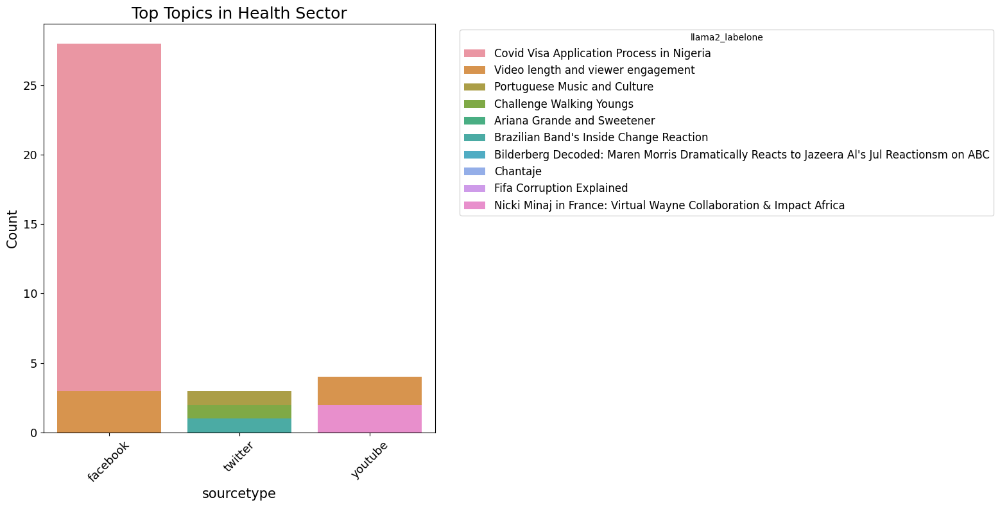

In [277]:
# List of specific titles
specific_titles = ['health']#, 'employment', 'security', 'poverty', 'health', 'education']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = filtered_df.groupby(['llama2_labelone', 'sourcetype']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(5, 'Count'))

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(16, 8))
sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='llama2_labelone', dodge=False)
plt.title('Top Topics in Health Sector')
plt.xlabel('sourcetype')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='llama2_labelone', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

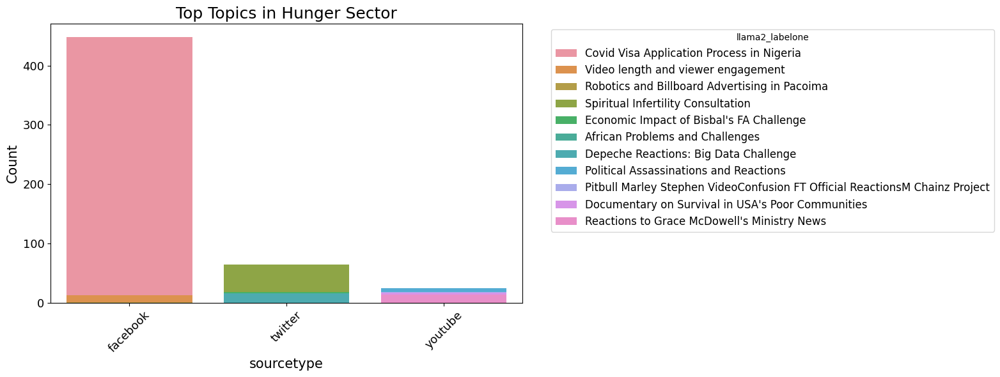

In [278]:
# List of specific titles
specific_titles = ['hunger']#, 'employment', 'security', 'poverty', 'health', 'education']

# Filter the DataFrame based on specific titles
filtered_df = df[df['Predicted_Categories'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = filtered_df.groupby(['llama2_labelone', 'sourcetype']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(5, 'Count'))

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(16, 6))
sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='llama2_labelone', dodge=False)
plt.title('Top Topics in Hunger Sector')
plt.xlabel('sourcetype')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='llama2_labelone', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [163]:
df2.shape

(27545, 28)

In [168]:
df=df2.copy()
df.shape

(27545, 28)

In [169]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

# Define list of search words
search_words = ['education', 'poverty', 'hunger', 'security', 'health', 'employment']

# Function to categorize records based on similarity to search words
def categorize_records(df):
    # Calculate TF-IDF matrix
    tfidf_vectorizer = TfidfVectorizer()
    tfidf_matrix = tfidf_vectorizer.fit_transform(df['Text_lemma'])
    cosine_similarities = cosine_similarity(tfidf_matrix, tfidf_matrix)

    # Iterate through each document
    for i in range(len(df)):
        similar_sectors = set()  # Use a set to store unique labels

        # Check similarity with each search word
        for search_keyword in search_words:
            if search_keyword in df['Text_lemma'][i]:
                similarity_scores = cosine_similarities[i]
                similar_indices = [j for j, score in enumerate(similarity_scores) if score == 1.0]
                for idx in similar_indices:
                    similar_sectors.add(search_keyword)  # Add label to set

        # Add categorized sectors to df
        if similar_sectors:
            df.at[i, 'Keysector'] = '|'.join(similar_sectors)
        else:
            # If no match found, label as "others"
            df.at[i, 'Keysector'] = 'others'

    return df

# Assuming you have a DataFrame df with columns 'CustomName' and 'Text_lemma'
df = categorize_records(df)


In [172]:
# df['Keysector'][20]
df['Keysectors'] = df['Keysector'].str.split('|', expand=True).stack().reset_index(drop=True)
health_records = df[df['Keysectors'].str.contains('health')]
health_records_text = health_records['Text_lemma'].unique()
health_records

,textid,Date,Views,sourcetype,alltext,Text_emt,Text_emj,Text_langue,Text_translate,Text_langue2,Text_lower,Text_punct,Text_tags,Text_chat,Text_spell,Text_langue3,Text_translate2,Text_token,Text_stop,Text_stem,Text_lemma,llama2_labelone,cluster_labelone,llama2_labelone10,cluster_labelone10,Text_lemma2,Predicted_Categories,Predicted_Categories2,Keysector,Keysectors
57,21872,2023-08-22,514,youtube,WHO Hopeful of Eradicating Guinea Worm Disea...,WHO Hopeful of Eradicating Guinea Worm Disea...,WHO Hopeful of Eradicating Guinea Worm Disea...,en,WHO Hopeful of Eradicating Guinea Worm Disea...,en,who hopeful of eradicating guinea worm disea...,who hopeful of eradicating guinea worm disease...,who hopeful of eradicating guinea worm disease...,who hopeful of eradicating guinea worm disease...,who hopeful of eradicating guinea worm disease...,en,who hopeful of eradicating guinea worm disease...,"['who', 'hopeful', 'of', 'eradicating', 'guine...",hopeful eradicating guinea worm disease rwanda...,hope erad guinea worm diseas rwandan artist fi...,hopeful eradicating guinea worm disease rwanda...,Reactions,reactionsk__reaction__problem__reactionsm__cha...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,exactly theretrademarks fela track economic po...,employment|education|security|health,health,health,health
90,18404,2023-02-24,971,youtube,Chimamanda Adichie Exposes Stolen African 'A...,Chimamanda Adichie Exposes Stolen African 'A...,Chimamanda Adichie Exposes Stolen African 'A...,en,Chimamanda Adichie Exposes Stolen African 'A...,en,chimamanda adichie exposes stolen african 'a...,chimamanda adichie exposes stolen african art ...,chimamanda adichie exposes stolen african art ...,chimamanda adichie exposes stolen african art ...,chimamanda adichie exposes stolen african art ...,en,chimamanda adichie exposes stolen african art ...,"['chimamanda', 'adichie', 'exposes', 'stolen',...",chimamanda adichie exposes stolen african art ...,chimamanda adichi expos stolen african art eur...,chimamanda adichie expose stolen african art e...,Reactions,reactionsk__reaction__problem__reactionsm__cha...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,inside bill brain decoding bill gate official ...,hunger|education|security|health,employment,others,health
132,23986,2021-08-24,923,youtube,Answering questions about my Tik Tok crush!!...,Answering questions about my Tik Tok crush!!...,Answering questions about my Tik Tok crush!!...,en,Answering questions about my Tik Tok crush!!...,en,answering questions about my tik tok crush!!...,answering questions about my tik tok crush so...,answering questions about my tik tok crush so...,answering questions about my tik tok crush sou...,answering questions about my tik tok crush sou...,en,answering questions about my tik tok crush sou...,"['answering', 'questions', 'about', 'my', 'tik...",answering questions tik tok crush south africa...,answer question tik tok crush south african yo...,answering question tik tok crush african youtu...,Reactions,reactionsk__reaction__problem__reactionsm__cha...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,watch greta thunbergs full speech leader un cl...,poverty|education|security|health,poverty,others,health
192,6272,2021-03-16 19:05:35+00:00,17,twitter,I nominate \n@ChimuanyaDike\n selection for t...,I nominate \n@ChimuanyaDike\n selection for t...,I nominate \n@ChimuanyaDike\n selection for t...,en,I nominate \n@ChimuanyaDike\n selection for t...,en,i nominate \n@chimuanyadike\n selection for t...,i nominate selection for the womens chall...,i nominate selection for the womens chall...,i nominate selection for the womens challenge ...,i nominate selection for the womens challenge ...,en,i nominate selection for the womens challenge ...,"['i', 'nominate', 'selection', 'for', 'the', '...",nominate selection womens challenge ng working...,nomin select women challeng ng work social med...,nominate selection woman challenge ng working ...,Reactions,re

In [173]:
df['Keysector'].unique()

array(['others', 'security', 'health', 'education|health|poverty',
       'education', 'employment|health|poverty', 'poverty',
       'security|health', 'employment|poverty', 'security|hunger|health',
       'employment', 'health|poverty', 'hunger|health|poverty',
       'education|health', 'hunger', 'security|poverty',
       'education|hunger|poverty', 'education|poverty',
       'education|employment', 'security|employment',
       'education|employment|poverty', 'health|employment',
       'hunger|poverty', 'hunger|employment', 'hunger|health',
       'education|health|employment', 'education|security',
       'education|security|health|poverty', 'security|health|employment',
       'security|health|poverty', 'education|security|health|employment',
       'education|security|health', 'security|employment|poverty',
       'security|hunger|education|health|poverty',
       'security|employment|health|poverty', 'security|hunger|poverty',
       'security|hunger|employment|education|he

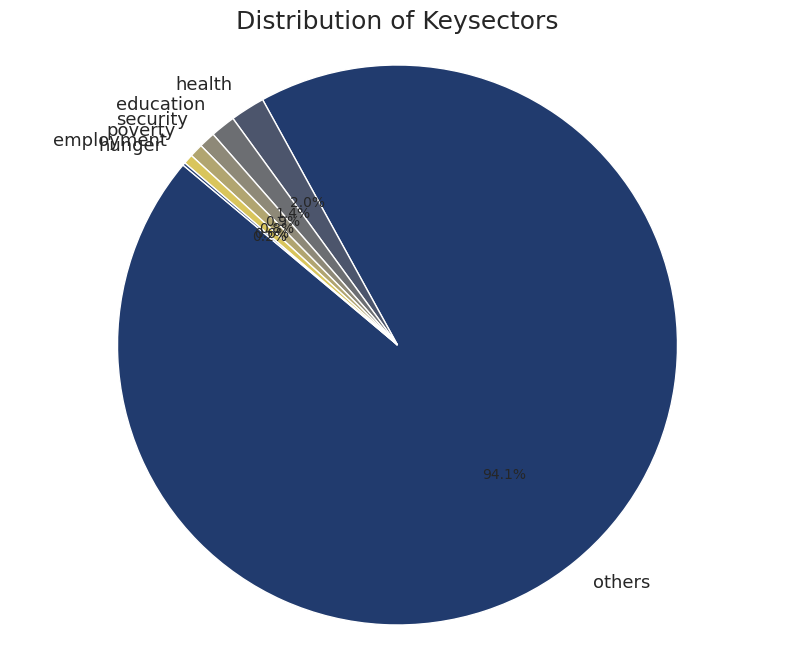

In [174]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df is your DataFrame with columns 'Text_lemma' and 'Keysector'

# Count occurrences of each label
df['Keysectors'] = df['Keysector'].str.split('|', expand=True).stack().reset_index(drop=True)
label_counts = df['Keysectors'].value_counts()

# Plotting the pie chart
plt.figure(figsize=(10, 8))
plt.pie(label_counts, labels=label_counts.index, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Distribution of Keysectors')
plt.show()


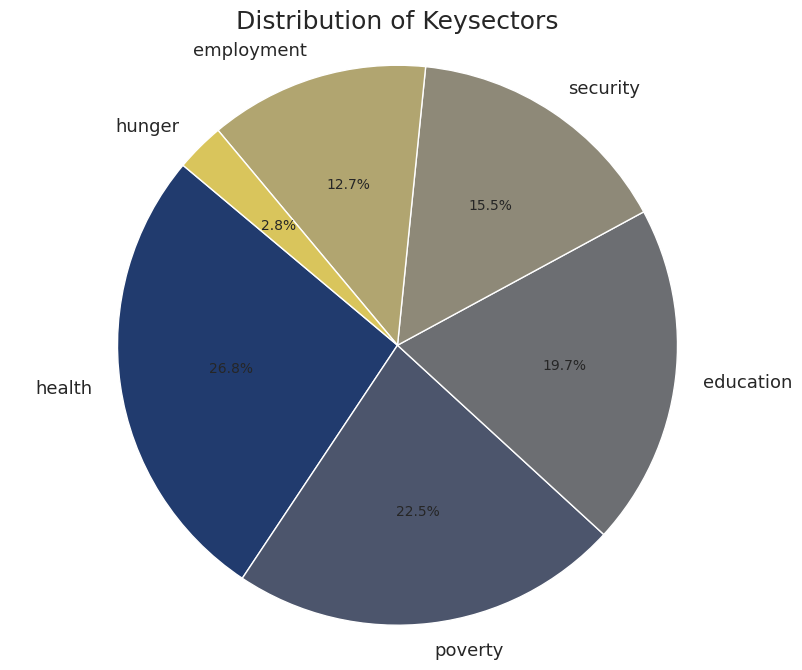

In [175]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df is your DataFrame with columns 'Text_lemma' and 'Keysector'

# Filter out 'others' from the DataFrame
df_filtered = df[df['Keysector'] != 'others']

# Count occurrences of each label
df_filtered['Keysectors'] = df_filtered['Keysector'].str.split('|', expand=True).stack().reset_index(drop=True)
label_counts = df_filtered['Keysectors'].value_counts()

# Plotting the pie chart
plt.figure(figsize=(10, 8))
plt.pie(label_counts, labels=label_counts.index, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Distribution of Keysectors')
plt.show()


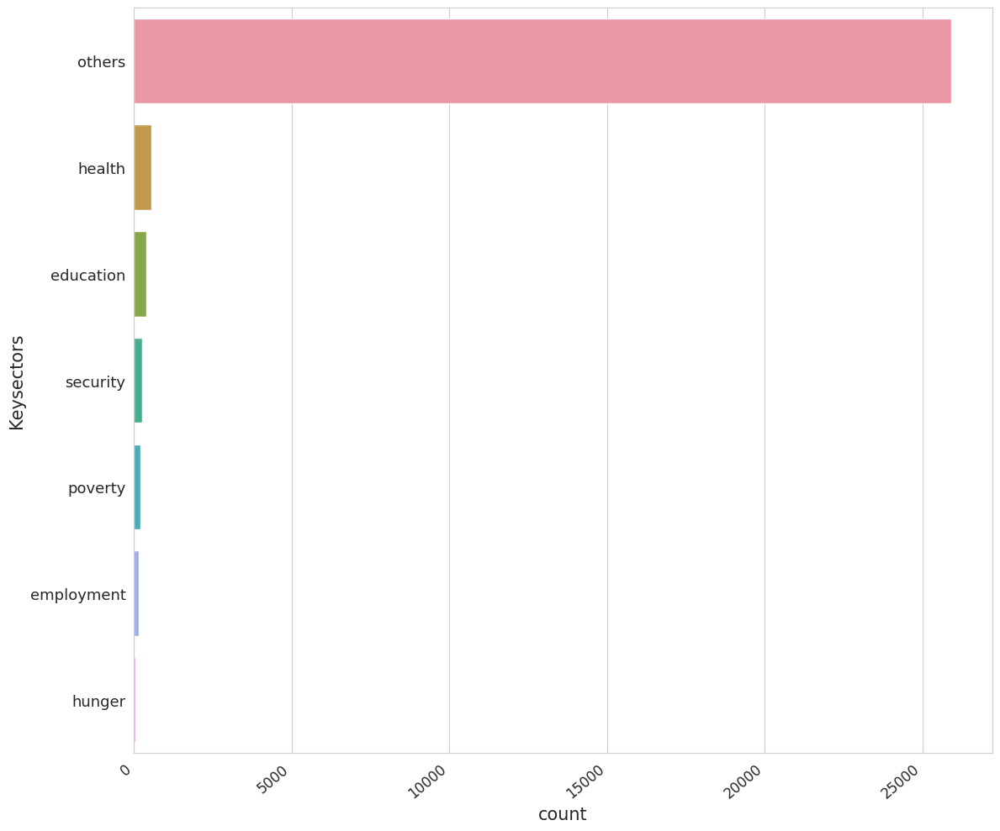

In [176]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style
sns.set_style('whitegrid')

# Plot the count of each label
plt.figure(figsize=(12, 10))
df['Keysectors'] = df['Keysector'].str.split('|', expand=True).stack().reset_index(drop=True)
ax = sns.countplot(y='Keysectors', data=df, order=df['Keysectors'].value_counts().index)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right", fontsize=12)
plt.tight_layout()
plt.show()


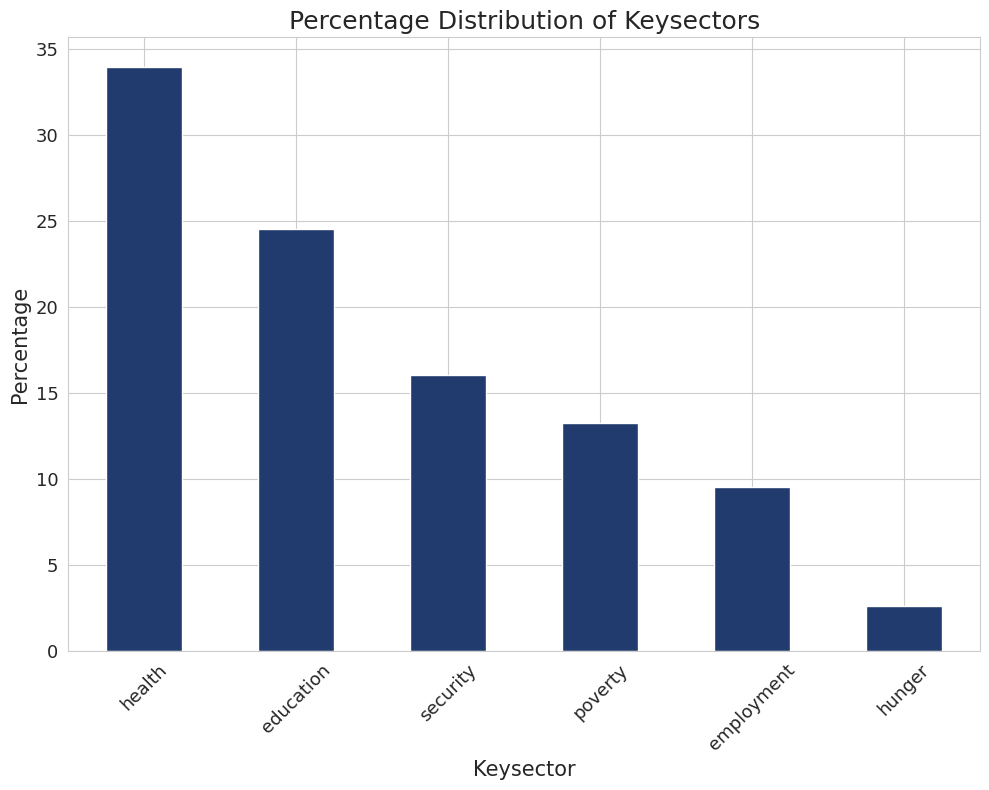

In [177]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df is your DataFrame with columns 'Text_lemma' and 'Keysector'

# Filter out 'others' from the DataFrame
df_filtered = df[df['Keysectors'] != 'others']

# Count occurrences of each label
label_counts = df_filtered['Keysectors'].str.split('|', expand=True).stack().value_counts()

# Calculate percentages
label_percentages = (label_counts / label_counts.sum()) * 100

# Plotting the bar graph
plt.figure(figsize=(10, 8))
label_percentages.plot(kind='bar')
plt.xlabel('Keysector')
plt.ylabel('Percentage')
plt.title('Percentage Distribution of Keysectors')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


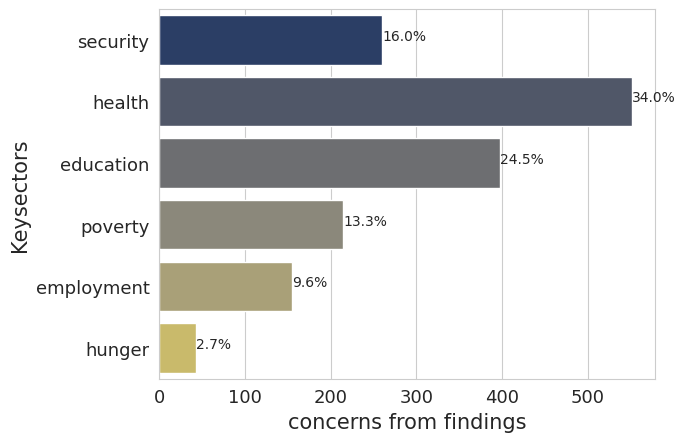

In [178]:
# Filter out 'others' from the DataFrame
df_filtered = df[df['Keysectors'] != 'others']

# Count occurrences of each label
# label_counts = df_filtered['Keysector'].str.split('|', expand=True).stack().value_counts()

# Calculate percentages
# label_percentages = (label_counts / label_counts.sum()) * 100


ax = sns.countplot(y="Keysectors", data=df_filtered)
#plt.title('Distribution of  Configurations')
plt.xlabel('concerns from findings')

total = len(df_filtered['Keysectors'])
for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_width()/total)
        x = p.get_x() + p.get_width() + 0.02
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y))

plt.show()

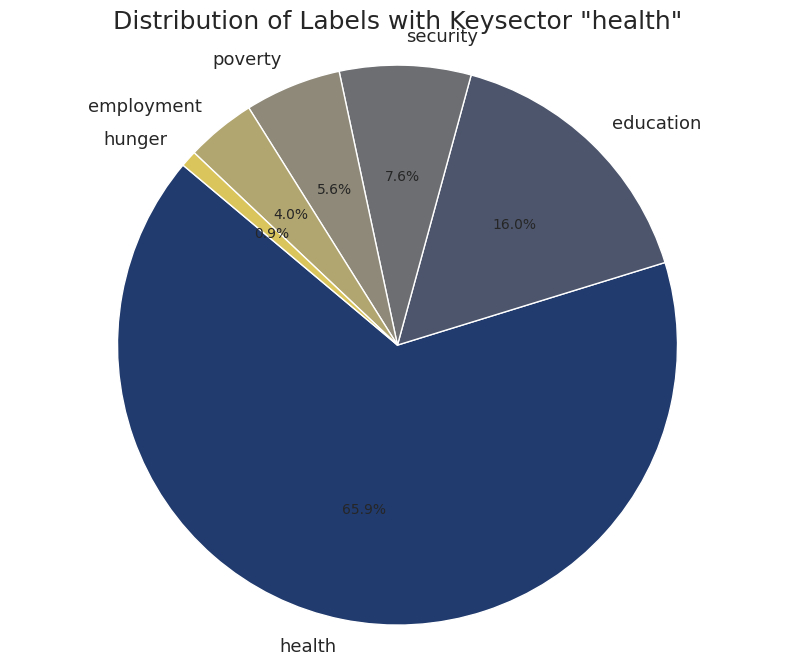

In [179]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df is your DataFrame with columns 'Text_lemma' and 'Keysector'

# Filter the DataFrame to include only rows where the Keysector contains 'health'
health_df = df[df['Keysector'].str.contains('health', case=False)]

# Split multilabel entries and count occurrences of each label
all_labels = health_df['Keysector'].str.split('|', expand=True).stack().reset_index(drop=True)
label_counts = all_labels.value_counts()

# Plotting the pie chart
plt.figure(figsize=(10, 8))
plt.pie(label_counts, labels=label_counts.index, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Distribution of Labels with Keysector "health"')
plt.show()


In [197]:
df['Predicted_Categories2'][0]

'education'

In [194]:
df

,textid,Date,Views,sourcetype,alltext,Text_emt,Text_emj,Text_langue,Text_translate,Text_langue2,Text_lower,Text_punct,Text_tags,Text_chat,Text_spell,Text_langue3,Text_translate2,Text_token,Text_stop,Text_stem,Text_lemma,llama2_labelone,cluster_labelone,llama2_labelone10,cluster_labelone10,Text_lemma2,Predicted_Categories,Predicted_Categories2,Keysector,Keysectors
0,7969,2022-10-24 07:28:48+00:00,11,twitter,This weekâ€™s 3 #WCEF2022 side events:\n\nðŸŸ¡...,This weekâ€™s 3 #WCEF2022 side events:\n\nðŸŸ¡...,This weekâ€trade_marks 3 #WCEF2022 side events...,en,This weekâ€trade_marks 3 #WCEF2022 side events...,en,this weekâ€trade_marks 3 #wcef2022 side events...,this weektrademarks side events oct today...,this weektrademarks side events oct today...,this weektrademarks side events oct todayconfu...,this weektrademarks side events oct todayconfu...,en,this weektrademarks side events oct todayconfu...,"['this', 'weektrademarks', 'side', 'events', '...",weektrademarks side events oct todayconfusion ...,weektrademark side event oct todayconfus wast ...,weektrademarks side event oct todayconfusion w...,Reactions,reactionsk__reaction__problem__reactionsm__cha...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,weektrademarks side event oct todayconfusion w...,education|security,education,others,others
1,22722,2023-08-20,529,youtube,ap 6th class social studies fa3 original pap...,ap 6th class social studies fa3 original pap...,ap 6th class social studies fa3 original pap...,en,ap 6th class social studies fa3 original pap...,en,ap 6th class social studies fa3 original pap...,ap th class social studies fa original paper l...,ap th class social studies fa original paper l...,ap th class social studies fa original paper l...,ap th class social studies fa original paper l...,en,ap th class social studies fa original paper l...,"['ap', 'th', 'class', 'social', 'studies', 'fa...",ap th class social studies fa original paper l...,ap th class social studi fa origin paper leak ...,ap th class study fa original paper leaked fa ...,Reactions,reactionsk__reaction__problem__reactionsm__cha...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,problem lecture race ethnicity jeremy baker mo...,employment|hunger|security|health,security,others,others
2,4717,2021-11-17 16:39:01+00:00,2,twitter,Blinken is actually on a social vist to B. Hus...,Blinken is actually on a social vist to B. Hus...,Blinken is actually on a social vist to B. Hus...,en,Blinken is actually on a social vist to B. Hus...,en,blinken is actually on a social vist to b. hus...,blinken is actually on a social vist to b huss...,blinken is actually on a social vist to b huss...,blinken is actually on a social vist to b huss...,blinken is actually on a social vist to b huss...,en,blinken is actually on a social vist to b huss...,"['blinken', 'is', 'actually', 'on', 'a', 'soci...",blinken actually social vist b hussein obama k...,blinken actual social vist b hussein obama ken...,blinken actually vist b hussein obama kenyan b...,Reactions,reactionsk__reaction__problem__reactionsm__cha...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,th class fa study question paper r viewsth cla...,poverty|education|health,employment,others,others
3,16088,2022-08-24,92,youtube,Social media has improved human communicatio...,Social media has improved human communicatio...,Social media has improved human communicatio...,en,Social media has improved human communicatio...,en,social media has improved human communicatio...,social media has improved human communication ...,social media has improved human communication ...,social media has improved human communication ...,social media has improved human communication ...,en,social media has improved human communication ...,"['social', 'media', 'has', 'improved', 'human'...",social media improved human communication expo...,social media improv human commun expos dictato...,medium improved human communication exposed di...,Reactions,re

In [192]:
df.to_csv('/home/hsibitenda/scratch/harriet/llms/themes_new.csv', index=False)


In [243]:
df=pd.read_csv('/home/hsibitenda/scratch/harriet/llms/themes_new.csv')#, index=False)
df=df.astype(str)

In [193]:
df.shape

(27545, 30)

In [182]:
dftopics21=df.copy()

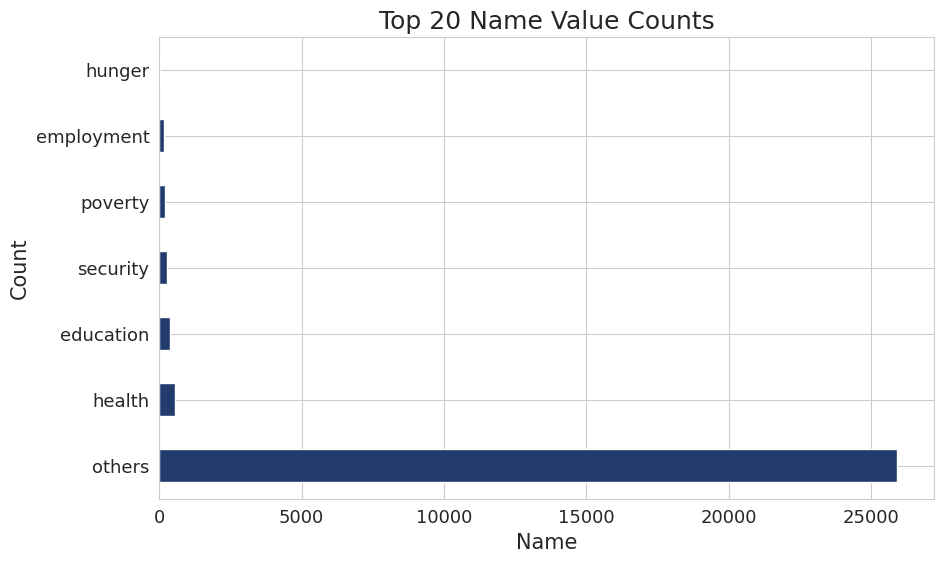

In [183]:
name_counts =  dftopics21['Keysectors'].value_counts()
# Select the top 20 name_counts
# top_name_counts = name_counts.head(20)

# Create a bar plot for the top 20 name counts
plt.figure(figsize=(10, 6))
name_counts.plot(kind='barh')
plt.title('Top 20 Name Value Counts')
plt.xlabel('Name')
plt.ylabel('Count')
plt.show()

In [186]:
# List of specific titles to filter by
specific_titles = ['hunger', 'employment','security','poverty','health','education' ]

# Filter the DataFrame based on the specific titles
newdf2 = dftopics21[dftopics21['Keysectors'].isin(specific_titles)]
newdf2.shape

(1622, 30)

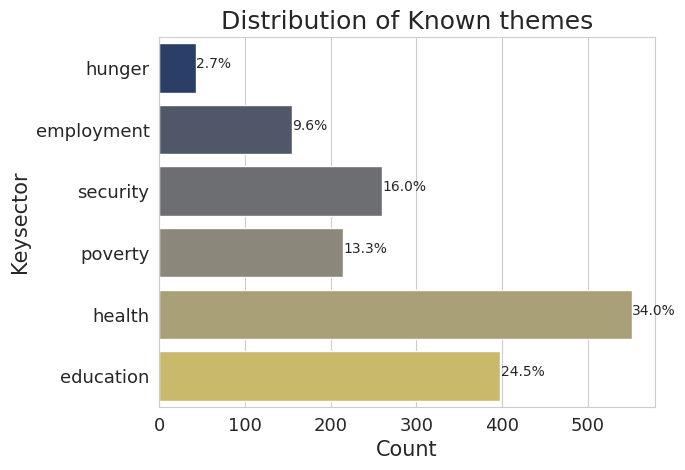

In [188]:
# Create a countplot with values in order
ax = sns.countplot(y="Keysectors", data=newdf2, order=specific_titles)

# Set title and labels
plt.xlabel('Count')
plt.ylabel('Keysector')
plt.title('Distribution of Known themes')

# Calculate total count for percentage calculation
total = len(newdf2)

# Annotate with percentage on each bar
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_width() / total)
    x = p.get_width() + 0.2
    y = p.get_y() + p.get_height() / 2
    ax.annotate(percentage, (x, y))

plt.show()


In [205]:
newdf4=newdf2.copy()

In [190]:
# # List of specific titles
# specific_titles = ['hunger', 'employment', 'security', 'poverty', 'health', 'education']

# # Filter the DataFrame based on specific titles
# filtered_df = newdf2[newdf2['Keysectors'].isin(specific_titles)]

# # Count the occurrences of each title and sector
# title_sector_counts = filtered_df.groupby(['CustomName', 'Keysectors']).size().reset_index(name='Count')

# # Get the top count values of Name_x for each Keysector
# top_counts_by_sector = title_sector_counts.groupby('Keysectors').apply(lambda x: x.nlargest(5, 'Count'))

# # Create a bar graph with each Keysector displaying the top counts of Name_x
# plt.figure(figsize=(12, 6))
# sns.barplot(data=top_counts_by_sector, x='Keysectors', y='Count', hue='CustomName', dodge=False)
# plt.title('Top Titles by Sector')
# plt.xlabel('Keysectors')
# plt.ylabel('Count')
# plt.xticks(rotation=45)
# plt.legend(title='CustomName', bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.tight_layout()
# plt.show()

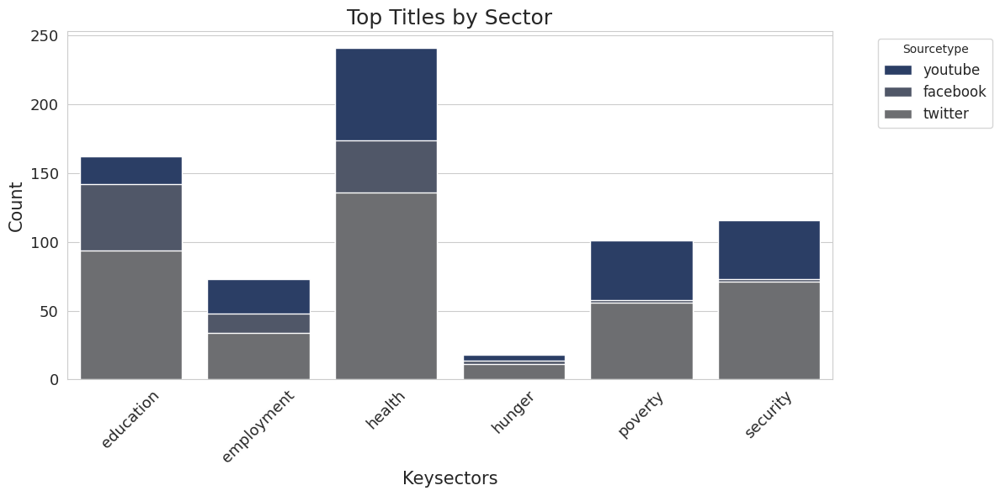

In [191]:
# List of specific titles
specific_titles = ['hunger', 'employment', 'security', 'poverty', 'health', 'education']

# Filter the DataFrame based on specific titles
filtered_df = newdf2[newdf2['Keysectors'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = filtered_df.groupby(['sourcetype', 'Keysectors']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('Keysectors').apply(lambda x: x.nlargest(5, 'Count'))

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(12, 6))
sns.barplot(data=top_counts_by_sector, x='Keysectors', y='Count', hue='sourcetype', dodge=False)
plt.title('Top Titles by Sector')
plt.xlabel('Keysectors')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Sourcetype', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

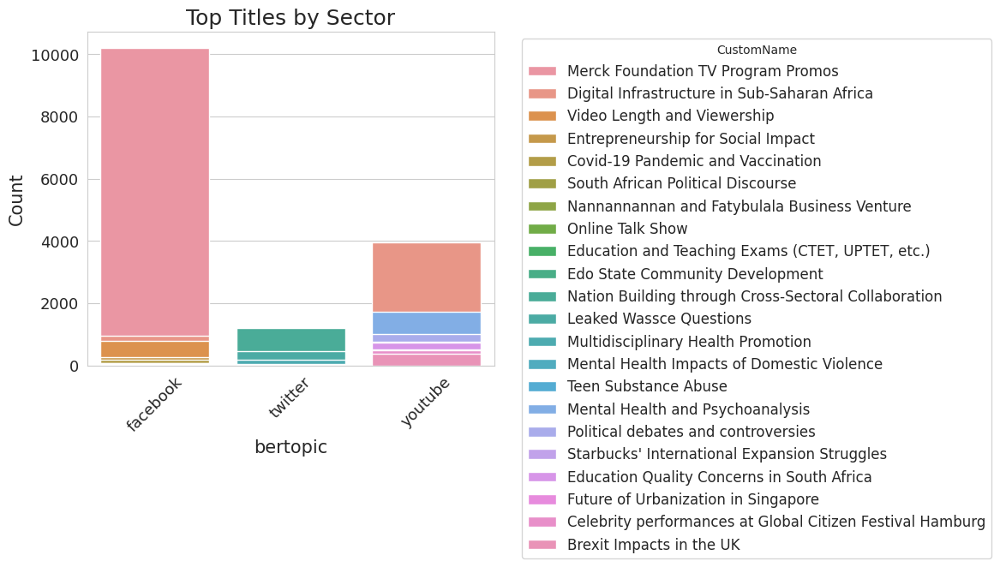

In [209]:
# List of specific titles
specific_titles = ['youtube', 'facebook','twitter']

# Filter the DataFrame based on specific titles
filtered_df = newdf2[newdf2['sourcetype'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = filtered_df.groupby(['CustomName', 'sourcetype']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(10, 'Count'))

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(12, 6))
sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='CustomName', dodge=False)
plt.title('Top Titles by Sector')
plt.xlabel('bertopic')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='CustomName', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

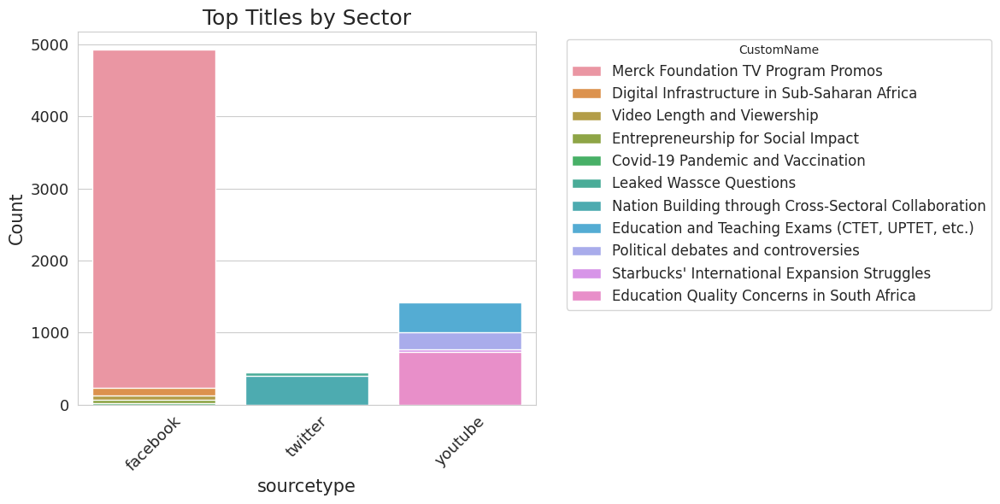

In [210]:
# List of specific titles
specific_titles = ['education']#, 'employment', 'security', 'poverty', 'health', 'education']

# Filter the DataFrame based on specific titles
filtered_df = newdf2[newdf2['Keysector'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = filtered_df.groupby(['CustomName', 'sourcetype']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(5, 'Count'))

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(12, 6))
sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='CustomName', dodge=False)
plt.title('Top Titles by Sector')
plt.xlabel('sourcetype')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='CustomName', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

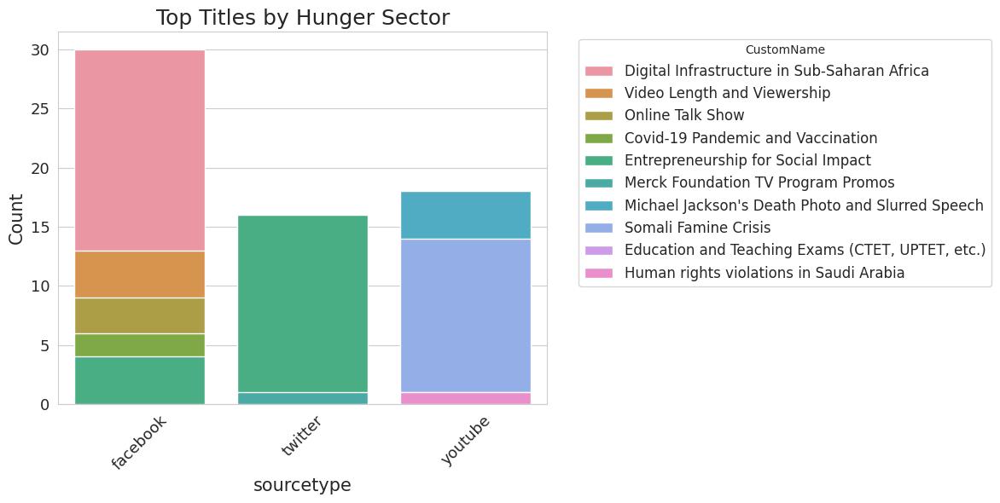

In [211]:
# List of specific titles
specific_titles = ['hunger']#, 'employment', 'security', 'poverty', 'health', 'education']

# Filter the DataFrame based on specific titles
filtered_df = newdf2[newdf2['Keysector'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = filtered_df.groupby(['CustomName', 'sourcetype']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(5, 'Count'))

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(12, 6))
sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='CustomName', dodge=False)
plt.title('Top Titles by Hunger Sector')
plt.xlabel('sourcetype')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='CustomName', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

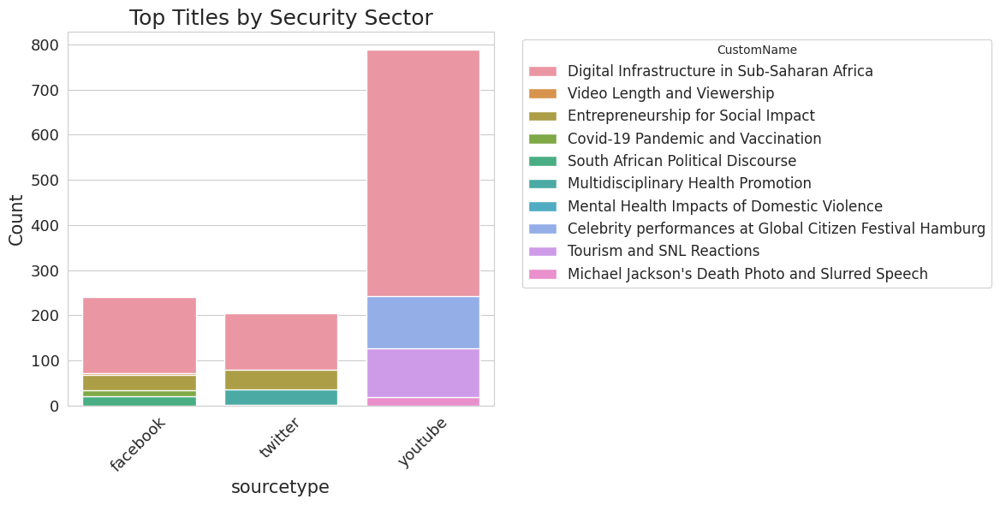

In [212]:
# List of specific titles
specific_titles = ['security']#, 'employment', 'security', 'poverty', 'health', 'education']

# Filter the DataFrame based on specific titles
filtered_df = newdf2[newdf2['Keysector'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = filtered_df.groupby(['CustomName', 'sourcetype']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(5, 'Count'))

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(12, 6))
sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='CustomName', dodge=False)
plt.title('Top Titles by Security Sector')
plt.xlabel('sourcetype')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='CustomName', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

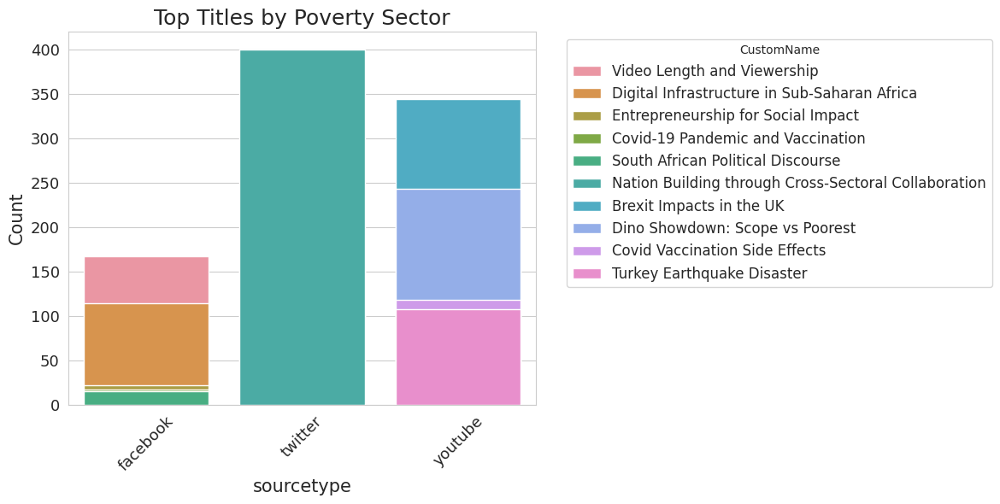

In [215]:
# List of specific titles
specific_titles = ['poverty']#, 'employment', 'security', 'poverty', 'health', 'education']

# Filter the DataFrame based on specific titles
filtered_df = newdf2[newdf2['Keysector'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = filtered_df.groupby(['CustomName', 'sourcetype']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(5, 'Count'))

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(12, 6))
sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='CustomName', dodge=False)
plt.title('Top Titles by Poverty Sector')
plt.xlabel('sourcetype')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='CustomName', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

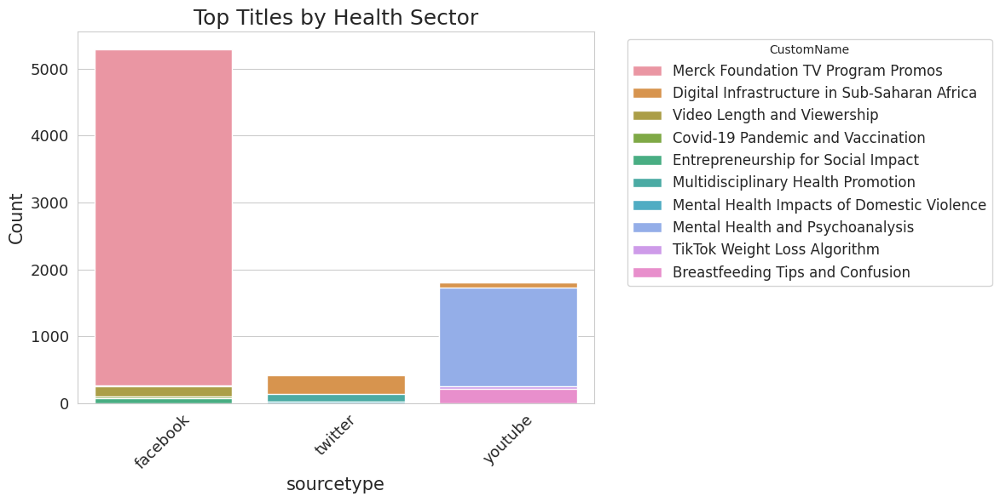

In [216]:
# List of specific titles
specific_titles = ['health']#, 'employment', 'security', 'poverty', 'health', 'education']

# Filter the DataFrame based on specific titles
filtered_df = newdf2[newdf2['Keysector'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = filtered_df.groupby(['CustomName', 'sourcetype']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(5, 'Count'))

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(12, 6))
sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='CustomName', dodge=False)
plt.title('Top Titles by Health Sector')
plt.xlabel('sourcetype')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='CustomName', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

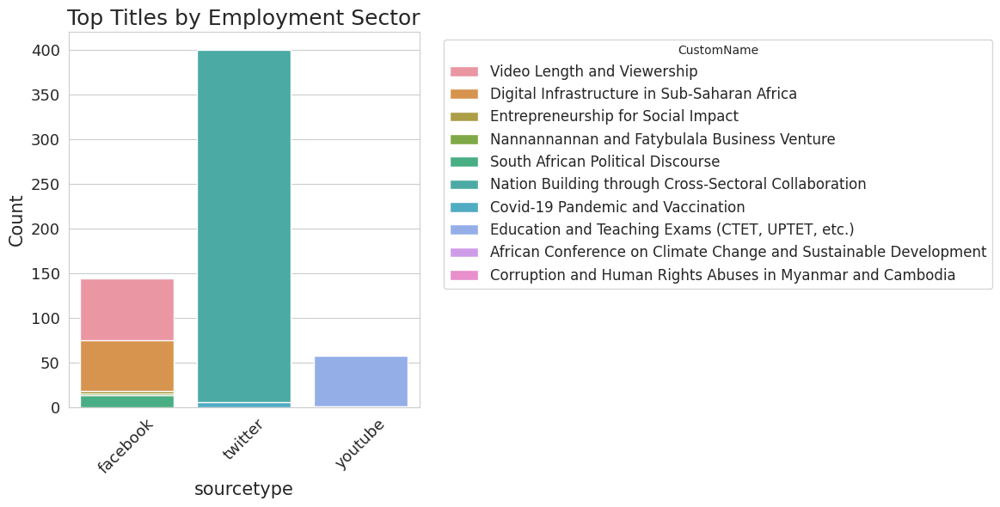

In [217]:
# List of specific titles
specific_titles = ['employment']#, 'employment', 'security', 'poverty', 'health', 'education']

# Filter the DataFrame based on specific titles
filtered_df = newdf2[newdf2['Keysector'].isin(specific_titles)]

# Count the occurrences of each title and sector
title_sector_counts = filtered_df.groupby(['CustomName', 'sourcetype']).size().reset_index(name='Count')

# Get the top count values of Name_x for each Keysector
top_counts_by_sector = title_sector_counts.groupby('sourcetype').apply(lambda x: x.nlargest(5, 'Count'))

# Create a bar graph with each Keysector displaying the top counts of Name_x
plt.figure(figsize=(12, 6))
sns.barplot(data=top_counts_by_sector, x='sourcetype', y='Count', hue='CustomName', dodge=False)
plt.title('Top Titles by Employment Sector')
plt.xlabel('sourcetype')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='CustomName', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [218]:
MAX_LEN = 200

In [219]:
import tensorflow as tf
from transformers import AutoTokenizer

MODEL_NAME = 'sentence-transformers/paraphrase-MiniLM-L6-v2'
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)

MAX_LEN = 200
encoding = tokenizer(
    text=df['Text_lemma'].tolist(),
    add_special_tokens=True,
    return_attention_mask=True,
    max_length=MAX_LEN,
    truncation=True,
    pad_to_max_length=True,
    #return_tensors='tf',
    verbose=True
)

In [220]:
TOKENS = encoding['input_ids']

In [221]:
import warnings
warnings.filterwarnings('ignore')
import umap
X_embedded = umap.UMAP(n_neighbors=15,
                            n_components=5,
                            metric='cosine').fit_transform(TOKENS)

In [222]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import auc
import urllib
from sklearn.neighbors import KNeighborsClassifier
from sklearn import neighbors
from sklearn import preprocessing
from sklearn.model_selection import train_test_split

#------------------------------------Metrics and Validation---------------------------------------------------------#
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, cohen_kappa_score
#-------------------------------------Models to be trained----------------------------------------------------------#
from sklearn.ensemble import StackingClassifier, VotingClassifier

import xgboost
# compare standalone models for binary classification
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from matplotlib import pyplot
from sklearn import preprocessing
from sklearn.model_selection import train_test_split

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis


import warnings
warnings.filterwarnings('ignore')



In [223]:
x=preprocessing.scale(X_embedded)
y= df[['Keysector']].values

In [224]:
x_train, x_test, y_train, y_test = train_test_split(x, y , test_size = 0.33, random_state= 17)

In [225]:
plt.rc('axes', titlesize=18)
plt.rc('axes', labelsize=15)
plt.rc('xtick', labelsize=13)
plt.rc('ytick', labelsize=13)
plt.rc('figure', titlesize=35)
plt.rc('legend', fontsize=12)

In [226]:
def conf_matrix(ytest,pred):
    plt.figure(figsize=(9,6))
    global cm1
    cm1 = confusion_matrix(ytest, pred)
    ax=sns.heatmap(cm1, annot= True, cmap='Blues')
    plt.title('Confusion Matrix',pad=20)

In [227]:
def metrics_score(cm):
    total=sum(sum(cm))
    accuracy=(cm[0,0]+cm[1,1])/total
    precision = cm[1,1]/(cm[0,1]+cm[1,1])
    sensitivity = cm[1,1]/(cm[1,0]+cm[1,1])
    f1 = 2 * (precision * sensitivity) / (precision + sensitivity)
    specificity = cm[0,0]/(cm[0,1]+cm[0,0])
    values=[np.round(accuracy*100,3),np.round(precision*100,3),np.round(sensitivity*100,3),np.round(f1*100,3),np.round(specificity*100,3)]
    plt.figure(figsize=(15,8))
    sns.set_palette('magma')
    ax=sns.barplot(x=['Accuracy','Precision','Recall','F1 score','Specificity'],y=values)
    plt.yticks(np.arange(0,100,10))
    plt.ylabel('Percentage %',labelpad=10)
    plt.xlabel('Scoring Parameter',labelpad=10)
    plt.title('Metrics Scores',pad=20)
    for p in ax.patches:
        ax.annotate(str(p.get_height()), (p.get_x(), p.get_height()),xytext=(p.get_x()+0.3,p.get_height()+1.02))
    plt.show()

In [228]:
def plot_roc_curve(fpr, tpr):
    plt.figure(figsize=(8,6))
    plt.plot(fpr, tpr, color='Orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='black', linestyle='--')
    plt.ylabel('True Positive Rate',labelpad=10)
    plt.xlabel('False Positive Rate',labelpad=10)
    plt.title('Receiver Operating Characteristic (ROC) Curve',pad=20)
    plt.legend()
    plt.show()

In [229]:
def plot_precision_recall_curve(recall, precision):
    plt.figure(figsize=(8,6))
    plt.plot(recall, precision, color='orange', label='PRC')
    plt.ylabel('Precision',labelpad=10)
    plt.xlabel('Recall',labelpad=10)
    plt.title('Precision Recall Curve',pad=20)
    plt.legend()
    plt.show()

In [230]:
# get the dataset
def get_dataset():
    X, y = make_classification(n_samples=1000, n_features=20, n_informative=15, n_redundant=5, random_state=1)
    return X, y


In [231]:
# get a list of models to evaluate
from sklearn.neural_network import MLPClassifier

def get_models():
    models = dict()
    models['lr'] = LogisticRegression()
    models['knn'] = KNeighborsClassifier()
    models['cart'] = DecisionTreeClassifier()
    models['svm'] = SVC()
    models['bayes'] = GaussianNB()
    models['MLP']=MLPClassifier(hidden_layer_sizes=(150,100,50), max_iter=300,activation = 'relu',solver='adam',random_state=1)

    return models

In [232]:
# evaluate a given model using cross-validation
def evaluate_model(model, X, y):
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
    return scores


In [233]:
bayes=GaussianNB()
bayes.fit(x_train, y_train)

lr=LogisticRegression()
lr.fit(x_train, y_train)

knn=KNeighborsClassifier()
knn.fit(x_train, y_train)

cart=DecisionTreeClassifier()
cart.fit(x_train, y_train)

svm=SVC()
svm.fit(x_train, y_train)

MLP=MLPClassifier(hidden_layer_sizes=(150,100,50), max_iter=300,activation = 'relu',solver='adam',random_state=1)
MLP.fit(x_train, y_train)

MLPClassifier(hidden_layer_sizes=(150, 100, 50), max_iter=300, random_state=1)

In [234]:
prediction1 = bayes.predict(x_test)
accuracy1 = bayes.score(x_test, y_test)

prediction2 = lr.predict(x_test)
accuracy2 = lr.score(x_test, y_test)

prediction3 = knn.predict(x_test)
accuracy3 = knn.score(x_test, y_test)

prediction4 = cart.predict(x_test)
accuracy4 = cart.score(x_test, y_test)

prediction5 = svm.predict(x_test)
accuracy5 = svm.score(x_test, y_test)

prediction6 = MLP.predict(x_test)
accuracy6 = MLP.score(x_test, y_test)

In [235]:
estimators = [
    ('lr', lr),
    ('knn', knn),
    ('cart', cart),
    ('svm', svm),
    ('bayes', bayes),
    ('MLP', MLP)
]

estimators

[('lr', LogisticRegression()),
 ('knn', KNeighborsClassifier()),
 ('cart', DecisionTreeClassifier()),
 ('svm', SVC()),
 ('bayes', GaussianNB()),
 ('MLP',
  MLPClassifier(hidden_layer_sizes=(150, 100, 50), max_iter=300, random_state=1))]

In [236]:
model_voting = VotingClassifier(
    estimators = estimators,
    voting='hard',
    n_jobs=-1,
    flatten_transform=True,
    verbose=1).fit(x_train, y_train)

model_voting.score(x_train, y_train)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

0.789971033762287

In [237]:
prediction7=model_voting.predict(x_test)
accuracy7 = model_voting.score(x_test, y_test)
print(classification_report(y_test, prediction7))

              precision    recall  f1-score   support

   education       0.66      0.73      0.69      4396
  employment       0.42      0.20      0.27       330
      health       0.67      0.75      0.71      4056
      hunger       0.57      0.09      0.15        47
     poverty       0.87      0.53      0.66       805
    security       0.97      0.47      0.63       739

    accuracy                           0.68     10373
   macro avg       0.69      0.46      0.52     10373
weighted avg       0.70      0.68      0.68     10373



In [238]:
print ('Model Accuracy:',accuracy7 * 100)

Model Accuracy: 68.27340210160995


In [239]:
avg_accuracies={}
accuracies={}
roc_auc={}
pr_auc={}

In [240]:
accuracies['lr'] = np.round(accuracy1 * 100,3)

accuracies['knn'] = np.round(accuracy2 * 100,3)

accuracies['cart'] = np.round(accuracy3 * 100,3)

accuracies['svm'] = np.round(accuracy4 * 100,3)

accuracies['bayes'] = np.round(accuracy5 * 100,3)

accuracies['MLP'] = np.round(accuracy6 * 100,3)

accuracies['model_voting'] = np.round(accuracy7 * 100,3)

In [241]:
xgc = xgboost.XGBClassifier()

model_stack = StackingClassifier(
    estimators=estimators,
    final_estimator=xgc,
    n_jobs = -1,
    verbose = 1
)

model_stack.fit(x_train, y_train)

model_stack.score(x_train, y_train)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.5s finished
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.5s finished
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   14.2s finished
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:  1.2min finished


0.7526473241844343

In [242]:
prediction8=model_stack.predict(x_test)
accuracy8 = model_stack.score(x_test, y_test)
print(classification_report(y_test, prediction8))

              precision    recall  f1-score   support

   education       0.71      0.77      0.74      4396
  employment       0.42      0.33      0.37       330
      health       0.69      0.69      0.69      4056
      hunger       0.11      0.02      0.04        47
     poverty       0.78      0.63      0.70       805
    security       0.74      0.63      0.68       739

    accuracy                           0.70     10373
   macro avg       0.58      0.51      0.54     10373
weighted avg       0.70      0.70      0.70     10373



In [243]:

accuracies['model_stack'] = np.round(accuracy8 * 100,3)

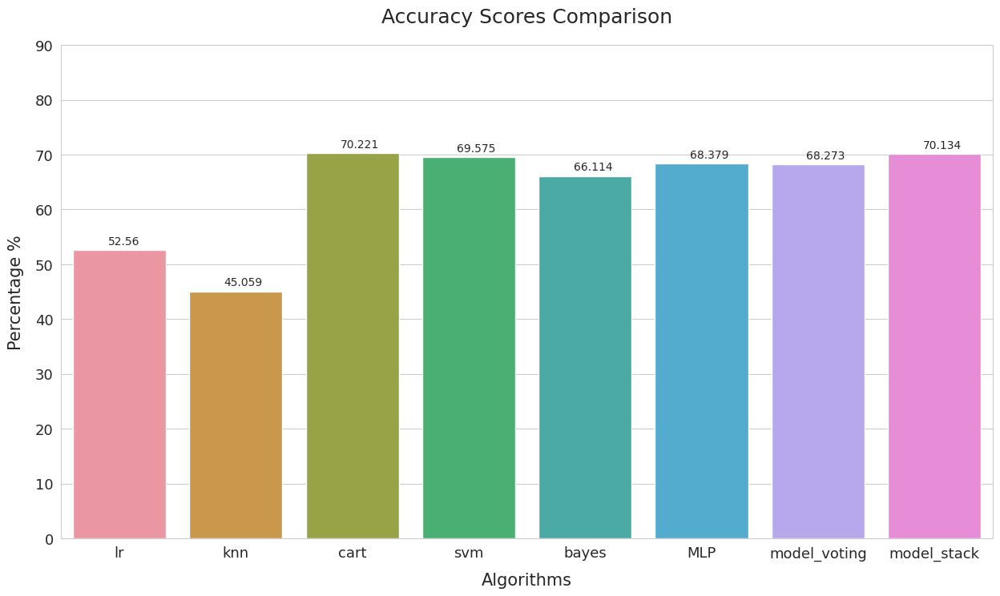

[Voting] ..................... (3 of 6) Processing cart, total=   0.2s
[Voting] ...................... (2 of 6) Processing knn, total=   0.0s
[Voting] .................... (5 of 6) Processing bayes, total=   0.0s
[Voting] ....................... (1 of 6) Processing lr, total=   0.1s
[Voting] ...................... (4 of 6) Processing svm, total=   7.9s
[Voting] ...................... (6 of 6) Processing MLP, total=  26.5s


In [244]:
plt.figure(figsize=(15,8))
sns.set_palette('cividis')
ax=sns.barplot(x=list(accuracies.keys()),y=list(accuracies.values()))
plt.yticks(np.arange(0,100,10))
plt.ylabel('Percentage %',labelpad=10)
plt.xlabel('Algorithms',labelpad=10)
plt.title('Accuracy Scores Comparison',pad=20)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x(), p.get_height()),xytext=(p.get_x()+0.3,p.get_height()+1.02))
plt.show()

In [245]:
df.shape

(31432, 48)

In [246]:
new_df = pd.read_csv('/home/hsibitenda/scratch/harriet/testdataset_with_predictionswsp_new21.csv')

In [247]:
new_df=new_df.astype(str)

In [248]:
new_df.head(2)

,Unnamed: 0.1,Unnamed: 0,textid,Date,Views,sourcetype,alltext,Text_emt,Text_emj,Text_langue,Text_translate,Text_langue2,Text_lower,Text_punct,Text_tags,Text_chat,Text_spell,Text_langue3,Text_translate2,Text_token,Text_stop,Text_stem,Text_lemma,Voting_Predictions,Stacking_Predictions,Voting_Predictions21,Stacking_Predictions21
0,14143,2002,14240,2023-08-22,451,youtube,Le Journal Afrique du vendredi 10 février 20...,Le Journal Afrique du vendredi 10 février 20...,Le Journal Afrique du vendredi 10 février 20...,en,Le Journal Afrique du vendredi 10 février 20...,en,le journal afrique du vendredi 10 février 20...,le journal afrique du vendredi fvrier sur tv...,le journal afrique du vendredi fvrier sur tv...,le journal afrique du vendredi fvrier sur tvmo...,le journal afrique du vendredi fvrier sur tvmo...,en,le journal afrique du vendredi fvrier sur tvmo...,"['le', 'journal', 'afrique', 'du', 'vendredi',...",le journal afrique du vendredi fvrier sur tvmo...,le journal afriqu du vendredi fvrier sur tvmon...,le journal afrique du vendredi fvrier sur tvmo...,reactionsm__reactionsk__reaction__problem__cha...,reactionsm__reactionsk__reaction__problem__cha...,Reactions,Reactions
1,22611,12893,22762,2014-08-24,119,youtube,Taylor Swift - Everything Has Changed ft. Ed...,Taylor Swift - Everything Has Changed ft. Ed...,Taylor Swift - Everything Has Changed ft. Ed...,en,Taylor Swift - Everything Has Changed ft. Ed...,en,taylor swift - everything has changed ft. ed...,taylor swift everything has changed ft ed she...,taylor swift everything has changed ft ed she...,taylor swift everything has changed ft ed shee...,taylor swift everything has changed ft ed shee...,en,taylor swift everything has changed ft ed shee...,"['taylor', 'swift', 'everything', 'has', 'chan...",taylor swift everything changed ft ed sheeran ...,taylor swift everyth chang ft ed sheeran taylo...,taylor swift everything changed ft ed sheeran ...,reactionsm__reactionsk__reaction__problem__cha...,reactionsm__reactionsk__reaction__problem__cha...,Reactions,Reactions


In [249]:
from sentence_transformers import SentenceTransformer

# Pre-calculate embeddings
embedding_model = SentenceTransformer("BAAI/bge-small-en")
# embeddings = embedding_model.encode(df['Text_lemma'], show_progress_bar=True)
embeddings = embedding_model.encode(new_df['Text_lemma'], show_progress_bar=True)

2024-03-07 21:58:14 sentence_transformers.SentenceTransformer INFO: Load pretrained SentenceTransformer: BAAI/bge-small-en
2024-03-07 21:58:15 sentence_transformers.SentenceTransformer INFO: Use pytorch device_name: cuda


Batches:   0%|          | 0/173 [00:00<?, ?it/s]

In [250]:
# matrix = matrix
import warnings
warnings.filterwarnings('ignore')
import umap
# X_embedded = umap.UMAP(n_neighbors=15,
#                             n_components=5,
#                             metric='cosine').fit_transform(embeddings)
X_embedded2 = umap.UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine', random_state=42).fit_transform(embeddings)


In [251]:

# Scale the features of the new dataset
x_new = preprocessing.scale(X_embedded2)

# Split the new dataset into training and testing sets (assuming you don't have labels in the new dataset)
x_train_new, x_test_new = train_test_split(x_new, test_size=0.33, random_state=17)


In [252]:
X_embedded2.shape

(5509, 5)

In [253]:
# Load the trained models
# model_voting = joblib.load('voting_classifier_modeltheme.pkl')
# model_stack = joblib.load('stack_classifier_modeltheme.pkl')

# Make predictions using each model
predictions_voting = model_voting.predict(x_new)
predictions_stack = model_stack.predict(x_new)

# Add the predictions as new columns to the dataset
new_df['Voting_Predictions_themes2'] = predictions_voting
new_df['Stacking_Predictions_themes2'] = predictions_stack

# Optionally, you can save the updated dataset with predictions
new_df.to_csv('/home/hsibitenda/scratch/harriet/llms/testdataset_with_predictionstheme2.csv', index=False)

In [254]:
# Use the trained models to predict labels for the new dataset
# Assuming 'x_train_new' is the new dataset features
new_df.head(10)

,Unnamed: 0.1,Unnamed: 0,textid,Date,Views,sourcetype,alltext,Text_emt,Text_emj,Text_langue,Text_translate,Text_langue2,Text_lower,Text_punct,Text_tags,Text_chat,Text_spell,Text_langue3,Text_translate2,Text_token,Text_stop,Text_stem,Text_lemma,Voting_Predictions,Stacking_Predictions,Voting_Predictions21,Stacking_Predictions21,Voting_Predictions_themes2,Stacking_Predictions_themes2
0,14143,2002,14240,2023-08-22,451,youtube,Le Journal Afrique du vendredi 10 février 20...,Le Journal Afrique du vendredi 10 février 20...,Le Journal Afrique du vendredi 10 février 20...,en,Le Journal Afrique du vendredi 10 février 20...,en,le journal afrique du vendredi 10 février 20...,le journal afrique du vendredi fvrier sur tv...,le journal afrique du vendredi fvrier sur tv...,le journal afrique du vendredi fvrier sur tvmo...,le journal afrique du vendredi fvrier sur tvmo...,en,le journal afrique du vendredi fvrier sur tvmo...,"['le', 'journal', 'afrique', 'du', 'vendredi',...",le journal afrique du vendredi fvrier sur tvmo...,le journal afriqu du vendredi fvrier sur tvmon...,le journal afrique du vendredi fvrier sur tvmo...,reactionsm__reactionsk__reaction__problem__cha...,reactionsm__reactionsk__reaction__problem__cha...,Reactions,Reactions,education,education
1,22611,12893,22762,2014-08-24,119,youtube,Taylor Swift - Everything Has Changed ft. Ed...,Taylor Swift - Everything Has Changed ft. Ed...,Taylor Swift - Everything Has Changed ft. Ed...,en,Taylor Swift - Everything Has Changed ft. Ed...,en,taylor swift - everything has changed ft. ed...,taylor swift everything has changed ft ed she...,taylor swift everything has changed ft ed she...,taylor swift everything has changed ft ed shee...,taylor swift everything has changed ft ed shee...,en,taylor swift everything has changed ft ed shee...,"['taylor', 'swift', 'everything', 'has', 'chan...",taylor swift everything changed ft ed sheeran ...,taylor swift everyth chang ft ed sheeran taylo...,taylor swift everything changed ft ed sheeran ...,reactionsm__reactionsk__reaction__problem__cha...,reactionsm__reactionsk__reaction__problem__cha...,Reactions,Reactions,education,health
2,3843,3925,3864,2020-05-12 14:51:46+00:00,4,twitter,Mr Bulelani Kuwane is truly an inspiring and i...,Mr Bulelani Kuwane is truly an inspiring and i...,Mr Bulelani Kuwane is truly an inspiring and i...,en,Mr Bulelani Kuwane is truly an inspiring and i...,en,mr bulelani kuwane is truly an inspiring and i...,mr bulelani kuwane is truly an inspiring and i...,mr bulelani kuwane is truly an inspiring and i...,mr bulelani kuwane is truly an inspiring and i...,mr bulelani kuwane is truly an inspiring and i...,en,mr bulelani kuwane is truly an inspiring and i...,"['mr', 'bulelani', 'kuwane', 'is', 'truly', 'a...",mr bulelani kuwane truly inspiring intentional...,mr bulelani kuwan truli inspir intent leader b...,mr bulelani kuwane truly inspiring intentional...,reactionsm__reactionsk__reaction__problem__cha...,reactionsm__reactionsk__reaction__problem__cha...,Reactions,Reactions,security,security
3,2907,2969,2921,2020-05-25 21:12:19+00:00,2,twitter,@jatella Said way better than I could. What re...,@jatella Said way better than I could. What re...,@jatella Said way better than I could. What re...,en,@jatella Said way better than I could. What re...,en,@jatella said way better than i could. what re...,said way better than i could what remains a pr...,said way better than i could what remains a pr...,said way better than i could what remains a pr...,said way better than i could what remains a pr...,en,said way better than i could what remains a pr...,"['said', 'way', 'better', 'than', 'i', 'could'...",said way better could remains problem social l...,said way better could remain problem social li...,said way better could remains problem social l...,reactionsm__reactionsk__reaction__problem__cha...,reactionsm__reactionsk__reaction__problem__cha...,Reactions,Reactions,health,security
4,21540,11462,21684,2023-02-24,150,youtube,Gravitas | Or

In [291]:
df2=df.copy()

In [293]:
df2=df.head(50)
df2.shape

(50, 31)

In [294]:
df=df2.copy()

In [301]:
import pandas as pd
from transformers import AutoTokenizer, AutoModelForSequenceClassification
import torch

# Load the llama2 model and tokenizer for classification
model_name = "meta-llama/Llama-2-7b-chat-hf"
tokenizer = AutoTokenizer.from_pretrained(model_name)
tokenizer.add_special_tokens({'pad_token': '[PAD]'})  # Add a padding token

# Define the number of labels
num_labels = 6  # Replace with the actual number of labels in your classification task

# Load the model with the specified number of labels
model = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=num_labels)

# Define categories
categories = ["employment", "poverty", "hunger", "education", "security", "health"]

# Define prompt message with all categories
prompt_message = f"You are an expert at social analysis classification that impacts sustainable development. \nYour job is to correctly label the provided input example into one or more of the following {num_labels} categories:\n" + ', '.join(categories)

# Function to classify documents into categories
def classify_documents(docs):
    predicted_categories = []
    logits_output = []
    
    # Move model to CPU
    device = f'cuda:{torch.cuda.current_device()}' if torch.cuda.is_available() else 'cpu'
    model.to(device)
    model.eval()
    
    # Generate prompt with the document and category message
    for doc in docs:
        prompt = f"{prompt_message} Document: {doc}"
        
        # Tokenize the prompt with maximum length of 128
        inputs = tokenizer(prompt, return_tensors="pt", padding=True, truncation=True, max_length=128)
        
        # Forward pass through the model
        with torch.no_grad():
            outputs = model(**inputs.to(device))
        
        # Get predicted labels
        predicted_labels = [categories[i] for i in range(num_labels) if outputs.logits[0][i] > 0] 
        
        if not predicted_labels:
            predicted_labels = ["others"]
        
        predicted_categories.append("|".join(predicted_labels))  # Join predicted labels into a single string
        logits_output.append(outputs.logits[0].tolist())  # Append logits to the logits_output
    
    return predicted_categories, logits_output

# Assuming you have a DataFrame df with columns 'Text_lemma'
# df = pd.DataFrame({'Text_lemma': ['Your input texts here', 'Another input text here']})

# Classify documents into categories
predicted_categories, logits_output = classify_documents(df['Text_lemma'])

# Add Predicted_Categories and Logits_Output columns to the DataFrame
df['Predicted_Categories'] = predicted_categories
df['Logits_Output'] = logits_output

# Display the DataFrame
print(df)


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Some weights of LlamaForSequenceClassification were not initialized from the model checkpoint at meta-llama/Llama-2-7b-chat-hf and are newly initialized: ['score.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


   textid                       Date Views sourcetype  \
0    7969  2022-10-24 07:28:48+00:00    11    twitter   
1   22722                 2023-08-20   529    youtube   
2    4717  2021-11-17 16:39:01+00:00     2    twitter   
3   16088                 2022-08-24    92    youtube   
4    1904  2019-12-09 02:29:47+00:00     1    twitter   
5   24985                 2023-03-24   571    youtube   
6    2893  2020-06-02 00:04:34+00:00     5    twitter   
7    5702  2021-12-09 15:00:02+00:00     3    twitter   
8   21584                 2023-08-20   674    youtube   
9   24791                 2018-08-24   231    youtube   
10  18714                 2022-12-24   365    youtube   
11  21732                 2022-08-24    92    youtube   
12   5447  2021-04-05 01:05:32+00:00     0    twitter   
13    618  2019-07-25 21:29:56+00:00     2    twitter   
14  13554                 2018-08-24   255    youtube   
15  17880                 2015-08-24   609    youtube   
16  14784                 2023-

In [302]:
# outputs
# logits
df

,textid,Date,Views,sourcetype,alltext,Text_emt,Text_emj,Text_langue,Text_translate,Text_langue2,Text_lower,Text_punct,Text_tags,Text_chat,Text_spell,Text_langue3,Text_translate2,Text_token,Text_stop,Text_stem,Text_lemma,llama2_labelone,cluster_labelone,llama2_labelone10,cluster_labelone10,Text_lemma2,Predicted_Categories,Predicted_Categories2,Keysector,Keysectors,Keysector_bert,Logits_Output
0,7969,2022-10-24 07:28:48+00:00,11,twitter,This weekâ€™s 3 #WCEF2022 side events:\n\nðŸŸ¡...,This weekâ€™s 3 #WCEF2022 side events:\n\nðŸŸ¡...,This weekâ€trade_marks 3 #WCEF2022 side events...,en,This weekâ€trade_marks 3 #WCEF2022 side events...,en,this weekâ€trade_marks 3 #wcef2022 side events...,this weektrademarks side events oct today...,this weektrademarks side events oct today...,this weektrademarks side events oct todayconfu...,this weektrademarks side events oct todayconfu...,en,this weektrademarks side events oct todayconfu...,"['this', 'weektrademarks', 'side', 'events', '...",weektrademarks side events oct todayconfusion ...,weektrademark side event oct todayconfus wast ...,weektrademarks side event oct todayconfusion w...,Reactions,reactionsk__reaction__problem__reactionsm__cha...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,weektrademarks side event oct todayconfusion w...,employment|poverty|education,education,others,others,others,"[1.6710131168365479, 0.6007878184318542, -1.62..."
1,22722,2023-08-20,529,youtube,ap 6th class social studies fa3 original pap...,ap 6th class social studies fa3 original pap...,ap 6th class social studies fa3 original pap...,en,ap 6th class social studies fa3 original pap...,en,ap 6th class social studies fa3 original pap...,ap th class social studies fa original paper l...,ap th class social studies fa original paper l...,ap th class social studies fa original paper l...,ap th class social studies fa original paper l...,en,ap th class social studies fa original paper l...,"['ap', 'th', 'class', 'social', 'studies', 'fa...",ap th class social studies fa original paper l...,ap th class social studi fa origin paper leak ...,ap th class study fa original paper leaked fa ...,Reactions,reactionsk__reaction__problem__reactionsm__cha...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,problem lecture race ethnicity jeremy baker mo...,employment|poverty|education|security,security,others,others,others,"[2.7312052249908447, 1.5571810007095337, -0.15..."
2,4717,2021-11-17 16:39:01+00:00,2,twitter,Blinken is actually on a social vist to B. Hus...,Blinken is actually on a social vist to B. Hus...,Blinken is actually on a social vist to B. Hus...,en,Blinken is actually on a social vist to B. Hus...,en,blinken is actually on a social vist to b. hus...,blinken is actually on a social vist to b huss...,blinken is actually on a social vist to b huss...,blinken is actually on a social vist to b huss...,blinken is actually on a social vist to b huss...,en,blinken is actually on a social vist to b huss...,"['blinken', 'is', 'actually', 'on', 'a', 'soci...",blinken actually social vist b hussein obama k...,blinken actual social vist b hussein obama ken...,blinken actually vist b hussein obama kenyan b...,Reactions,reactionsk__reaction__problem__reactionsm__cha...,Reactions,reactionsk__reactionsm__reaction__problem__cha...,th class fa study question paper r viewsth cla...,employment|education|security,employment,others,others,others,"[1.3976751565933228, -0.5157148838043213, -0.5..."
3,16088,2022-08-24,92,youtube,Social media has improved human communicatio...,Social media has improved human communicatio...,Social media has improved human communicatio...,en,Social media has improved human communicatio...,en,social media has improved human communicatio...,social media has improved human communication ...,social media has improved human communication ...,social media has improved human communication ...,social media has improved human communication ...,en,social media has improved human communi

In [303]:
# predicted_labels
df['Logits_Output'][0]

[1.6710131168365479,
 0.6007878184318542,
 -1.6273977756500244,
 0.1261948198080063,
 -0.22178615629673004,
 -1.6374568939208984]